#### Table of contents

1. [Step 1: Download the data and prepare it for analysis](#introduction)
    - [Step 1: Conclusion](#subsection-1a)   
2. [Step 2: Make reports and calculate metrics](#paragraph1)
    - [Step 2.1 Product](#subsection-2a)
    - [Step 2.2 Sales](#subsection-2b)
    - [Step 2.3 Marketing](#subsection-2c)
3. [Step 3: General conclusion](#conclusion)
    - [Step 3.1: Appendix](#sources) 



_**We are doing an internship in the analytical department at Yandex.Afisha. Our first task is to help optimize marketing expenses.**_

## Step 1. Download the data and prepare it for analysis
<a class="anchor" id="introduction"></a>

_Store the data on visits, orders, and expenses in variables. Optimize the data for analysis. Make sure each column contains the correct data type._

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from datetime import datetime

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
visits = pd.read_csv('/datasets/visits_log_us.csv', nrows=500)

In [4]:
visits

,Device,End Ts,Source Id,Start Ts,Uid
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168
...,...,...,...,...,...
495,desktop,2017-10-16 17:04:00,4,2017-10-16 17:02:00,8240539998721585144
496,touch,2018-01-08 01:54:00,3,2018-01-08 01:35:00,16475496745185667094
497,desktop,2018-01-02 11:26:00,5,2018-01-02 11:26:00,6238707938448896329
498,desktop,2017-10-12 15:33:00,1,2017-10-12 14:41:00,13153933924358373075


In [5]:
visits.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 5 columns):
Device       500 non-null object
End Ts       500 non-null object
Source Id    500 non-null int64
Start Ts     500 non-null object
Uid          500 non-null uint64
dtypes: int64(1), object(3), uint64(1)
memory usage: 113.1 KB


Here we are just looking, what data we have. Now we can optimize the import a bit. 

In [6]:
vi = pd.read_csv('/datasets/visits_log_us.csv', 
                  nrows=500, 
                  dtype={'Device': 'category'},
                  parse_dates=['Start Ts', 'End Ts']) 

In [7]:
vi.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 5 columns):
Device       500 non-null category
End Ts       500 non-null datetime64[ns]
Source Id    500 non-null int64
Start Ts     500 non-null datetime64[ns]
Uid          500 non-null uint64
dtypes: category(1), datetime64[ns](2), int64(1), uint64(1)
memory usage: 16.4 KB


The reducing 113.1 KB -> 16.4 KB is quite impressive, huh? 
We'll skip this comparison in the next two cases. 

In [8]:
orders = pd.read_csv('/datasets/orders_log_us.csv', nrows=500) 

In [9]:
orders

,Buy Ts,Revenue,Uid
0,2017-06-01 00:10:00,17.00,10329302124590727494
1,2017-06-01 00:25:00,0.55,11627257723692907447
2,2017-06-01 00:27:00,0.37,17903680561304213844
3,2017-06-01 00:29:00,0.55,16109239769442553005
4,2017-06-01 07:58:00,0.37,14200605875248379450
...,...,...,...
495,2017-06-05 23:18:00,2.32,15660576678180554628
496,2017-06-05 23:22:00,0.30,14150411061758308531
497,2017-06-05 23:23:00,2.32,3138077888954665232
498,2017-06-05 23:24:00,0.73,2966971318236542666


In [10]:
orders.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 3 columns):
Buy Ts     500 non-null object
Revenue    500 non-null float64
Uid        500 non-null uint64
dtypes: float64(1), object(1), uint64(1)
memory usage: 45.0 KB


In [11]:
costs = pd.read_csv('/datasets/costs_us.csv', nrows=500) 

In [12]:
costs

,source_id,dt,costs
0,1,2017-06-01,75.20
1,1,2017-06-02,62.25
2,1,2017-06-03,36.53
3,1,2017-06-04,55.00
4,1,2017-06-05,57.08
...,...,...,...
495,2,2017-10-11,162.05
496,2,2017-10-12,197.27
497,2,2017-10-13,213.09
498,2,2017-10-14,131.73


In [13]:
costs.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 3 columns):
source_id    500 non-null int64
dt           500 non-null object
costs        500 non-null float64
dtypes: float64(1), int64(1), object(1)
memory usage: 40.7 KB


Now we can perform the import of the complete datasets. 

In [14]:
vis = pd.read_csv('/datasets/visits_log_us.csv',
                  dtype={'Device': 'category'},
                  parse_dates=['Start Ts', 'End Ts']) 

In [15]:
ord = pd.read_csv('/datasets/orders_log_us.csv',
                  parse_dates=['Buy Ts']) 

In [16]:
cos = pd.read_csv('/datasets/costs_us.csv',
                  dtype={'Device': 'category'},
                  parse_dates=['dt']) 

In [17]:
vis.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
Device       359400 non-null category
End Ts       359400 non-null datetime64[ns]
Source Id    359400 non-null int64
Start Ts     359400 non-null datetime64[ns]
Uid          359400 non-null uint64
dtypes: category(1), datetime64[ns](2), int64(1), uint64(1)
memory usage: 11.3 MB


In [18]:
ord.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
Buy Ts     50415 non-null datetime64[ns]
Revenue    50415 non-null float64
Uid        50415 non-null uint64
dtypes: datetime64[ns](1), float64(1), uint64(1)
memory usage: 1.2 MB


In [19]:
cos.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 3 columns):
source_id    2542 non-null int64
dt           2542 non-null datetime64[ns]
costs        2542 non-null float64
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 59.7 KB


Cool, thank the memory usage figures of all three datasets(11.3 MB->1.2 MB->59.7 KB) we can already see the rough outlines of the sales funnel.  It seems, that we have no missing values. 

In [20]:
vis.head()

,Device,End Ts,Source Id,Start Ts,Uid
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168


In [21]:
vis['Source Id'].max()

10

In [22]:
ord.head()

,Buy Ts,Revenue,Uid
0,2017-06-01 00:10:00,17.00,10329302124590727494
1,2017-06-01 00:25:00,0.55,11627257723692907447
2,2017-06-01 00:27:00,0.37,17903680561304213844
3,2017-06-01 00:29:00,0.55,16109239769442553005
4,2017-06-01 07:58:00,0.37,14200605875248379450


In [23]:
ord['Revenue'].max()

2633.28

In [24]:
cos.head()

,source_id,dt,costs
0,1,2017-06-01,75.20
1,1,2017-06-02,62.25
2,1,2017-06-03,36.53
3,1,2017-06-04,55.00
4,1,2017-06-05,57.08


In [25]:
cos['source_id'].max()

10

In [26]:
cos['costs'].max()

1788.28

As we can see in the output, we can optimize the memory usage a bit more. Let's do it! 

In [27]:
vis['Source Id']=vis['Source Id'].astype('int8')

In [28]:
cos['source_id']=cos['source_id'].astype('int8')

In [29]:
ord['Revenue']=ord['Revenue']*100
ord['Revenue']=ord['Revenue'].astype('int32')

In [30]:
cos['costs']=cos['costs']*100

cos['costs']=cos['costs'].astype('int32')

In [31]:
vis.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359400 entries, 0 to 359399
Data columns (total 5 columns):
Device       359400 non-null category
End Ts       359400 non-null datetime64[ns]
Source Id    359400 non-null int8
Start Ts     359400 non-null datetime64[ns]
Uid          359400 non-null uint64
dtypes: category(1), datetime64[ns](2), int8(1), uint64(1)
memory usage: 8.9 MB


In [32]:
ord.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50415 entries, 0 to 50414
Data columns (total 3 columns):
Buy Ts     50415 non-null datetime64[ns]
Revenue    50415 non-null int32
Uid        50415 non-null uint64
dtypes: datetime64[ns](1), int32(1), uint64(1)
memory usage: 984.8 KB


In [33]:
cos.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 3 columns):
source_id    2542 non-null int8
dt           2542 non-null datetime64[ns]
costs        2542 non-null int32
dtypes: datetime64[ns](1), int32(1), int8(1)
memory usage: 32.4 KB


We additionally reduced the memory usage by 22%,18%,46% respectively by converting costs/revenue data to cents instead of dollars(?) and converting the all of the data to optimal datatypes.

Last but not least: let's rename the columns to make it a) homogeneous and b) in accord with Python Code style guide.

In [34]:
vis.columns.tolist()

['Device', 'End Ts', 'Source Id', 'Start Ts', 'Uid']

In [35]:
ord.columns.tolist()

['Buy Ts', 'Revenue', 'Uid']

In [36]:
cos.columns.tolist()

['source_id', 'dt', 'costs']

In [37]:
vis.columns = ['device', 'end_ts', 'source_id', 'start_ts', 'uid']

In [38]:
ord.columns = ['buy_ts', 'revenue', 'uid']

And we are going to convert all dates to europian format dd.mm.yyyy: 

In [39]:
vis.start_ts=pd.to_datetime(vis.start_ts, dayfirst =True)

In [40]:
ord['buy_ts']=pd.to_datetime(ord['buy_ts'], dayfirst =True)
ord['start_ts']=pd.to_datetime(ord['buy_ts'], dayfirst =True)

In [41]:
len(set(vis['uid'].unique())-set(ord['uid'].unique()))

191646

In [42]:
vis.duplicated().sum()

0

In [43]:
ord.duplicated().sum()

0

In [44]:
cos.duplicated().sum()

0

Now we want to check how the visits data  distributed by sources and if the minimum and maximum dates in the datasets and the time interval specified in our task are the same, or maybe some of the sessions go beyond its boundaries?

In [45]:
vis.sample(10)

,device,end_ts,source_id,start_ts,uid
350699,desktop,2018-01-25 19:47:00,3,2018-01-25 19:45:00,18012377779887052168
76899,desktop,2018-03-03 10:05:00,4,2018-03-03 09:47:00,13350177887396102395
129838,touch,2017-12-18 22:26:00,4,2017-12-18 22:24:00,8099860124736888764
184964,touch,2018-03-25 18:01:00,9,2018-03-25 17:45:00,7171526256068291402
302174,desktop,2017-11-24 16:14:00,3,2017-11-24 16:13:00,13307535011493943991
126009,desktop,2018-04-22 19:17:00,2,2018-04-22 19:10:00,8134194003194637116
47263,touch,2017-10-08 18:04:00,4,2017-10-08 18:04:00,10766321422274149366
245964,touch,2018-01-05 08:51:00,5,2018-01-05 08:49:00,1497075672920336335
322655,desktop,2017-08-09 17:36:00,5,2017-08-09 17:32:00,11371132437525301762
284745,touch,2017-09-14 18:11:00,5,2017-09-14 17:31:00,14621148026139854337


In [46]:
ord.sample(10)

,buy_ts,revenue,uid,start_ts
7829,2017-09-15 08:17:00,244,1887458973400503579,2017-09-15 08:17:00
38047,2018-03-03 22:48:00,458,11680134076350639845,2018-03-03 22:48:00
14694,2017-10-26 13:40:00,1832,17174887128923798604,2017-10-26 13:40:00
21967,2017-12-05 01:06:00,9,2932564393002150801,2017-12-05 01:06:00
45781,2018-04-27 21:06:00,183,3385834756732875262,2018-04-27 21:06:00
5143,2017-08-10 13:29:00,1283,10700047543688806219,2017-08-10 13:29:00
27022,2017-12-29 18:22:00,428,1547546354423402259,2017-12-29 18:22:00
7840,2017-09-15 09:58:00,37,2785053241300411695,2017-09-15 09:58:00
31697,2018-01-29 19:01:00,171,10434148194765681426,2018-01-29 19:01:00
45571,2018-04-26 11:39:00,244,15092042091248513089,2018-04-26 11:39:00


In [47]:
cos.sample(10)

,source_id,dt,costs
2265,10,2017-08-26,747
1384,4,2018-03-23,5834
362,1,2018-05-31,14169
1164,4,2017-08-15,21060
11,1,2017-06-12,2748
767,3,2017-07-12,35582
1797,5,2018-05-13,8586
897,3,2017-11-19,26985
199,1,2017-12-17,5959
303,1,2018-04-02,1567


In [48]:
vis.groupby('source_id').nunique()

,device,end_ts,source_id,start_ts,uid
source_id,,,,,
1,2,32092,1,32200,18999
2,2,43970,1,44021,26245
3,2,75302,1,75337,74756
4,2,87451,1,87425,83525
5,2,60960,1,60811,56974
6,2,6,1,6,6
7,2,36,1,36,34
9,2,12009,1,11963,9264
10,2,9822,1,9810,8067


<div class="alert alert-info" role="alert">
If we concider the figures in 'start_ts' column, we'll find the sources 4, 3 and 5 generates more visits. The sources 6 and 7 generate very few visits. 
</div>

In [49]:
vis.start_ts.min()

Timestamp('2017-06-01 00:01:00')

In [50]:
vis.start_ts.max()

Timestamp('2018-05-31 23:59:00')

In [51]:
ord.start_ts.min()

Timestamp('2017-06-01 00:10:00')

In [52]:
vis.start_ts.max()

Timestamp('2018-05-31 23:59:00')

In [53]:
cos.dt.min()

Timestamp('2017-06-01 00:00:00')

In [54]:
cos.dt.max()

Timestamp('2018-05-31 00:00:00')

<div class="alert alert-info" role="alert">
At least all the data seems to be in the same time interval 2017-06-01 00:01:00 - 2018-05-31 23:59:00. 
</div>

### Step 1. Conclusion
<a class="anchor" id="subsection-1a"></a>

During this step we prepared the data for analysis: we imported the datasets optimizing the datatypes as far as it was possible during the import and after it. We also checked the data we checked the data sets for duplicates and missing values. 

## Step 2. Make reports and calculate metrics
<a class="anchor" id="paragraph1"></a>

### Product
<a class="anchor" id="subsection-2a"></a>

_- How many people use it every day, week, and month?_ 

We know a three main metrics that describe the number of active users: DAU, WAU and MAU. Let's calculate all of them. 

In [55]:
vis['session_year']  = vis['start_ts'].dt.year
vis['session_month'] = vis['start_ts'].dt.month
vis['session_week']  = vis['start_ts'].dt.week
vis['session_date']  = vis['start_ts'].dt.date


dau_total = vis.groupby('session_date').agg({'uid': 'nunique'}).mean()
wau_total = vis.groupby(['session_year', 'session_week']).agg({'uid': 'nunique'}).mean()
mau_total = vis.groupby(['session_year', 'session_month']).agg({'uid': 'nunique'}).mean()

sticky_wau = dau_total/wau_total*100
print(sticky_wau)
sticky_mau = dau_total/mau_total*100
print(sticky_mau)

uid    15.884409
dtype: float64
uid    3.90897
dtype: float64


In [56]:
int(dau_total.round())

908

In [57]:
int(wau_total.round())

5716

In [58]:
int(mau_total.round())

23228

We can see the number of people who use the service every day, week, and month in the output above. With 908 unique customers per day and 23228 customers per month the service seems not to be one of the world leaders. 

The following graph shows the number of users during the given time period. (The code partly inspired by our tutor Anastasia Piterskaia)

In [59]:
vis['start_ts'] = vis['start_ts'].astype('datetime64[ns]')

In [60]:
vis['month_'] = vis['start_ts'].astype('datetime64[M]')

vis['month_']

0        2017-12-01
1        2018-02-01
2        2017-07-01
3        2018-05-01
4        2017-12-01
            ...    
359395   2017-07-01
359396   2018-01-01
359397   2018-03-01
359398   2017-11-01
359399   2017-09-01
Name: month_, Length: 359400, dtype: datetime64[ns]

In [61]:
vis['week_'] = vis['start_ts'].astype('datetime64[W]')
vis['week_']

0        2017-12-14
1        2018-02-15
2        2017-06-29
3        2018-05-17
4        2017-12-21
            ...    
359395   2017-07-27
359396   2018-01-25
359397   2018-03-01
359398   2017-11-02
359399   2017-09-07
Name: week_, Length: 359400, dtype: datetime64[ns]

In [62]:
fig0 = px.line(vis.groupby(vis['start_ts'].dt.date)['uid'].nunique().reset_index(), x = 'start_ts', y = 'uid', 
              labels={'start_ts': 'Date', 'uid': 'Nr. of unique users'}, title= 'Number of unique users per day: ')

fig0.show()

In [63]:
fig2=go.Figure()

fig2.add_trace(go.Scatter(x=vis.groupby(vis['week_'])['uid'].nunique().reset_index()['week_'],
                         y=vis.groupby(vis['week_'])['uid'].nunique().reset_index()['uid'],
                               mode='lines+markers',
                               name='lines+markers',
                               line=dict(color='purple', width=5)))

fig2.update_xaxes(title_text='Week Nr.')
fig2.update_yaxes(title_text='Nr. of new users')
fig2.update_layout(title_text="Number of new unique users per week: ") 
                               
fig2.show()

In [64]:
fig3=go.Figure()

fig3.add_trace(go.Scatter(x=vis.groupby(vis['month_'])['uid'].nunique().reset_index()['month_'],
                         y=vis.groupby(vis['month_'])['uid'].nunique().reset_index()['uid'],
                               mode='lines+markers',
                               name='lines+markers',
                               line=dict(color='purple', width=5)))

fig3.update_xaxes(title_text='Month')
fig3.update_yaxes(title_text='Nr. of new users')
fig3.update_layout(title_text="Number of new unique users per month: ") 
                               
fig3.show()

In the output above we can see, how many people use the platform every day, week, and month. 

On the daily graph two date strike the eye: the November 24th 2017 (Google says, it was a Black Friday; it's a logical explanation, why the number of of new clients doubled compared to days before or after) and the March 30th with only 1 (in words: one) new customer (the most logical explanation could be some kind of technical problem like continuous server failure).

The weekly and monthly graphs also show the strong seasonality: the service has far fewer customers during the summer months. And after that we see a rapid customer base growth during the fall. 

_How many sessions are there per day? (One user might have more than one session.)_

We can calculate the average number of daily sessions easily.

In [65]:
sessions = vis.groupby('session_date').agg({'uid': 'count'}).mean()

In [66]:
sessions2 = vis.groupby('session_date').agg({'uid': 'count'}).median()

In [67]:
int(sessions.round())

987

In [68]:
int(sessions2.round())

1003

So the service has around 1000 sessions per day. 

In [69]:
vis

,device,end_ts,source_id,start_ts,uid,session_year,session_month,session_week,session_date,month_,week_
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017,12,51,2017-12-20,2017-12-01,2017-12-14
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018,2,8,2018-02-19,2018-02-01,2018-02-15
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017,7,26,2017-07-01,2017-07-01,2017-06-29
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,5,20,2018-05-20,2018-05-01,2018-05-17
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017,12,52,2017-12-27,2017-12-01,2017-12-21
...,...,...,...,...,...,...,...,...,...,...,...
359395,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539,2017,7,30,2017-07-29,2017-07-01,2017-07-27
359396,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586,2018,1,4,2018-01-25,2018-01-01,2018-01-25
359397,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294,2018,3,9,2018-03-03,2018-03-01,2018-03-01
359398,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485,2017,11,44,2017-11-02,2017-11-01,2017-11-02


In [70]:
users_per_day = vis.groupby('session_date')['uid'].nunique().reset_index()
users_per_day.columns = ['session_date', 'users_per_day']
users_per_day

,session_date,users_per_day
0,2017-06-01,605
1,2017-06-02,608
2,2017-06-03,445
3,2017-06-04,476
4,2017-06-05,820
...,...,...
359,2018-05-27,620
360,2018-05-28,1039
361,2018-05-29,948
362,2018-05-30,1289


In [71]:
sessions_per_day = vis.groupby('session_date')['start_ts'].count().reset_index()
sessions_per_day.columns = ['session_date', 'sessions_per_day']
sessions_per_day

,session_date,sessions_per_day
0,2017-06-01,664
1,2017-06-02,658
2,2017-06-03,477
3,2017-06-04,510
4,2017-06-05,893
...,...,...
359,2018-05-27,672
360,2018-05-28,1156
361,2018-05-29,1035
362,2018-05-30,1410


In [72]:
users_per_day['average_number_of_sessions'] = sessions_per_day.sessions_per_day / users_per_day.users_per_day
users_per_day

,session_date,users_per_day,average_number_of_sessions
0,2017-06-01,605,1.097521
1,2017-06-02,608,1.082237
2,2017-06-03,445,1.071910
3,2017-06-04,476,1.071429
4,2017-06-05,820,1.089024
...,...,...,...
359,2018-05-27,620,1.083871
360,2018-05-28,1039,1.112608
361,2018-05-29,948,1.091772
362,2018-05-30,1289,1.093871


In [73]:
fig20 = px.line(users_per_day, x = 'session_date', y = 'average_number_of_sessions', 
              labels={'session_date': 'Date', 'average_number_of_sessions': 'Nr. of sessions'}, title= 'Average number of sessions per user per day: ')

fig20.show()

fig0.show()

<div class="alert alert-info" role="alert">
It seems, that number of unique user and number of session per user have a strong correlation: both graphs have similar peaks and troughs. 
</div>

<div class="alert alert-block alert-success">
    <h2>Reviewer's commentary:second iteration of the review <a class="tocSkip"> </h2>
    <br/>
<b>Well done!👍:</b> 
        
Well, good job! On average, one user has 1.08 sessions per day, I can see that now you can get this value if you apply mean method to the column `average_number_of_sessions`

<div class="alert alert-info" role="alert"> V.3 - This mark is provided on all my new comment in current iteration. 
    

    Let's do it. 
</div>

In [74]:
users_per_day['average_number_of_sessions'].mean()

1.082169644003972

<div class="alert alert-block alert-success">
    <h2>Reviewer's commentary:third iteration of the review <a class="tocSkip"> </h2>
    <br/>
<b>Well done!👍:</b> 
        
Ok, good job, that will do!

_- What is the length of each session?_

The answer can also be found in a pretty easy way: 

In [75]:
vis['visits_length'] = (vis['end_ts'] - vis['start_ts']).dt.seconds

<div class="alert alert-block alert-danger">
    <h2>Reviewer's commentary <a class="tocSkip"> </h2>
    <br/>
<b>Needs fixing!🤔:</b>
        
Here it is better to add the `.dt.seconds` to get the sessions length, so the code can be:
        
`vis['visits_length']  = (vis['end_ts'] - vis['start_ts'] ).dt.seconds`

<div class="alert alert-info" role="alert">
Fixed, thank you for the correction; now I see the difference. 
</div>

<div class="alert alert-block alert-success">
    <h2>Reviewer's commentary:second iteration of the review <a class="tocSkip"> </h2>
    <br/>
<b>Well done!👍:</b> 
        
Ok, this time your code is correct!

In [76]:
vis['visits_length'].head(10)

0    1080
1    1680
2       0
3    1440
4       0
5      60
6    3360
7      60
8     180
9      60
Name: visits_length, dtype: int64

In [77]:
len(vis[vis['visits_length'] != '00:00:00'])

359400

323606 of all 359400 sessions were longer than 0 seconds. 

So the length of each session is in the column _vis['visits_length']_ There are more than 323K non-zero sessions.

<div class="alert alert-block alert-danger">
    <h2>Reviewer's commentary <a class="tocSkip"> </h2>
    <br/>
<b>Needs fixing!🤔:</b>
        
You need to identify the average session length. To find the correct average session length firstly visualize the distribution of the session duration and look at the distribution in order to use the correct method for calculating the average session length.


<div class="alert alert-info" role="alert">
All the following cells are new (till the next blue Markdown cell). 
</div>

In [78]:
fig22=go.Figure()

fig22.add_trace(go.Scatter(x=vis.groupby(vis['session_date'])['uid'].nunique().reset_index()['session_date'],
                         y=vis['visits_length'],
                               mode='markers',
                               name='markers',
                               line=dict(color='purple', width=0.5)))

fig22.update_xaxes(title_text='Date')
fig22.update_yaxes(title_text='Session length')
fig22.update_layout(title_text="Session length visualisation: ") 
                               
fig22.show()

In [79]:
vis['visits_length'].mode()

0    60
dtype: int64

<div class="alert alert-info" role="alert">
The visualisation shows, that the data has a few outliers. They will be affecting mean value, so it's better to use the median value as an average session length. 
</div>

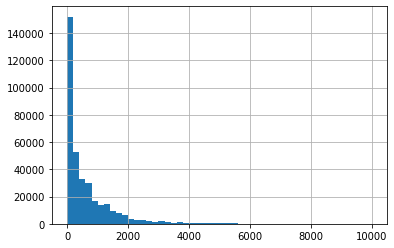

In [80]:
vis['visits_length'].hist(range=(0, 10000), bins=50)
plt.show()

<div class="alert alert-block alert-warning">
   <h2>Reviewer's commentary: second iteration of the review <a class="tocSkip"> </h2>
    <br/>
<b>Remarks and recommendations📌:</b>
        
Vadim, if you visualize the sessions length Since the distribution is not normal,so it is better to use mode to find the average session length. Here I visualze the distribution, using your data
       
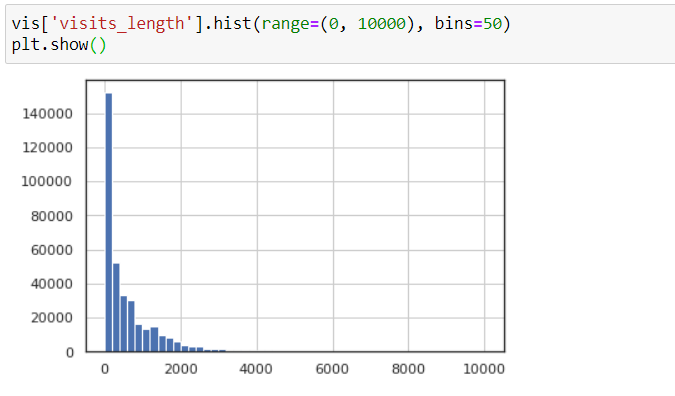

<div class="alert alert-info" role="alert"> V.3 - This mark is provided on all my new comment in current iteration. 
    

    
    I had thought about mode, but wasn't 100% sure. Thank you for yor correction! 
</div>

<div class="alert alert-block alert-success">
    <h2>Reviewer's commentary:third iteration of the review <a class="tocSkip"> </h2>
    <br/>
<b>Well done!👍:</b> 
        
Ok, now everything is alright, the mode is correct choice!

_-How often do users come back?_

This question is obviously about retention. (The following code partly inspired by our tutor Anastasia Piterskaia)

In [81]:
vis.head()

,device,end_ts,source_id,start_ts,uid,session_year,session_month,session_week,session_date,month_,week_,visits_length
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017,12,51,2017-12-20,2017-12-01,2017-12-14,1080
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018,2,8,2018-02-19,2018-02-01,2018-02-15,1680
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017,7,26,2017-07-01,2017-07-01,2017-06-29,0
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,5,20,2018-05-20,2018-05-01,2018-05-17,1440
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017,12,52,2017-12-27,2017-12-01,2017-12-21,0


In [82]:
min_visit=vis.groupby(['uid'])['start_ts'].min().reset_index()
min_visit

,uid,start_ts
0,11863502262781,2018-03-01 17:27:00
1,49537067089222,2018-02-06 15:55:00
2,297729379853735,2017-06-07 18:47:00
3,313578113262317,2017-09-18 22:49:00
4,325320750514679,2017-09-30 14:29:00
...,...,...
228164,18446403737806311543,2017-11-30 03:36:00
228165,18446424184725333426,2017-12-06 20:32:00
228166,18446556406699109058,2018-01-01 16:29:00
228167,18446621818809592527,2017-12-27 13:27:00


In [83]:
min_order=ord.groupby(['uid'])['buy_ts'].min().reset_index()
min_order

,uid,buy_ts
0,313578113262317,2018-01-03 21:51:00
1,1575281904278712,2017-06-03 10:13:00
2,2429014661409475,2017-10-11 18:33:00
3,2464366381792757,2018-01-28 15:54:00
4,2551852515556206,2017-11-24 10:14:00
...,...,...
36518,18445147675727495770,2017-11-24 09:03:00
36519,18445407535914413204,2017-09-22 23:55:00
36520,18445601152732270159,2018-03-26 22:54:00
36521,18446156210226471712,2018-02-18 19:34:00


In [84]:
actual_first_visit=min_visit.merge(min_order,on=['uid'],how='left')
actual_first_visit

,uid,start_ts,buy_ts
0,11863502262781,2018-03-01 17:27:00,NaT
1,49537067089222,2018-02-06 15:55:00,NaT
2,297729379853735,2017-06-07 18:47:00,NaT
3,313578113262317,2017-09-18 22:49:00,2018-01-03 21:51:00
4,325320750514679,2017-09-30 14:29:00,NaT
...,...,...,...
228164,18446403737806311543,2017-11-30 03:36:00,NaT
228165,18446424184725333426,2017-12-06 20:32:00,NaT
228166,18446556406699109058,2018-01-01 16:29:00,NaT
228167,18446621818809592527,2017-12-27 13:27:00,NaT


We have some customer, whos _buy\_ts_ occure earlier than their _start\_ts_. This sounds a bit crazy. Thats why we are creating a new column _first\_visit_, where we collect the earliest timestamps for each user.

In [85]:
actual_first_visit['first_visit']=actual_first_visit.apply(lambda row: row.start_ts if row.start_ts<row.buy_ts\
                                                          or isinstance(row.buy_ts,pd._libs.tslibs.nattype.NaTType)\
                                                          else row.buy_ts,axis=1)

In [86]:
actual_first_visit

,uid,start_ts,buy_ts,first_visit
0,11863502262781,2018-03-01 17:27:00,NaT,2018-03-01 17:27:00
1,49537067089222,2018-02-06 15:55:00,NaT,2018-02-06 15:55:00
2,297729379853735,2017-06-07 18:47:00,NaT,2017-06-07 18:47:00
3,313578113262317,2017-09-18 22:49:00,2018-01-03 21:51:00,2017-09-18 22:49:00
4,325320750514679,2017-09-30 14:29:00,NaT,2017-09-30 14:29:00
...,...,...,...,...
228164,18446403737806311543,2017-11-30 03:36:00,NaT,2017-11-30 03:36:00
228165,18446424184725333426,2017-12-06 20:32:00,NaT,2017-12-06 20:32:00
228166,18446556406699109058,2018-01-01 16:29:00,NaT,2018-01-01 16:29:00
228167,18446621818809592527,2017-12-27 13:27:00,NaT,2017-12-27 13:27:00


In [87]:
retention_data=vis.merge(actual_first_visit[['uid','first_visit']],on=['uid'],how='left')
retention_data

,device,end_ts,source_id,start_ts,uid,session_year,session_month,session_week,session_date,month_,week_,visits_length,first_visit
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017,12,51,2017-12-20,2017-12-01,2017-12-14,1080,2017-12-20 17:20:00
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018,2,8,2018-02-19,2018-02-01,2018-02-15,1680,2018-02-19 16:53:00
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017,7,26,2017-07-01,2017-07-01,2017-06-29,0,2017-07-01 01:54:00
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,5,20,2018-05-20,2018-05-01,2018-05-17,1440,2018-03-09 20:05:00
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017,12,52,2017-12-27,2017-12-01,2017-12-21,0,2017-12-27 14:06:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
359395,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539,2017,7,30,2017-07-29,2017-07-01,2017-07-27,19,2017-07-29 19:07:00
359396,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586,2018,1,4,2018-01-25,2018-01-01,2018-01-25,19,2018-01-25 17:38:00
359397,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294,2018,3,9,2018-03-03,2018-03-01,2018-03-01,19,2018-03-03 10:12:00
359398,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485,2017,11,44,2017-11-02,2017-11-01,2017-11-02,19,2017-11-02 10:12:00


In the next step we are calculating day of return for each user. 

In [88]:
retention_data['retention_month']=((retention_data['start_ts']-retention_data['first_visit'])/np.timedelta64(1,'M')).astype(int)

<div class="alert alert-block alert-danger">
    <h2>Reviewer's commentary <a class="tocSkip"> </h2>
    <br/>
<b>Needs fixing!🤔:</b>
        
Here you need to find the differnce between activity_month and first_activity_month, so you need to use 'M', not 'D'.

<div class="alert alert-info" role="alert">
Fixed, thank you for the correction. 
</div>

<div class="alert alert-block alert-success">
    <h2>Reviewer's commentary:second iteration of the review <a class="tocSkip"> </h2>
    <br/>
<b>Well done!👍:</b> 
        
This time the code is correct!

In [89]:
retention_data

,device,end_ts,source_id,start_ts,uid,session_year,session_month,session_week,session_date,month_,week_,visits_length,first_visit,retention_month
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017,12,51,2017-12-20,2017-12-01,2017-12-14,1080,2017-12-20 17:20:00,0
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018,2,8,2018-02-19,2018-02-01,2018-02-15,1680,2018-02-19 16:53:00,0
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017,7,26,2017-07-01,2017-07-01,2017-06-29,0,2017-07-01 01:54:00,0
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,5,20,2018-05-20,2018-05-01,2018-05-17,1440,2018-03-09 20:05:00,2
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017,12,52,2017-12-27,2017-12-01,2017-12-21,0,2017-12-27 14:06:00,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359395,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539,2017,7,30,2017-07-29,2017-07-01,2017-07-27,19,2017-07-29 19:07:00,0
359396,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586,2018,1,4,2018-01-25,2018-01-01,2018-01-25,19,2018-01-25 17:38:00,0
359397,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294,2018,3,9,2018-03-03,2018-03-01,2018-03-01,19,2018-03-03 10:12:00,0
359398,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485,2017,11,44,2017-11-02,2017-11-01,2017-11-02,19,2017-11-02 10:12:00,0


In [90]:
print(len(retention_data[retention_data['retention_month'] != 0]))

77535


And now we are applying filter we used above to get rid of suspicious dates. 

In [91]:
retention_data_clean=retention_data[retention_data.start_ts!=retention_data.first_visit]
retention_data_clean

,device,end_ts,source_id,start_ts,uid,session_year,session_month,session_week,session_date,month_,week_,visits_length,first_visit,retention_month
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,5,20,2018-05-20,2018-05-01,2018-05-17,1440,2018-03-09 20:05:00,2
6,desktop,2018-01-30 12:09:00,1,2018-01-30 11:13:00,6661610529277171451,2018,1,5,2018-01-30,2018-01-01,2018-01-25,3360,2017-06-29 09:00:00,7
11,desktop,2018-01-25 19:41:00,1,2018-01-25 19:37:00,7478054213403174082,2018,1,4,2018-01-25,2018-01-01,2018-01-25,240,2018-01-25 14:16:00,0
12,desktop,2018-02-06 15:50:00,4,2018-02-06 15:45:00,8056418121947262981,2018,2,6,2018-02-06,2018-02-01,2018-02-01,300,2017-06-04 14:17:00,8
14,touch,2018-04-23 18:01:00,9,2018-04-23 18:00:00,18026419100367255411,2018,4,17,2018-04-23,2018-04-01,2018-04-19,60,2017-10-04 22:44:00,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
358521,desktop,2018-01-21 17:41:00,4,2018-01-21 17:29:00,9892427580703881255,2018,1,3,2018-01-21,2018-01-01,2018-01-18,720,2017-12-27 07:45:00,0
358523,desktop,2018-04-23 13:24:00,5,2018-04-23 13:15:00,7747553584236614757,2018,4,17,2018-04-23,2018-04-01,2018-04-19,540,2018-04-23 13:08:00,0
358528,touch,2018-05-15 23:09:00,2,2018-05-15 23:08:00,11171727274084046837,2018,5,20,2018-05-15,2018-05-01,2018-05-10,60,2017-09-29 21:13:00,7
358529,desktop,2018-05-06 20:27:00,5,2018-05-06 20:27:00,13482259146982443019,2018,5,18,2018-05-06,2018-05-01,2018-05-03,0,2018-04-11 12:49:00,0


We can see in the output, that sometimes the retention date equal to zero. This means, that the user came back on the same day. Thus we already have data for our 0-day cohort :-)  

In the _vis_ table we filtered users who didn't come back after the very first day. Now to calculate the overal retantion rate as a share of users from total registration we have to use this amount of users too. 

We can also go further and calculate e.g. retention rate depending on client's source. 

In [92]:
registrations=vis.groupby(['source_id'])['uid'].nunique().reset_index().rename(columns={'uid':'registered'})
registrations

,source_id,registered
0,1,18999
1,2,26245
2,3,74756
3,4,83525
4,5,56974
5,6,6
6,7,34
7,9,9264
8,10,8067


<div class="alert alert-info" role="alert">
So, we left the calculation above as it was. It seems to be okay.  
 
   
    
All the following cells are new (till the next blue Markdown cell). 
    
You said, we need a monthly cohorts. Unfortunatly it was not mentioned in the original task, that's why we took just some cohorts :'-( 
    
So now at first we are adding a data to our table, if a user come back during the 12 month and if he came back, in which particularly month:  
</div>

In [93]:
def monthly_ret(retention_data_clean):
    for i in range(0,12): 
        name = 'Retention_' + str(i) + 'm'
        retention_data_clean[name] = retention_data_clean['retention_month'].apply(lambda x: x==i)
        
monthly_ret(retention_data_clean)

In [94]:
retention_data_clean

,device,end_ts,source_id,start_ts,uid,session_year,session_month,session_week,session_date,month_,...,Retention_2m,Retention_3m,Retention_4m,Retention_5m,Retention_6m,Retention_7m,Retention_8m,Retention_9m,Retention_10m,Retention_11m
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,5,20,2018-05-20,2018-05-01,...,True,False,False,False,False,False,False,False,False,False
6,desktop,2018-01-30 12:09:00,1,2018-01-30 11:13:00,6661610529277171451,2018,1,5,2018-01-30,2018-01-01,...,False,False,False,False,False,True,False,False,False,False
11,desktop,2018-01-25 19:41:00,1,2018-01-25 19:37:00,7478054213403174082,2018,1,4,2018-01-25,2018-01-01,...,False,False,False,False,False,False,False,False,False,False
12,desktop,2018-02-06 15:50:00,4,2018-02-06 15:45:00,8056418121947262981,2018,2,6,2018-02-06,2018-02-01,...,False,False,False,False,False,False,True,False,False,False
14,touch,2018-04-23 18:01:00,9,2018-04-23 18:00:00,18026419100367255411,2018,4,17,2018-04-23,2018-04-01,...,False,False,False,False,True,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
358521,desktop,2018-01-21 17:41:00,4,2018-01-21 17:29:00,9892427580703881255,2018,1,3,2018-01-21,2018-01-01,...,False,False,False,False,False,False,False,False,False,False
358523,desktop,2018-04-23 13:24:00,5,2018-04-23 13:15:00,7747553584236614757,2018,4,17,2018-04-23,2018-04-01,...,False,False,False,False,False,False,False,False,False,False
358528,touch,2018-05-15 23:09:00,2,2018-05-15 23:08:00,11171727274084046837,2018,5,20,2018-05-15,2018-05-01,...,False,False,False,False,False,True,False,False,False,False
358529,desktop,2018-05-06 20:27:00,5,2018-05-06 20:27:00,13482259146982443019,2018,5,18,2018-05-06,2018-05-01,...,False,False,False,False,False,False,False,False,False,False


In [95]:
retention_data_clean.columns

Index(['device', 'end_ts', 'source_id', 'start_ts', 'uid', 'session_year',
       'session_month', 'session_week', 'session_date', 'month_', 'week_',
       'visits_length', 'first_visit', 'retention_month', 'Retention_0m',
       'Retention_1m', 'Retention_2m', 'Retention_3m', 'Retention_4m',
       'Retention_5m', 'Retention_6m', 'Retention_7m', 'Retention_8m',
       'Retention_9m', 'Retention_10m', 'Retention_11m'],
      dtype='object')

In [96]:
def retention(column):
    abs_retenion=retention_data_clean[retention_data_clean[column]==True]\
    .groupby(['source_id'])['uid'].nunique().reset_index().rename(columns={'uid':'{}'.format(column)})
    retentions=registrations.merge(abs_retenion,on=['source_id'],how='left')
    retentions['{}%'.format(column)]=(retentions['{}'.format(column)]*100/retentions['registered']).fillna(0)
    retentions=retentions[['source_id','{}%'.format(column)]]
    return retentions

In [97]:
new_retention=[]
for i in ['Retention_0m', 'Retention_1m', 'Retention_2m', 'Retention_3m',
       'Retention_4m', 'Retention_5m', 'Retention_6m', 'Retention_7m',
       'Retention_8m', 'Retention_9m', 'Retention_10m', 'Retention_11m']:
    new_retention.append(retention(i))

In [98]:
new_retention

[   source_id  Retention_0m%
 0          1      41.939049
 1          2      27.121356
 2          3       8.162556
 3          4      11.220593
 4          5      12.804086
 5          6      50.000000
 6          7       0.000000
 7          9      17.692142
 8         10      11.912731,
    source_id  Retention_1m%
 0          1       6.563503
 1          2       8.641646
 2          3       3.122157
 3          4       4.205926
 4          5       2.806543
 5          6       0.000000
 6          7       2.941176
 7          9      10.481434
 8         10       3.074253,
    source_id  Retention_2m%
 0          1       4.779199
 1          2       6.462183
 2          3       2.561667
 3          4       3.076923
 4          5       2.116755
 5          6      16.666667
 6          7       0.000000
 7          9       8.300950
 8         10       2.107351,
    source_id  Retention_3m%
 0          1       3.889678
 1          2       5.216232
 2          3       2.203168
 3         

In [99]:
new_retention=pd.concat(new_retention,axis=1)

In [100]:
new_retention

,source_id,Retention_0m%,source_id,Retention_1m%,source_id,Retention_2m%,source_id,Retention_3m%,source_id,Retention_4m%,...,source_id,Retention_7m%,source_id,Retention_8m%,source_id,Retention_9m%,source_id,Retention_10m%,source_id,Retention_11m%
0,1,41.939049,1,6.563503,1,4.779199,1,3.889678,1,3.268593,...,1,1.531660,1,1.184273,1,0.878994,1,0.673720,1,0.436865
1,2,27.121356,2,8.641646,2,6.462183,2,5.216232,2,4.141741,...,2,2.103258,2,1.653648,2,1.177367,2,0.845875,2,0.514384
2,3,8.162556,3,3.122157,3,2.561667,3,2.203168,3,1.740329,...,3,0.869495,3,0.585906,3,0.390604,3,0.279576,3,0.156509
3,4,11.220593,4,4.205926,4,3.076923,4,2.542951,4,2.092787,...,4,0.947022,4,0.624963,4,0.403472,4,0.286142,4,0.162826
4,5,12.804086,5,2.806543,5,2.116755,5,1.635834,5,1.325166,...,5,0.530066,5,0.415979,5,0.258012,5,0.207112,5,0.110577
5,6,50.000000,6,0.000000,6,16.666667,6,0.000000,6,0.000000,...,6,0.000000,6,0.000000,6,0.000000,6,0.000000,6,0.000000
6,7,0.000000,7,2.941176,7,0.000000,7,2.941176,7,2.941176,...,7,0.000000,7,0.000000,7,0.000000,7,0.000000,7,0.000000
7,9,17.692142,9,10.481434,9,8.300950,9,6.778929,9,5.354059,...,9,2.417962,9,1.867444,9,1.295337,9,0.647668,9,0.334629
8,10,11.912731,10,3.074253,10,2.107351,10,1.698277,10,1.425561,...,10,0.842940,10,0.582621,10,0.359489,10,0.235527,10,0.123962


In [101]:
new_retention=new_retention.loc[:,~new_retention.columns.duplicated()]
new_retention

,source_id,Retention_0m%,Retention_1m%,Retention_2m%,Retention_3m%,Retention_4m%,Retention_5m%,Retention_6m%,Retention_7m%,Retention_8m%,Retention_9m%,Retention_10m%,Retention_11m%
0,1,41.939049,6.563503,4.779199,3.889678,3.268593,2.721196,2.226433,1.531660,1.184273,0.878994,0.673720,0.436865
1,2,27.121356,8.641646,6.462183,5.216232,4.141741,3.627358,2.770051,2.103258,1.653648,1.177367,0.845875,0.514384
2,3,8.162556,3.122157,2.561667,2.203168,1.740329,1.431323,1.126331,0.869495,0.585906,0.390604,0.279576,0.156509
3,4,11.220593,4.205926,3.076923,2.542951,2.092787,1.704879,1.240347,0.947022,0.624963,0.403472,0.286142,0.162826
4,5,12.804086,2.806543,2.116755,1.635834,1.325166,0.988170,0.759996,0.530066,0.415979,0.258012,0.207112,0.110577
5,6,50.000000,0.000000,16.666667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,7,0.000000,2.941176,0.000000,2.941176,2.941176,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,9,17.692142,10.481434,8.300950,6.778929,5.354059,4.674007,3.076425,2.417962,1.867444,1.295337,0.647668,0.334629
8,10,11.912731,3.074253,2.107351,1.698277,1.425561,0.942110,0.743771,0.842940,0.582621,0.359489,0.235527,0.123962


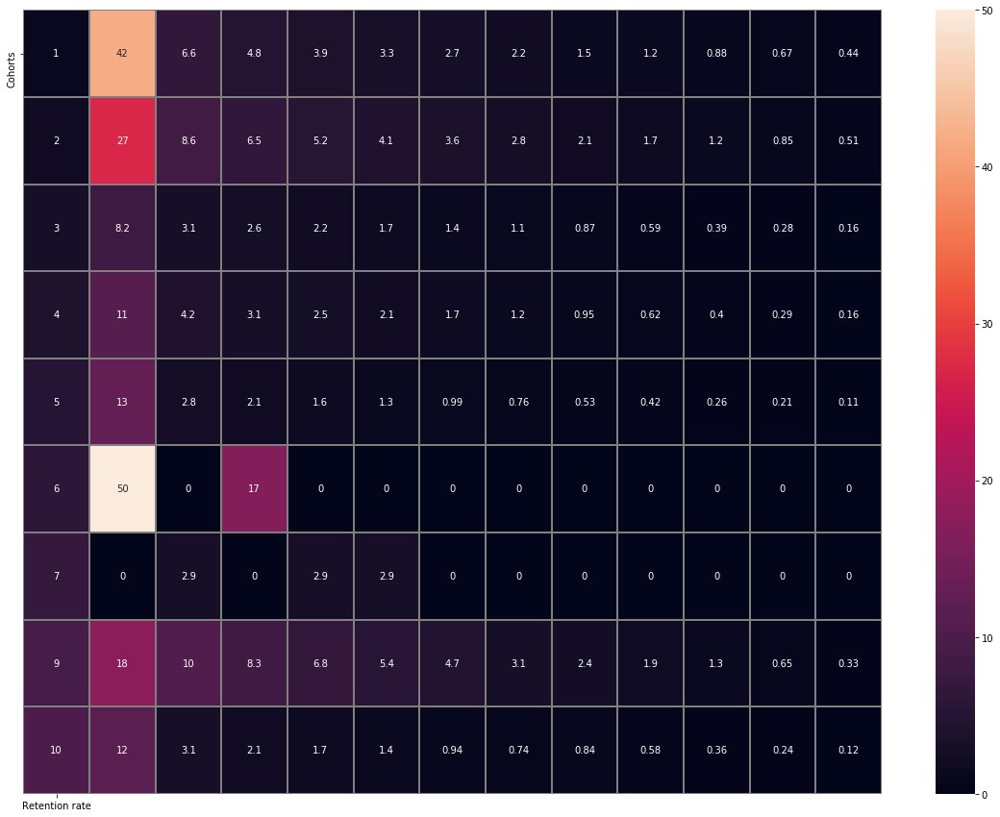

In [102]:
plt.subplots(figsize=(20,15))
sns.heatmap(new_retention, annot =True, linewidths=1, linecolor = 'grey', xticklabels = ['Retention rate'] , yticklabels = ['Cohorts']);

<div class="alert alert-info" role="alert">
Till this moment we've tried above to calculate retention one more time in the similar way as we did, but the figures in the table are still different compared to the table you added as a reference. 
    
 That's why we decided to start RR calculations one more time:  
</div>

<div class="alert alert-info" role="alert">
-----------------------------------------------------------------New RR calculation v.1 ----------------------------------------------------------------- 
</div>

<div class="alert alert-info" role="alert">
We assumed at this point, that our data preprocessing was okay and we can use the table retention_data_clean.
</div>

In [103]:
retention_data_clean

,device,end_ts,source_id,start_ts,uid,session_year,session_month,session_week,session_date,month_,...,Retention_2m,Retention_3m,Retention_4m,Retention_5m,Retention_6m,Retention_7m,Retention_8m,Retention_9m,Retention_10m,Retention_11m
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,5,20,2018-05-20,2018-05-01,...,True,False,False,False,False,False,False,False,False,False
6,desktop,2018-01-30 12:09:00,1,2018-01-30 11:13:00,6661610529277171451,2018,1,5,2018-01-30,2018-01-01,...,False,False,False,False,False,True,False,False,False,False
11,desktop,2018-01-25 19:41:00,1,2018-01-25 19:37:00,7478054213403174082,2018,1,4,2018-01-25,2018-01-01,...,False,False,False,False,False,False,False,False,False,False
12,desktop,2018-02-06 15:50:00,4,2018-02-06 15:45:00,8056418121947262981,2018,2,6,2018-02-06,2018-02-01,...,False,False,False,False,False,False,True,False,False,False
14,touch,2018-04-23 18:01:00,9,2018-04-23 18:00:00,18026419100367255411,2018,4,17,2018-04-23,2018-04-01,...,False,False,False,False,True,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
358521,desktop,2018-01-21 17:41:00,4,2018-01-21 17:29:00,9892427580703881255,2018,1,3,2018-01-21,2018-01-01,...,False,False,False,False,False,False,False,False,False,False
358523,desktop,2018-04-23 13:24:00,5,2018-04-23 13:15:00,7747553584236614757,2018,4,17,2018-04-23,2018-04-01,...,False,False,False,False,False,False,False,False,False,False
358528,touch,2018-05-15 23:09:00,2,2018-05-15 23:08:00,11171727274084046837,2018,5,20,2018-05-15,2018-05-01,...,False,False,False,False,False,True,False,False,False,False
358529,desktop,2018-05-06 20:27:00,5,2018-05-06 20:27:00,13482259146982443019,2018,5,18,2018-05-06,2018-05-01,...,False,False,False,False,False,False,False,False,False,False


In [104]:
retention_data_clean.first_visit = retention_data_clean.first_visit.astype('datetime64[M]')
retention_data_clean.first_visit

3        2018-03-01
6        2017-06-01
11       2018-01-01
12       2017-06-01
14       2017-10-01
            ...    
358521   2017-12-01
358523   2018-04-01
358528   2017-09-01
358529   2018-04-01
358531   2017-06-01
Name: first_visit, Length: 131230, dtype: datetime64[ns]

In [105]:
retention_data_clean = retention_data_clean.rename(
    columns={'first_visit': 'first_activity_month', 'retention_month': 'cohort_lifetime'}
)
retention_data_clean

,device,end_ts,source_id,start_ts,uid,session_year,session_month,session_week,session_date,month_,...,Retention_2m,Retention_3m,Retention_4m,Retention_5m,Retention_6m,Retention_7m,Retention_8m,Retention_9m,Retention_10m,Retention_11m
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,5,20,2018-05-20,2018-05-01,...,True,False,False,False,False,False,False,False,False,False
6,desktop,2018-01-30 12:09:00,1,2018-01-30 11:13:00,6661610529277171451,2018,1,5,2018-01-30,2018-01-01,...,False,False,False,False,False,True,False,False,False,False
11,desktop,2018-01-25 19:41:00,1,2018-01-25 19:37:00,7478054213403174082,2018,1,4,2018-01-25,2018-01-01,...,False,False,False,False,False,False,False,False,False,False
12,desktop,2018-02-06 15:50:00,4,2018-02-06 15:45:00,8056418121947262981,2018,2,6,2018-02-06,2018-02-01,...,False,False,False,False,False,False,True,False,False,False
14,touch,2018-04-23 18:01:00,9,2018-04-23 18:00:00,18026419100367255411,2018,4,17,2018-04-23,2018-04-01,...,False,False,False,False,True,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
358521,desktop,2018-01-21 17:41:00,4,2018-01-21 17:29:00,9892427580703881255,2018,1,3,2018-01-21,2018-01-01,...,False,False,False,False,False,False,False,False,False,False
358523,desktop,2018-04-23 13:24:00,5,2018-04-23 13:15:00,7747553584236614757,2018,4,17,2018-04-23,2018-04-01,...,False,False,False,False,False,False,False,False,False,False
358528,touch,2018-05-15 23:09:00,2,2018-05-15 23:08:00,11171727274084046837,2018,5,20,2018-05-15,2018-05-01,...,False,False,False,False,False,True,False,False,False,False
358529,desktop,2018-05-06 20:27:00,5,2018-05-06 20:27:00,13482259146982443019,2018,5,18,2018-05-06,2018-05-01,...,False,False,False,False,False,False,False,False,False,False


In [106]:
cohorts = (
    retention_data_clean.groupby(['first_activity_month', 'cohort_lifetime'])
    .agg({'uid': 'nunique'})
    .reset_index()
) 

In [107]:
cohorts

,first_activity_month,cohort_lifetime,uid
0,2017-06-01,0,2129
1,2017-06-01,1,784
2,2017-06-01,2,731
3,2017-06-01,3,898
4,2017-06-01,4,884
...,...,...,...
74,2018-03-01,2,299
75,2018-04-01,0,1940
76,2018-04-01,1,311
77,2018-05-01,0,1650


In [108]:
initial_users_count = cohorts[cohorts['cohort_lifetime'] == 0][
    ['first_activity_month', 'uid']
]
print(initial_users_count) 

   first_activity_month   uid
0            2017-06-01  2129
12           2017-07-01  1882
23           2017-08-01  1351
33           2017-09-01  2631
42           2017-10-01  4208
50           2017-11-01  4803
57           2017-12-01  3729
63           2018-01-01  3114
68           2018-02-01  3033
72           2018-03-01  2757
75           2018-04-01  1940
77           2018-05-01  1650


In [109]:
initial_users_count = initial_users_count.rename(
    columns={'uid': 'cohort_users'}
) 

In [110]:
cohorts = cohorts.merge(initial_users_count, on='first_activity_month')

In [111]:
cohorts['retention'] = cohorts['uid'] / cohorts['cohort_users'] 

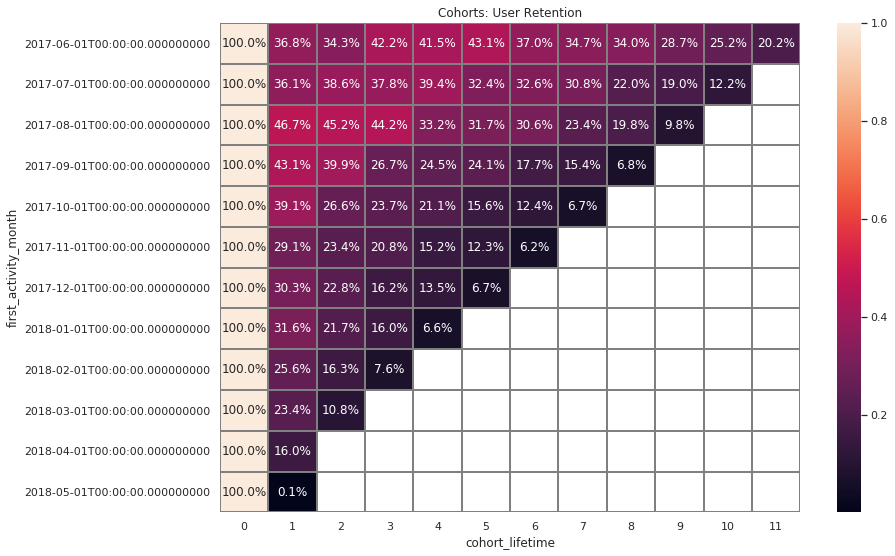

In [112]:
retention_pivot = cohorts.pivot_table(
    index='first_activity_month',
    columns='cohort_lifetime',
    values='retention',
    aggfunc='sum',
)

sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Cohorts: User Retention')
sns.heatmap(
    retention_pivot, annot=True, fmt='.1%', linewidths=1, linecolor='gray'
) ;

<div class="alert alert-info" role="alert">
The table is still looks different from the one you added as a reference. The figures are unrealistically big. That means, the problem is presumably at the retention_data_clean table. 
    
 That's why we decided to start RR calculations one more time from scratch. We used here as a guide the code in our theory lessons:  
</div>

<div class="alert alert-info" role="alert">
-----------------------------------------------------------------New RR calculation v.2 ----------------------------------------------------------------- 
</div>

In [113]:
vis

,device,end_ts,source_id,start_ts,uid,session_year,session_month,session_week,session_date,month_,week_,visits_length
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017,12,51,2017-12-20,2017-12-01,2017-12-14,1080
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018,2,8,2018-02-19,2018-02-01,2018-02-15,1680
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017,7,26,2017-07-01,2017-07-01,2017-06-29,0
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,5,20,2018-05-20,2018-05-01,2018-05-17,1440
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017,12,52,2017-12-27,2017-12-01,2017-12-21,0
...,...,...,...,...,...,...,...,...,...,...,...,...
359395,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539,2017,7,30,2017-07-29,2017-07-01,2017-07-27,19
359396,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586,2018,1,4,2018-01-25,2018-01-01,2018-01-25,19
359397,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294,2018,3,9,2018-03-03,2018-03-01,2018-03-01,19
359398,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485,2017,11,44,2017-11-02,2017-11-01,2017-11-02,19


In [114]:
first_activity_date = vis.groupby(['uid'])['session_date'].min()
first_activity_date.name = 'first_activity_date'
vis = vis.join(first_activity_date,on='uid') 
vis

,device,end_ts,source_id,start_ts,uid,session_year,session_month,session_week,session_date,month_,week_,visits_length,first_activity_date
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017,12,51,2017-12-20,2017-12-01,2017-12-14,1080,2017-12-20
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018,2,8,2018-02-19,2018-02-01,2018-02-15,1680,2018-02-19
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017,7,26,2017-07-01,2017-07-01,2017-06-29,0,2017-07-01
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,5,20,2018-05-20,2018-05-01,2018-05-17,1440,2018-03-09
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017,12,52,2017-12-27,2017-12-01,2017-12-21,0,2017-12-27
...,...,...,...,...,...,...,...,...,...,...,...,...,...
359395,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539,2017,7,30,2017-07-29,2017-07-01,2017-07-27,19,2017-07-29
359396,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586,2018,1,4,2018-01-25,2018-01-01,2018-01-25,19,2018-01-25
359397,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294,2018,3,9,2018-03-03,2018-03-01,2018-03-01,19,2018-03-03
359398,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485,2017,11,44,2017-11-02,2017-11-01,2017-11-02,19,2017-11-02


In [115]:
ord

,buy_ts,revenue,uid,start_ts
0,2017-06-01 00:10:00,1700,10329302124590727494,2017-06-01 00:10:00
1,2017-06-01 00:25:00,55,11627257723692907447,2017-06-01 00:25:00
2,2017-06-01 00:27:00,37,17903680561304213844,2017-06-01 00:27:00
3,2017-06-01 00:29:00,55,16109239769442553005,2017-06-01 00:29:00
4,2017-06-01 07:58:00,37,14200605875248379450,2017-06-01 07:58:00
...,...,...,...,...
50410,2018-05-31 23:50:00,463,12296626599487328624,2018-05-31 23:50:00
50411,2018-05-31 23:50:00,580,11369640365507475976,2018-05-31 23:50:00
50412,2018-05-31 23:54:00,30,1786462140797698849,2018-05-31 23:54:00
50413,2018-05-31 23:56:00,367,3993697860786194247,2018-05-31 23:56:00


In [116]:
first_order_date_by_customers = ord.groupby('uid')[
    'buy_ts'
].min()
print(first_order_date_by_customers.head()) 

uid
313578113262317    2018-01-03 21:51:00
1575281904278712   2017-06-03 10:13:00
2429014661409475   2017-10-11 18:33:00
2464366381792757   2018-01-28 15:54:00
2551852515556206   2017-11-24 10:14:00
Name: buy_ts, dtype: datetime64[ns]


In [117]:
first_order_date_by_customers.name = 'first_order_date'

In [118]:
ord = ord.join(first_order_date_by_customers,on='uid')
print(ord.head()) 

               buy_ts  revenue                   uid            start_ts  \
0 2017-06-01 00:10:00     1700  10329302124590727494 2017-06-01 00:10:00   
1 2017-06-01 00:25:00       55  11627257723692907447 2017-06-01 00:25:00   
2 2017-06-01 00:27:00       37  17903680561304213844 2017-06-01 00:27:00   
3 2017-06-01 00:29:00       55  16109239769442553005 2017-06-01 00:29:00   
4 2017-06-01 07:58:00       37  14200605875248379450 2017-06-01 07:58:00   

     first_order_date  
0 2017-06-01 00:10:00  
1 2017-06-01 00:25:00  
2 2017-06-01 00:27:00  
3 2017-06-01 00:29:00  
4 2017-06-01 07:58:00  


In [119]:
ord['order_date'] = ord['buy_ts'].dt.date

In [120]:
ord.head() 

,buy_ts,revenue,uid,start_ts,first_order_date,order_date
0,2017-06-01 00:10:00,1700,10329302124590727494,2017-06-01 00:10:00,2017-06-01 00:10:00,2017-06-01
1,2017-06-01 00:25:00,55,11627257723692907447,2017-06-01 00:25:00,2017-06-01 00:25:00,2017-06-01
2,2017-06-01 00:27:00,37,17903680561304213844,2017-06-01 00:27:00,2017-06-01 00:27:00,2017-06-01
3,2017-06-01 00:29:00,55,16109239769442553005,2017-06-01 00:29:00,2017-06-01 00:29:00,2017-06-01
4,2017-06-01 07:58:00,37,14200605875248379450,2017-06-01 07:58:00,2017-06-01 07:58:00,2017-06-01


In [121]:
ord['first_order_month'] = ord['first_order_date'].astype(
    'datetime64[M]'
)
ord['order_month'] = ord['order_date'].astype('datetime64[M]')
ord.head()

,buy_ts,revenue,uid,start_ts,first_order_date,order_date,first_order_month,order_month
0,2017-06-01 00:10:00,1700,10329302124590727494,2017-06-01 00:10:00,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01
1,2017-06-01 00:25:00,55,11627257723692907447,2017-06-01 00:25:00,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01
2,2017-06-01 00:27:00,37,17903680561304213844,2017-06-01 00:27:00,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01
3,2017-06-01 00:29:00,55,16109239769442553005,2017-06-01 00:29:00,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01
4,2017-06-01 07:58:00,37,14200605875248379450,2017-06-01 07:58:00,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01


In [122]:
ord = ord[ord['first_order_month'] <'2018-06-01 00:00:00']

In [123]:
ord['cohort_lifetime'] = ((ord['order_month'] - ord['first_order_month'])/np.timedelta64(1,'M')).round().astype(int)

In [124]:
ord['cohort_lifetime'].unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11])

In [125]:
ord

,buy_ts,revenue,uid,start_ts,first_order_date,order_date,first_order_month,order_month,cohort_lifetime
0,2017-06-01 00:10:00,1700,10329302124590727494,2017-06-01 00:10:00,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01,0
1,2017-06-01 00:25:00,55,11627257723692907447,2017-06-01 00:25:00,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01,0
2,2017-06-01 00:27:00,37,17903680561304213844,2017-06-01 00:27:00,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01,0
3,2017-06-01 00:29:00,55,16109239769442553005,2017-06-01 00:29:00,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01,0
4,2017-06-01 07:58:00,37,14200605875248379450,2017-06-01 07:58:00,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01,0
...,...,...,...,...,...,...,...,...,...
50409,2018-05-31 23:43:00,367,1805512004303848280,2018-05-31 23:43:00,2018-05-31 23:43:00,2018-05-31,2018-05-01,2018-05-01,0
50410,2018-05-31 23:50:00,463,12296626599487328624,2018-05-31 23:50:00,2018-05-31 23:50:00,2018-05-31,2018-05-01,2018-05-01,0
50411,2018-05-31 23:50:00,580,11369640365507475976,2018-05-31 23:50:00,2018-05-31 23:50:00,2018-05-31,2018-05-01,2018-05-01,0
50412,2018-05-31 23:54:00,30,1786462140797698849,2018-05-31 23:54:00,2018-05-31 23:54:00,2018-05-31,2018-05-01,2018-05-01,0


In [126]:
cohort_grouped = ord.groupby('first_order_month').agg(
    {'order_month': 'nunique', 'buy_ts': 'nunique', 'uid': 'nunique', 'revenue': 'sum'}
).reset_index()
cohort_grouped

,first_order_month,order_month,buy_ts,uid,revenue
0,2017-06-01,12,4322,2023,2402784
1,2017-07-01,11,2797,1923,1612397
2,2017-08-01,10,2133,1370,1160481
3,2017-09-01,9,3730,2581,3467418
4,2017-10-01,8,5573,4340,2760020
5,2017-11-01,7,5361,4081,2609589
6,2017-12-01,6,5483,4383,3348191
7,2018-01-01,5,4069,3373,1666049
8,2018-02-01,4,4143,3651,1674693
9,2018-03-01,3,4146,3533,1927097


In [127]:
cohorts = (
    ord.groupby(['first_order_month', 'cohort_lifetime'])
    .agg({'uid': 'nunique'})
    .reset_index()
) 
cohorts



,first_order_month,cohort_lifetime,uid
0,2017-06-01,0,2023
1,2017-06-01,1,61
2,2017-06-01,2,50
3,2017-06-01,3,54
4,2017-06-01,4,88
...,...,...,...
73,2018-03-01,1,90
74,2018-03-01,2,58
75,2018-04-01,0,2276
76,2018-04-01,1,69


In [128]:
initial_users_count = cohorts[cohorts['cohort_lifetime'] == 0][
    ['first_order_month', 'uid']
]
print(initial_users_count) 

   first_order_month   uid
0         2017-06-01  2023
12        2017-07-01  1923
23        2017-08-01  1370
33        2017-09-01  2581
42        2017-10-01  4340
50        2017-11-01  4081
57        2017-12-01  4383
63        2018-01-01  3373
68        2018-02-01  3651
72        2018-03-01  3533
75        2018-04-01  2276
77        2018-05-01  2988


In [129]:
initial_users_count = initial_users_count.rename(
    columns={'uid': 'cohort_users'}
) 

In [130]:
cohorts = cohorts.merge(initial_users_count, on='first_order_month') 

In [131]:
cohorts['retention'] = cohorts['uid'] / cohorts['cohort_users'] 

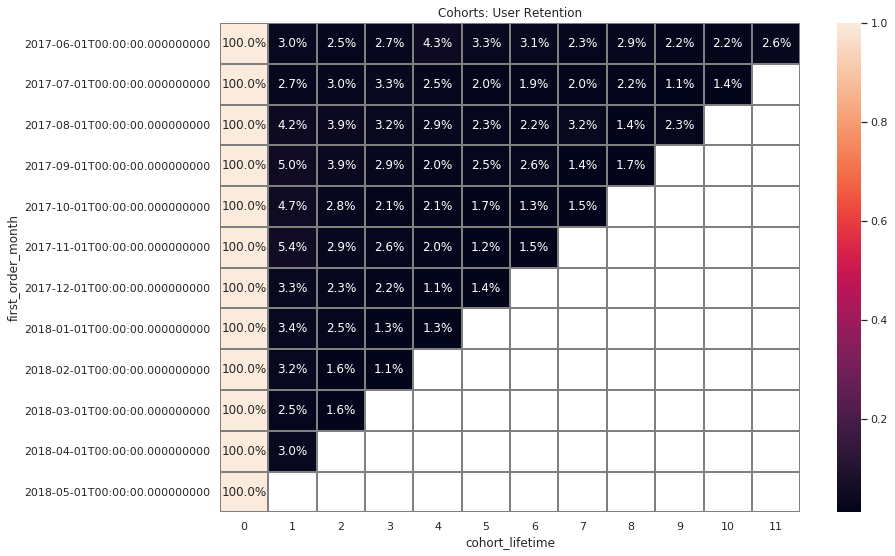

In [132]:
retention_pivot = cohorts.pivot_table(
    index='first_order_month',
    columns='cohort_lifetime',
    values='retention',
    aggfunc='sum',
)

sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Cohorts: User Retention')
sns.heatmap(
    retention_pivot, annot=True, fmt='.1%', linewidths=1, linecolor='gray'
) ; 

<div class="alert alert-info" role="alert">
The table is still looks different to the one you added as a reference. :-( 
    
I feel a bit lost in this dataset and am asking for help. 
    
It's actually a pretty easy calculation, but it' seems, that I'm mising something here. 
    
Dear Arina, could you tell me more specifically what I'm doing wrong? 
    
Thank you so much in advance. 
 
</div>

<div class="alert alert-info" role="alert">
-----------------------------------------------------------------New RR calculation v.3 ----------------------------------------------------------------- 
</div>

In [133]:
first_activity_date3 = vis.groupby(['uid'])['session_date'].min()
first_activity_date3.name = 'first_activity_date'
vis = vis.join(first_activity_date3,on='uid') 
vis

ValueError: columns overlap but no suffix specified: Index(['first_activity_date'], dtype='object')

In [ ]:
vis['visit_date'] = vis['start_ts'].dt.date

In [ ]:
vis['first_visit_month'] = vis['first_activity_date'].astype(
    'datetime64[M]'
)
vis['visit_month'] = vis['visit_date'].astype('datetime64[M]')
vis.head()

In [ ]:
vis['cohort_lifetime'] = ((vis['visit_month'] - vis['first_visit_month'])/np.timedelta64(1,'M')).round().astype(int)

In [ ]:
vis['cohort_lifetime'].unique()

In [ ]:
cohorts3 = (
    vis.groupby(['first_visit_month', 'cohort_lifetime'])
    .agg({'uid': 'nunique'})
    .reset_index()
) 
cohorts3

In [ ]:
initial_users_count3 = cohorts3[cohorts3['cohort_lifetime'] == 0][
    ['first_visit_month', 'uid']
]
print(initial_users_count3) 

In [ ]:
initial_users_count3 = initial_users_count3.rename(
    columns={'uid': 'cohort_users'}
) 

In [ ]:
cohorts3 = cohorts3.merge(initial_users_count3, on='first_visit_month') 

In [ ]:
cohorts3['retention'] = cohorts3['uid'] / cohorts3['cohort_users'] 

In [ ]:
retention_pivot3 = cohorts3.pivot_table(
    index='first_visit_month',
    columns='cohort_lifetime',
    values='retention',
    aggfunc='sum',
)

sns.set(style='white')
plt.figure(figsize=(13, 9))
plt.title('Cohorts: User Retention(Version 3)')
sns.heatmap(
    retention_pivot3, annot=True, fmt='.1%', linewidths=1, linecolor='gray'
) ; 

<div class="alert alert-info" role="alert"> V.3 - This mark is provided on all my new comment in current iteration. 
    

    
    Hooray!!!!! Yhat looks good! Many thanks one mor time, dear Arina!!! 
    
    By the way: I've noticed, I used _order_ dataset in v.2 (I can not explain, why :-D ), thus tht's why the figures at the end could not be right in v.2  
</div>

<div class="alert alert-info" role="alert">
-----------------------------------------------------------------New RR calculation v.3  END----------------------------------------------------------------- 
</div>

<div class="alert alert-block alert-warning">
   <h2>Reviewer's commentary: second iteration of the review <a class="tocSkip"> </h2>
    <br/>
<b>Remarks and recommendations📌:</b> 
        
Ok, Vadim, it is really great that you tried to perform different variants, you are doing great. I can say that the calculation version two is more correct variant, you need to add only some things, so, let't try to deal with it together.
       
1) in this code `ord['cohort_lifetime'] = ((ord['order_month'] - ord['first_order_month'])/np.timedelta64(1,'M')).astype(int)` you need to apply the round method, if you make this calculation without round you get blank(white) cells on your heatmap. And without rounding you get cohorts from 0 to 10, but in fact you need to get cohorts from 0 to 11 (for period [0:11])
       
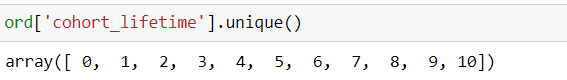
       
2) then, when you tried to group cohorts try to group the visits dataset by 'first_session_month','cohort_lifetime' and in the agg use nunique method for uid (you did this action, everything is alright)
       
For example, like this:
       
`cohorts = visits_big.groupby(['first_session_month','cohort_lifetime']).agg({'uid':'nunique'}).reset_index()`
       
3) after that you merge the cohorts to initial_users_count and calculate retention (you also correctly did it in your second version calculation)
       
4) finally you create pivot table (your one is correct)
       
So, try to improve your code using this algorithm!

<div class="alert alert-info" role="alert"> V.3 - This mark is provided on all my new comment in current iteration. 
    

    
    Dear Arina, many-many thanks for your help!!!
    I undestood, that it should be something tiny, but I didn't find the problem spot by myself.
    
    Now it's fixed.
</div>

<div class="alert alert-block alert-warning">
   <h2>Reviewer's commentary: second iteration of the review <a class="tocSkip"> </h2>
    <br/>
<b>Remarks and recommendations📌:</b> 
       
As for tips and recommendations:
       
* labels for y axis have now a very readable format - "2017-06-01 00:00:00". Try to understand how can we remove the `00:00:00` and remain only `yy:m` (use `strftime`)

<div class="alert alert-info" role="alert"> V.3 - This mark is provided on all my new comment in current iteration. 
    

    
    Dear Arina, I'll skip it this time as far this comment is yellow, but I added a new item in my to do list ;-)
</div>

<div class="alert alert-block alert-success">
    <h2>Reviewer's commentary:third iteration of the review <a class="tocSkip"> </h2>
    <br/>
<b>Well done!👍:</b> 
        
Ok, now the logic of the analysis is more correct! As for formatting of the dates - ok, keep it in mind next time👀

<div class="alert alert-info" role="alert">
-----------------------------------------------------------------It's the old unchanged code I didn't delete----------------------------------------------------------------- 
</div>

In [ ]:
ret_0=retention_data_clean[retention_data_clean['Retention_0d']==True].groupby(['source_id'])['uid'].nunique().reset_index()\
.rename(columns={'uid':'Retenion 0d'})
ret_0

In [ ]:
retentions=registrations.merge(ret_0,on=['source_id'],how='left')
retentions

In [ ]:
retentions['Retenion 0d%']=retentions['Retenion 0d']/retentions['registered']*100
retentions

Let's create a monthly cohorts. 

In [ ]:
retention_data_clean['first_visit']

In [ ]:
retention_data_clean['first_visit_'] = pd.to_datetime(retention_data_clean['first_visit']).dt.to_period('M')
retention_data_clean['first_visit_']

In [ ]:
cohort_grouped = retention_data_clean.groupby('first_visit_').agg(
    {'uid': 'nunique'}).reset_index().rename(columns={'first_visit_':'cohorts','uid':'activ_users'})

print(cohort_grouped) 

So the last output shows, that sources with ID's 1 and 6 has the best retention rate. (But we have only 6 customers with source id 6, so retention rate for this category seems to be not statistically important. Accordingly the source ID 2 with retention rate 8% is more important for the business.) 

Let's calculate also retention rate for 7, 14 and 30 day cohorts.

In [ ]:
retention_data_clean['Retention_7d']=retention_data_clean['retention_date'].apply(lambda x: x==7)
retention_data_clean['Retention_14d']=retention_data_clean['retention_date'].apply(lambda x: x==14)
retention_data_clean['Retention_30d']=retention_data_clean['retention_date'].apply(lambda x: x==30)

In [ ]:
retention_data_clean

In [ ]:
def retention(column):
    abs_retenion=retention_data_clean[retention_data_clean[column]==True]\
    .groupby(['source_id'])['uid'].nunique().reset_index().rename(columns={'uid':'{}'.format(column)})
    retentions=registrations.merge(abs_retenion,on=['source_id'],how='left')
    retentions['{}%'.format(column)]=(retentions['{}'.format(column)]*100/retentions['registered']).fillna(0)
    retentions=retentions[['source_id','{}%'.format(column)]]
    return retentions

In [ ]:
retention('Retention_0d')

In [ ]:
new_retention=[]
for i in ['Retention_0d','Retention_7d','Retention_14d','Retention_30d']:
    new_retention.append(retention(i))

In [ ]:
new_retention

In [ ]:
new_retention=pd.concat(new_retention,axis=1)

In [ ]:
new_retention

In [ ]:
new_retention=new_retention.loc[:,~new_retention.columns.duplicated()]
new_retention

Let's also calculate rolling retention depending on source ID. 

In [ ]:
retention_data_clean['Rolling_Retention_0d']=retention_data_clean['retention_date'].apply(lambda x: x>=0)
retention_data_clean['Rolling_Retention_7d']=retention_data_clean['retention_date'].apply(lambda x: x>=7)
retention_data_clean['Rolling_Retention_14d']=retention_data_clean['retention_date'].apply(lambda x: x>=14)
retention_data_clean['Rolling_Retention_30d']=retention_data_clean['retention_date'].apply(lambda x: x>=30)

In [ ]:
rolling_retention=[]
for i in ['Retention_0m', 'Retention_1m', 'Retention_2m', 'Retention_3m',
       'Retention_4m', 'Retention_5m', 'Retention_6m', 'Retention_7m',
       'Retention_8m', 'Retention_9m', 'Retention_10m', 'Retention_11m']:
    rolling_retention.append(retention(i))

In [ ]:
rolling_retention=pd.concat(rolling_retention,axis=1)

rolling_retention=rolling_retention.loc[:,~rolling_retention.columns.duplicated()]
rolling_retention

In [ ]:
ret_melted=pd.melt(rolling_retention,id_vars=['source_id'],value_vars=['Rolling_Retention_0d%','Rolling_Retention_7d%','Rolling_Retention_14d%','Rolling_Retention_30d%'])

In [ ]:
ret_melted

In [ ]:
import plotly.express as px
fig=px.line(ret_melted,x='variable',y='value',color='source_id', labels=dict(variable='Cohorts', value= 'Rolling retention rate'), title= 'Rolling retention depending on source ID:')
fig.show()

It appears that in the long run (30 days) resorces nr. 9 and 2 have the best retention rate. In the short time (up to two days) sources nr. 6 and 1 bring more customers back. 

<div class="alert alert-info" role="alert">
-----------------------------------------------------------------The end of old unchanged code I didn't delete----------------------------------------------------------------- 
</div>

<div class="alert alert-block alert-danger">
    <h2>Reviewer's commentary <a class="tocSkip"> </h2>
    <br/>
<b>Needs fixing!🤔:</b>
        
Vadim, according to the instruction you need to find the Retention using the cohort analysis, but now I cannot see the cohort heatmap in your project. Moreover, the logic of how you tried to find the retention rate is not a very correct. Ok, yes, I understand that you try to calculate the RR of 1, 7 and 30 day, but here we are interested in months and you need to look at all the cohorts you have separately, by month.
        
Finally you need to gain the table like this:
        
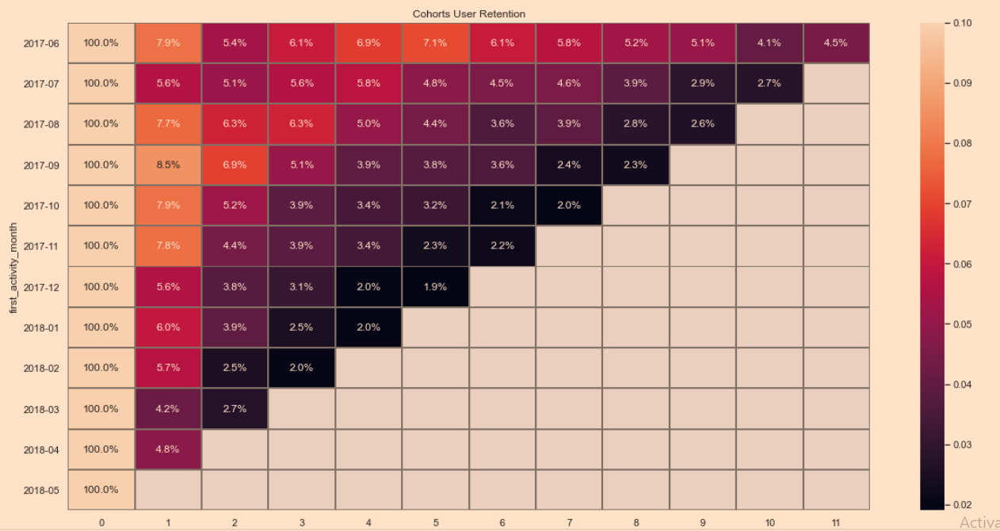
        
So, please, try to uderstand how to calculate the RR more correctly.
        
Remind you that according to the formula
        
Retention rate = active users/all users,
        
RR = the number of active users in each of the months divided by the original number of users in the cohort

<div class="alert alert-block alert-warning">
   <h2>Reviewer's commentary <a class="tocSkip"> </h2>
    <br/>
<b>Remarks and recommendations📌:</b> 
       
As for tips and recommendations:
       
* it is importaht to calculate and show the average value for Retention Rate for the second month of cohort life and identify the trend of retention rates dynamics. 

### Sales
<a class="anchor" id="subsection-2b"></a>

 _When do people start buying? (In KPI analysis, we're usually interested in knowing the time that elapses between registration and conversion — when the user becomes a customer. For example, if registration and the first purchase occur on the same day, the user might fall into category Conversion 0d. If the first purchase happens the next day, it will be Conversion 1d. You can use any approach that lets you compare the conversions of different cohorts, so that you can determine which cohort, or marketing channel, is most effective.)_

To answer this question, we are going to calculate conversion for our 0, 7, 14 and 30 day cohorts. (The code partly inspired by our tutor Anastasia Piterskaia)

In [134]:
conversion_data=min_order.merge(actual_first_visit[['uid','first_visit']],on=['uid'],how='left')
conversion_data

,uid,buy_ts,first_visit
0,313578113262317,2018-01-03 21:51:00,2017-09-18 22:49:00
1,1575281904278712,2017-06-03 10:13:00,2017-06-03 10:13:00
2,2429014661409475,2017-10-11 18:33:00,2017-10-11 17:14:00
3,2464366381792757,2018-01-28 15:54:00,2018-01-27 20:10:00
4,2551852515556206,2017-11-24 10:14:00,2017-11-24 10:14:00
...,...,...,...
36518,18445147675727495770,2017-11-24 09:03:00,2017-08-20 13:30:00
36519,18445407535914413204,2017-09-22 23:55:00,2017-09-22 23:48:00
36520,18445601152732270159,2018-03-26 22:54:00,2017-08-07 11:51:00
36521,18446156210226471712,2018-02-18 19:34:00,2017-11-07 10:01:00


In [135]:
conversion_data['conversion_date']=((conversion_data['buy_ts']-conversion_data['first_visit'])/np.timedelta64(1,'D')).astype(int)

In [136]:
conversion_data

,uid,buy_ts,first_visit,conversion_date
0,313578113262317,2018-01-03 21:51:00,2017-09-18 22:49:00,106
1,1575281904278712,2017-06-03 10:13:00,2017-06-03 10:13:00,0
2,2429014661409475,2017-10-11 18:33:00,2017-10-11 17:14:00,0
3,2464366381792757,2018-01-28 15:54:00,2018-01-27 20:10:00,0
4,2551852515556206,2017-11-24 10:14:00,2017-11-24 10:14:00,0
...,...,...,...,...
36518,18445147675727495770,2017-11-24 09:03:00,2017-08-20 13:30:00,95
36519,18445407535914413204,2017-09-22 23:55:00,2017-09-22 23:48:00,0
36520,18445601152732270159,2018-03-26 22:54:00,2017-08-07 11:51:00,231
36521,18446156210226471712,2018-02-18 19:34:00,2017-11-07 10:01:00,103


In [137]:
conversion_data['Conversion_0d']=conversion_data['conversion_date'].apply(lambda x: x==0)
conversion_data['Conversion_7d']=conversion_data['conversion_date'].apply(lambda x: x<=7)
conversion_data['Conversion_14d']=conversion_data['conversion_date'].apply(lambda x: x<=14)
conversion_data['Conversion_30d']=conversion_data['conversion_date'].apply(lambda x: x<=30)

In [138]:
conversion_data.head()

,uid,buy_ts,first_visit,conversion_date,Conversion_0d,Conversion_7d,Conversion_14d,Conversion_30d
0,313578113262317,2018-01-03 21:51:00,2017-09-18 22:49:00,106,False,False,False,False
1,1575281904278712,2017-06-03 10:13:00,2017-06-03 10:13:00,0,True,True,True,True
2,2429014661409475,2017-10-11 18:33:00,2017-10-11 17:14:00,0,True,True,True,True
3,2464366381792757,2018-01-28 15:54:00,2018-01-27 20:10:00,0,True,True,True,True
4,2551852515556206,2017-11-24 10:14:00,2017-11-24 10:14:00,0,True,True,True,True


In [139]:
conversion_data[conversion_data['Conversion_0d']==True]\
                           .groupby(['Conversion_0d'])['uid'].nunique().reset_index()['uid'].loc[0]

26363

In [140]:
conversion_table=[]
for i in ['Conversion_0d','Conversion_7d','Conversion_14d','Conversion_30d']:
    conversion_table.append((i,conversion_data[conversion_data[i]==True]\
                           .groupby([i])['uid'].nunique().reset_index()['uid'].loc[0]/vis.uid.nunique()*100))

In [141]:
conversion_table

[('Conversion_0d', 11.5541550342071),
 ('Conversion_7d', 12.904031660742696),
 ('Conversion_14d', 13.310747735231343),
 ('Conversion_30d', 13.858587275221437)]

In [142]:
from pandas import DataFrame
conversion_table=DataFrame(conversion_table,columns=['Conversion','Rate'])
conversion_table

,Conversion,Rate
0,Conversion_0d,11.554155
1,Conversion_7d,12.904032
2,Conversion_14d,13.310748
3,Conversion_30d,13.858587


In [143]:
fig11=px.line(conversion_table,x='Conversion',y='Rate',
              labels= dict(Conversion = 'Cohorts', Rate= 'Conversion rate'), title= 'Conversion rate depending on the cohort')
fig11.show()

<div class="alert alert-block alert-danger">
    <h2>Reviewer's commentary <a class="tocSkip"> </h2>
    <br/>
<b>Needs fixing!🤔:</b>
        
Vadim, it is crucially important to provide the explanations of the results you got: so, when most people make purchases? 



<div class="alert alert-info" role="alert">
If I need just to provide explanations here: 
    
    The data and the graph says, that 11,5% of purchases were made on the very first day. After that some of the visitors also makes purchases, but their number is significantly lower. So, in 30 days only ca. 1.3% makes an order (conversion 11.55%-> 13.85%)
</div>

<div class="alert alert-block alert-success">
    <h2>Reviewer's commentary: second iteration of the review <a class="tocSkip"> </h2>
    <br/>
<b>Well done!👍:</b> 
        
Ok, good, thank you for such a detailed conclusion!

_How many orders do they make during a given period of time?_

We can see the number of orders per day, week and month on the graphs in the similar way as we saw the number of visits. 

In [144]:
fig4 = px.line(ord.groupby(ord['buy_ts'].dt.date)['uid'].nunique().reset_index(), x = 'buy_ts', y = 'uid', 
              labels={'buy_ts': 'Date', 'uid': 'Nr. of purchases'}, title= 'Number of purchases per day: ')

fig4.show()


In [145]:
fig5=go.Figure()

fig5.add_trace(go.Scatter(x=vis.groupby(ord['buy_ts'].dt.week)['uid'].nunique().reset_index()['buy_ts'],
                         y=vis.groupby(ord['buy_ts'].dt.week)['uid'].nunique().reset_index()['uid'],
                               mode='lines+markers',
                               name='lines+markers',
                               line=dict(color='purple', width=5)))

fig5.update_xaxes(title_text='Week Nr.')
fig5.update_yaxes(title_text='Nr. of purchases')
fig5.update_layout(title_text="Number of purchases per week: ") 
                               
fig5.show()

In [146]:
fig6=go.Figure()

fig6.add_trace(go.Scatter(x=ord.groupby(ord['buy_ts'].dt.month)['uid'].nunique().reset_index()['buy_ts'],
                         y=ord.groupby(ord['buy_ts'].dt.month)['uid'].nunique().reset_index()['uid'],
                               mode='lines+markers',
                               name='lines+markers',
                               line=dict(color='purple', width=5)))

fig6.update_xaxes(title_text='Month')
fig6.update_yaxes(title_text='Nr. of purchases')
fig6.update_layout(title_text="Number of purchases per month: ") 
                               
fig6.show()

In [147]:
order_data = retention_data_clean.join(actual_first_visit['buy_ts'])
order_data

,device,end_ts,source_id,start_ts,uid,session_year,session_month,session_week,session_date,month_,...,Retention_3m,Retention_4m,Retention_5m,Retention_6m,Retention_7m,Retention_8m,Retention_9m,Retention_10m,Retention_11m,buy_ts
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,5,20,2018-05-20,2018-05-01,...,False,False,False,False,False,False,False,False,False,2018-01-03 21:51:00
6,desktop,2018-01-30 12:09:00,1,2018-01-30 11:13:00,6661610529277171451,2018,1,5,2018-01-30,2018-01-01,...,False,False,False,False,True,False,False,False,False,NaT
11,desktop,2018-01-25 19:41:00,1,2018-01-25 19:37:00,7478054213403174082,2018,1,4,2018-01-25,2018-01-01,...,False,False,False,False,False,False,False,False,False,NaT
12,desktop,2018-02-06 15:50:00,4,2018-02-06 15:45:00,8056418121947262981,2018,2,6,2018-02-06,2018-02-01,...,False,False,False,False,False,True,False,False,False,NaT
14,touch,2018-04-23 18:01:00,9,2018-04-23 18:00:00,18026419100367255411,2018,4,17,2018-04-23,2018-04-01,...,False,False,False,True,False,False,False,False,False,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
358521,desktop,2018-01-21 17:41:00,4,2018-01-21 17:29:00,9892427580703881255,2018,1,3,2018-01-21,2018-01-01,...,False,False,False,False,False,False,False,False,False,NaT
358523,desktop,2018-04-23 13:24:00,5,2018-04-23 13:15:00,7747553584236614757,2018,4,17,2018-04-23,2018-04-01,...,False,False,False,False,False,False,False,False,False,NaT
358528,touch,2018-05-15 23:09:00,2,2018-05-15 23:08:00,11171727274084046837,2018,5,20,2018-05-15,2018-05-01,...,False,False,False,False,True,False,False,False,False,NaT
358529,desktop,2018-05-06 20:27:00,5,2018-05-06 20:27:00,13482259146982443019,2018,5,18,2018-05-06,2018-05-01,...,False,False,False,False,False,False,False,False,False,NaT


In [148]:
order_data = order_data.query('buy_ts != "NaT"')

order_data

,device,end_ts,source_id,start_ts,uid,session_year,session_month,session_week,session_date,month_,...,Retention_3m,Retention_4m,Retention_5m,Retention_6m,Retention_7m,Retention_8m,Retention_9m,Retention_10m,Retention_11m,buy_ts
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,5,20,2018-05-20,2018-05-01,...,False,False,False,False,False,False,False,False,False,2018-01-03 21:51:00
38,touch,2018-03-01 08:45:00,4,2018-03-01 08:43:00,15763368622958393183,2018,3,9,2018-03-01,2018-03-01,...,True,False,False,False,False,False,False,False,False,2017-11-24 10:14:00
43,touch,2018-03-27 17:52:00,5,2018-03-27 17:32:00,15868686231870595097,2018,3,13,2018-03-27,2018-03-01,...,False,False,False,False,False,False,False,False,False,2018-03-03 12:33:00
52,touch,2017-09-05 13:45:00,2,2017-09-05 13:41:00,15968141449391920894,2017,9,36,2017-09-05,2017-09-01,...,False,False,False,False,False,False,False,False,False,2017-09-21 20:56:00
69,touch,2018-03-21 19:25:00,9,2018-03-21 19:22:00,10945524872043011583,2018,3,12,2018-03-21,2018-03-01,...,True,False,False,False,False,False,False,False,False,2017-11-13 14:43:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
228052,desktop,2018-04-05 18:30:00,2,2018-04-05 17:56:00,1260140242227827256,2018,4,14,2018-04-05,2018-04-01,...,False,False,False,False,True,False,False,False,False,2017-11-24 14:44:00
228099,desktop,2017-07-19 18:11:00,1,2017-07-19 17:11:00,16895737306928828916,2017,7,29,2017-07-19,2017-07-01,...,False,False,False,False,False,False,False,False,False,2018-01-28 11:22:00
228110,desktop,2017-11-05 10:55:00,5,2017-11-05 10:53:00,11079527391152916407,2017,11,44,2017-11-05,2017-11-01,...,False,False,False,False,False,False,False,False,False,2018-01-06 00:35:00
228112,desktop,2018-04-08 15:46:00,3,2018-04-08 15:24:00,8724101210246514150,2018,4,14,2018-04-08,2018-04-01,...,False,False,False,False,False,False,False,False,False,2018-02-05 19:39:00


In [153]:
ord['order_year']  = ord['buy_ts'].dt.year
ord['order_month'] = ord['buy_ts'].astype('datetime64[M]')
ord['order_week']  = ord['buy_ts'].dt.week
ord['order_date'] = ord['buy_ts'].dt.date

In [155]:
int(daily_orders)

In [156]:
int(weekly_orders)

In [158]:
int(monthly_orders)


<div class="alert alert-block alert-danger">
    <h2>Reviewer's commentary: second iteration of the review <a class="tocSkip"> </h2>
    <br/>
<b>Needs fixing!🤔:</b> 
        
Ok, Vadim, these theree cells provide errors, can you fix these bugs?
        
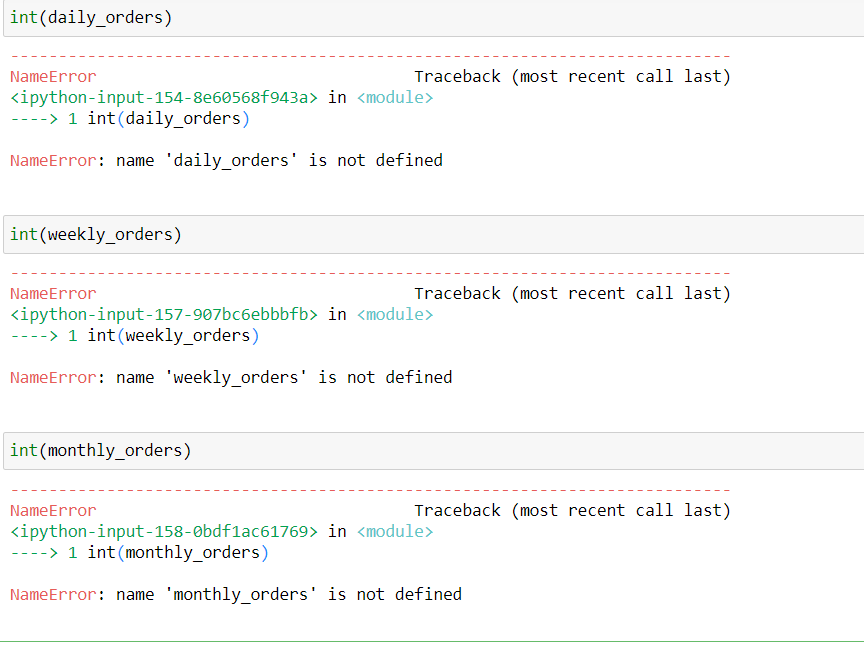

<div class="alert alert-info" role="alert"> V.3 - This mark is provided on all my new comment in current iteration. 
    

    Sorry, i've deleted a few line of code by the accident!
    Fixed! 
</div>

<div class="alert alert-block alert-success">
    <h2>Reviewer's commentary:third iteration of the review <a class="tocSkip"> </h2>
    <br/>
<b>Well done!👍:</b> 
        
Ok, Vadim, the code in these cells still provides the errors on my side, but I can remember when in the first iteration of the review, I see your decision and it was correct. So, I hope you will fix it by yourself I don't want to return the project to you again because of these errors. 

If we compare the number of orders and visits, we find out, that around 15-17% of visits lead to an order. 

<div class="alert alert-block alert-success">
    <h2>Reviewer's commentary <a class="tocSkip"> </h2>
    <br/>
<b>Well done!👍:</b> 
        
Ok, Vadim, you correctly found the number of daily, weekly and monthly orders, keep it up!

<div class="alert alert-block alert-danger">
    <h2>Reviewer's commentary <a class="tocSkip"> </h2>
    <br/>
<b>Needs fixing!🤔:</b>
        
It is also important to find the average number of purchases per customer over 6 months, can you do find it?

<div class="alert alert-info" role="alert">
Sure. Actually we have 12 month data, but we've calculated the average number of purchases per customer over 6 months in the next two cells. 
</div>

In [159]:
six_month_orders = ord[ord['buy_ts'] < np.datetime64('2018-12-01 00:00:00')]
six_month_orders

,buy_ts,revenue,uid,start_ts,first_order_date,order_date,first_order_month,order_month,cohort_lifetime,order_year,order_week
0,2017-06-01 00:10:00,1700,10329302124590727494,2017-06-01 00:10:00,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01,0,2017,22
1,2017-06-01 00:25:00,55,11627257723692907447,2017-06-01 00:25:00,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01,0,2017,22
2,2017-06-01 00:27:00,37,17903680561304213844,2017-06-01 00:27:00,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01,0,2017,22
3,2017-06-01 00:29:00,55,16109239769442553005,2017-06-01 00:29:00,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01,0,2017,22
4,2017-06-01 07:58:00,37,14200605875248379450,2017-06-01 07:58:00,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01,0,2017,22
...,...,...,...,...,...,...,...,...,...,...,...
50409,2018-05-31 23:43:00,367,1805512004303848280,2018-05-31 23:43:00,2018-05-31 23:43:00,2018-05-31,2018-05-01,2018-05-01,0,2018,22
50410,2018-05-31 23:50:00,463,12296626599487328624,2018-05-31 23:50:00,2018-05-31 23:50:00,2018-05-31,2018-05-01,2018-05-01,0,2018,22
50411,2018-05-31 23:50:00,580,11369640365507475976,2018-05-31 23:50:00,2018-05-31 23:50:00,2018-05-31,2018-05-01,2018-05-01,0,2018,22
50412,2018-05-31 23:54:00,30,1786462140797698849,2018-05-31 23:54:00,2018-05-31 23:54:00,2018-05-31,2018-05-01,2018-05-01,0,2018,22


In [160]:
six_month_orders.groupby('uid')['buy_ts'].count().mean()

1.3803734735228081

<div class="alert alert-block alert-success">
    <h2>Reviewer's commentary: second iteration of the review <a class="tocSkip"> </h2>
    <br/>
<b>Well done!👍:</b> 
        
Ok, a very interesting insight from the data!

_What is the average purchase size?_  

If the question was about the average check for all time, not about the average check of each cohort: 

In [161]:
average_order = ord.revenue.mean()
print(average_order)
int(average_order.round())

499.89915499662794


500

Control calculatiton: 

In [162]:
ord.revenue.sum() / len(ord.buy_ts)

499.89915499662794

In [163]:
ord

,buy_ts,revenue,uid,start_ts,first_order_date,order_date,first_order_month,order_month,cohort_lifetime,order_year,order_week
0,2017-06-01 00:10:00,1700,10329302124590727494,2017-06-01 00:10:00,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01,0,2017,22
1,2017-06-01 00:25:00,55,11627257723692907447,2017-06-01 00:25:00,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01,0,2017,22
2,2017-06-01 00:27:00,37,17903680561304213844,2017-06-01 00:27:00,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01,0,2017,22
3,2017-06-01 00:29:00,55,16109239769442553005,2017-06-01 00:29:00,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01,0,2017,22
4,2017-06-01 07:58:00,37,14200605875248379450,2017-06-01 07:58:00,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01,0,2017,22
...,...,...,...,...,...,...,...,...,...,...,...
50409,2018-05-31 23:43:00,367,1805512004303848280,2018-05-31 23:43:00,2018-05-31 23:43:00,2018-05-31,2018-05-01,2018-05-01,0,2018,22
50410,2018-05-31 23:50:00,463,12296626599487328624,2018-05-31 23:50:00,2018-05-31 23:50:00,2018-05-31,2018-05-01,2018-05-01,0,2018,22
50411,2018-05-31 23:50:00,580,11369640365507475976,2018-05-31 23:50:00,2018-05-31 23:50:00,2018-05-31,2018-05-01,2018-05-01,0,2018,22
50412,2018-05-31 23:54:00,30,1786462140797698849,2018-05-31 23:54:00,2018-05-31 23:54:00,2018-05-31,2018-05-01,2018-05-01,0,2018,22


<div class="alert alert-block alert-danger">
    <h2>Reviewer's commentary <a class="tocSkip"> </h2>
    <br/>
<b>Needs fixing!🤔:</b>
        
Vadim, although you tried to calculate the average check, now your results are not correct.
        
To get the correct size of average purchase size you need to calculate the total revenue and then using method mean calculate the average purchase size, so you don't need to identify the average purchase size for days, weeks and months.
        
And it is also important to visualize the year dynamics of the average purchase size.

<div class="alert alert-info" role="alert">
We have deleted the average purchase size for days, weeks and months as far it is not nessesary to have it. 
    
Please note, that the result is in cents, not in dollars! 
    
So I'd say, the results here are correct, it's just in cents, not in dollars. We converted dollars(?) in cents to use int32 instead of float64 to save 50% memory used by corresponding column during the first step. 
   
Please find the folloving code used [in the step 1](#dollars) 
    
    ord['Revenue']=ord['Revenue']*100
    cos['costs']=cos['costs']*100

    ord['Revenue']=ord['Revenue'].astype('int32')
    cos['costs']=cos['costs'].astype('int32')
    
The difference in cents range in some rows can be explained by the fact, that any processor internally handles integers and floats differently. And for sure a processor calculate internally in binar and than aproximate the results in decimal numbers. As a consequence errors in rounding are almost inevitable. 
</div>

<div class="alert alert-block alert-success">
    <h2>Reviewer's commentary: second iteration of the review <a class="tocSkip"> </h2>
    <br/>
<b>Well done!👍:</b> 
        
Ok, thank for explanation, Vadim, I missed this fact previous time, now I see your logic of action more clearly, everything is alright!

_How much money do they bring? (LTV)_

We are going to calculate LTV as we have done this on our platform during theoretical part of the sprint. 

In [164]:
vis.head()

,device,end_ts,source_id,start_ts,uid,session_year,session_month,session_week,session_date,month_,week_,visits_length,first_activity_date
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017,12,51,2017-12-20,2017-12-01,2017-12-14,1080,2017-12-20
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018,2,8,2018-02-19,2018-02-01,2018-02-15,1680,2018-02-19
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017,7,26,2017-07-01,2017-07-01,2017-06-29,0,2017-07-01
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,5,20,2018-05-20,2018-05-01,2018-05-17,1440,2018-03-09
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017,12,52,2017-12-27,2017-12-01,2017-12-21,0,2017-12-27


In [165]:
ord.head()

,buy_ts,revenue,uid,start_ts,first_order_date,order_date,first_order_month,order_month,cohort_lifetime,order_year,order_week
0,2017-06-01 00:10:00,1700,10329302124590727494,2017-06-01 00:10:00,2017-06-01 00:10:00,2017-06-01,2017-06-01,2017-06-01,0,2017,22
1,2017-06-01 00:25:00,55,11627257723692907447,2017-06-01 00:25:00,2017-06-01 00:25:00,2017-06-01,2017-06-01,2017-06-01,0,2017,22
2,2017-06-01 00:27:00,37,17903680561304213844,2017-06-01 00:27:00,2017-06-01 00:27:00,2017-06-01,2017-06-01,2017-06-01,0,2017,22
3,2017-06-01 00:29:00,55,16109239769442553005,2017-06-01 00:29:00,2017-06-01 00:29:00,2017-06-01,2017-06-01,2017-06-01,0,2017,22
4,2017-06-01 07:58:00,37,14200605875248379450,2017-06-01 07:58:00,2017-06-01 07:58:00,2017-06-01,2017-06-01,2017-06-01,0,2017,22


In [166]:
cos.head()

,source_id,dt,costs
0,1,2017-06-01,7520
1,1,2017-06-02,6225
2,1,2017-06-03,3653
3,1,2017-06-04,5500
4,1,2017-06-05,5708


In [167]:
cos['dt'] = pd.to_datetime(cos['dt'])

In [168]:
cos['month'] = cos['dt'].astype('datetime64[M]')

In [169]:
first_orders = ord.groupby('uid').agg({'order_month': 'min'}).reset_index()
first_orders.columns = ['uid', 'first_order_month']
first_orders

,uid,first_order_month
0,313578113262317,2018-01-01
1,1575281904278712,2017-06-01
2,2429014661409475,2017-10-01
3,2464366381792757,2018-01-01
4,2551852515556206,2017-11-01
...,...,...
36517,18445147675727495770,2017-11-01
36518,18445407535914413204,2017-09-01
36519,18445601152732270159,2018-03-01
36520,18446156210226471712,2018-02-01


In [170]:
cohort_sizes = first_orders.groupby('first_order_month').agg({'uid': 'nunique'}).reset_index()
cohort_sizes.columns = ['first_order_month', 'n_buyers']
cohort_sizes.head()

,first_order_month,n_buyers
0,2017-06-01,2023
1,2017-07-01,1923
2,2017-08-01,1370
3,2017-09-01,2581
4,2017-10-01,4340


In [171]:
margin_rate = .5 

We don't know the real magine rate, we just took an average one. (According to our theory lessons.)

In [172]:
orders_ = pd.merge(ord,first_orders, on='uid')


orders_ = orders_.drop(['first_order_month_x'], axis=1)

orders_ = orders_.rename(
    columns={'first_order_month_y': 'first_order_month'}
) 

orders_

,buy_ts,revenue,uid,start_ts,first_order_date,order_date,order_month,cohort_lifetime,order_year,order_week,first_order_month
0,2017-06-01 00:10:00,1700,10329302124590727494,2017-06-01 00:10:00,2017-06-01 00:10:00,2017-06-01,2017-06-01,0,2017,22,2017-06-01
1,2017-06-01 00:25:00,55,11627257723692907447,2017-06-01 00:25:00,2017-06-01 00:25:00,2017-06-01,2017-06-01,0,2017,22,2017-06-01
2,2017-06-01 00:27:00,37,17903680561304213844,2017-06-01 00:27:00,2017-06-01 00:27:00,2017-06-01,2017-06-01,0,2017,22,2017-06-01
3,2017-06-01 00:29:00,55,16109239769442553005,2017-06-01 00:29:00,2017-06-01 00:29:00,2017-06-01,2017-06-01,0,2017,22,2017-06-01
4,2017-06-01 07:58:00,37,14200605875248379450,2017-06-01 07:58:00,2017-06-01 07:58:00,2017-06-01,2017-06-01,0,2017,22,2017-06-01
...,...,...,...,...,...,...,...,...,...,...,...
50409,2018-05-31 23:43:00,367,1805512004303848280,2018-05-31 23:43:00,2018-05-31 23:43:00,2018-05-31,2018-05-01,0,2018,22,2018-05-01
50410,2018-05-31 23:50:00,463,12296626599487328624,2018-05-31 23:50:00,2018-05-31 23:50:00,2018-05-31,2018-05-01,0,2018,22,2018-05-01
50411,2018-05-31 23:50:00,580,11369640365507475976,2018-05-31 23:50:00,2018-05-31 23:50:00,2018-05-31,2018-05-01,0,2018,22,2018-05-01
50412,2018-05-31 23:54:00,30,1786462140797698849,2018-05-31 23:54:00,2018-05-31 23:54:00,2018-05-31,2018-05-01,0,2018,22,2018-05-01


In [173]:
cohorts_ = orders_.groupby(['first_order_month','order_month']).agg({'revenue': 'sum'}).reset_index()
cohorts_

,first_order_month,order_month,revenue
0,2017-06-01,2017-06-01,955518
1,2017-06-01,2017-07-01,98166
2,2017-06-01,2017-08-01,88524
3,2017-06-01,2017-09-01,193114
4,2017-06-01,2017-10-01,206835
...,...,...,...
73,2018-03-01,2018-04-01,106284
74,2018-03-01,2018-05-01,111474
75,2018-04-01,2018-04-01,1059862
76,2018-04-01,2018-05-01,120981


In [174]:
report = pd.merge(cohort_sizes, cohorts_, on='first_order_month')
report

,first_order_month,n_buyers,order_month,revenue
0,2017-06-01,2023,2017-06-01,955518
1,2017-06-01,2023,2017-07-01,98166
2,2017-06-01,2023,2017-08-01,88524
3,2017-06-01,2023,2017-09-01,193114
4,2017-06-01,2023,2017-10-01,206835
...,...,...,...,...
73,2018-03-01,3533,2018-04-01,106284
74,2018-03-01,3533,2018-05-01,111474
75,2018-04-01,2276,2018-04-01,1059862
76,2018-04-01,2276,2018-05-01,120981


<div class="alert alert-block alert-danger">
    <h2>Reviewer's commentary <a class="tocSkip"> </h2>
    <br/>
<b>Needs fixing!🤔:</b>
        
Vadim, I can see your analysis, your logic of actions seem to be correct. But now I can see un your table that you get the number of users bigger than it shoud be and finally your values for the revenue is also bigger than it should be, so the final values for LTV is also incorrect.
      
Before calculating the revenue, you need to create table with these values:
        
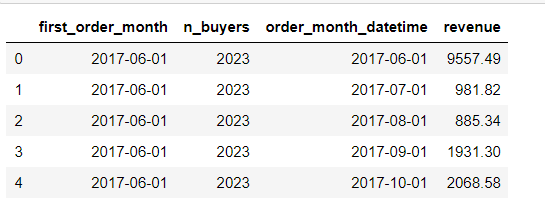
        
Please, try to understand in what moment your actions led to the incorrect results of calculations. 

<div class="alert alert-info" role="alert">
    
Fixed. 
    
I'd say, the results here are correct, it's just in cents, not in dollars.
</div>

<div class="alert alert-block alert-success">
    <h2>Reviewer's commentary: second iteration of the review <a class="tocSkip"> </h2>
    <br/>
<b>Well done!👍:</b> 
        
Ok, now I can see it, good!

In [175]:
report['gp'] = report['revenue'] * margin_rate

In [176]:
report['age'] = (report['order_month'] - report['first_order_month']) / np.timedelta64(1, 'M')

In [177]:
report['age'] = report['age'].round().astype('int')

In [178]:
report['ltv'] = report['gp'] / report['n_buyers']

In [179]:
report

,first_order_month,n_buyers,order_month,revenue,gp,age,ltv
0,2017-06-01,2023,2017-06-01,955518,477759.0,0,236.163618
1,2017-06-01,2023,2017-07-01,98166,49083.0,1,24.262481
2,2017-06-01,2023,2017-08-01,88524,44262.0,2,21.879387
3,2017-06-01,2023,2017-09-01,193114,96557.0,3,47.729609
4,2017-06-01,2023,2017-10-01,206835,103417.5,4,51.120860
...,...,...,...,...,...,...,...
73,2018-03-01,3533,2018-04-01,106284,53142.0,1,15.041608
74,2018-03-01,3533,2018-05-01,111474,55737.0,2,15.776111
75,2018-04-01,2276,2018-04-01,1059862,529931.0,0,232.834359
76,2018-04-01,2276,2018-05-01,120981,60490.5,1,26.577548


In [180]:
result_by_month = report.pivot_table(
    index='first_order_month', 
    columns='age', 
    values='ltv', 
    aggfunc='mean').round()

result_by_month.fillna('')

age,0,1,2,3,4,5,6,7,8,9,10,11
first_order_month,,,,,,,,,,,,
2017-06-01,236.0,24,22,48,51,37,48,29,28,30,29,13
2017-07-01,300.0,17,31,18,9,8,6,7,8,7,8,
2017-08-01,264.0,24,23,20,25,14,11,20,15,9,,
2017-09-01,282.0,56,26,199,20,32,35,12,9,,,
2017-10-01,250.0,27,10,8,8,6,4,6,,,,
2017-11-01,258.0,20,10,16,7,3,6,,,,,
2017-12-01,237.0,13,46,53,16,17,,,,,,
2018-01-01,207.0,15,15,7,3,,,,,,,
2018-02-01,208.0,14,4,4,,,,,,,,


As we know, LTV is the amount of revenue that users generated over time. 

We had all the orders with the info on users' cohort, thus we just group total revenue by cohort and divided the revenue by number of users in cohort. 

The output shows how much money bring every median customer (in our case - per cohort). We can see, that the very first customers(first\_order\_month = 1) spent more, than users, how came later. May be the reason is that very first customers got an attractive marketing offers, which stimulated them to buy more. Or it's just a group of people, who often go to different events. 

<div class="alert alert-info" role="alert">
    
It's a new graph as you wanted. Looks pretty similar to the example one. 
    
Please note the results are in cents, not in dollars!
</div>

<div class="alert alert-block alert-success">
    <h2>Reviewer's commentary: second iteration of the review <a class="tocSkip"> </h2>
    <br/>
<b>Well done!👍:</b> 
        
Ok, see your corrections!

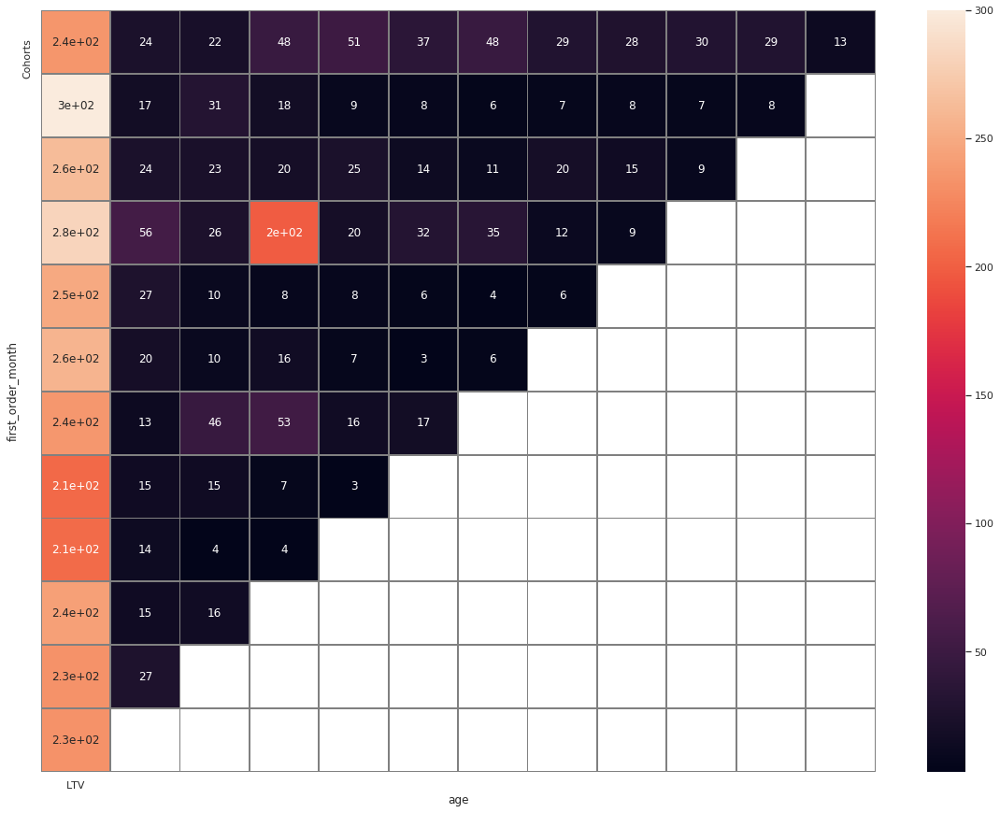

In [181]:
plt.subplots(figsize=(20,15))
sns.heatmap(result_by_month, annot =True, linewidths=1, linecolor = 'grey', xticklabels = ['LTV'] , yticklabels = ['Cohorts']);

<div class="alert alert-block alert-danger">
    <h2>Reviewer's commentary <a class="tocSkip"> </h2>
    <br/>
<b>Needs fixing!🤔:</b>
        
And it is important to build the heatmap here, you need to get the heatmeap for LTV per cohorts like this:
        
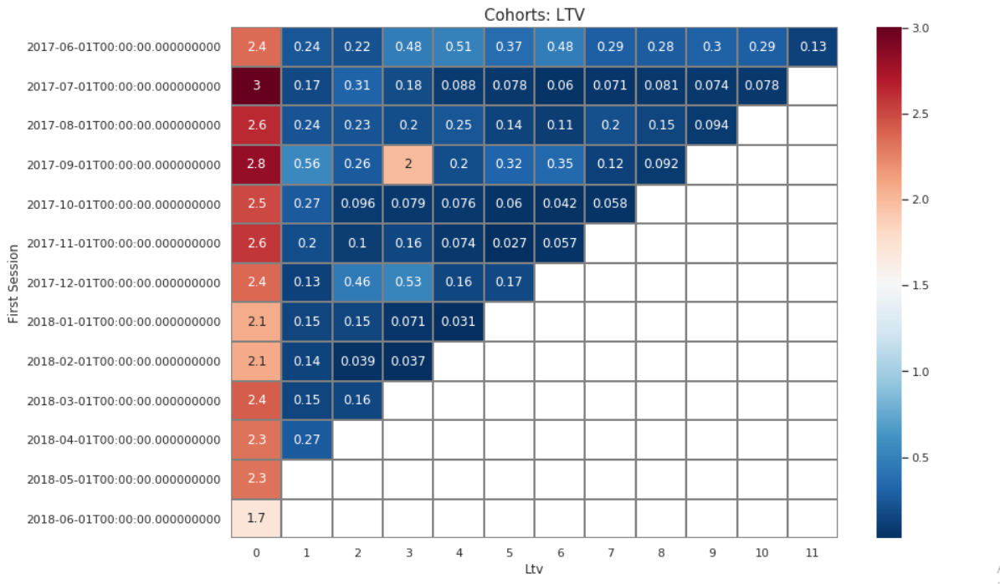

### Marketing
<a class="anchor" id="subsection-2c"></a>

_How much money was spent? Overall:_

In [182]:
cos.costs.sum()

32913018

<div class="alert alert-block alert-danger">
    <h2>Reviewer's commentary <a class="tocSkip"> </h2>
    <br/>
<b>Needs fixing!🤔:</b>
        
Vadim, I cannot understand what is going wrong but at several steps of the analysis you got the incorrect results, you got too big values, and I suppose that the problem can be at the first steps of the analysis where you preprocess the data and maybe at this step you loose something, it feels like there is problem in digits of numbers. The correct result here will look like this:
        
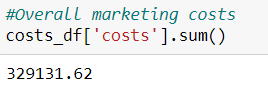
        
And now look at your results.
        
Try to correct your decision and check all your code one more time to find the reasons for this behavior, because at the step of the calculation of the Retention you conduct correct actions, but results in numbers are not correct.

<div class="alert alert-info" role="alert">
    
I'd say, the results here are correct, it's just in cents, not in dollars. 

</div>

<div class="alert alert-block alert-success">
    <h2>Reviewer's commentary: second iteration of the review <a class="tocSkip"> </h2>
    <br/>
<b>Well done!👍:</b> 
        
Ok, got it, thank you!

...per source:

In [183]:
costs_per_source = cos.groupby('source_id').sum().reset_index()
costs_per_source

,source_id,costs
0,1,2083306
1,2,4280581
2,3,14132151
3,4,6107340
4,5,5175694
5,9,551722
6,10,582224


<div class="alert alert-block alert-danger">
    <h2>Reviewer's commentary <a class="tocSkip"> </h2>
    <br/>
<b>Needs fixing!🤔:</b>
        
Too big values for costs per source here, the correct results are:
        
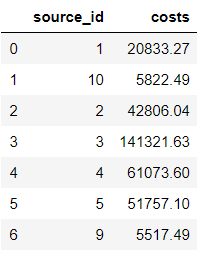

<div class="alert alert-info" role="alert">
    
The same here: the results are correct, it's just in cents, not in dollars. 
    
As mentioned above, the small difference in cents range in some rows can be explained by the fact, that any processor internally handles integers and floats differently. And for sure a processor calculate internally in binar and than aproximate the results in decimal numbers. As a consequence errors in rounding are almost inevitable. 
</div>

<div class="alert alert-block alert-success">
    <h2>Reviewer's commentary: second iteration of the review <a class="tocSkip"> </h2>
    <br/>
<b>Well done!👍:</b> 
        
Ok, understand thank you for explanation again:)

...over time:

In [184]:
cos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2542 entries, 0 to 2541
Data columns (total 4 columns):
source_id    2542 non-null int8
dt           2542 non-null datetime64[ns]
costs        2542 non-null int32
month        2542 non-null datetime64[ns]
dtypes: datetime64[ns](2), int32(1), int8(1)
memory usage: 52.3 KB


In [185]:
costs_monthly = cos.groupby('month').agg({'costs': 'sum'}).reset_index()
costs_monthly

,month,costs
0,2017-06-01,1801482
1,2017-07-01,1824047
2,2017-08-01,1479043
3,2017-09-01,2436882
4,2017-10-01,3632276
5,2017-11-01,3790777
6,2017-12-01,3831527
7,2018-01-01,3351840
8,2018-02-01,3272288
9,2018-03-01,3041513


And the costs per month only: 

In [186]:
costs_monthly.costs

0     1801482
1     1824047
2     1479043
3     2436882
4     3632276
5     3790777
6     3831527
7     3351840
8     3272288
9     3041513
10    2228929
11    2222414
Name: costs, dtype: int32

In [187]:
fig9=go.Figure()

fig9.add_trace(go.Scatter(x=costs_monthly['month'],
                         y=costs_monthly['costs'],
                               mode='lines+markers',
                               name='lines+markers',
                               line=dict(color='purple', width=5)))

fig9.update_xaxes(title_text='Month')
fig9.update_yaxes(title_text='Costs')
fig9.update_layout(title_text="Costs per month:") 
                               
fig9.show()

fig6.show()

It looks like the costs has a strong correlation with number of purchases per month. Both diagrams looks very similar. It is even mor obvious, if we rearrange the the monthly data in the same way: 

In [188]:
fig7=go.Figure()

fig7.add_trace(go.Scatter(x=cos.groupby(cos['dt'].dt.month)['costs'].sum().reset_index()['dt'],
                         y=cos.groupby(cos['dt'].dt.month)['costs'].sum().reset_index()['costs'],
                               mode='lines+markers',
                               name='lines+markers',
                               line=dict(color='purple', width=5)))

fig7.update_xaxes(title_text='Month')
fig7.update_yaxes(title_text='Costs')
fig7.update_layout(title_text="Costs per month:") 
                               
fig7.show()

fig6.show()

_How much did customer acquisition from each of the sources cost?_

The question is about CAC by source. We are going to group total costs by source and divide the costs by the number of users that came from the source. 

In [189]:
users = vis.groupby('source_id').agg({'uid': 'nunique'}).reset_index()
users.columns = ['source_id', 'users']
users

,source_id,users
0,1,18999
1,2,26245
2,3,74756
3,4,83525
4,5,56974
5,6,6
6,7,34
7,9,9264
8,10,8067


In [190]:
costs_per_source

,source_id,costs
0,1,2083306
1,2,4280581
2,3,14132151
3,4,6107340
4,5,5175694
5,9,551722
6,10,582224


In [191]:
users = users.merge(costs_per_source, on = 'source_id', how ='right')
users

,source_id,users,costs
0,1,18999,2083306
1,2,26245,4280581
2,3,74756,14132151
3,4,83525,6107340
4,5,56974,5175694
5,9,9264,551722
6,10,8067,582224


In [192]:
users['CAC_by_source']= users.costs / users.users
users

,source_id,users,costs,CAC_by_source
0,1,18999,2083306,109.653455
1,2,26245,4280581,163.100819
2,3,74756,14132151,189.043702
3,4,83525,6107340,73.119904
4,5,56974,5175694,90.843086
5,9,9264,551722,59.555484
6,10,8067,582224,72.173547


<div class="alert alert-block alert-danger">
    <h2>Reviewer's commentary: second iteration of the review <a class="tocSkip"> </h2>
    <br/>
<b>Needs fixing!🤔:</b> 
        
Vadim, again, the cells above provide errors, can you fix them?
       
Screen of errors:
        
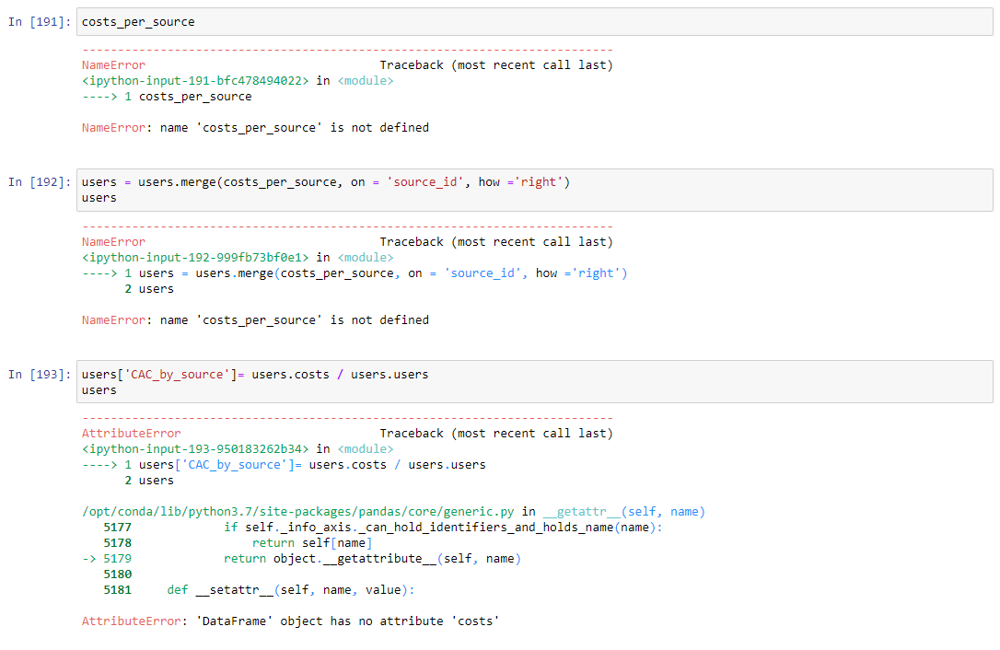

In [193]:
vis['month'] = vis['session_year'].astype(str) +'-' + vis['session_month'].astype(str) + '-01'

vis['month'] = vis['month'].astype('datetime64[ns]')

vis

,device,end_ts,source_id,start_ts,uid,session_year,session_month,session_week,session_date,month_,week_,visits_length,first_activity_date,month
0,touch,2017-12-20 17:38:00,4,2017-12-20 17:20:00,16879256277535980062,2017,12,51,2017-12-20,2017-12-01,2017-12-14,1080,2017-12-20,2017-12-01
1,desktop,2018-02-19 17:21:00,2,2018-02-19 16:53:00,104060357244891740,2018,2,8,2018-02-19,2018-02-01,2018-02-15,1680,2018-02-19,2018-02-01
2,touch,2017-07-01 01:54:00,5,2017-07-01 01:54:00,7459035603376831527,2017,7,26,2017-07-01,2017-07-01,2017-06-29,0,2017-07-01,2017-07-01
3,desktop,2018-05-20 11:23:00,9,2018-05-20 10:59:00,16174680259334210214,2018,5,20,2018-05-20,2018-05-01,2018-05-17,1440,2018-03-09,2018-05-01
4,desktop,2017-12-27 14:06:00,3,2017-12-27 14:06:00,9969694820036681168,2017,12,52,2017-12-27,2017-12-01,2017-12-21,0,2017-12-27,2017-12-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359395,desktop,2017-07-29 19:07:19,2,2017-07-29 19:07:00,18363291481961487539,2017,7,30,2017-07-29,2017-07-01,2017-07-27,19,2017-07-29,2017-07-01
359396,touch,2018-01-25 17:38:19,1,2018-01-25 17:38:00,18370831553019119586,2018,1,4,2018-01-25,2018-01-01,2018-01-25,19,2018-01-25,2018-01-01
359397,desktop,2018-03-03 10:12:19,4,2018-03-03 10:12:00,18387297585500748294,2018,3,9,2018-03-03,2018-03-01,2018-03-01,19,2018-03-03,2018-03-01
359398,desktop,2017-11-02 10:12:19,5,2017-11-02 10:12:00,18388616944624776485,2017,11,44,2017-11-02,2017-11-01,2017-11-02,19,2017-11-02,2017-11-01


In [194]:
nr_users = vis.groupby('month').agg({'uid': 'nunique'}).reset_index()
nr_users.columns = ['month', 'users']
nr_users

,month,users
0,2017-06-01,13259
1,2017-07-01,14183
2,2017-08-01,11631
3,2017-09-01,18975
4,2017-10-01,29692
5,2017-11-01,32797
6,2017-12-01,31557
7,2018-01-01,28716
8,2018-02-01,28749
9,2018-03-01,27473


In [195]:
CAC_by_month = costs_monthly['costs'] / nr_users['users']
CAC_by_month

0     135.868618
1     128.607981
2     127.163872
3     128.425929
4     122.331807
5     115.583041
6     121.416073
7     116.723778
8     113.822672
9     110.709169
10    106.099058
11    107.357809
dtype: float64

Let's see the same data on the graphs: 

In [196]:
fig10=go.Figure()

fig10.add_trace(go.Scatter(x=costs_monthly['month'],
                         y=costs_monthly['costs'],
                               mode='lines+markers',
                               name='markers',
                               line=dict(color='purple', width=5)))

fig10.update_xaxes(title_text='Month')
fig10.update_yaxes(title_text='Costs')
fig10.update_layout(title_text="Costs per month:") 
                               
fig10.show()

During the fall and the winter the service spend more for marketing, acquises more customers and get more clients. Due the seasonality in the spring the line goes down. 

In [197]:
fig8=go.Figure()

fig8.add_trace(go.Scatter(x=cos.groupby(cos['source_id'])['costs'].nunique().reset_index()['source_id'],
                         y=cos.groupby(cos['dt'].dt.month)['costs'].sum().reset_index()['costs'],
                               mode='markers',
                               name='markers',
                               line=dict(color='purple')))

fig8.update_xaxes(title_text='Source')
fig8.update_yaxes(title_text='Costs')
fig8.update_layout(title_text="Total costs per source:") 
                               
fig8.show()

And this graph shows, that the sources 1, 2, 3 are the most expensive. The company does not spent any cent for sources 6-8. 

In [198]:
users

,source_id,users,costs,CAC_by_source
0,1,18999,2083306,109.653455
1,2,26245,4280581,163.100819
2,3,74756,14132151,189.043702
3,4,83525,6107340,73.119904
4,5,56974,5175694,90.843086
5,9,9264,551722,59.555484
6,10,8067,582224,72.173547


<div class="alert alert-block alert-danger">
    <h2>Reviewer's commentary <a class="tocSkip"> </h2>
    <br/>
<b>Needs fixing!🤔:</b>
        
Vadim, again, here you get not a very correct results for CAC. The correct table below
        
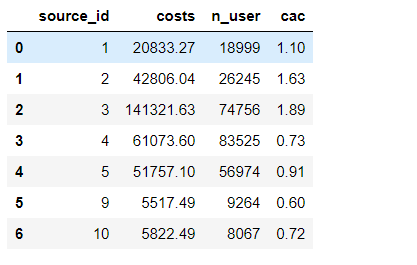
        
So, the algorithm:
        
1) find total cost by source
2) find number of unique users by source (you did it correctly)
3) Merge the tables with total costs by source and number of unique users by source to get marketing cost by source
4) calculate the CAC by dividing costs on number of users.
        
So, please, improve your decision at this step of the analysis.
        


<div class="alert alert-info" role="alert">
    
Again, I'd say, the results here are correct, it's just in cents, not in dollars :-)

</div>

<div class="alert alert-block alert-success">
    <h2>Reviewer's commentary: second iteration of the review <a class="tocSkip"> </h2>
    <br/>
<b>Well done!👍:</b> 
        
Ok!🙌

_How worthwhile where the investments? (ROI)_

According to our theory lessons,  RO(M)I (return on (marketing) investment) = LTV / CAC. Let's calculate it: 

In [199]:
cos['month_'] = cos['month']

In [200]:
cos['month'] = cos['month'].dt.month

In [201]:
cos

,source_id,dt,costs,month,month_
0,1,2017-06-01,7520,6,2017-06-01
1,1,2017-06-02,6225,6,2017-06-01
2,1,2017-06-03,3653,6,2017-06-01
3,1,2017-06-04,5500,6,2017-06-01
4,1,2017-06-05,5708,6,2017-06-01
...,...,...,...,...,...
2537,10,2018-05-27,992,5,2018-05-01
2538,10,2018-05-28,2126,5,2018-05-01
2539,10,2018-05-29,1132,5,2018-05-01
2540,10,2018-05-30,3315,5,2018-05-01


In [202]:
costs_by_source = cos.groupby('source_id')['costs'].sum()

In [203]:
costs_by_source

source_id
1      2083306
2      4280581
3     14132151
4      6107340
5      5175694
9       551722
10      582224
Name: costs, dtype: int32

In [204]:
cos

,source_id,dt,costs,month,month_
0,1,2017-06-01,7520,6,2017-06-01
1,1,2017-06-02,6225,6,2017-06-01
2,1,2017-06-03,3653,6,2017-06-01
3,1,2017-06-04,5500,6,2017-06-01
4,1,2017-06-05,5708,6,2017-06-01
...,...,...,...,...,...
2537,10,2018-05-27,992,5,2018-05-01
2538,10,2018-05-28,2126,5,2018-05-01
2539,10,2018-05-29,1132,5,2018-05-01
2540,10,2018-05-30,3315,5,2018-05-01


In [205]:
monthly_costs = cos.groupby('dt')['costs'].sum()

In [206]:
monthly_costs

dt
2017-06-01     73524
2017-06-02     72119
2017-06-03     45084
2017-06-04     76116
2017-06-05     82144
               ...  
2018-05-27     53287
2018-05-28     61944
2018-05-29     78478
2018-05-30    118300
2018-05-31    215369
Name: costs, Length: 364, dtype: int32

In [207]:
report

,first_order_month,n_buyers,order_month,revenue,gp,age,ltv
0,2017-06-01,2023,2017-06-01,955518,477759.0,0,236.163618
1,2017-06-01,2023,2017-07-01,98166,49083.0,1,24.262481
2,2017-06-01,2023,2017-08-01,88524,44262.0,2,21.879387
3,2017-06-01,2023,2017-09-01,193114,96557.0,3,47.729609
4,2017-06-01,2023,2017-10-01,206835,103417.5,4,51.120860
...,...,...,...,...,...,...,...
73,2018-03-01,3533,2018-04-01,106284,53142.0,1,15.041608
74,2018-03-01,3533,2018-05-01,111474,55737.0,2,15.776111
75,2018-04-01,2276,2018-04-01,1059862,529931.0,0,232.834359
76,2018-04-01,2276,2018-05-01,120981,60490.5,1,26.577548


In [208]:
report_ = pd.merge(report, monthly_costs, left_on='first_order_month', right_on='dt')

In [209]:
report_

,first_order_month,n_buyers,order_month,revenue,gp,age,ltv,costs
0,2017-06-01,2023,2017-06-01,955518,477759.0,0,236.163618,73524
1,2017-06-01,2023,2017-07-01,98166,49083.0,1,24.262481,73524
2,2017-06-01,2023,2017-08-01,88524,44262.0,2,21.879387,73524
3,2017-06-01,2023,2017-09-01,193114,96557.0,3,47.729609,73524
4,2017-06-01,2023,2017-10-01,206835,103417.5,4,51.120860,73524
...,...,...,...,...,...,...,...,...
71,2018-02-01,3651,2018-05-01,27067,13533.5,3,3.706793,137875
72,2018-03-01,3533,2018-03-01,1709339,854669.5,0,241.910416,143728
73,2018-03-01,3533,2018-04-01,106284,53142.0,1,15.041608,143728
74,2018-03-01,3533,2018-05-01,111474,55737.0,2,15.776111,143728


In [210]:
report_['cac'] = report_['costs'] / report_['n_buyers']

In [211]:
report_['romi'] = report_['ltv'] / report_['cac'] 

In [212]:
output = report_.pivot_table(
    index='first_order_month', 
    columns='age', 
    values='romi', 
    aggfunc='mean')

output_ = output.cumsum(axis=1).round(2).fillna('')
output_

age,0,1,2,3,4,5,6,7,8,9,10,11
first_order_month,,,,,,,,,,,,
2017-06-01,6.50,7.17,7.77,9.08,10.49,11.5,12.81,13.61,14.37,15.2,15.99,16.34
2017-07-01,15.28,16.13,17.72,18.63,19.08,19.48,19.79,20.15,20.56,20.93,21.33,
2017-08-01,7.10,7.74,8.35,8.88,9.54,9.93,10.21,10.75,11.15,11.4,,
2017-09-01,13.52,16.2,17.44,26.97,27.93,29.48,31.16,31.74,32.18,,,
2017-10-01,10.47,11.59,11.99,12.32,12.63,12.89,13.06,13.3,,,,
2017-11-01,8.51,9.16,9.49,10.03,10.27,10.36,10.55,,,,,
2017-12-01,9.77,10.31,12.22,14.42,15.06,15.76,,,,,,
2018-01-01,8.12,8.7,9.3,9.58,9.7,,,,,,,
2018-02-01,5.50,5.87,5.98,6.07,,,,,,,,


In [213]:
fig12=px.line(report_,x='age', y='romi',color='first_order_month', labels=dict(age='Cohorts/Months', romi= 'ROI'), title= 'ROI depending on month:')
fig12.show()

The graph (and the corresponding data) looks very sad: the company's costs are significantly higher than its revenues. That's why the ROI is so low in all cohorts. The diagram also shows, that all customers typically purchasing something after the registration (during the first month) and after that very seldom comes back (we've seen this as we calculate the retantion rates). The only exception is the first cohort: this group of customers makes some new orders during the later months(more precisely other cohorts members are making some purchases later, but several times less than the menbers of the first one). As we mentioned earlier, allegedly thу first coohort could get some attractive offers or discounts. 

<div class="alert alert-block alert-danger">
    <h2>Reviewer's commentary <a class="tocSkip"> </h2>
    <br/>
<b>Needs fixing!🤔:</b>
        
Again, because you incorrectly calculated the LTV and CAC you got incorrect result for ROMI too. Plese, try to fix your decision here. And don't forget to visualize the results of the analysis using the heatmap.
        
Tip: as for ROMI, source number 3 looks most expensive and least bringing value, it far doesn't pay off itself.
        


<div class="alert alert-info" role="alert">

</div>

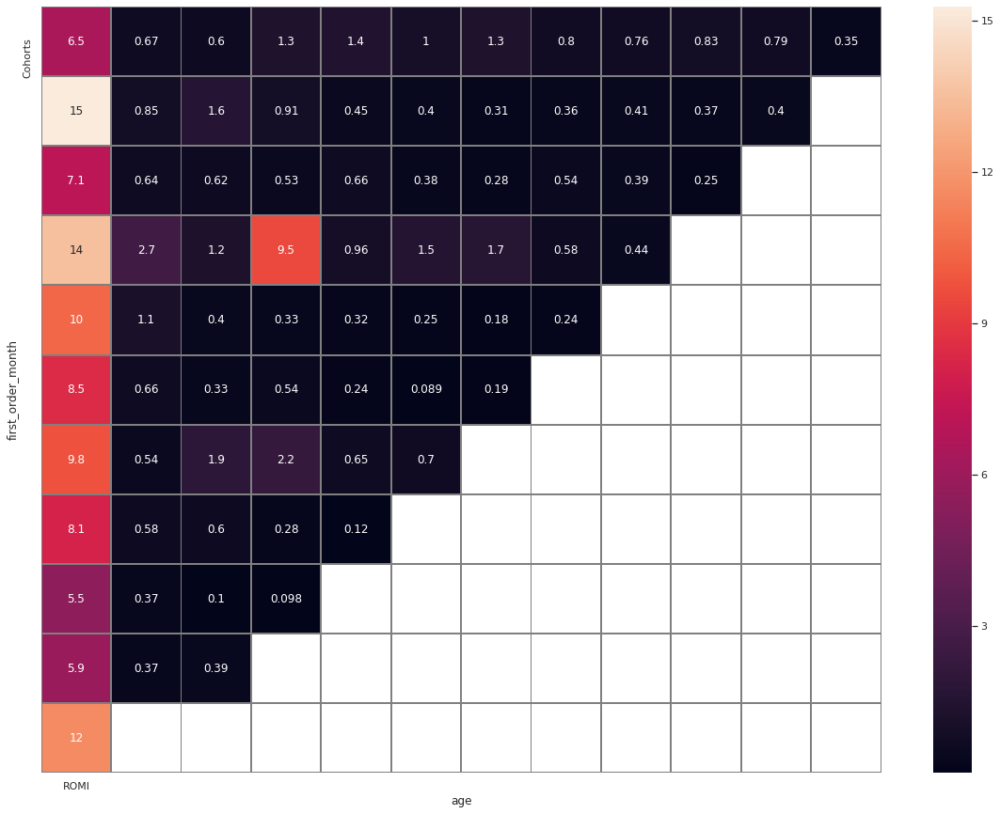

In [214]:
plt.subplots(figsize=(20,15))
sns.heatmap(output, annot =True, linewidths=1, linecolor = 'grey', xticklabels = ['ROMI'] , yticklabels = ['Cohorts']);

<div class="alert alert-block alert-danger">
    <h2>Reviewer's commentary <a class="tocSkip"> </h2>
    <br/>
<b>Needs fixing!🤔:</b>

What is more:
 
you need toccalculate ROMI by source and you need to calculate the general ROMI too. To calculate ROMI without source split we need to first calculate LTV without source split and then merge it with costs by period. The code of general ROMI can be like this:
        
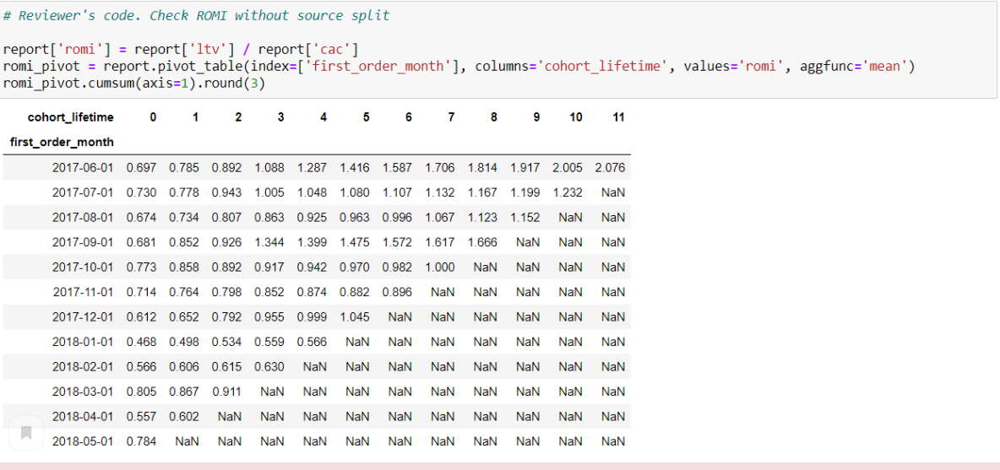
        
And then you can calculate the cohort age
        
And yes, ROMI is different for different sources. To make some correct conclusions about it we:
- calculate LTV (cumulative metric)
- calculate CAC (on costs & n_buyers tables)
- divide them
    
You could mention, that ROMI is different for each source - absolutely! Because of this you can just add something like `.query('source_id==1`) into your code for each of sources and get an excellent result =)
        
ROMI is the cumulative metrics, so don't remember to use cumsum method when you calculate ROMI (in your case - the output table, for this table you need to use cumsum method).

In [215]:
report

,first_order_month,n_buyers,order_month,revenue,gp,age,ltv
0,2017-06-01,2023,2017-06-01,955518,477759.0,0,236.163618
1,2017-06-01,2023,2017-07-01,98166,49083.0,1,24.262481
2,2017-06-01,2023,2017-08-01,88524,44262.0,2,21.879387
3,2017-06-01,2023,2017-09-01,193114,96557.0,3,47.729609
4,2017-06-01,2023,2017-10-01,206835,103417.5,4,51.120860
...,...,...,...,...,...,...,...
73,2018-03-01,3533,2018-04-01,106284,53142.0,1,15.041608
74,2018-03-01,3533,2018-05-01,111474,55737.0,2,15.776111
75,2018-04-01,2276,2018-04-01,1059862,529931.0,0,232.834359
76,2018-04-01,2276,2018-05-01,120981,60490.5,1,26.577548


<div class="alert alert-block alert-success">
    <h2>Reviewer's commentary: second iteration of the review <a class="tocSkip"> </h2>
    <br/>
<b>Well done!👍:</b> 
        
Ok, I suppose the ROMI was also calculated in cents?👀

<div class="alert alert-block alert-success">
    <h2>Reviewer's commentary:third iteration of the review <a class="tocSkip"> </h2>
    <br/>
<b>Well done!👍:</b> 
        
See your corrections, good job!

## Step 3: General conclusion

<a class="anchor" id="conclusion"></a>

We want to emphasize: the data we get for this educational project may be not complete. But according to the data we have, the main conlusion we can draw after completing this project, the Yandex.Afisha makes too much loses and too little revenue.

Something should be done ASAP. One way may be to shut this business down to awoid any further losses.  

If the management wants to save the busuness, a lot of work should be done: first of all, marketing department should find the way to attract customers who already purchase one. As we saw, th retention rate is inexcusably low. Almost all the customers are making only one purchase and does not use the service again. May be there are some problems which occur after the order is done and the customers do not want to make a new purchase; this assumption worth to be prooved. It is also worth checking why the first cohort has the higher purchase rate. If the cohort gets some spetial offers, may be this offers should be extended for other cohorts too. 

<div style="border:solid Chocolate 2px; padding: 40px">

**The overall review conclusion**

Vadim, thank you for submitting your project! I can see that you've worked really hard on it! I'm really impressed this the amount of work you have done. But there are several things in your project which I suppose it is important to fix in order to make your project really ideal! My comments will navigate you!


**Good things and practices in your project I want to highlight🙂**:

* You use different methods for working with your data. It is really great that you can apply these methods on practice, keep it up!
* You worked with the visualization, it is really good that you use plots in your work and formatted them correctly!
* You have formulated conclusions after the each step of the analysis, good job!
* You have correctly calculated the DAU, WAU and MAU, costs per sources, well done!
    
**What is worth working on👀**:

* Most of metrics are calculated incorrectly, it is important to improve the calculations.
* There is a problem or something wrong with numbers' digits. Because of this problem you got not a very correct results for some metrics. Try to understand why is it so.
* Another recommendations you will find in my comments.


**Good luck! I will wait for your work for a second iteration of the review!😉**
![gif](https://media.giphy.com/media/l2QDWFueOGSBjlYnm/giphy.gif)  

<div style="border:solid Chocolate 2px; padding: 40px">

**The overall review conclusion: second iteration of the review**

Vadim, thank you for submitting your project with correction! I can see you progress, you have done a great work this time! But there are still some moments that you need to fix. It is better to pay more attention to the calculation of the retention, and now some cells provide errors. I understand the moment with calculations in cents, everything alright with that! 
    

**Good luck! I will wait for your work for a second iteration of the review!😉**

<div style="border:solid Chocolate 2px; padding: 40px">

**The overall review conclusion: third iteration of the review**

Vadim, thank you for submitting your project with corrections this time! Now everything is alright, I agree with all your corrections and improvements, I can see your progress, you managed to significantly improve your project! 
    
I hasten to say that your project has been accepted and you can proceed to the next sprint!
    
**I wish you exciting and cool projects in the next sprints😉**

![gif](https://media.giphy.com/media/3oKHWikxKFJhjArSXm/giphy.gif)  

### Appendix: Sources

<a class="anchor" id="sources"></a>

Till the very end we did not pay enough attention to sources of traffic and device's kind. We have to perform some additional data handling. 

In [ ]:
vis

In [ ]:
ord

In [ ]:
cos

In [ ]:
cos_sources = cos['source_id']

In [ ]:
vis_sources = vis.groupby('source_id').agg({'start_ts': 'nunique'})

In [ ]:
vis_sources.reset_index()

In [ ]:
vis_sources.columns = ['visits']

In [ ]:
vis_sources = vis_sources.reset_index()

In [ ]:
vis_sources

Let's see how much was spent for the customers aquisition for eech source: 

In [ ]:
cos_sources = cos.groupby('source_id').agg({'costs': 'sum'})

In [ ]:
cos_sources = cos_sources.reset_index()

In [ ]:
cos_sources

In [ ]:
merged_sourses = vis_sources.merge(cos_sources, on='source_id',how='left')

In [ ]:
merged_sourses

In [ ]:
merged_sourses['ratio'] = merged_sourses.visits / merged_sourses.costs

In [ ]:
merged_sourses

In [ ]:
fig88=go.Figure()

fig88.add_trace(go.Scatter(x=merged_sourses.source_id,
                         y=merged_sourses.ratio,
                               mode='markers',
                               name='markers',
                               line=dict(color='red')))

fig88.update_xaxes(title_text='Source')
fig88.update_yaxes(title_text='Ratio')
fig88.update_layout(title_text="Costs per visits for each source:") 
                               
fig88.show()

Thus we can say, that the source nr.3 is the most effecient: it has genereted the most number of visits and the costs of each visit is the lowest. 

The sources nr.nr. 2 and 5 are also efficient, they generated a lot of visits, which were relatively cheap. The recources nr.nr. 9 and 10 are most expensive ones. 

As we know there were no costs for the resources nr.nr. 6 and 7, but they genereded a tiny trafic. 

Thus it would be logical to expand use of sources 3, 2 and 5 as far as it possible. 

In [ ]:
vis_devices = vis.groupby('device').agg({'start_ts': 'nunique'})

In [ ]:
vis_devices

<!DOCTYPE html>
<html>
<head><meta charset="utf-8" />

<title>BA-guideline</title>

<script src="https://cdnjs.cloudflare.com/ajax/libs/require.js/2.1.10/require.min.js"></script>
<script src="https://cdnjs.cloudflare.com/ajax/libs/jquery/2.0.3/jquery.min.js"></script>



<style type="text/css">
    /*!
*
* Twitter Bootstrap
*
*/
/*!
 * Bootstrap v3.3.7 (http://getbootstrap.com)
 * Copyright 2011-2016 Twitter, Inc.
 * Licensed under MIT (https://github.com/twbs/bootstrap/blob/master/LICENSE)
 */
/*! normalize.css v3.0.3 | MIT License | github.com/necolas/normalize.css */
html {
  font-family: sans-serif;
  -ms-text-size-adjust: 100%;
  -webkit-text-size-adjust: 100%;
}
body {
  margin: 0;
}
article,
aside,
details,
figcaption,
figure,
footer,
header,
hgroup,
main,
menu,
nav,
section,
summary {
  display: block;
}
audio,
canvas,
progress,
video {
  display: inline-block;
  vertical-align: baseline;
}
audio:not([controls]) {
  display: none;
  height: 0;
}
[hidden],
template {
  display: none;
}
a {
  background-color: transparent;
}
a:active,
a:hover {
  outline: 0;
}
abbr[title] {
  border-bottom: 1px dotted;
}
b,
strong {
  font-weight: bold;
}
dfn {
  font-style: italic;
}
h1 {
  font-size: 2em;
  margin: 0.67em 0;
}
mark {
  background: #ff0;
  color: #000;
}
small {
  font-size: 80%;
}
sub,
sup {
  font-size: 75%;
  line-height: 0;
  position: relative;
  vertical-align: baseline;
}
sup {
  top: -0.5em;
}
sub {
  bottom: -0.25em;
}
img {
  border: 0;
}
svg:not(:root) {
  overflow: hidden;
}
figure {
  margin: 1em 40px;
}
hr {
  box-sizing: content-box;
  height: 0;
}
pre {
  overflow: auto;
}
code,
kbd,
pre,
samp {
  font-family: monospace, monospace;
  font-size: 1em;
}
button,
input,
optgroup,
select,
textarea {
  color: inherit;
  font: inherit;
  margin: 0;
}
button {
  overflow: visible;
}
button,
select {
  text-transform: none;
}
button,
html input[type="button"],
input[type="reset"],
input[type="submit"] {
  -webkit-appearance: button;
  cursor: pointer;
}
button[disabled],
html input[disabled] {
  cursor: default;
}
button::-moz-focus-inner,
input::-moz-focus-inner {
  border: 0;
  padding: 0;
}
input {
  line-height: normal;
}
input[type="checkbox"],
input[type="radio"] {
  box-sizing: border-box;
  padding: 0;
}
input[type="number"]::-webkit-inner-spin-button,
input[type="number"]::-webkit-outer-spin-button {
  height: auto;
}
input[type="search"] {
  -webkit-appearance: textfield;
  box-sizing: content-box;
}
input[type="search"]::-webkit-search-cancel-button,
input[type="search"]::-webkit-search-decoration {
  -webkit-appearance: none;
}
fieldset {
  border: 1px solid #c0c0c0;
  margin: 0 2px;
  padding: 0.35em 0.625em 0.75em;
}
legend {
  border: 0;
  padding: 0;
}
textarea {
  overflow: auto;
}
optgroup {
  font-weight: bold;
}
table {
  border-collapse: collapse;
  border-spacing: 0;
}
td,
th {
  padding: 0;
}
/*! Source: https://github.com/h5bp/html5-boilerplate/blob/master/src/css/main.css */
@media print {
  *,
  *:before,
  *:after {
    background: transparent !important;
    box-shadow: none !important;
    text-shadow: none !important;
  }
  a,
  a:visited {
    text-decoration: underline;
  }
  a[href]:after {
    content: " (" attr(href) ")";
  }
  abbr[title]:after {
    content: " (" attr(title) ")";
  }
  a[href^="#"]:after,
  a[href^="javascript:"]:after {
    content: "";
  }
  pre,
  blockquote {
    border: 1px solid #999;
    page-break-inside: avoid;
  }
  thead {
    display: table-header-group;
  }
  tr,
  img {
    page-break-inside: avoid;
  }
  img {
    max-width: 100% !important;
  }
  p,
  h2,
  h3 {
    orphans: 3;
    widows: 3;
  }
  h2,
  h3 {
    page-break-after: avoid;
  }
  .navbar {
    display: none;
  }
  .btn > .caret,
  .dropup > .btn > .caret {
    border-top-color: #000 !important;
  }
  .label {
    border: 1px solid #000;
  }
  .table {
    border-collapse: collapse !important;
  }
  .table td,
  .table th {
    background-color: #fff !important;
  }
  .table-bordered th,
  .table-bordered td {
    border: 1px solid #ddd !important;
  }
}
@font-face {
  font-family: 'Glyphicons Halflings';
  src: url('../components/bootstrap/fonts/glyphicons-halflings-regular.eot');
  src: url('../components/bootstrap/fonts/glyphicons-halflings-regular.eot?#iefix') format('embedded-opentype'), url('../components/bootstrap/fonts/glyphicons-halflings-regular.woff2') format('woff2'), url('../components/bootstrap/fonts/glyphicons-halflings-regular.woff') format('woff'), url('../components/bootstrap/fonts/glyphicons-halflings-regular.ttf') format('truetype'), url('../components/bootstrap/fonts/glyphicons-halflings-regular.svg#glyphicons_halflingsregular') format('svg');
}
.glyphicon {
  position: relative;
  top: 1px;
  display: inline-block;
  font-family: 'Glyphicons Halflings';
  font-style: normal;
  font-weight: normal;
  line-height: 1;
  -webkit-font-smoothing: antialiased;
  -moz-osx-font-smoothing: grayscale;
}
.glyphicon-asterisk:before {
  content: "\002a";
}
.glyphicon-plus:before {
  content: "\002b";
}
.glyphicon-euro:before,
.glyphicon-eur:before {
  content: "\20ac";
}
.glyphicon-minus:before {
  content: "\2212";
}
.glyphicon-cloud:before {
  content: "\2601";
}
.glyphicon-envelope:before {
  content: "\2709";
}
.glyphicon-pencil:before {
  content: "\270f";
}
.glyphicon-glass:before {
  content: "\e001";
}
.glyphicon-music:before {
  content: "\e002";
}
.glyphicon-search:before {
  content: "\e003";
}
.glyphicon-heart:before {
  content: "\e005";
}
.glyphicon-star:before {
  content: "\e006";
}
.glyphicon-star-empty:before {
  content: "\e007";
}
.glyphicon-user:before {
  content: "\e008";
}
.glyphicon-film:before {
  content: "\e009";
}
.glyphicon-th-large:before {
  content: "\e010";
}
.glyphicon-th:before {
  content: "\e011";
}
.glyphicon-th-list:before {
  content: "\e012";
}
.glyphicon-ok:before {
  content: "\e013";
}
.glyphicon-remove:before {
  content: "\e014";
}
.glyphicon-zoom-in:before {
  content: "\e015";
}
.glyphicon-zoom-out:before {
  content: "\e016";
}
.glyphicon-off:before {
  content: "\e017";
}
.glyphicon-signal:before {
  content: "\e018";
}
.glyphicon-cog:before {
  content: "\e019";
}
.glyphicon-trash:before {
  content: "\e020";
}
.glyphicon-home:before {
  content: "\e021";
}
.glyphicon-file:before {
  content: "\e022";
}
.glyphicon-time:before {
  content: "\e023";
}
.glyphicon-road:before {
  content: "\e024";
}
.glyphicon-download-alt:before {
  content: "\e025";
}
.glyphicon-download:before {
  content: "\e026";
}
.glyphicon-upload:before {
  content: "\e027";
}
.glyphicon-inbox:before {
  content: "\e028";
}
.glyphicon-play-circle:before {
  content: "\e029";
}
.glyphicon-repeat:before {
  content: "\e030";
}
.glyphicon-refresh:before {
  content: "\e031";
}
.glyphicon-list-alt:before {
  content: "\e032";
}
.glyphicon-lock:before {
  content: "\e033";
}
.glyphicon-flag:before {
  content: "\e034";
}
.glyphicon-headphones:before {
  content: "\e035";
}
.glyphicon-volume-off:before {
  content: "\e036";
}
.glyphicon-volume-down:before {
  content: "\e037";
}
.glyphicon-volume-up:before {
  content: "\e038";
}
.glyphicon-qrcode:before {
  content: "\e039";
}
.glyphicon-barcode:before {
  content: "\e040";
}
.glyphicon-tag:before {
  content: "\e041";
}
.glyphicon-tags:before {
  content: "\e042";
}
.glyphicon-book:before {
  content: "\e043";
}
.glyphicon-bookmark:before {
  content: "\e044";
}
.glyphicon-print:before {
  content: "\e045";
}
.glyphicon-camera:before {
  content: "\e046";
}
.glyphicon-font:before {
  content: "\e047";
}
.glyphicon-bold:before {
  content: "\e048";
}
.glyphicon-italic:before {
  content: "\e049";
}
.glyphicon-text-height:before {
  content: "\e050";
}
.glyphicon-text-width:before {
  content: "\e051";
}
.glyphicon-align-left:before {
  content: "\e052";
}
.glyphicon-align-center:before {
  content: "\e053";
}
.glyphicon-align-right:before {
  content: "\e054";
}
.glyphicon-align-justify:before {
  content: "\e055";
}
.glyphicon-list:before {
  content: "\e056";
}
.glyphicon-indent-left:before {
  content: "\e057";
}
.glyphicon-indent-right:before {
  content: "\e058";
}
.glyphicon-facetime-video:before {
  content: "\e059";
}
.glyphicon-picture:before {
  content: "\e060";
}
.glyphicon-map-marker:before {
  content: "\e062";
}
.glyphicon-adjust:before {
  content: "\e063";
}
.glyphicon-tint:before {
  content: "\e064";
}
.glyphicon-edit:before {
  content: "\e065";
}
.glyphicon-share:before {
  content: "\e066";
}
.glyphicon-check:before {
  content: "\e067";
}
.glyphicon-move:before {
  content: "\e068";
}
.glyphicon-step-backward:before {
  content: "\e069";
}
.glyphicon-fast-backward:before {
  content: "\e070";
}
.glyphicon-backward:before {
  content: "\e071";
}
.glyphicon-play:before {
  content: "\e072";
}
.glyphicon-pause:before {
  content: "\e073";
}
.glyphicon-stop:before {
  content: "\e074";
}
.glyphicon-forward:before {
  content: "\e075";
}
.glyphicon-fast-forward:before {
  content: "\e076";
}
.glyphicon-step-forward:before {
  content: "\e077";
}
.glyphicon-eject:before {
  content: "\e078";
}
.glyphicon-chevron-left:before {
  content: "\e079";
}
.glyphicon-chevron-right:before {
  content: "\e080";
}
.glyphicon-plus-sign:before {
  content: "\e081";
}
.glyphicon-minus-sign:before {
  content: "\e082";
}
.glyphicon-remove-sign:before {
  content: "\e083";
}
.glyphicon-ok-sign:before {
  content: "\e084";
}
.glyphicon-question-sign:before {
  content: "\e085";
}
.glyphicon-info-sign:before {
  content: "\e086";
}
.glyphicon-screenshot:before {
  content: "\e087";
}
.glyphicon-remove-circle:before {
  content: "\e088";
}
.glyphicon-ok-circle:before {
  content: "\e089";
}
.glyphicon-ban-circle:before {
  content: "\e090";
}
.glyphicon-arrow-left:before {
  content: "\e091";
}
.glyphicon-arrow-right:before {
  content: "\e092";
}
.glyphicon-arrow-up:before {
  content: "\e093";
}
.glyphicon-arrow-down:before {
  content: "\e094";
}
.glyphicon-share-alt:before {
  content: "\e095";
}
.glyphicon-resize-full:before {
  content: "\e096";
}
.glyphicon-resize-small:before {
  content: "\e097";
}
.glyphicon-exclamation-sign:before {
  content: "\e101";
}
.glyphicon-gift:before {
  content: "\e102";
}
.glyphicon-leaf:before {
  content: "\e103";
}
.glyphicon-fire:before {
  content: "\e104";
}
.glyphicon-eye-open:before {
  content: "\e105";
}
.glyphicon-eye-close:before {
  content: "\e106";
}
.glyphicon-warning-sign:before {
  content: "\e107";
}
.glyphicon-plane:before {
  content: "\e108";
}
.glyphicon-calendar:before {
  content: "\e109";
}
.glyphicon-random:before {
  content: "\e110";
}
.glyphicon-comment:before {
  content: "\e111";
}
.glyphicon-magnet:before {
  content: "\e112";
}
.glyphicon-chevron-up:before {
  content: "\e113";
}
.glyphicon-chevron-down:before {
  content: "\e114";
}
.glyphicon-retweet:before {
  content: "\e115";
}
.glyphicon-shopping-cart:before {
  content: "\e116";
}
.glyphicon-folder-close:before {
  content: "\e117";
}
.glyphicon-folder-open:before {
  content: "\e118";
}
.glyphicon-resize-vertical:before {
  content: "\e119";
}
.glyphicon-resize-horizontal:before {
  content: "\e120";
}
.glyphicon-hdd:before {
  content: "\e121";
}
.glyphicon-bullhorn:before {
  content: "\e122";
}
.glyphicon-bell:before {
  content: "\e123";
}
.glyphicon-certificate:before {
  content: "\e124";
}
.glyphicon-thumbs-up:before {
  content: "\e125";
}
.glyphicon-thumbs-down:before {
  content: "\e126";
}
.glyphicon-hand-right:before {
  content: "\e127";
}
.glyphicon-hand-left:before {
  content: "\e128";
}
.glyphicon-hand-up:before {
  content: "\e129";
}
.glyphicon-hand-down:before {
  content: "\e130";
}
.glyphicon-circle-arrow-right:before {
  content: "\e131";
}
.glyphicon-circle-arrow-left:before {
  content: "\e132";
}
.glyphicon-circle-arrow-up:before {
  content: "\e133";
}
.glyphicon-circle-arrow-down:before {
  content: "\e134";
}
.glyphicon-globe:before {
  content: "\e135";
}
.glyphicon-wrench:before {
  content: "\e136";
}
.glyphicon-tasks:before {
  content: "\e137";
}
.glyphicon-filter:before {
  content: "\e138";
}
.glyphicon-briefcase:before {
  content: "\e139";
}
.glyphicon-fullscreen:before {
  content: "\e140";
}
.glyphicon-dashboard:before {
  content: "\e141";
}
.glyphicon-paperclip:before {
  content: "\e142";
}
.glyphicon-heart-empty:before {
  content: "\e143";
}
.glyphicon-link:before {
  content: "\e144";
}
.glyphicon-phone:before {
  content: "\e145";
}
.glyphicon-pushpin:before {
  content: "\e146";
}
.glyphicon-usd:before {
  content: "\e148";
}
.glyphicon-gbp:before {
  content: "\e149";
}
.glyphicon-sort:before {
  content: "\e150";
}
.glyphicon-sort-by-alphabet:before {
  content: "\e151";
}
.glyphicon-sort-by-alphabet-alt:before {
  content: "\e152";
}
.glyphicon-sort-by-order:before {
  content: "\e153";
}
.glyphicon-sort-by-order-alt:before {
  content: "\e154";
}
.glyphicon-sort-by-attributes:before {
  content: "\e155";
}
.glyphicon-sort-by-attributes-alt:before {
  content: "\e156";
}
.glyphicon-unchecked:before {
  content: "\e157";
}
.glyphicon-expand:before {
  content: "\e158";
}
.glyphicon-collapse-down:before {
  content: "\e159";
}
.glyphicon-collapse-up:before {
  content: "\e160";
}
.glyphicon-log-in:before {
  content: "\e161";
}
.glyphicon-flash:before {
  content: "\e162";
}
.glyphicon-log-out:before {
  content: "\e163";
}
.glyphicon-new-window:before {
  content: "\e164";
}
.glyphicon-record:before {
  content: "\e165";
}
.glyphicon-save:before {
  content: "\e166";
}
.glyphicon-open:before {
  content: "\e167";
}
.glyphicon-saved:before {
  content: "\e168";
}
.glyphicon-import:before {
  content: "\e169";
}
.glyphicon-export:before {
  content: "\e170";
}
.glyphicon-send:before {
  content: "\e171";
}
.glyphicon-floppy-disk:before {
  content: "\e172";
}
.glyphicon-floppy-saved:before {
  content: "\e173";
}
.glyphicon-floppy-remove:before {
  content: "\e174";
}
.glyphicon-floppy-save:before {
  content: "\e175";
}
.glyphicon-floppy-open:before {
  content: "\e176";
}
.glyphicon-credit-card:before {
  content: "\e177";
}
.glyphicon-transfer:before {
  content: "\e178";
}
.glyphicon-cutlery:before {
  content: "\e179";
}
.glyphicon-header:before {
  content: "\e180";
}
.glyphicon-compressed:before {
  content: "\e181";
}
.glyphicon-earphone:before {
  content: "\e182";
}
.glyphicon-phone-alt:before {
  content: "\e183";
}
.glyphicon-tower:before {
  content: "\e184";
}
.glyphicon-stats:before {
  content: "\e185";
}
.glyphicon-sd-video:before {
  content: "\e186";
}
.glyphicon-hd-video:before {
  content: "\e187";
}
.glyphicon-subtitles:before {
  content: "\e188";
}
.glyphicon-sound-stereo:before {
  content: "\e189";
}
.glyphicon-sound-dolby:before {
  content: "\e190";
}
.glyphicon-sound-5-1:before {
  content: "\e191";
}
.glyphicon-sound-6-1:before {
  content: "\e192";
}
.glyphicon-sound-7-1:before {
  content: "\e193";
}
.glyphicon-copyright-mark:before {
  content: "\e194";
}
.glyphicon-registration-mark:before {
  content: "\e195";
}
.glyphicon-cloud-download:before {
  content: "\e197";
}
.glyphicon-cloud-upload:before {
  content: "\e198";
}
.glyphicon-tree-conifer:before {
  content: "\e199";
}
.glyphicon-tree-deciduous:before {
  content: "\e200";
}
.glyphicon-cd:before {
  content: "\e201";
}
.glyphicon-save-file:before {
  content: "\e202";
}
.glyphicon-open-file:before {
  content: "\e203";
}
.glyphicon-level-up:before {
  content: "\e204";
}
.glyphicon-copy:before {
  content: "\e205";
}
.glyphicon-paste:before {
  content: "\e206";
}
.glyphicon-alert:before {
  content: "\e209";
}
.glyphicon-equalizer:before {
  content: "\e210";
}
.glyphicon-king:before {
  content: "\e211";
}
.glyphicon-queen:before {
  content: "\e212";
}
.glyphicon-pawn:before {
  content: "\e213";
}
.glyphicon-bishop:before {
  content: "\e214";
}
.glyphicon-knight:before {
  content: "\e215";
}
.glyphicon-baby-formula:before {
  content: "\e216";
}
.glyphicon-tent:before {
  content: "\26fa";
}
.glyphicon-blackboard:before {
  content: "\e218";
}
.glyphicon-bed:before {
  content: "\e219";
}
.glyphicon-apple:before {
  content: "\f8ff";
}
.glyphicon-erase:before {
  content: "\e221";
}
.glyphicon-hourglass:before {
  content: "\231b";
}
.glyphicon-lamp:before {
  content: "\e223";
}
.glyphicon-duplicate:before {
  content: "\e224";
}
.glyphicon-piggy-bank:before {
  content: "\e225";
}
.glyphicon-scissors:before {
  content: "\e226";
}
.glyphicon-bitcoin:before {
  content: "\e227";
}
.glyphicon-btc:before {
  content: "\e227";
}
.glyphicon-xbt:before {
  content: "\e227";
}
.glyphicon-yen:before {
  content: "\00a5";
}
.glyphicon-jpy:before {
  content: "\00a5";
}
.glyphicon-ruble:before {
  content: "\20bd";
}
.glyphicon-rub:before {
  content: "\20bd";
}
.glyphicon-scale:before {
  content: "\e230";
}
.glyphicon-ice-lolly:before {
  content: "\e231";
}
.glyphicon-ice-lolly-tasted:before {
  content: "\e232";
}
.glyphicon-education:before {
  content: "\e233";
}
.glyphicon-option-horizontal:before {
  content: "\e234";
}
.glyphicon-option-vertical:before {
  content: "\e235";
}
.glyphicon-menu-hamburger:before {
  content: "\e236";
}
.glyphicon-modal-window:before {
  content: "\e237";
}
.glyphicon-oil:before {
  content: "\e238";
}
.glyphicon-grain:before {
  content: "\e239";
}
.glyphicon-sunglasses:before {
  content: "\e240";
}
.glyphicon-text-size:before {
  content: "\e241";
}
.glyphicon-text-color:before {
  content: "\e242";
}
.glyphicon-text-background:before {
  content: "\e243";
}
.glyphicon-object-align-top:before {
  content: "\e244";
}
.glyphicon-object-align-bottom:before {
  content: "\e245";
}
.glyphicon-object-align-horizontal:before {
  content: "\e246";
}
.glyphicon-object-align-left:before {
  content: "\e247";
}
.glyphicon-object-align-vertical:before {
  content: "\e248";
}
.glyphicon-object-align-right:before {
  content: "\e249";
}
.glyphicon-triangle-right:before {
  content: "\e250";
}
.glyphicon-triangle-left:before {
  content: "\e251";
}
.glyphicon-triangle-bottom:before {
  content: "\e252";
}
.glyphicon-triangle-top:before {
  content: "\e253";
}
.glyphicon-console:before {
  content: "\e254";
}
.glyphicon-superscript:before {
  content: "\e255";
}
.glyphicon-subscript:before {
  content: "\e256";
}
.glyphicon-menu-left:before {
  content: "\e257";
}
.glyphicon-menu-right:before {
  content: "\e258";
}
.glyphicon-menu-down:before {
  content: "\e259";
}
.glyphicon-menu-up:before {
  content: "\e260";
}
* {
  -webkit-box-sizing: border-box;
  -moz-box-sizing: border-box;
  box-sizing: border-box;
}
*:before,
*:after {
  -webkit-box-sizing: border-box;
  -moz-box-sizing: border-box;
  box-sizing: border-box;
}
html {
  font-size: 10px;
  -webkit-tap-highlight-color: rgba(0, 0, 0, 0);
}
body {
  font-family: "Helvetica Neue", Helvetica, Arial, sans-serif;
  font-size: 13px;
  line-height: 1.42857143;
  color: #000;
  background-color: #fff;
}
input,
button,
select,
textarea {
  font-family: inherit;
  font-size: inherit;
  line-height: inherit;
}
a {
  color: #337ab7;
  text-decoration: none;
}
a:hover,
a:focus {
  color: #23527c;
  text-decoration: underline;
}
a:focus {
  outline: 5px auto -webkit-focus-ring-color;
  outline-offset: -2px;
}
figure {
  margin: 0;
}
img {
  vertical-align: middle;
}
.img-responsive,
.thumbnail > img,
.thumbnail a > img,
.carousel-inner > .item > img,
.carousel-inner > .item > a > img {
  display: block;
  max-width: 100%;
  height: auto;
}
.img-rounded {
  border-radius: 3px;
}
.img-thumbnail {
  padding: 4px;
  line-height: 1.42857143;
  background-color: #fff;
  border: 1px solid #ddd;
  border-radius: 2px;
  -webkit-transition: all 0.2s ease-in-out;
  -o-transition: all 0.2s ease-in-out;
  transition: all 0.2s ease-in-out;
  display: inline-block;
  max-width: 100%;
  height: auto;
}
.img-circle {
  border-radius: 50%;
}
hr {
  margin-top: 18px;
  margin-bottom: 18px;
  border: 0;
  border-top: 1px solid #eeeeee;
}
.sr-only {
  position: absolute;
  width: 1px;
  height: 1px;
  margin: -1px;
  padding: 0;
  overflow: hidden;
  clip: rect(0, 0, 0, 0);
  border: 0;
}
.sr-only-focusable:active,
.sr-only-focusable:focus {
  position: static;
  width: auto;
  height: auto;
  margin: 0;
  overflow: visible;
  clip: auto;
}
[role="button"] {
  cursor: pointer;
}
h1,
h2,
h3,
h4,
h5,
h6,
.h1,
.h2,
.h3,
.h4,
.h5,
.h6 {
  font-family: inherit;
  font-weight: 500;
  line-height: 1.1;
  color: inherit;
}
h1 small,
h2 small,
h3 small,
h4 small,
h5 small,
h6 small,
.h1 small,
.h2 small,
.h3 small,
.h4 small,
.h5 small,
.h6 small,
h1 .small,
h2 .small,
h3 .small,
h4 .small,
h5 .small,
h6 .small,
.h1 .small,
.h2 .small,
.h3 .small,
.h4 .small,
.h5 .small,
.h6 .small {
  font-weight: normal;
  line-height: 1;
  color: #777777;
}
h1,
.h1,
h2,
.h2,
h3,
.h3 {
  margin-top: 18px;
  margin-bottom: 9px;
}
h1 small,
.h1 small,
h2 small,
.h2 small,
h3 small,
.h3 small,
h1 .small,
.h1 .small,
h2 .small,
.h2 .small,
h3 .small,
.h3 .small {
  font-size: 65%;
}
h4,
.h4,
h5,
.h5,
h6,
.h6 {
  margin-top: 9px;
  margin-bottom: 9px;
}
h4 small,
.h4 small,
h5 small,
.h5 small,
h6 small,
.h6 small,
h4 .small,
.h4 .small,
h5 .small,
.h5 .small,
h6 .small,
.h6 .small {
  font-size: 75%;
}
h1,
.h1 {
  font-size: 33px;
}
h2,
.h2 {
  font-size: 27px;
}
h3,
.h3 {
  font-size: 23px;
}
h4,
.h4 {
  font-size: 17px;
}
h5,
.h5 {
  font-size: 13px;
}
h6,
.h6 {
  font-size: 12px;
}
p {
  margin: 0 0 9px;
}
.lead {
  margin-bottom: 18px;
  font-size: 14px;
  font-weight: 300;
  line-height: 1.4;
}
@media (min-width: 768px) {
  .lead {
    font-size: 19.5px;
  }
}
small,
.small {
  font-size: 92%;
}
mark,
.mark {
  background-color: #fcf8e3;
  padding: .2em;
}
.text-left {
  text-align: left;
}
.text-right {
  text-align: right;
}
.text-center {
  text-align: center;
}
.text-justify {
  text-align: justify;
}
.text-nowrap {
  white-space: nowrap;
}
.text-lowercase {
  text-transform: lowercase;
}
.text-uppercase {
  text-transform: uppercase;
}
.text-capitalize {
  text-transform: capitalize;
}
.text-muted {
  color: #777777;
}
.text-primary {
  color: #337ab7;
}
a.text-primary:hover,
a.text-primary:focus {
  color: #286090;
}
.text-success {
  color: #3c763d;
}
a.text-success:hover,
a.text-success:focus {
  color: #2b542c;
}
.text-info {
  color: #31708f;
}
a.text-info:hover,
a.text-info:focus {
  color: #245269;
}
.text-warning {
  color: #8a6d3b;
}
a.text-warning:hover,
a.text-warning:focus {
  color: #66512c;
}
.text-danger {
  color: #a94442;
}
a.text-danger:hover,
a.text-danger:focus {
  color: #843534;
}
.bg-primary {
  color: #fff;
  background-color: #337ab7;
}
a.bg-primary:hover,
a.bg-primary:focus {
  background-color: #286090;
}
.bg-success {
  background-color: #dff0d8;
}
a.bg-success:hover,
a.bg-success:focus {
  background-color: #c1e2b3;
}
.bg-info {
  background-color: #d9edf7;
}
a.bg-info:hover,
a.bg-info:focus {
  background-color: #afd9ee;
}
.bg-warning {
  background-color: #fcf8e3;
}
a.bg-warning:hover,
a.bg-warning:focus {
  background-color: #f7ecb5;
}
.bg-danger {
  background-color: #f2dede;
}
a.bg-danger:hover,
a.bg-danger:focus {
  background-color: #e4b9b9;
}
.page-header {
  padding-bottom: 8px;
  margin: 36px 0 18px;
  border-bottom: 1px solid #eeeeee;
}
ul,
ol {
  margin-top: 0;
  margin-bottom: 9px;
}
ul ul,
ol ul,
ul ol,
ol ol {
  margin-bottom: 0;
}
.list-unstyled {
  padding-left: 0;
  list-style: none;
}
.list-inline {
  padding-left: 0;
  list-style: none;
  margin-left: -5px;
}
.list-inline > li {
  display: inline-block;
  padding-left: 5px;
  padding-right: 5px;
}
dl {
  margin-top: 0;
  margin-bottom: 18px;
}
dt,
dd {
  line-height: 1.42857143;
}
dt {
  font-weight: bold;
}
dd {
  margin-left: 0;
}
@media (min-width: 541px) {
  .dl-horizontal dt {
    float: left;
    width: 160px;
    clear: left;
    text-align: right;
    overflow: hidden;
    text-overflow: ellipsis;
    white-space: nowrap;
  }
  .dl-horizontal dd {
    margin-left: 180px;
  }
}
abbr[title],
abbr[data-original-title] {
  cursor: help;
  border-bottom: 1px dotted #777777;
}
.initialism {
  font-size: 90%;
  text-transform: uppercase;
}
blockquote {
  padding: 9px 18px;
  margin: 0 0 18px;
  font-size: inherit;
  border-left: 5px solid #eeeeee;
}
blockquote p:last-child,
blockquote ul:last-child,
blockquote ol:last-child {
  margin-bottom: 0;
}
blockquote footer,
blockquote small,
blockquote .small {
  display: block;
  font-size: 80%;
  line-height: 1.42857143;
  color: #777777;
}
blockquote footer:before,
blockquote small:before,
blockquote .small:before {
  content: '\2014 \00A0';
}
.blockquote-reverse,
blockquote.pull-right {
  padding-right: 15px;
  padding-left: 0;
  border-right: 5px solid #eeeeee;
  border-left: 0;
  text-align: right;
}
.blockquote-reverse footer:before,
blockquote.pull-right footer:before,
.blockquote-reverse small:before,
blockquote.pull-right small:before,
.blockquote-reverse .small:before,
blockquote.pull-right .small:before {
  content: '';
}
.blockquote-reverse footer:after,
blockquote.pull-right footer:after,
.blockquote-reverse small:after,
blockquote.pull-right small:after,
.blockquote-reverse .small:after,
blockquote.pull-right .small:after {
  content: '\00A0 \2014';
}
address {
  margin-bottom: 18px;
  font-style: normal;
  line-height: 1.42857143;
}
code,
kbd,
pre,
samp {
  font-family: monospace;
}
code {
  padding: 2px 4px;
  font-size: 90%;
  color: #c7254e;
  background-color: #f9f2f4;
  border-radius: 2px;
}
kbd {
  padding: 2px 4px;
  font-size: 90%;
  color: #888;
  background-color: transparent;
  border-radius: 1px;
  box-shadow: inset 0 -1px 0 rgba(0, 0, 0, 0.25);
}
kbd kbd {
  padding: 0;
  font-size: 100%;
  font-weight: bold;
  box-shadow: none;
}
pre {
  display: block;
  padding: 8.5px;
  margin: 0 0 9px;
  font-size: 12px;
  line-height: 1.42857143;
  word-break: break-all;
  word-wrap: break-word;
  color: #333333;
  background-color: #f5f5f5;
  border: 1px solid #ccc;
  border-radius: 2px;
}
pre code {
  padding: 0;
  font-size: inherit;
  color: inherit;
  white-space: pre-wrap;
  background-color: transparent;
  border-radius: 0;
}
.pre-scrollable {
  max-height: 340px;
  overflow-y: scroll;
}
.container {
  margin-right: auto;
  margin-left: auto;
  padding-left: 0px;
  padding-right: 0px;
}
@media (min-width: 768px) {
  .container {
    width: 768px;
  }
}
@media (min-width: 992px) {
  .container {
    width: 940px;
  }
}
@media (min-width: 1200px) {
  .container {
    width: 1140px;
  }
}
.container-fluid {
  margin-right: auto;
  margin-left: auto;
  padding-left: 0px;
  padding-right: 0px;
}
.row {
  margin-left: 0px;
  margin-right: 0px;
}
.col-xs-1, .col-sm-1, .col-md-1, .col-lg-1, .col-xs-2, .col-sm-2, .col-md-2, .col-lg-2, .col-xs-3, .col-sm-3, .col-md-3, .col-lg-3, .col-xs-4, .col-sm-4, .col-md-4, .col-lg-4, .col-xs-5, .col-sm-5, .col-md-5, .col-lg-5, .col-xs-6, .col-sm-6, .col-md-6, .col-lg-6, .col-xs-7, .col-sm-7, .col-md-7, .col-lg-7, .col-xs-8, .col-sm-8, .col-md-8, .col-lg-8, .col-xs-9, .col-sm-9, .col-md-9, .col-lg-9, .col-xs-10, .col-sm-10, .col-md-10, .col-lg-10, .col-xs-11, .col-sm-11, .col-md-11, .col-lg-11, .col-xs-12, .col-sm-12, .col-md-12, .col-lg-12 {
  position: relative;
  min-height: 1px;
  padding-left: 0px;
  padding-right: 0px;
}
.col-xs-1, .col-xs-2, .col-xs-3, .col-xs-4, .col-xs-5, .col-xs-6, .col-xs-7, .col-xs-8, .col-xs-9, .col-xs-10, .col-xs-11, .col-xs-12 {
  float: left;
}
.col-xs-12 {
  width: 100%;
}
.col-xs-11 {
  width: 91.66666667%;
}
.col-xs-10 {
  width: 83.33333333%;
}
.col-xs-9 {
  width: 75%;
}
.col-xs-8 {
  width: 66.66666667%;
}
.col-xs-7 {
  width: 58.33333333%;
}
.col-xs-6 {
  width: 50%;
}
.col-xs-5 {
  width: 41.66666667%;
}
.col-xs-4 {
  width: 33.33333333%;
}
.col-xs-3 {
  width: 25%;
}
.col-xs-2 {
  width: 16.66666667%;
}
.col-xs-1 {
  width: 8.33333333%;
}
.col-xs-pull-12 {
  right: 100%;
}
.col-xs-pull-11 {
  right: 91.66666667%;
}
.col-xs-pull-10 {
  right: 83.33333333%;
}
.col-xs-pull-9 {
  right: 75%;
}
.col-xs-pull-8 {
  right: 66.66666667%;
}
.col-xs-pull-7 {
  right: 58.33333333%;
}
.col-xs-pull-6 {
  right: 50%;
}
.col-xs-pull-5 {
  right: 41.66666667%;
}
.col-xs-pull-4 {
  right: 33.33333333%;
}
.col-xs-pull-3 {
  right: 25%;
}
.col-xs-pull-2 {
  right: 16.66666667%;
}
.col-xs-pull-1 {
  right: 8.33333333%;
}
.col-xs-pull-0 {
  right: auto;
}
.col-xs-push-12 {
  left: 100%;
}
.col-xs-push-11 {
  left: 91.66666667%;
}
.col-xs-push-10 {
  left: 83.33333333%;
}
.col-xs-push-9 {
  left: 75%;
}
.col-xs-push-8 {
  left: 66.66666667%;
}
.col-xs-push-7 {
  left: 58.33333333%;
}
.col-xs-push-6 {
  left: 50%;
}
.col-xs-push-5 {
  left: 41.66666667%;
}
.col-xs-push-4 {
  left: 33.33333333%;
}
.col-xs-push-3 {
  left: 25%;
}
.col-xs-push-2 {
  left: 16.66666667%;
}
.col-xs-push-1 {
  left: 8.33333333%;
}
.col-xs-push-0 {
  left: auto;
}
.col-xs-offset-12 {
  margin-left: 100%;
}
.col-xs-offset-11 {
  margin-left: 91.66666667%;
}
.col-xs-offset-10 {
  margin-left: 83.33333333%;
}
.col-xs-offset-9 {
  margin-left: 75%;
}
.col-xs-offset-8 {
  margin-left: 66.66666667%;
}
.col-xs-offset-7 {
  margin-left: 58.33333333%;
}
.col-xs-offset-6 {
  margin-left: 50%;
}
.col-xs-offset-5 {
  margin-left: 41.66666667%;
}
.col-xs-offset-4 {
  margin-left: 33.33333333%;
}
.col-xs-offset-3 {
  margin-left: 25%;
}
.col-xs-offset-2 {
  margin-left: 16.66666667%;
}
.col-xs-offset-1 {
  margin-left: 8.33333333%;
}
.col-xs-offset-0 {
  margin-left: 0%;
}
@media (min-width: 768px) {
  .col-sm-1, .col-sm-2, .col-sm-3, .col-sm-4, .col-sm-5, .col-sm-6, .col-sm-7, .col-sm-8, .col-sm-9, .col-sm-10, .col-sm-11, .col-sm-12 {
    float: left;
  }
  .col-sm-12 {
    width: 100%;
  }
  .col-sm-11 {
    width: 91.66666667%;
  }
  .col-sm-10 {
    width: 83.33333333%;
  }
  .col-sm-9 {
    width: 75%;
  }
  .col-sm-8 {
    width: 66.66666667%;
  }
  .col-sm-7 {
    width: 58.33333333%;
  }
  .col-sm-6 {
    width: 50%;
  }
  .col-sm-5 {
    width: 41.66666667%;
  }
  .col-sm-4 {
    width: 33.33333333%;
  }
  .col-sm-3 {
    width: 25%;
  }
  .col-sm-2 {
    width: 16.66666667%;
  }
  .col-sm-1 {
    width: 8.33333333%;
  }
  .col-sm-pull-12 {
    right: 100%;
  }
  .col-sm-pull-11 {
    right: 91.66666667%;
  }
  .col-sm-pull-10 {
    right: 83.33333333%;
  }
  .col-sm-pull-9 {
    right: 75%;
  }
  .col-sm-pull-8 {
    right: 66.66666667%;
  }
  .col-sm-pull-7 {
    right: 58.33333333%;
  }
  .col-sm-pull-6 {
    right: 50%;
  }
  .col-sm-pull-5 {
    right: 41.66666667%;
  }
  .col-sm-pull-4 {
    right: 33.33333333%;
  }
  .col-sm-pull-3 {
    right: 25%;
  }
  .col-sm-pull-2 {
    right: 16.66666667%;
  }
  .col-sm-pull-1 {
    right: 8.33333333%;
  }
  .col-sm-pull-0 {
    right: auto;
  }
  .col-sm-push-12 {
    left: 100%;
  }
  .col-sm-push-11 {
    left: 91.66666667%;
  }
  .col-sm-push-10 {
    left: 83.33333333%;
  }
  .col-sm-push-9 {
    left: 75%;
  }
  .col-sm-push-8 {
    left: 66.66666667%;
  }
  .col-sm-push-7 {
    left: 58.33333333%;
  }
  .col-sm-push-6 {
    left: 50%;
  }
  .col-sm-push-5 {
    left: 41.66666667%;
  }
  .col-sm-push-4 {
    left: 33.33333333%;
  }
  .col-sm-push-3 {
    left: 25%;
  }
  .col-sm-push-2 {
    left: 16.66666667%;
  }
  .col-sm-push-1 {
    left: 8.33333333%;
  }
  .col-sm-push-0 {
    left: auto;
  }
  .col-sm-offset-12 {
    margin-left: 100%;
  }
  .col-sm-offset-11 {
    margin-left: 91.66666667%;
  }
  .col-sm-offset-10 {
    margin-left: 83.33333333%;
  }
  .col-sm-offset-9 {
    margin-left: 75%;
  }
  .col-sm-offset-8 {
    margin-left: 66.66666667%;
  }
  .col-sm-offset-7 {
    margin-left: 58.33333333%;
  }
  .col-sm-offset-6 {
    margin-left: 50%;
  }
  .col-sm-offset-5 {
    margin-left: 41.66666667%;
  }
  .col-sm-offset-4 {
    margin-left: 33.33333333%;
  }
  .col-sm-offset-3 {
    margin-left: 25%;
  }
  .col-sm-offset-2 {
    margin-left: 16.66666667%;
  }
  .col-sm-offset-1 {
    margin-left: 8.33333333%;
  }
  .col-sm-offset-0 {
    margin-left: 0%;
  }
}
@media (min-width: 992px) {
  .col-md-1, .col-md-2, .col-md-3, .col-md-4, .col-md-5, .col-md-6, .col-md-7, .col-md-8, .col-md-9, .col-md-10, .col-md-11, .col-md-12 {
    float: left;
  }
  .col-md-12 {
    width: 100%;
  }
  .col-md-11 {
    width: 91.66666667%;
  }
  .col-md-10 {
    width: 83.33333333%;
  }
  .col-md-9 {
    width: 75%;
  }
  .col-md-8 {
    width: 66.66666667%;
  }
  .col-md-7 {
    width: 58.33333333%;
  }
  .col-md-6 {
    width: 50%;
  }
  .col-md-5 {
    width: 41.66666667%;
  }
  .col-md-4 {
    width: 33.33333333%;
  }
  .col-md-3 {
    width: 25%;
  }
  .col-md-2 {
    width: 16.66666667%;
  }
  .col-md-1 {
    width: 8.33333333%;
  }
  .col-md-pull-12 {
    right: 100%;
  }
  .col-md-pull-11 {
    right: 91.66666667%;
  }
  .col-md-pull-10 {
    right: 83.33333333%;
  }
  .col-md-pull-9 {
    right: 75%;
  }
  .col-md-pull-8 {
    right: 66.66666667%;
  }
  .col-md-pull-7 {
    right: 58.33333333%;
  }
  .col-md-pull-6 {
    right: 50%;
  }
  .col-md-pull-5 {
    right: 41.66666667%;
  }
  .col-md-pull-4 {
    right: 33.33333333%;
  }
  .col-md-pull-3 {
    right: 25%;
  }
  .col-md-pull-2 {
    right: 16.66666667%;
  }
  .col-md-pull-1 {
    right: 8.33333333%;
  }
  .col-md-pull-0 {
    right: auto;
  }
  .col-md-push-12 {
    left: 100%;
  }
  .col-md-push-11 {
    left: 91.66666667%;
  }
  .col-md-push-10 {
    left: 83.33333333%;
  }
  .col-md-push-9 {
    left: 75%;
  }
  .col-md-push-8 {
    left: 66.66666667%;
  }
  .col-md-push-7 {
    left: 58.33333333%;
  }
  .col-md-push-6 {
    left: 50%;
  }
  .col-md-push-5 {
    left: 41.66666667%;
  }
  .col-md-push-4 {
    left: 33.33333333%;
  }
  .col-md-push-3 {
    left: 25%;
  }
  .col-md-push-2 {
    left: 16.66666667%;
  }
  .col-md-push-1 {
    left: 8.33333333%;
  }
  .col-md-push-0 {
    left: auto;
  }
  .col-md-offset-12 {
    margin-left: 100%;
  }
  .col-md-offset-11 {
    margin-left: 91.66666667%;
  }
  .col-md-offset-10 {
    margin-left: 83.33333333%;
  }
  .col-md-offset-9 {
    margin-left: 75%;
  }
  .col-md-offset-8 {
    margin-left: 66.66666667%;
  }
  .col-md-offset-7 {
    margin-left: 58.33333333%;
  }
  .col-md-offset-6 {
    margin-left: 50%;
  }
  .col-md-offset-5 {
    margin-left: 41.66666667%;
  }
  .col-md-offset-4 {
    margin-left: 33.33333333%;
  }
  .col-md-offset-3 {
    margin-left: 25%;
  }
  .col-md-offset-2 {
    margin-left: 16.66666667%;
  }
  .col-md-offset-1 {
    margin-left: 8.33333333%;
  }
  .col-md-offset-0 {
    margin-left: 0%;
  }
}
@media (min-width: 1200px) {
  .col-lg-1, .col-lg-2, .col-lg-3, .col-lg-4, .col-lg-5, .col-lg-6, .col-lg-7, .col-lg-8, .col-lg-9, .col-lg-10, .col-lg-11, .col-lg-12 {
    float: left;
  }
  .col-lg-12 {
    width: 100%;
  }
  .col-lg-11 {
    width: 91.66666667%;
  }
  .col-lg-10 {
    width: 83.33333333%;
  }
  .col-lg-9 {
    width: 75%;
  }
  .col-lg-8 {
    width: 66.66666667%;
  }
  .col-lg-7 {
    width: 58.33333333%;
  }
  .col-lg-6 {
    width: 50%;
  }
  .col-lg-5 {
    width: 41.66666667%;
  }
  .col-lg-4 {
    width: 33.33333333%;
  }
  .col-lg-3 {
    width: 25%;
  }
  .col-lg-2 {
    width: 16.66666667%;
  }
  .col-lg-1 {
    width: 8.33333333%;
  }
  .col-lg-pull-12 {
    right: 100%;
  }
  .col-lg-pull-11 {
    right: 91.66666667%;
  }
  .col-lg-pull-10 {
    right: 83.33333333%;
  }
  .col-lg-pull-9 {
    right: 75%;
  }
  .col-lg-pull-8 {
    right: 66.66666667%;
  }
  .col-lg-pull-7 {
    right: 58.33333333%;
  }
  .col-lg-pull-6 {
    right: 50%;
  }
  .col-lg-pull-5 {
    right: 41.66666667%;
  }
  .col-lg-pull-4 {
    right: 33.33333333%;
  }
  .col-lg-pull-3 {
    right: 25%;
  }
  .col-lg-pull-2 {
    right: 16.66666667%;
  }
  .col-lg-pull-1 {
    right: 8.33333333%;
  }
  .col-lg-pull-0 {
    right: auto;
  }
  .col-lg-push-12 {
    left: 100%;
  }
  .col-lg-push-11 {
    left: 91.66666667%;
  }
  .col-lg-push-10 {
    left: 83.33333333%;
  }
  .col-lg-push-9 {
    left: 75%;
  }
  .col-lg-push-8 {
    left: 66.66666667%;
  }
  .col-lg-push-7 {
    left: 58.33333333%;
  }
  .col-lg-push-6 {
    left: 50%;
  }
  .col-lg-push-5 {
    left: 41.66666667%;
  }
  .col-lg-push-4 {
    left: 33.33333333%;
  }
  .col-lg-push-3 {
    left: 25%;
  }
  .col-lg-push-2 {
    left: 16.66666667%;
  }
  .col-lg-push-1 {
    left: 8.33333333%;
  }
  .col-lg-push-0 {
    left: auto;
  }
  .col-lg-offset-12 {
    margin-left: 100%;
  }
  .col-lg-offset-11 {
    margin-left: 91.66666667%;
  }
  .col-lg-offset-10 {
    margin-left: 83.33333333%;
  }
  .col-lg-offset-9 {
    margin-left: 75%;
  }
  .col-lg-offset-8 {
    margin-left: 66.66666667%;
  }
  .col-lg-offset-7 {
    margin-left: 58.33333333%;
  }
  .col-lg-offset-6 {
    margin-left: 50%;
  }
  .col-lg-offset-5 {
    margin-left: 41.66666667%;
  }
  .col-lg-offset-4 {
    margin-left: 33.33333333%;
  }
  .col-lg-offset-3 {
    margin-left: 25%;
  }
  .col-lg-offset-2 {
    margin-left: 16.66666667%;
  }
  .col-lg-offset-1 {
    margin-left: 8.33333333%;
  }
  .col-lg-offset-0 {
    margin-left: 0%;
  }
}
table {
  background-color: transparent;
}
caption {
  padding-top: 8px;
  padding-bottom: 8px;
  color: #777777;
  text-align: left;
}
th {
  text-align: left;
}
.table {
  width: 100%;
  max-width: 100%;
  margin-bottom: 18px;
}
.table > thead > tr > th,
.table > tbody > tr > th,
.table > tfoot > tr > th,
.table > thead > tr > td,
.table > tbody > tr > td,
.table > tfoot > tr > td {
  padding: 8px;
  line-height: 1.42857143;
  vertical-align: top;
  border-top: 1px solid #ddd;
}
.table > thead > tr > th {
  vertical-align: bottom;
  border-bottom: 2px solid #ddd;
}
.table > caption + thead > tr:first-child > th,
.table > colgroup + thead > tr:first-child > th,
.table > thead:first-child > tr:first-child > th,
.table > caption + thead > tr:first-child > td,
.table > colgroup + thead > tr:first-child > td,
.table > thead:first-child > tr:first-child > td {
  border-top: 0;
}
.table > tbody + tbody {
  border-top: 2px solid #ddd;
}
.table .table {
  background-color: #fff;
}
.table-condensed > thead > tr > th,
.table-condensed > tbody > tr > th,
.table-condensed > tfoot > tr > th,
.table-condensed > thead > tr > td,
.table-condensed > tbody > tr > td,
.table-condensed > tfoot > tr > td {
  padding: 5px;
}
.table-bordered {
  border: 1px solid #ddd;
}
.table-bordered > thead > tr > th,
.table-bordered > tbody > tr > th,
.table-bordered > tfoot > tr > th,
.table-bordered > thead > tr > td,
.table-bordered > tbody > tr > td,
.table-bordered > tfoot > tr > td {
  border: 1px solid #ddd;
}
.table-bordered > thead > tr > th,
.table-bordered > thead > tr > td {
  border-bottom-width: 2px;
}
.table-striped > tbody > tr:nth-of-type(odd) {
  background-color: #f9f9f9;
}
.table-hover > tbody > tr:hover {
  background-color: #f5f5f5;
}
table col[class*="col-"] {
  position: static;
  float: none;
  display: table-column;
}
table td[class*="col-"],
table th[class*="col-"] {
  position: static;
  float: none;
  display: table-cell;
}
.table > thead > tr > td.active,
.table > tbody > tr > td.active,
.table > tfoot > tr > td.active,
.table > thead > tr > th.active,
.table > tbody > tr > th.active,
.table > tfoot > tr > th.active,
.table > thead > tr.active > td,
.table > tbody > tr.active > td,
.table > tfoot > tr.active > td,
.table > thead > tr.active > th,
.table > tbody > tr.active > th,
.table > tfoot > tr.active > th {
  background-color: #f5f5f5;
}
.table-hover > tbody > tr > td.active:hover,
.table-hover > tbody > tr > th.active:hover,
.table-hover > tbody > tr.active:hover > td,
.table-hover > tbody > tr:hover > .active,
.table-hover > tbody > tr.active:hover > th {
  background-color: #e8e8e8;
}
.table > thead > tr > td.success,
.table > tbody > tr > td.success,
.table > tfoot > tr > td.success,
.table > thead > tr > th.success,
.table > tbody > tr > th.success,
.table > tfoot > tr > th.success,
.table > thead > tr.success > td,
.table > tbody > tr.success > td,
.table > tfoot > tr.success > td,
.table > thead > tr.success > th,
.table > tbody > tr.success > th,
.table > tfoot > tr.success > th {
  background-color: #dff0d8;
}
.table-hover > tbody > tr > td.success:hover,
.table-hover > tbody > tr > th.success:hover,
.table-hover > tbody > tr.success:hover > td,
.table-hover > tbody > tr:hover > .success,
.table-hover > tbody > tr.success:hover > th {
  background-color: #d0e9c6;
}
.table > thead > tr > td.info,
.table > tbody > tr > td.info,
.table > tfoot > tr > td.info,
.table > thead > tr > th.info,
.table > tbody > tr > th.info,
.table > tfoot > tr > th.info,
.table > thead > tr.info > td,
.table > tbody > tr.info > td,
.table > tfoot > tr.info > td,
.table > thead > tr.info > th,
.table > tbody > tr.info > th,
.table > tfoot > tr.info > th {
  background-color: #d9edf7;
}
.table-hover > tbody > tr > td.info:hover,
.table-hover > tbody > tr > th.info:hover,
.table-hover > tbody > tr.info:hover > td,
.table-hover > tbody > tr:hover > .info,
.table-hover > tbody > tr.info:hover > th {
  background-color: #c4e3f3;
}
.table > thead > tr > td.warning,
.table > tbody > tr > td.warning,
.table > tfoot > tr > td.warning,
.table > thead > tr > th.warning,
.table > tbody > tr > th.warning,
.table > tfoot > tr > th.warning,
.table > thead > tr.warning > td,
.table > tbody > tr.warning > td,
.table > tfoot > tr.warning > td,
.table > thead > tr.warning > th,
.table > tbody > tr.warning > th,
.table > tfoot > tr.warning > th {
  background-color: #fcf8e3;
}
.table-hover > tbody > tr > td.warning:hover,
.table-hover > tbody > tr > th.warning:hover,
.table-hover > tbody > tr.warning:hover > td,
.table-hover > tbody > tr:hover > .warning,
.table-hover > tbody > tr.warning:hover > th {
  background-color: #faf2cc;
}
.table > thead > tr > td.danger,
.table > tbody > tr > td.danger,
.table > tfoot > tr > td.danger,
.table > thead > tr > th.danger,
.table > tbody > tr > th.danger,
.table > tfoot > tr > th.danger,
.table > thead > tr.danger > td,
.table > tbody > tr.danger > td,
.table > tfoot > tr.danger > td,
.table > thead > tr.danger > th,
.table > tbody > tr.danger > th,
.table > tfoot > tr.danger > th {
  background-color: #f2dede;
}
.table-hover > tbody > tr > td.danger:hover,
.table-hover > tbody > tr > th.danger:hover,
.table-hover > tbody > tr.danger:hover > td,
.table-hover > tbody > tr:hover > .danger,
.table-hover > tbody > tr.danger:hover > th {
  background-color: #ebcccc;
}
.table-responsive {
  overflow-x: auto;
  min-height: 0.01%;
}
@media screen and (max-width: 767px) {
  .table-responsive {
    width: 100%;
    margin-bottom: 13.5px;
    overflow-y: hidden;
    -ms-overflow-style: -ms-autohiding-scrollbar;
    border: 1px solid #ddd;
  }
  .table-responsive > .table {
    margin-bottom: 0;
  }
  .table-responsive > .table > thead > tr > th,
  .table-responsive > .table > tbody > tr > th,
  .table-responsive > .table > tfoot > tr > th,
  .table-responsive > .table > thead > tr > td,
  .table-responsive > .table > tbody > tr > td,
  .table-responsive > .table > tfoot > tr > td {
    white-space: nowrap;
  }
  .table-responsive > .table-bordered {
    border: 0;
  }
  .table-responsive > .table-bordered > thead > tr > th:first-child,
  .table-responsive > .table-bordered > tbody > tr > th:first-child,
  .table-responsive > .table-bordered > tfoot > tr > th:first-child,
  .table-responsive > .table-bordered > thead > tr > td:first-child,
  .table-responsive > .table-bordered > tbody > tr > td:first-child,
  .table-responsive > .table-bordered > tfoot > tr > td:first-child {
    border-left: 0;
  }
  .table-responsive > .table-bordered > thead > tr > th:last-child,
  .table-responsive > .table-bordered > tbody > tr > th:last-child,
  .table-responsive > .table-bordered > tfoot > tr > th:last-child,
  .table-responsive > .table-bordered > thead > tr > td:last-child,
  .table-responsive > .table-bordered > tbody > tr > td:last-child,
  .table-responsive > .table-bordered > tfoot > tr > td:last-child {
    border-right: 0;
  }
  .table-responsive > .table-bordered > tbody > tr:last-child > th,
  .table-responsive > .table-bordered > tfoot > tr:last-child > th,
  .table-responsive > .table-bordered > tbody > tr:last-child > td,
  .table-responsive > .table-bordered > tfoot > tr:last-child > td {
    border-bottom: 0;
  }
}
fieldset {
  padding: 0;
  margin: 0;
  border: 0;
  min-width: 0;
}
legend {
  display: block;
  width: 100%;
  padding: 0;
  margin-bottom: 18px;
  font-size: 19.5px;
  line-height: inherit;
  color: #333333;
  border: 0;
  border-bottom: 1px solid #e5e5e5;
}
label {
  display: inline-block;
  max-width: 100%;
  margin-bottom: 5px;
  font-weight: bold;
}
input[type="search"] {
  -webkit-box-sizing: border-box;
  -moz-box-sizing: border-box;
  box-sizing: border-box;
}
input[type="radio"],
input[type="checkbox"] {
  margin: 4px 0 0;
  margin-top: 1px \9;
  line-height: normal;
}
input[type="file"] {
  display: block;
}
input[type="range"] {
  display: block;
  width: 100%;
}
select[multiple],
select[size] {
  height: auto;
}
input[type="file"]:focus,
input[type="radio"]:focus,
input[type="checkbox"]:focus {
  outline: 5px auto -webkit-focus-ring-color;
  outline-offset: -2px;
}
output {
  display: block;
  padding-top: 7px;
  font-size: 13px;
  line-height: 1.42857143;
  color: #555555;
}
.form-control {
  display: block;
  width: 100%;
  height: 32px;
  padding: 6px 12px;
  font-size: 13px;
  line-height: 1.42857143;
  color: #555555;
  background-color: #fff;
  background-image: none;
  border: 1px solid #ccc;
  border-radius: 2px;
  -webkit-box-shadow: inset 0 1px 1px rgba(0, 0, 0, 0.075);
  box-shadow: inset 0 1px 1px rgba(0, 0, 0, 0.075);
  -webkit-transition: border-color ease-in-out .15s, box-shadow ease-in-out .15s;
  -o-transition: border-color ease-in-out .15s, box-shadow ease-in-out .15s;
  transition: border-color ease-in-out .15s, box-shadow ease-in-out .15s;
}
.form-control:focus {
  border-color: #66afe9;
  outline: 0;
  -webkit-box-shadow: inset 0 1px 1px rgba(0,0,0,.075), 0 0 8px rgba(102, 175, 233, 0.6);
  box-shadow: inset 0 1px 1px rgba(0,0,0,.075), 0 0 8px rgba(102, 175, 233, 0.6);
}
.form-control::-moz-placeholder {
  color: #999;
  opacity: 1;
}
.form-control:-ms-input-placeholder {
  color: #999;
}
.form-control::-webkit-input-placeholder {
  color: #999;
}
.form-control::-ms-expand {
  border: 0;
  background-color: transparent;
}
.form-control[disabled],
.form-control[readonly],
fieldset[disabled] .form-control {
  background-color: #eeeeee;
  opacity: 1;
}
.form-control[disabled],
fieldset[disabled] .form-control {
  cursor: not-allowed;
}
textarea.form-control {
  height: auto;
}
input[type="search"] {
  -webkit-appearance: none;
}
@media screen and (-webkit-min-device-pixel-ratio: 0) {
  input[type="date"].form-control,
  input[type="time"].form-control,
  input[type="datetime-local"].form-control,
  input[type="month"].form-control {
    line-height: 32px;
  }
  input[type="date"].input-sm,
  input[type="time"].input-sm,
  input[type="datetime-local"].input-sm,
  input[type="month"].input-sm,
  .input-group-sm input[type="date"],
  .input-group-sm input[type="time"],
  .input-group-sm input[type="datetime-local"],
  .input-group-sm input[type="month"] {
    line-height: 30px;
  }
  input[type="date"].input-lg,
  input[type="time"].input-lg,
  input[type="datetime-local"].input-lg,
  input[type="month"].input-lg,
  .input-group-lg input[type="date"],
  .input-group-lg input[type="time"],
  .input-group-lg input[type="datetime-local"],
  .input-group-lg input[type="month"] {
    line-height: 45px;
  }
}
.form-group {
  margin-bottom: 15px;
}
.radio,
.checkbox {
  position: relative;
  display: block;
  margin-top: 10px;
  margin-bottom: 10px;
}
.radio label,
.checkbox label {
  min-height: 18px;
  padding-left: 20px;
  margin-bottom: 0;
  font-weight: normal;
  cursor: pointer;
}
.radio input[type="radio"],
.radio-inline input[type="radio"],
.checkbox input[type="checkbox"],
.checkbox-inline input[type="checkbox"] {
  position: absolute;
  margin-left: -20px;
  margin-top: 4px \9;
}
.radio + .radio,
.checkbox + .checkbox {
  margin-top: -5px;
}
.radio-inline,
.checkbox-inline {
  position: relative;
  display: inline-block;
  padding-left: 20px;
  margin-bottom: 0;
  vertical-align: middle;
  font-weight: normal;
  cursor: pointer;
}
.radio-inline + .radio-inline,
.checkbox-inline + .checkbox-inline {
  margin-top: 0;
  margin-left: 10px;
}
input[type="radio"][disabled],
input[type="checkbox"][disabled],
input[type="radio"].disabled,
input[type="checkbox"].disabled,
fieldset[disabled] input[type="radio"],
fieldset[disabled] input[type="checkbox"] {
  cursor: not-allowed;
}
.radio-inline.disabled,
.checkbox-inline.disabled,
fieldset[disabled] .radio-inline,
fieldset[disabled] .checkbox-inline {
  cursor: not-allowed;
}
.radio.disabled label,
.checkbox.disabled label,
fieldset[disabled] .radio label,
fieldset[disabled] .checkbox label {
  cursor: not-allowed;
}
.form-control-static {
  padding-top: 7px;
  padding-bottom: 7px;
  margin-bottom: 0;
  min-height: 31px;
}
.form-control-static.input-lg,
.form-control-static.input-sm {
  padding-left: 0;
  padding-right: 0;
}
.input-sm {
  height: 30px;
  padding: 5px 10px;
  font-size: 12px;
  line-height: 1.5;
  border-radius: 1px;
}
select.input-sm {
  height: 30px;
  line-height: 30px;
}
textarea.input-sm,
select[multiple].input-sm {
  height: auto;
}
.form-group-sm .form-control {
  height: 30px;
  padding: 5px 10px;
  font-size: 12px;
  line-height: 1.5;
  border-radius: 1px;
}
.form-group-sm select.form-control {
  height: 30px;
  line-height: 30px;
}
.form-group-sm textarea.form-control,
.form-group-sm select[multiple].form-control {
  height: auto;
}
.form-group-sm .form-control-static {
  height: 30px;
  min-height: 30px;
  padding: 6px 10px;
  font-size: 12px;
  line-height: 1.5;
}
.input-lg {
  height: 45px;
  padding: 10px 16px;
  font-size: 17px;
  line-height: 1.3333333;
  border-radius: 3px;
}
select.input-lg {
  height: 45px;
  line-height: 45px;
}
textarea.input-lg,
select[multiple].input-lg {
  height: auto;
}
.form-group-lg .form-control {
  height: 45px;
  padding: 10px 16px;
  font-size: 17px;
  line-height: 1.3333333;
  border-radius: 3px;
}
.form-group-lg select.form-control {
  height: 45px;
  line-height: 45px;
}
.form-group-lg textarea.form-control,
.form-group-lg select[multiple].form-control {
  height: auto;
}
.form-group-lg .form-control-static {
  height: 45px;
  min-height: 35px;
  padding: 11px 16px;
  font-size: 17px;
  line-height: 1.3333333;
}
.has-feedback {
  position: relative;
}
.has-feedback .form-control {
  padding-right: 40px;
}
.form-control-feedback {
  position: absolute;
  top: 0;
  right: 0;
  z-index: 2;
  display: block;
  width: 32px;
  height: 32px;
  line-height: 32px;
  text-align: center;
  pointer-events: none;
}
.input-lg + .form-control-feedback,
.input-group-lg + .form-control-feedback,
.form-group-lg .form-control + .form-control-feedback {
  width: 45px;
  height: 45px;
  line-height: 45px;
}
.input-sm + .form-control-feedback,
.input-group-sm + .form-control-feedback,
.form-group-sm .form-control + .form-control-feedback {
  width: 30px;
  height: 30px;
  line-height: 30px;
}
.has-success .help-block,
.has-success .control-label,
.has-success .radio,
.has-success .checkbox,
.has-success .radio-inline,
.has-success .checkbox-inline,
.has-success.radio label,
.has-success.checkbox label,
.has-success.radio-inline label,
.has-success.checkbox-inline label {
  color: #3c763d;
}
.has-success .form-control {
  border-color: #3c763d;
  -webkit-box-shadow: inset 0 1px 1px rgba(0, 0, 0, 0.075);
  box-shadow: inset 0 1px 1px rgba(0, 0, 0, 0.075);
}
.has-success .form-control:focus {
  border-color: #2b542c;
  -webkit-box-shadow: inset 0 1px 1px rgba(0, 0, 0, 0.075), 0 0 6px #67b168;
  box-shadow: inset 0 1px 1px rgba(0, 0, 0, 0.075), 0 0 6px #67b168;
}
.has-success .input-group-addon {
  color: #3c763d;
  border-color: #3c763d;
  background-color: #dff0d8;
}
.has-success .form-control-feedback {
  color: #3c763d;
}
.has-warning .help-block,
.has-warning .control-label,
.has-warning .radio,
.has-warning .checkbox,
.has-warning .radio-inline,
.has-warning .checkbox-inline,
.has-warning.radio label,
.has-warning.checkbox label,
.has-warning.radio-inline label,
.has-warning.checkbox-inline label {
  color: #8a6d3b;
}
.has-warning .form-control {
  border-color: #8a6d3b;
  -webkit-box-shadow: inset 0 1px 1px rgba(0, 0, 0, 0.075);
  box-shadow: inset 0 1px 1px rgba(0, 0, 0, 0.075);
}
.has-warning .form-control:focus {
  border-color: #66512c;
  -webkit-box-shadow: inset 0 1px 1px rgba(0, 0, 0, 0.075), 0 0 6px #c0a16b;
  box-shadow: inset 0 1px 1px rgba(0, 0, 0, 0.075), 0 0 6px #c0a16b;
}
.has-warning .input-group-addon {
  color: #8a6d3b;
  border-color: #8a6d3b;
  background-color: #fcf8e3;
}
.has-warning .form-control-feedback {
  color: #8a6d3b;
}
.has-error .help-block,
.has-error .control-label,
.has-error .radio,
.has-error .checkbox,
.has-error .radio-inline,
.has-error .checkbox-inline,
.has-error.radio label,
.has-error.checkbox label,
.has-error.radio-inline label,
.has-error.checkbox-inline label {
  color: #a94442;
}
.has-error .form-control {
  border-color: #a94442;
  -webkit-box-shadow: inset 0 1px 1px rgba(0, 0, 0, 0.075);
  box-shadow: inset 0 1px 1px rgba(0, 0, 0, 0.075);
}
.has-error .form-control:focus {
  border-color: #843534;
  -webkit-box-shadow: inset 0 1px 1px rgba(0, 0, 0, 0.075), 0 0 6px #ce8483;
  box-shadow: inset 0 1px 1px rgba(0, 0, 0, 0.075), 0 0 6px #ce8483;
}
.has-error .input-group-addon {
  color: #a94442;
  border-color: #a94442;
  background-color: #f2dede;
}
.has-error .form-control-feedback {
  color: #a94442;
}
.has-feedback label ~ .form-control-feedback {
  top: 23px;
}
.has-feedback label.sr-only ~ .form-control-feedback {
  top: 0;
}
.help-block {
  display: block;
  margin-top: 5px;
  margin-bottom: 10px;
  color: #404040;
}
@media (min-width: 768px) {
  .form-inline .form-group {
    display: inline-block;
    margin-bottom: 0;
    vertical-align: middle;
  }
  .form-inline .form-control {
    display: inline-block;
    width: auto;
    vertical-align: middle;
  }
  .form-inline .form-control-static {
    display: inline-block;
  }
  .form-inline .input-group {
    display: inline-table;
    vertical-align: middle;
  }
  .form-inline .input-group .input-group-addon,
  .form-inline .input-group .input-group-btn,
  .form-inline .input-group .form-control {
    width: auto;
  }
  .form-inline .input-group > .form-control {
    width: 100%;
  }
  .form-inline .control-label {
    margin-bottom: 0;
    vertical-align: middle;
  }
  .form-inline .radio,
  .form-inline .checkbox {
    display: inline-block;
    margin-top: 0;
    margin-bottom: 0;
    vertical-align: middle;
  }
  .form-inline .radio label,
  .form-inline .checkbox label {
    padding-left: 0;
  }
  .form-inline .radio input[type="radio"],
  .form-inline .checkbox input[type="checkbox"] {
    position: relative;
    margin-left: 0;
  }
  .form-inline .has-feedback .form-control-feedback {
    top: 0;
  }
}
.form-horizontal .radio,
.form-horizontal .checkbox,
.form-horizontal .radio-inline,
.form-horizontal .checkbox-inline {
  margin-top: 0;
  margin-bottom: 0;
  padding-top: 7px;
}
.form-horizontal .radio,
.form-horizontal .checkbox {
  min-height: 25px;
}
.form-horizontal .form-group {
  margin-left: 0px;
  margin-right: 0px;
}
@media (min-width: 768px) {
  .form-horizontal .control-label {
    text-align: right;
    margin-bottom: 0;
    padding-top: 7px;
  }
}
.form-horizontal .has-feedback .form-control-feedback {
  right: 0px;
}
@media (min-width: 768px) {
  .form-horizontal .form-group-lg .control-label {
    padding-top: 11px;
    font-size: 17px;
  }
}
@media (min-width: 768px) {
  .form-horizontal .form-group-sm .control-label {
    padding-top: 6px;
    font-size: 12px;
  }
}
.btn {
  display: inline-block;
  margin-bottom: 0;
  font-weight: normal;
  text-align: center;
  vertical-align: middle;
  touch-action: manipulation;
  cursor: pointer;
  background-image: none;
  border: 1px solid transparent;
  white-space: nowrap;
  padding: 6px 12px;
  font-size: 13px;
  line-height: 1.42857143;
  border-radius: 2px;
  -webkit-user-select: none;
  -moz-user-select: none;
  -ms-user-select: none;
  user-select: none;
}
.btn:focus,
.btn:active:focus,
.btn.active:focus,
.btn.focus,
.btn:active.focus,
.btn.active.focus {
  outline: 5px auto -webkit-focus-ring-color;
  outline-offset: -2px;
}
.btn:hover,
.btn:focus,
.btn.focus {
  color: #333;
  text-decoration: none;
}
.btn:active,
.btn.active {
  outline: 0;
  background-image: none;
  -webkit-box-shadow: inset 0 3px 5px rgba(0, 0, 0, 0.125);
  box-shadow: inset 0 3px 5px rgba(0, 0, 0, 0.125);
}
.btn.disabled,
.btn[disabled],
fieldset[disabled] .btn {
  cursor: not-allowed;
  opacity: 0.65;
  filter: alpha(opacity=65);
  -webkit-box-shadow: none;
  box-shadow: none;
}
a.btn.disabled,
fieldset[disabled] a.btn {
  pointer-events: none;
}
.btn-default {
  color: #333;
  background-color: #fff;
  border-color: #ccc;
}
.btn-default:focus,
.btn-default.focus {
  color: #333;
  background-color: #e6e6e6;
  border-color: #8c8c8c;
}
.btn-default:hover {
  color: #333;
  background-color: #e6e6e6;
  border-color: #adadad;
}
.btn-default:active,
.btn-default.active,
.open > .dropdown-toggle.btn-default {
  color: #333;
  background-color: #e6e6e6;
  border-color: #adadad;
}
.btn-default:active:hover,
.btn-default.active:hover,
.open > .dropdown-toggle.btn-default:hover,
.btn-default:active:focus,
.btn-default.active:focus,
.open > .dropdown-toggle.btn-default:focus,
.btn-default:active.focus,
.btn-default.active.focus,
.open > .dropdown-toggle.btn-default.focus {
  color: #333;
  background-color: #d4d4d4;
  border-color: #8c8c8c;
}
.btn-default:active,
.btn-default.active,
.open > .dropdown-toggle.btn-default {
  background-image: none;
}
.btn-default.disabled:hover,
.btn-default[disabled]:hover,
fieldset[disabled] .btn-default:hover,
.btn-default.disabled:focus,
.btn-default[disabled]:focus,
fieldset[disabled] .btn-default:focus,
.btn-default.disabled.focus,
.btn-default[disabled].focus,
fieldset[disabled] .btn-default.focus {
  background-color: #fff;
  border-color: #ccc;
}
.btn-default .badge {
  color: #fff;
  background-color: #333;
}
.btn-primary {
  color: #fff;
  background-color: #337ab7;
  border-color: #2e6da4;
}
.btn-primary:focus,
.btn-primary.focus {
  color: #fff;
  background-color: #286090;
  border-color: #122b40;
}
.btn-primary:hover {
  color: #fff;
  background-color: #286090;
  border-color: #204d74;
}
.btn-primary:active,
.btn-primary.active,
.open > .dropdown-toggle.btn-primary {
  color: #fff;
  background-color: #286090;
  border-color: #204d74;
}
.btn-primary:active:hover,
.btn-primary.active:hover,
.open > .dropdown-toggle.btn-primary:hover,
.btn-primary:active:focus,
.btn-primary.active:focus,
.open > .dropdown-toggle.btn-primary:focus,
.btn-primary:active.focus,
.btn-primary.active.focus,
.open > .dropdown-toggle.btn-primary.focus {
  color: #fff;
  background-color: #204d74;
  border-color: #122b40;
}
.btn-primary:active,
.btn-primary.active,
.open > .dropdown-toggle.btn-primary {
  background-image: none;
}
.btn-primary.disabled:hover,
.btn-primary[disabled]:hover,
fieldset[disabled] .btn-primary:hover,
.btn-primary.disabled:focus,
.btn-primary[disabled]:focus,
fieldset[disabled] .btn-primary:focus,
.btn-primary.disabled.focus,
.btn-primary[disabled].focus,
fieldset[disabled] .btn-primary.focus {
  background-color: #337ab7;
  border-color: #2e6da4;
}
.btn-primary .badge {
  color: #337ab7;
  background-color: #fff;
}
.btn-success {
  color: #fff;
  background-color: #5cb85c;
  border-color: #4cae4c;
}
.btn-success:focus,
.btn-success.focus {
  color: #fff;
  background-color: #449d44;
  border-color: #255625;
}
.btn-success:hover {
  color: #fff;
  background-color: #449d44;
  border-color: #398439;
}
.btn-success:active,
.btn-success.active,
.open > .dropdown-toggle.btn-success {
  color: #fff;
  background-color: #449d44;
  border-color: #398439;
}
.btn-success:active:hover,
.btn-success.active:hover,
.open > .dropdown-toggle.btn-success:hover,
.btn-success:active:focus,
.btn-success.active:focus,
.open > .dropdown-toggle.btn-success:focus,
.btn-success:active.focus,
.btn-success.active.focus,
.open > .dropdown-toggle.btn-success.focus {
  color: #fff;
  background-color: #398439;
  border-color: #255625;
}
.btn-success:active,
.btn-success.active,
.open > .dropdown-toggle.btn-success {
  background-image: none;
}
.btn-success.disabled:hover,
.btn-success[disabled]:hover,
fieldset[disabled] .btn-success:hover,
.btn-success.disabled:focus,
.btn-success[disabled]:focus,
fieldset[disabled] .btn-success:focus,
.btn-success.disabled.focus,
.btn-success[disabled].focus,
fieldset[disabled] .btn-success.focus {
  background-color: #5cb85c;
  border-color: #4cae4c;
}
.btn-success .badge {
  color: #5cb85c;
  background-color: #fff;
}
.btn-info {
  color: #fff;
  background-color: #5bc0de;
  border-color: #46b8da;
}
.btn-info:focus,
.btn-info.focus {
  color: #fff;
  background-color: #31b0d5;
  border-color: #1b6d85;
}
.btn-info:hover {
  color: #fff;
  background-color: #31b0d5;
  border-color: #269abc;
}
.btn-info:active,
.btn-info.active,
.open > .dropdown-toggle.btn-info {
  color: #fff;
  background-color: #31b0d5;
  border-color: #269abc;
}
.btn-info:active:hover,
.btn-info.active:hover,
.open > .dropdown-toggle.btn-info:hover,
.btn-info:active:focus,
.btn-info.active:focus,
.open > .dropdown-toggle.btn-info:focus,
.btn-info:active.focus,
.btn-info.active.focus,
.open > .dropdown-toggle.btn-info.focus {
  color: #fff;
  background-color: #269abc;
  border-color: #1b6d85;
}
.btn-info:active,
.btn-info.active,
.open > .dropdown-toggle.btn-info {
  background-image: none;
}
.btn-info.disabled:hover,
.btn-info[disabled]:hover,
fieldset[disabled] .btn-info:hover,
.btn-info.disabled:focus,
.btn-info[disabled]:focus,
fieldset[disabled] .btn-info:focus,
.btn-info.disabled.focus,
.btn-info[disabled].focus,
fieldset[disabled] .btn-info.focus {
  background-color: #5bc0de;
  border-color: #46b8da;
}
.btn-info .badge {
  color: #5bc0de;
  background-color: #fff;
}
.btn-warning {
  color: #fff;
  background-color: #f0ad4e;
  border-color: #eea236;
}
.btn-warning:focus,
.btn-warning.focus {
  color: #fff;
  background-color: #ec971f;
  border-color: #985f0d;
}
.btn-warning:hover {
  color: #fff;
  background-color: #ec971f;
  border-color: #d58512;
}
.btn-warning:active,
.btn-warning.active,
.open > .dropdown-toggle.btn-warning {
  color: #fff;
  background-color: #ec971f;
  border-color: #d58512;
}
.btn-warning:active:hover,
.btn-warning.active:hover,
.open > .dropdown-toggle.btn-warning:hover,
.btn-warning:active:focus,
.btn-warning.active:focus,
.open > .dropdown-toggle.btn-warning:focus,
.btn-warning:active.focus,
.btn-warning.active.focus,
.open > .dropdown-toggle.btn-warning.focus {
  color: #fff;
  background-color: #d58512;
  border-color: #985f0d;
}
.btn-warning:active,
.btn-warning.active,
.open > .dropdown-toggle.btn-warning {
  background-image: none;
}
.btn-warning.disabled:hover,
.btn-warning[disabled]:hover,
fieldset[disabled] .btn-warning:hover,
.btn-warning.disabled:focus,
.btn-warning[disabled]:focus,
fieldset[disabled] .btn-warning:focus,
.btn-warning.disabled.focus,
.btn-warning[disabled].focus,
fieldset[disabled] .btn-warning.focus {
  background-color: #f0ad4e;
  border-color: #eea236;
}
.btn-warning .badge {
  color: #f0ad4e;
  background-color: #fff;
}
.btn-danger {
  color: #fff;
  background-color: #d9534f;
  border-color: #d43f3a;
}
.btn-danger:focus,
.btn-danger.focus {
  color: #fff;
  background-color: #c9302c;
  border-color: #761c19;
}
.btn-danger:hover {
  color: #fff;
  background-color: #c9302c;
  border-color: #ac2925;
}
.btn-danger:active,
.btn-danger.active,
.open > .dropdown-toggle.btn-danger {
  color: #fff;
  background-color: #c9302c;
  border-color: #ac2925;
}
.btn-danger:active:hover,
.btn-danger.active:hover,
.open > .dropdown-toggle.btn-danger:hover,
.btn-danger:active:focus,
.btn-danger.active:focus,
.open > .dropdown-toggle.btn-danger:focus,
.btn-danger:active.focus,
.btn-danger.active.focus,
.open > .dropdown-toggle.btn-danger.focus {
  color: #fff;
  background-color: #ac2925;
  border-color: #761c19;
}
.btn-danger:active,
.btn-danger.active,
.open > .dropdown-toggle.btn-danger {
  background-image: none;
}
.btn-danger.disabled:hover,
.btn-danger[disabled]:hover,
fieldset[disabled] .btn-danger:hover,
.btn-danger.disabled:focus,
.btn-danger[disabled]:focus,
fieldset[disabled] .btn-danger:focus,
.btn-danger.disabled.focus,
.btn-danger[disabled].focus,
fieldset[disabled] .btn-danger.focus {
  background-color: #d9534f;
  border-color: #d43f3a;
}
.btn-danger .badge {
  color: #d9534f;
  background-color: #fff;
}
.btn-link {
  color: #337ab7;
  font-weight: normal;
  border-radius: 0;
}
.btn-link,
.btn-link:active,
.btn-link.active,
.btn-link[disabled],
fieldset[disabled] .btn-link {
  background-color: transparent;
  -webkit-box-shadow: none;
  box-shadow: none;
}
.btn-link,
.btn-link:hover,
.btn-link:focus,
.btn-link:active {
  border-color: transparent;
}
.btn-link:hover,
.btn-link:focus {
  color: #23527c;
  text-decoration: underline;
  background-color: transparent;
}
.btn-link[disabled]:hover,
fieldset[disabled] .btn-link:hover,
.btn-link[disabled]:focus,
fieldset[disabled] .btn-link:focus {
  color: #777777;
  text-decoration: none;
}
.btn-lg,
.btn-group-lg > .btn {
  padding: 10px 16px;
  font-size: 17px;
  line-height: 1.3333333;
  border-radius: 3px;
}
.btn-sm,
.btn-group-sm > .btn {
  padding: 5px 10px;
  font-size: 12px;
  line-height: 1.5;
  border-radius: 1px;
}
.btn-xs,
.btn-group-xs > .btn {
  padding: 1px 5px;
  font-size: 12px;
  line-height: 1.5;
  border-radius: 1px;
}
.btn-block {
  display: block;
  width: 100%;
}
.btn-block + .btn-block {
  margin-top: 5px;
}
input[type="submit"].btn-block,
input[type="reset"].btn-block,
input[type="button"].btn-block {
  width: 100%;
}
.fade {
  opacity: 0;
  -webkit-transition: opacity 0.15s linear;
  -o-transition: opacity 0.15s linear;
  transition: opacity 0.15s linear;
}
.fade.in {
  opacity: 1;
}
.collapse {
  display: none;
}
.collapse.in {
  display: block;
}
tr.collapse.in {
  display: table-row;
}
tbody.collapse.in {
  display: table-row-group;
}
.collapsing {
  position: relative;
  height: 0;
  overflow: hidden;
  -webkit-transition-property: height, visibility;
  transition-property: height, visibility;
  -webkit-transition-duration: 0.35s;
  transition-duration: 0.35s;
  -webkit-transition-timing-function: ease;
  transition-timing-function: ease;
}
.caret {
  display: inline-block;
  width: 0;
  height: 0;
  margin-left: 2px;
  vertical-align: middle;
  border-top: 4px dashed;
  border-top: 4px solid \9;
  border-right: 4px solid transparent;
  border-left: 4px solid transparent;
}
.dropup,
.dropdown {
  position: relative;
}
.dropdown-toggle:focus {
  outline: 0;
}
.dropdown-menu {
  position: absolute;
  top: 100%;
  left: 0;
  z-index: 1000;
  display: none;
  float: left;
  min-width: 160px;
  padding: 5px 0;
  margin: 2px 0 0;
  list-style: none;
  font-size: 13px;
  text-align: left;
  background-color: #fff;
  border: 1px solid #ccc;
  border: 1px solid rgba(0, 0, 0, 0.15);
  border-radius: 2px;
  -webkit-box-shadow: 0 6px 12px rgba(0, 0, 0, 0.175);
  box-shadow: 0 6px 12px rgba(0, 0, 0, 0.175);
  background-clip: padding-box;
}
.dropdown-menu.pull-right {
  right: 0;
  left: auto;
}
.dropdown-menu .divider {
  height: 1px;
  margin: 8px 0;
  overflow: hidden;
  background-color: #e5e5e5;
}
.dropdown-menu > li > a {
  display: block;
  padding: 3px 20px;
  clear: both;
  font-weight: normal;
  line-height: 1.42857143;
  color: #333333;
  white-space: nowrap;
}
.dropdown-menu > li > a:hover,
.dropdown-menu > li > a:focus {
  text-decoration: none;
  color: #262626;
  background-color: #f5f5f5;
}
.dropdown-menu > .active > a,
.dropdown-menu > .active > a:hover,
.dropdown-menu > .active > a:focus {
  color: #fff;
  text-decoration: none;
  outline: 0;
  background-color: #337ab7;
}
.dropdown-menu > .disabled > a,
.dropdown-menu > .disabled > a:hover,
.dropdown-menu > .disabled > a:focus {
  color: #777777;
}
.dropdown-menu > .disabled > a:hover,
.dropdown-menu > .disabled > a:focus {
  text-decoration: none;
  background-color: transparent;
  background-image: none;
  filter: progid:DXImageTransform.Microsoft.gradient(enabled = false);
  cursor: not-allowed;
}
.open > .dropdown-menu {
  display: block;
}
.open > a {
  outline: 0;
}
.dropdown-menu-right {
  left: auto;
  right: 0;
}
.dropdown-menu-left {
  left: 0;
  right: auto;
}
.dropdown-header {
  display: block;
  padding: 3px 20px;
  font-size: 12px;
  line-height: 1.42857143;
  color: #777777;
  white-space: nowrap;
}
.dropdown-backdrop {
  position: fixed;
  left: 0;
  right: 0;
  bottom: 0;
  top: 0;
  z-index: 990;
}
.pull-right > .dropdown-menu {
  right: 0;
  left: auto;
}
.dropup .caret,
.navbar-fixed-bottom .dropdown .caret {
  border-top: 0;
  border-bottom: 4px dashed;
  border-bottom: 4px solid \9;
  content: "";
}
.dropup .dropdown-menu,
.navbar-fixed-bottom .dropdown .dropdown-menu {
  top: auto;
  bottom: 100%;
  margin-bottom: 2px;
}
@media (min-width: 541px) {
  .navbar-right .dropdown-menu {
    left: auto;
    right: 0;
  }
  .navbar-right .dropdown-menu-left {
    left: 0;
    right: auto;
  }
}
.btn-group,
.btn-group-vertical {
  position: relative;
  display: inline-block;
  vertical-align: middle;
}
.btn-group > .btn,
.btn-group-vertical > .btn {
  position: relative;
  float: left;
}
.btn-group > .btn:hover,
.btn-group-vertical > .btn:hover,
.btn-group > .btn:focus,
.btn-group-vertical > .btn:focus,
.btn-group > .btn:active,
.btn-group-vertical > .btn:active,
.btn-group > .btn.active,
.btn-group-vertical > .btn.active {
  z-index: 2;
}
.btn-group .btn + .btn,
.btn-group .btn + .btn-group,
.btn-group .btn-group + .btn,
.btn-group .btn-group + .btn-group {
  margin-left: -1px;
}
.btn-toolbar {
  margin-left: -5px;
}
.btn-toolbar .btn,
.btn-toolbar .btn-group,
.btn-toolbar .input-group {
  float: left;
}
.btn-toolbar > .btn,
.btn-toolbar > .btn-group,
.btn-toolbar > .input-group {
  margin-left: 5px;
}
.btn-group > .btn:not(:first-child):not(:last-child):not(.dropdown-toggle) {
  border-radius: 0;
}
.btn-group > .btn:first-child {
  margin-left: 0;
}
.btn-group > .btn:first-child:not(:last-child):not(.dropdown-toggle) {
  border-bottom-right-radius: 0;
  border-top-right-radius: 0;
}
.btn-group > .btn:last-child:not(:first-child),
.btn-group > .dropdown-toggle:not(:first-child) {
  border-bottom-left-radius: 0;
  border-top-left-radius: 0;
}
.btn-group > .btn-group {
  float: left;
}
.btn-group > .btn-group:not(:first-child):not(:last-child) > .btn {
  border-radius: 0;
}
.btn-group > .btn-group:first-child:not(:last-child) > .btn:last-child,
.btn-group > .btn-group:first-child:not(:last-child) > .dropdown-toggle {
  border-bottom-right-radius: 0;
  border-top-right-radius: 0;
}
.btn-group > .btn-group:last-child:not(:first-child) > .btn:first-child {
  border-bottom-left-radius: 0;
  border-top-left-radius: 0;
}
.btn-group .dropdown-toggle:active,
.btn-group.open .dropdown-toggle {
  outline: 0;
}
.btn-group > .btn + .dropdown-toggle {
  padding-left: 8px;
  padding-right: 8px;
}
.btn-group > .btn-lg + .dropdown-toggle {
  padding-left: 12px;
  padding-right: 12px;
}
.btn-group.open .dropdown-toggle {
  -webkit-box-shadow: inset 0 3px 5px rgba(0, 0, 0, 0.125);
  box-shadow: inset 0 3px 5px rgba(0, 0, 0, 0.125);
}
.btn-group.open .dropdown-toggle.btn-link {
  -webkit-box-shadow: none;
  box-shadow: none;
}
.btn .caret {
  margin-left: 0;
}
.btn-lg .caret {
  border-width: 5px 5px 0;
  border-bottom-width: 0;
}
.dropup .btn-lg .caret {
  border-width: 0 5px 5px;
}
.btn-group-vertical > .btn,
.btn-group-vertical > .btn-group,
.btn-group-vertical > .btn-group > .btn {
  display: block;
  float: none;
  width: 100%;
  max-width: 100%;
}
.btn-group-vertical > .btn-group > .btn {
  float: none;
}
.btn-group-vertical > .btn + .btn,
.btn-group-vertical > .btn + .btn-group,
.btn-group-vertical > .btn-group + .btn,
.btn-group-vertical > .btn-group + .btn-group {
  margin-top: -1px;
  margin-left: 0;
}
.btn-group-vertical > .btn:not(:first-child):not(:last-child) {
  border-radius: 0;
}
.btn-group-vertical > .btn:first-child:not(:last-child) {
  border-top-right-radius: 2px;
  border-top-left-radius: 2px;
  border-bottom-right-radius: 0;
  border-bottom-left-radius: 0;
}
.btn-group-vertical > .btn:last-child:not(:first-child) {
  border-top-right-radius: 0;
  border-top-left-radius: 0;
  border-bottom-right-radius: 2px;
  border-bottom-left-radius: 2px;
}
.btn-group-vertical > .btn-group:not(:first-child):not(:last-child) > .btn {
  border-radius: 0;
}
.btn-group-vertical > .btn-group:first-child:not(:last-child) > .btn:last-child,
.btn-group-vertical > .btn-group:first-child:not(:last-child) > .dropdown-toggle {
  border-bottom-right-radius: 0;
  border-bottom-left-radius: 0;
}
.btn-group-vertical > .btn-group:last-child:not(:first-child) > .btn:first-child {
  border-top-right-radius: 0;
  border-top-left-radius: 0;
}
.btn-group-justified {
  display: table;
  width: 100%;
  table-layout: fixed;
  border-collapse: separate;
}
.btn-group-justified > .btn,
.btn-group-justified > .btn-group {
  float: none;
  display: table-cell;
  width: 1%;
}
.btn-group-justified > .btn-group .btn {
  width: 100%;
}
.btn-group-justified > .btn-group .dropdown-menu {
  left: auto;
}
[data-toggle="buttons"] > .btn input[type="radio"],
[data-toggle="buttons"] > .btn-group > .btn input[type="radio"],
[data-toggle="buttons"] > .btn input[type="checkbox"],
[data-toggle="buttons"] > .btn-group > .btn input[type="checkbox"] {
  position: absolute;
  clip: rect(0, 0, 0, 0);
  pointer-events: none;
}
.input-group {
  position: relative;
  display: table;
  border-collapse: separate;
}
.input-group[class*="col-"] {
  float: none;
  padding-left: 0;
  padding-right: 0;
}
.input-group .form-control {
  position: relative;
  z-index: 2;
  float: left;
  width: 100%;
  margin-bottom: 0;
}
.input-group .form-control:focus {
  z-index: 3;
}
.input-group-lg > .form-control,
.input-group-lg > .input-group-addon,
.input-group-lg > .input-group-btn > .btn {
  height: 45px;
  padding: 10px 16px;
  font-size: 17px;
  line-height: 1.3333333;
  border-radius: 3px;
}
select.input-group-lg > .form-control,
select.input-group-lg > .input-group-addon,
select.input-group-lg > .input-group-btn > .btn {
  height: 45px;
  line-height: 45px;
}
textarea.input-group-lg > .form-control,
textarea.input-group-lg > .input-group-addon,
textarea.input-group-lg > .input-group-btn > .btn,
select[multiple].input-group-lg > .form-control,
select[multiple].input-group-lg > .input-group-addon,
select[multiple].input-group-lg > .input-group-btn > .btn {
  height: auto;
}
.input-group-sm > .form-control,
.input-group-sm > .input-group-addon,
.input-group-sm > .input-group-btn > .btn {
  height: 30px;
  padding: 5px 10px;
  font-size: 12px;
  line-height: 1.5;
  border-radius: 1px;
}
select.input-group-sm > .form-control,
select.input-group-sm > .input-group-addon,
select.input-group-sm > .input-group-btn > .btn {
  height: 30px;
  line-height: 30px;
}
textarea.input-group-sm > .form-control,
textarea.input-group-sm > .input-group-addon,
textarea.input-group-sm > .input-group-btn > .btn,
select[multiple].input-group-sm > .form-control,
select[multiple].input-group-sm > .input-group-addon,
select[multiple].input-group-sm > .input-group-btn > .btn {
  height: auto;
}
.input-group-addon,
.input-group-btn,
.input-group .form-control {
  display: table-cell;
}
.input-group-addon:not(:first-child):not(:last-child),
.input-group-btn:not(:first-child):not(:last-child),
.input-group .form-control:not(:first-child):not(:last-child) {
  border-radius: 0;
}
.input-group-addon,
.input-group-btn {
  width: 1%;
  white-space: nowrap;
  vertical-align: middle;
}
.input-group-addon {
  padding: 6px 12px;
  font-size: 13px;
  font-weight: normal;
  line-height: 1;
  color: #555555;
  text-align: center;
  background-color: #eeeeee;
  border: 1px solid #ccc;
  border-radius: 2px;
}
.input-group-addon.input-sm {
  padding: 5px 10px;
  font-size: 12px;
  border-radius: 1px;
}
.input-group-addon.input-lg {
  padding: 10px 16px;
  font-size: 17px;
  border-radius: 3px;
}
.input-group-addon input[type="radio"],
.input-group-addon input[type="checkbox"] {
  margin-top: 0;
}
.input-group .form-control:first-child,
.input-group-addon:first-child,
.input-group-btn:first-child > .btn,
.input-group-btn:first-child > .btn-group > .btn,
.input-group-btn:first-child > .dropdown-toggle,
.input-group-btn:last-child > .btn:not(:last-child):not(.dropdown-toggle),
.input-group-btn:last-child > .btn-group:not(:last-child) > .btn {
  border-bottom-right-radius: 0;
  border-top-right-radius: 0;
}
.input-group-addon:first-child {
  border-right: 0;
}
.input-group .form-control:last-child,
.input-group-addon:last-child,
.input-group-btn:last-child > .btn,
.input-group-btn:last-child > .btn-group > .btn,
.input-group-btn:last-child > .dropdown-toggle,
.input-group-btn:first-child > .btn:not(:first-child),
.input-group-btn:first-child > .btn-group:not(:first-child) > .btn {
  border-bottom-left-radius: 0;
  border-top-left-radius: 0;
}
.input-group-addon:last-child {
  border-left: 0;
}
.input-group-btn {
  position: relative;
  font-size: 0;
  white-space: nowrap;
}
.input-group-btn > .btn {
  position: relative;
}
.input-group-btn > .btn + .btn {
  margin-left: -1px;
}
.input-group-btn > .btn:hover,
.input-group-btn > .btn:focus,
.input-group-btn > .btn:active {
  z-index: 2;
}
.input-group-btn:first-child > .btn,
.input-group-btn:first-child > .btn-group {
  margin-right: -1px;
}
.input-group-btn:last-child > .btn,
.input-group-btn:last-child > .btn-group {
  z-index: 2;
  margin-left: -1px;
}
.nav {
  margin-bottom: 0;
  padding-left: 0;
  list-style: none;
}
.nav > li {
  position: relative;
  display: block;
}
.nav > li > a {
  position: relative;
  display: block;
  padding: 10px 15px;
}
.nav > li > a:hover,
.nav > li > a:focus {
  text-decoration: none;
  background-color: #eeeeee;
}
.nav > li.disabled > a {
  color: #777777;
}
.nav > li.disabled > a:hover,
.nav > li.disabled > a:focus {
  color: #777777;
  text-decoration: none;
  background-color: transparent;
  cursor: not-allowed;
}
.nav .open > a,
.nav .open > a:hover,
.nav .open > a:focus {
  background-color: #eeeeee;
  border-color: #337ab7;
}
.nav .nav-divider {
  height: 1px;
  margin: 8px 0;
  overflow: hidden;
  background-color: #e5e5e5;
}
.nav > li > a > img {
  max-width: none;
}
.nav-tabs {
  border-bottom: 1px solid #ddd;
}
.nav-tabs > li {
  float: left;
  margin-bottom: -1px;
}
.nav-tabs > li > a {
  margin-right: 2px;
  line-height: 1.42857143;
  border: 1px solid transparent;
  border-radius: 2px 2px 0 0;
}
.nav-tabs > li > a:hover {
  border-color: #eeeeee #eeeeee #ddd;
}
.nav-tabs > li.active > a,
.nav-tabs > li.active > a:hover,
.nav-tabs > li.active > a:focus {
  color: #555555;
  background-color: #fff;
  border: 1px solid #ddd;
  border-bottom-color: transparent;
  cursor: default;
}
.nav-tabs.nav-justified {
  width: 100%;
  border-bottom: 0;
}
.nav-tabs.nav-justified > li {
  float: none;
}
.nav-tabs.nav-justified > li > a {
  text-align: center;
  margin-bottom: 5px;
}
.nav-tabs.nav-justified > .dropdown .dropdown-menu {
  top: auto;
  left: auto;
}
@media (min-width: 768px) {
  .nav-tabs.nav-justified > li {
    display: table-cell;
    width: 1%;
  }
  .nav-tabs.nav-justified > li > a {
    margin-bottom: 0;
  }
}
.nav-tabs.nav-justified > li > a {
  margin-right: 0;
  border-radius: 2px;
}
.nav-tabs.nav-justified > .active > a,
.nav-tabs.nav-justified > .active > a:hover,
.nav-tabs.nav-justified > .active > a:focus {
  border: 1px solid #ddd;
}
@media (min-width: 768px) {
  .nav-tabs.nav-justified > li > a {
    border-bottom: 1px solid #ddd;
    border-radius: 2px 2px 0 0;
  }
  .nav-tabs.nav-justified > .active > a,
  .nav-tabs.nav-justified > .active > a:hover,
  .nav-tabs.nav-justified > .active > a:focus {
    border-bottom-color: #fff;
  }
}
.nav-pills > li {
  float: left;
}
.nav-pills > li > a {
  border-radius: 2px;
}
.nav-pills > li + li {
  margin-left: 2px;
}
.nav-pills > li.active > a,
.nav-pills > li.active > a:hover,
.nav-pills > li.active > a:focus {
  color: #fff;
  background-color: #337ab7;
}
.nav-stacked > li {
  float: none;
}
.nav-stacked > li + li {
  margin-top: 2px;
  margin-left: 0;
}
.nav-justified {
  width: 100%;
}
.nav-justified > li {
  float: none;
}
.nav-justified > li > a {
  text-align: center;
  margin-bottom: 5px;
}
.nav-justified > .dropdown .dropdown-menu {
  top: auto;
  left: auto;
}
@media (min-width: 768px) {
  .nav-justified > li {
    display: table-cell;
    width: 1%;
  }
  .nav-justified > li > a {
    margin-bottom: 0;
  }
}
.nav-tabs-justified {
  border-bottom: 0;
}
.nav-tabs-justified > li > a {
  margin-right: 0;
  border-radius: 2px;
}
.nav-tabs-justified > .active > a,
.nav-tabs-justified > .active > a:hover,
.nav-tabs-justified > .active > a:focus {
  border: 1px solid #ddd;
}
@media (min-width: 768px) {
  .nav-tabs-justified > li > a {
    border-bottom: 1px solid #ddd;
    border-radius: 2px 2px 0 0;
  }
  .nav-tabs-justified > .active > a,
  .nav-tabs-justified > .active > a:hover,
  .nav-tabs-justified > .active > a:focus {
    border-bottom-color: #fff;
  }
}
.tab-content > .tab-pane {
  display: none;
}
.tab-content > .active {
  display: block;
}
.nav-tabs .dropdown-menu {
  margin-top: -1px;
  border-top-right-radius: 0;
  border-top-left-radius: 0;
}
.navbar {
  position: relative;
  min-height: 30px;
  margin-bottom: 18px;
  border: 1px solid transparent;
}
@media (min-width: 541px) {
  .navbar {
    border-radius: 2px;
  }
}
@media (min-width: 541px) {
  .navbar-header {
    float: left;
  }
}
.navbar-collapse {
  overflow-x: visible;
  padding-right: 0px;
  padding-left: 0px;
  border-top: 1px solid transparent;
  box-shadow: inset 0 1px 0 rgba(255, 255, 255, 0.1);
  -webkit-overflow-scrolling: touch;
}
.navbar-collapse.in {
  overflow-y: auto;
}
@media (min-width: 541px) {
  .navbar-collapse {
    width: auto;
    border-top: 0;
    box-shadow: none;
  }
  .navbar-collapse.collapse {
    display: block !important;
    height: auto !important;
    padding-bottom: 0;
    overflow: visible !important;
  }
  .navbar-collapse.in {
    overflow-y: visible;
  }
  .navbar-fixed-top .navbar-collapse,
  .navbar-static-top .navbar-collapse,
  .navbar-fixed-bottom .navbar-collapse {
    padding-left: 0;
    padding-right: 0;
  }
}
.navbar-fixed-top .navbar-collapse,
.navbar-fixed-bottom .navbar-collapse {
  max-height: 340px;
}
@media (max-device-width: 540px) and (orientation: landscape) {
  .navbar-fixed-top .navbar-collapse,
  .navbar-fixed-bottom .navbar-collapse {
    max-height: 200px;
  }
}
.container > .navbar-header,
.container-fluid > .navbar-header,
.container > .navbar-collapse,
.container-fluid > .navbar-collapse {
  margin-right: 0px;
  margin-left: 0px;
}
@media (min-width: 541px) {
  .container > .navbar-header,
  .container-fluid > .navbar-header,
  .container > .navbar-collapse,
  .container-fluid > .navbar-collapse {
    margin-right: 0;
    margin-left: 0;
  }
}
.navbar-static-top {
  z-index: 1000;
  border-width: 0 0 1px;
}
@media (min-width: 541px) {
  .navbar-static-top {
    border-radius: 0;
  }
}
.navbar-fixed-top,
.navbar-fixed-bottom {
  position: fixed;
  right: 0;
  left: 0;
  z-index: 1030;
}
@media (min-width: 541px) {
  .navbar-fixed-top,
  .navbar-fixed-bottom {
    border-radius: 0;
  }
}
.navbar-fixed-top {
  top: 0;
  border-width: 0 0 1px;
}
.navbar-fixed-bottom {
  bottom: 0;
  margin-bottom: 0;
  border-width: 1px 0 0;
}
.navbar-brand {
  float: left;
  padding: 6px 0px;
  font-size: 17px;
  line-height: 18px;
  height: 30px;
}
.navbar-brand:hover,
.navbar-brand:focus {
  text-decoration: none;
}
.navbar-brand > img {
  display: block;
}
@media (min-width: 541px) {
  .navbar > .container .navbar-brand,
  .navbar > .container-fluid .navbar-brand {
    margin-left: 0px;
  }
}
.navbar-toggle {
  position: relative;
  float: right;
  margin-right: 0px;
  padding: 9px 10px;
  margin-top: -2px;
  margin-bottom: -2px;
  background-color: transparent;
  background-image: none;
  border: 1px solid transparent;
  border-radius: 2px;
}
.navbar-toggle:focus {
  outline: 0;
}
.navbar-toggle .icon-bar {
  display: block;
  width: 22px;
  height: 2px;
  border-radius: 1px;
}
.navbar-toggle .icon-bar + .icon-bar {
  margin-top: 4px;
}
@media (min-width: 541px) {
  .navbar-toggle {
    display: none;
  }
}
.navbar-nav {
  margin: 3px 0px;
}
.navbar-nav > li > a {
  padding-top: 10px;
  padding-bottom: 10px;
  line-height: 18px;
}
@media (max-width: 540px) {
  .navbar-nav .open .dropdown-menu {
    position: static;
    float: none;
    width: auto;
    margin-top: 0;
    background-color: transparent;
    border: 0;
    box-shadow: none;
  }
  .navbar-nav .open .dropdown-menu > li > a,
  .navbar-nav .open .dropdown-menu .dropdown-header {
    padding: 5px 15px 5px 25px;
  }
  .navbar-nav .open .dropdown-menu > li > a {
    line-height: 18px;
  }
  .navbar-nav .open .dropdown-menu > li > a:hover,
  .navbar-nav .open .dropdown-menu > li > a:focus {
    background-image: none;
  }
}
@media (min-width: 541px) {
  .navbar-nav {
    float: left;
    margin: 0;
  }
  .navbar-nav > li {
    float: left;
  }
  .navbar-nav > li > a {
    padding-top: 6px;
    padding-bottom: 6px;
  }
}
.navbar-form {
  margin-left: 0px;
  margin-right: 0px;
  padding: 10px 0px;
  border-top: 1px solid transparent;
  border-bottom: 1px solid transparent;
  -webkit-box-shadow: inset 0 1px 0 rgba(255, 255, 255, 0.1), 0 1px 0 rgba(255, 255, 255, 0.1);
  box-shadow: inset 0 1px 0 rgba(255, 255, 255, 0.1), 0 1px 0 rgba(255, 255, 255, 0.1);
  margin-top: -1px;
  margin-bottom: -1px;
}
@media (min-width: 768px) {
  .navbar-form .form-group {
    display: inline-block;
    margin-bottom: 0;
    vertical-align: middle;
  }
  .navbar-form .form-control {
    display: inline-block;
    width: auto;
    vertical-align: middle;
  }
  .navbar-form .form-control-static {
    display: inline-block;
  }
  .navbar-form .input-group {
    display: inline-table;
    vertical-align: middle;
  }
  .navbar-form .input-group .input-group-addon,
  .navbar-form .input-group .input-group-btn,
  .navbar-form .input-group .form-control {
    width: auto;
  }
  .navbar-form .input-group > .form-control {
    width: 100%;
  }
  .navbar-form .control-label {
    margin-bottom: 0;
    vertical-align: middle;
  }
  .navbar-form .radio,
  .navbar-form .checkbox {
    display: inline-block;
    margin-top: 0;
    margin-bottom: 0;
    vertical-align: middle;
  }
  .navbar-form .radio label,
  .navbar-form .checkbox label {
    padding-left: 0;
  }
  .navbar-form .radio input[type="radio"],
  .navbar-form .checkbox input[type="checkbox"] {
    position: relative;
    margin-left: 0;
  }
  .navbar-form .has-feedback .form-control-feedback {
    top: 0;
  }
}
@media (max-width: 540px) {
  .navbar-form .form-group {
    margin-bottom: 5px;
  }
  .navbar-form .form-group:last-child {
    margin-bottom: 0;
  }
}
@media (min-width: 541px) {
  .navbar-form {
    width: auto;
    border: 0;
    margin-left: 0;
    margin-right: 0;
    padding-top: 0;
    padding-bottom: 0;
    -webkit-box-shadow: none;
    box-shadow: none;
  }
}
.navbar-nav > li > .dropdown-menu {
  margin-top: 0;
  border-top-right-radius: 0;
  border-top-left-radius: 0;
}
.navbar-fixed-bottom .navbar-nav > li > .dropdown-menu {
  margin-bottom: 0;
  border-top-right-radius: 2px;
  border-top-left-radius: 2px;
  border-bottom-right-radius: 0;
  border-bottom-left-radius: 0;
}
.navbar-btn {
  margin-top: -1px;
  margin-bottom: -1px;
}
.navbar-btn.btn-sm {
  margin-top: 0px;
  margin-bottom: 0px;
}
.navbar-btn.btn-xs {
  margin-top: 4px;
  margin-bottom: 4px;
}
.navbar-text {
  margin-top: 6px;
  margin-bottom: 6px;
}
@media (min-width: 541px) {
  .navbar-text {
    float: left;
    margin-left: 0px;
    margin-right: 0px;
  }
}
@media (min-width: 541px) {
  .navbar-left {
    float: left !important;
    float: left;
  }
  .navbar-right {
    float: right !important;
    float: right;
    margin-right: 0px;
  }
  .navbar-right ~ .navbar-right {
    margin-right: 0;
  }
}
.navbar-default {
  background-color: #f8f8f8;
  border-color: #e7e7e7;
}
.navbar-default .navbar-brand {
  color: #777;
}
.navbar-default .navbar-brand:hover,
.navbar-default .navbar-brand:focus {
  color: #5e5e5e;
  background-color: transparent;
}
.navbar-default .navbar-text {
  color: #777;
}
.navbar-default .navbar-nav > li > a {
  color: #777;
}
.navbar-default .navbar-nav > li > a:hover,
.navbar-default .navbar-nav > li > a:focus {
  color: #333;
  background-color: transparent;
}
.navbar-default .navbar-nav > .active > a,
.navbar-default .navbar-nav > .active > a:hover,
.navbar-default .navbar-nav > .active > a:focus {
  color: #555;
  background-color: #e7e7e7;
}
.navbar-default .navbar-nav > .disabled > a,
.navbar-default .navbar-nav > .disabled > a:hover,
.navbar-default .navbar-nav > .disabled > a:focus {
  color: #ccc;
  background-color: transparent;
}
.navbar-default .navbar-toggle {
  border-color: #ddd;
}
.navbar-default .navbar-toggle:hover,
.navbar-default .navbar-toggle:focus {
  background-color: #ddd;
}
.navbar-default .navbar-toggle .icon-bar {
  background-color: #888;
}
.navbar-default .navbar-collapse,
.navbar-default .navbar-form {
  border-color: #e7e7e7;
}
.navbar-default .navbar-nav > .open > a,
.navbar-default .navbar-nav > .open > a:hover,
.navbar-default .navbar-nav > .open > a:focus {
  background-color: #e7e7e7;
  color: #555;
}
@media (max-width: 540px) {
  .navbar-default .navbar-nav .open .dropdown-menu > li > a {
    color: #777;
  }
  .navbar-default .navbar-nav .open .dropdown-menu > li > a:hover,
  .navbar-default .navbar-nav .open .dropdown-menu > li > a:focus {
    color: #333;
    background-color: transparent;
  }
  .navbar-default .navbar-nav .open .dropdown-menu > .active > a,
  .navbar-default .navbar-nav .open .dropdown-menu > .active > a:hover,
  .navbar-default .navbar-nav .open .dropdown-menu > .active > a:focus {
    color: #555;
    background-color: #e7e7e7;
  }
  .navbar-default .navbar-nav .open .dropdown-menu > .disabled > a,
  .navbar-default .navbar-nav .open .dropdown-menu > .disabled > a:hover,
  .navbar-default .navbar-nav .open .dropdown-menu > .disabled > a:focus {
    color: #ccc;
    background-color: transparent;
  }
}
.navbar-default .navbar-link {
  color: #777;
}
.navbar-default .navbar-link:hover {
  color: #333;
}
.navbar-default .btn-link {
  color: #777;
}
.navbar-default .btn-link:hover,
.navbar-default .btn-link:focus {
  color: #333;
}
.navbar-default .btn-link[disabled]:hover,
fieldset[disabled] .navbar-default .btn-link:hover,
.navbar-default .btn-link[disabled]:focus,
fieldset[disabled] .navbar-default .btn-link:focus {
  color: #ccc;
}
.navbar-inverse {
  background-color: #222;
  border-color: #080808;
}
.navbar-inverse .navbar-brand {
  color: #9d9d9d;
}
.navbar-inverse .navbar-brand:hover,
.navbar-inverse .navbar-brand:focus {
  color: #fff;
  background-color: transparent;
}
.navbar-inverse .navbar-text {
  color: #9d9d9d;
}
.navbar-inverse .navbar-nav > li > a {
  color: #9d9d9d;
}
.navbar-inverse .navbar-nav > li > a:hover,
.navbar-inverse .navbar-nav > li > a:focus {
  color: #fff;
  background-color: transparent;
}
.navbar-inverse .navbar-nav > .active > a,
.navbar-inverse .navbar-nav > .active > a:hover,
.navbar-inverse .navbar-nav > .active > a:focus {
  color: #fff;
  background-color: #080808;
}
.navbar-inverse .navbar-nav > .disabled > a,
.navbar-inverse .navbar-nav > .disabled > a:hover,
.navbar-inverse .navbar-nav > .disabled > a:focus {
  color: #444;
  background-color: transparent;
}
.navbar-inverse .navbar-toggle {
  border-color: #333;
}
.navbar-inverse .navbar-toggle:hover,
.navbar-inverse .navbar-toggle:focus {
  background-color: #333;
}
.navbar-inverse .navbar-toggle .icon-bar {
  background-color: #fff;
}
.navbar-inverse .navbar-collapse,
.navbar-inverse .navbar-form {
  border-color: #101010;
}
.navbar-inverse .navbar-nav > .open > a,
.navbar-inverse .navbar-nav > .open > a:hover,
.navbar-inverse .navbar-nav > .open > a:focus {
  background-color: #080808;
  color: #fff;
}
@media (max-width: 540px) {
  .navbar-inverse .navbar-nav .open .dropdown-menu > .dropdown-header {
    border-color: #080808;
  }
  .navbar-inverse .navbar-nav .open .dropdown-menu .divider {
    background-color: #080808;
  }
  .navbar-inverse .navbar-nav .open .dropdown-menu > li > a {
    color: #9d9d9d;
  }
  .navbar-inverse .navbar-nav .open .dropdown-menu > li > a:hover,
  .navbar-inverse .navbar-nav .open .dropdown-menu > li > a:focus {
    color: #fff;
    background-color: transparent;
  }
  .navbar-inverse .navbar-nav .open .dropdown-menu > .active > a,
  .navbar-inverse .navbar-nav .open .dropdown-menu > .active > a:hover,
  .navbar-inverse .navbar-nav .open .dropdown-menu > .active > a:focus {
    color: #fff;
    background-color: #080808;
  }
  .navbar-inverse .navbar-nav .open .dropdown-menu > .disabled > a,
  .navbar-inverse .navbar-nav .open .dropdown-menu > .disabled > a:hover,
  .navbar-inverse .navbar-nav .open .dropdown-menu > .disabled > a:focus {
    color: #444;
    background-color: transparent;
  }
}
.navbar-inverse .navbar-link {
  color: #9d9d9d;
}
.navbar-inverse .navbar-link:hover {
  color: #fff;
}
.navbar-inverse .btn-link {
  color: #9d9d9d;
}
.navbar-inverse .btn-link:hover,
.navbar-inverse .btn-link:focus {
  color: #fff;
}
.navbar-inverse .btn-link[disabled]:hover,
fieldset[disabled] .navbar-inverse .btn-link:hover,
.navbar-inverse .btn-link[disabled]:focus,
fieldset[disabled] .navbar-inverse .btn-link:focus {
  color: #444;
}
.breadcrumb {
  padding: 8px 15px;
  margin-bottom: 18px;
  list-style: none;
  background-color: #f5f5f5;
  border-radius: 2px;
}
.breadcrumb > li {
  display: inline-block;
}
.breadcrumb > li + li:before {
  content: "/\00a0";
  padding: 0 5px;
  color: #5e5e5e;
}
.breadcrumb > .active {
  color: #777777;
}
.pagination {
  display: inline-block;
  padding-left: 0;
  margin: 18px 0;
  border-radius: 2px;
}
.pagination > li {
  display: inline;
}
.pagination > li > a,
.pagination > li > span {
  position: relative;
  float: left;
  padding: 6px 12px;
  line-height: 1.42857143;
  text-decoration: none;
  color: #337ab7;
  background-color: #fff;
  border: 1px solid #ddd;
  margin-left: -1px;
}
.pagination > li:first-child > a,
.pagination > li:first-child > span {
  margin-left: 0;
  border-bottom-left-radius: 2px;
  border-top-left-radius: 2px;
}
.pagination > li:last-child > a,
.pagination > li:last-child > span {
  border-bottom-right-radius: 2px;
  border-top-right-radius: 2px;
}
.pagination > li > a:hover,
.pagination > li > span:hover,
.pagination > li > a:focus,
.pagination > li > span:focus {
  z-index: 2;
  color: #23527c;
  background-color: #eeeeee;
  border-color: #ddd;
}
.pagination > .active > a,
.pagination > .active > span,
.pagination > .active > a:hover,
.pagination > .active > span:hover,
.pagination > .active > a:focus,
.pagination > .active > span:focus {
  z-index: 3;
  color: #fff;
  background-color: #337ab7;
  border-color: #337ab7;
  cursor: default;
}
.pagination > .disabled > span,
.pagination > .disabled > span:hover,
.pagination > .disabled > span:focus,
.pagination > .disabled > a,
.pagination > .disabled > a:hover,
.pagination > .disabled > a:focus {
  color: #777777;
  background-color: #fff;
  border-color: #ddd;
  cursor: not-allowed;
}
.pagination-lg > li > a,
.pagination-lg > li > span {
  padding: 10px 16px;
  font-size: 17px;
  line-height: 1.3333333;
}
.pagination-lg > li:first-child > a,
.pagination-lg > li:first-child > span {
  border-bottom-left-radius: 3px;
  border-top-left-radius: 3px;
}
.pagination-lg > li:last-child > a,
.pagination-lg > li:last-child > span {
  border-bottom-right-radius: 3px;
  border-top-right-radius: 3px;
}
.pagination-sm > li > a,
.pagination-sm > li > span {
  padding: 5px 10px;
  font-size: 12px;
  line-height: 1.5;
}
.pagination-sm > li:first-child > a,
.pagination-sm > li:first-child > span {
  border-bottom-left-radius: 1px;
  border-top-left-radius: 1px;
}
.pagination-sm > li:last-child > a,
.pagination-sm > li:last-child > span {
  border-bottom-right-radius: 1px;
  border-top-right-radius: 1px;
}
.pager {
  padding-left: 0;
  margin: 18px 0;
  list-style: none;
  text-align: center;
}
.pager li {
  display: inline;
}
.pager li > a,
.pager li > span {
  display: inline-block;
  padding: 5px 14px;
  background-color: #fff;
  border: 1px solid #ddd;
  border-radius: 15px;
}
.pager li > a:hover,
.pager li > a:focus {
  text-decoration: none;
  background-color: #eeeeee;
}
.pager .next > a,
.pager .next > span {
  float: right;
}
.pager .previous > a,
.pager .previous > span {
  float: left;
}
.pager .disabled > a,
.pager .disabled > a:hover,
.pager .disabled > a:focus,
.pager .disabled > span {
  color: #777777;
  background-color: #fff;
  cursor: not-allowed;
}
.label {
  display: inline;
  padding: .2em .6em .3em;
  font-size: 75%;
  font-weight: bold;
  line-height: 1;
  color: #fff;
  text-align: center;
  white-space: nowrap;
  vertical-align: baseline;
  border-radius: .25em;
}
a.label:hover,
a.label:focus {
  color: #fff;
  text-decoration: none;
  cursor: pointer;
}
.label:empty {
  display: none;
}
.btn .label {
  position: relative;
  top: -1px;
}
.label-default {
  background-color: #777777;
}
.label-default[href]:hover,
.label-default[href]:focus {
  background-color: #5e5e5e;
}
.label-primary {
  background-color: #337ab7;
}
.label-primary[href]:hover,
.label-primary[href]:focus {
  background-color: #286090;
}
.label-success {
  background-color: #5cb85c;
}
.label-success[href]:hover,
.label-success[href]:focus {
  background-color: #449d44;
}
.label-info {
  background-color: #5bc0de;
}
.label-info[href]:hover,
.label-info[href]:focus {
  background-color: #31b0d5;
}
.label-warning {
  background-color: #f0ad4e;
}
.label-warning[href]:hover,
.label-warning[href]:focus {
  background-color: #ec971f;
}
.label-danger {
  background-color: #d9534f;
}
.label-danger[href]:hover,
.label-danger[href]:focus {
  background-color: #c9302c;
}
.badge {
  display: inline-block;
  min-width: 10px;
  padding: 3px 7px;
  font-size: 12px;
  font-weight: bold;
  color: #fff;
  line-height: 1;
  vertical-align: middle;
  white-space: nowrap;
  text-align: center;
  background-color: #777777;
  border-radius: 10px;
}
.badge:empty {
  display: none;
}
.btn .badge {
  position: relative;
  top: -1px;
}
.btn-xs .badge,
.btn-group-xs > .btn .badge {
  top: 0;
  padding: 1px 5px;
}
a.badge:hover,
a.badge:focus {
  color: #fff;
  text-decoration: none;
  cursor: pointer;
}
.list-group-item.active > .badge,
.nav-pills > .active > a > .badge {
  color: #337ab7;
  background-color: #fff;
}
.list-group-item > .badge {
  float: right;
}
.list-group-item > .badge + .badge {
  margin-right: 5px;
}
.nav-pills > li > a > .badge {
  margin-left: 3px;
}
.jumbotron {
  padding-top: 30px;
  padding-bottom: 30px;
  margin-bottom: 30px;
  color: inherit;
  background-color: #eeeeee;
}
.jumbotron h1,
.jumbotron .h1 {
  color: inherit;
}
.jumbotron p {
  margin-bottom: 15px;
  font-size: 20px;
  font-weight: 200;
}
.jumbotron > hr {
  border-top-color: #d5d5d5;
}
.container .jumbotron,
.container-fluid .jumbotron {
  border-radius: 3px;
  padding-left: 0px;
  padding-right: 0px;
}
.jumbotron .container {
  max-width: 100%;
}
@media screen and (min-width: 768px) {
  .jumbotron {
    padding-top: 48px;
    padding-bottom: 48px;
  }
  .container .jumbotron,
  .container-fluid .jumbotron {
    padding-left: 60px;
    padding-right: 60px;
  }
  .jumbotron h1,
  .jumbotron .h1 {
    font-size: 59px;
  }
}
.thumbnail {
  display: block;
  padding: 4px;
  margin-bottom: 18px;
  line-height: 1.42857143;
  background-color: #fff;
  border: 1px solid #ddd;
  border-radius: 2px;
  -webkit-transition: border 0.2s ease-in-out;
  -o-transition: border 0.2s ease-in-out;
  transition: border 0.2s ease-in-out;
}
.thumbnail > img,
.thumbnail a > img {
  margin-left: auto;
  margin-right: auto;
}
a.thumbnail:hover,
a.thumbnail:focus,
a.thumbnail.active {
  border-color: #337ab7;
}
.thumbnail .caption {
  padding: 9px;
  color: #000;
}
.alert {
  padding: 15px;
  margin-bottom: 18px;
  border: 1px solid transparent;
  border-radius: 2px;
}
.alert h4 {
  margin-top: 0;
  color: inherit;
}
.alert .alert-link {
  font-weight: bold;
}
.alert > p,
.alert > ul {
  margin-bottom: 0;
}
.alert > p + p {
  margin-top: 5px;
}
.alert-dismissable,
.alert-dismissible {
  padding-right: 35px;
}
.alert-dismissable .close,
.alert-dismissible .close {
  position: relative;
  top: -2px;
  right: -21px;
  color: inherit;
}
.alert-success {
  background-color: #dff0d8;
  border-color: #d6e9c6;
  color: #3c763d;
}
.alert-success hr {
  border-top-color: #c9e2b3;
}
.alert-success .alert-link {
  color: #2b542c;
}
.alert-info {
  background-color: #d9edf7;
  border-color: #bce8f1;
  color: #31708f;
}
.alert-info hr {
  border-top-color: #a6e1ec;
}
.alert-info .alert-link {
  color: #245269;
}
.alert-warning {
  background-color: #fcf8e3;
  border-color: #faebcc;
  color: #8a6d3b;
}
.alert-warning hr {
  border-top-color: #f7e1b5;
}
.alert-warning .alert-link {
  color: #66512c;
}
.alert-danger {
  background-color: #f2dede;
  border-color: #ebccd1;
  color: #a94442;
}
.alert-danger hr {
  border-top-color: #e4b9c0;
}
.alert-danger .alert-link {
  color: #843534;
}
@-webkit-keyframes progress-bar-stripes {
  from {
    background-position: 40px 0;
  }
  to {
    background-position: 0 0;
  }
}
@keyframes progress-bar-stripes {
  from {
    background-position: 40px 0;
  }
  to {
    background-position: 0 0;
  }
}
.progress {
  overflow: hidden;
  height: 18px;
  margin-bottom: 18px;
  background-color: #f5f5f5;
  border-radius: 2px;
  -webkit-box-shadow: inset 0 1px 2px rgba(0, 0, 0, 0.1);
  box-shadow: inset 0 1px 2px rgba(0, 0, 0, 0.1);
}
.progress-bar {
  float: left;
  width: 0%;
  height: 100%;
  font-size: 12px;
  line-height: 18px;
  color: #fff;
  text-align: center;
  background-color: #337ab7;
  -webkit-box-shadow: inset 0 -1px 0 rgba(0, 0, 0, 0.15);
  box-shadow: inset 0 -1px 0 rgba(0, 0, 0, 0.15);
  -webkit-transition: width 0.6s ease;
  -o-transition: width 0.6s ease;
  transition: width 0.6s ease;
}
.progress-striped .progress-bar,
.progress-bar-striped {
  background-image: -webkit-linear-gradient(45deg, rgba(255, 255, 255, 0.15) 25%, transparent 25%, transparent 50%, rgba(255, 255, 255, 0.15) 50%, rgba(255, 255, 255, 0.15) 75%, transparent 75%, transparent);
  background-image: -o-linear-gradient(45deg, rgba(255, 255, 255, 0.15) 25%, transparent 25%, transparent 50%, rgba(255, 255, 255, 0.15) 50%, rgba(255, 255, 255, 0.15) 75%, transparent 75%, transparent);
  background-image: linear-gradient(45deg, rgba(255, 255, 255, 0.15) 25%, transparent 25%, transparent 50%, rgba(255, 255, 255, 0.15) 50%, rgba(255, 255, 255, 0.15) 75%, transparent 75%, transparent);
  background-size: 40px 40px;
}
.progress.active .progress-bar,
.progress-bar.active {
  -webkit-animation: progress-bar-stripes 2s linear infinite;
  -o-animation: progress-bar-stripes 2s linear infinite;
  animation: progress-bar-stripes 2s linear infinite;
}
.progress-bar-success {
  background-color: #5cb85c;
}
.progress-striped .progress-bar-success {
  background-image: -webkit-linear-gradient(45deg, rgba(255, 255, 255, 0.15) 25%, transparent 25%, transparent 50%, rgba(255, 255, 255, 0.15) 50%, rgba(255, 255, 255, 0.15) 75%, transparent 75%, transparent);
  background-image: -o-linear-gradient(45deg, rgba(255, 255, 255, 0.15) 25%, transparent 25%, transparent 50%, rgba(255, 255, 255, 0.15) 50%, rgba(255, 255, 255, 0.15) 75%, transparent 75%, transparent);
  background-image: linear-gradient(45deg, rgba(255, 255, 255, 0.15) 25%, transparent 25%, transparent 50%, rgba(255, 255, 255, 0.15) 50%, rgba(255, 255, 255, 0.15) 75%, transparent 75%, transparent);
}
.progress-bar-info {
  background-color: #5bc0de;
}
.progress-striped .progress-bar-info {
  background-image: -webkit-linear-gradient(45deg, rgba(255, 255, 255, 0.15) 25%, transparent 25%, transparent 50%, rgba(255, 255, 255, 0.15) 50%, rgba(255, 255, 255, 0.15) 75%, transparent 75%, transparent);
  background-image: -o-linear-gradient(45deg, rgba(255, 255, 255, 0.15) 25%, transparent 25%, transparent 50%, rgba(255, 255, 255, 0.15) 50%, rgba(255, 255, 255, 0.15) 75%, transparent 75%, transparent);
  background-image: linear-gradient(45deg, rgba(255, 255, 255, 0.15) 25%, transparent 25%, transparent 50%, rgba(255, 255, 255, 0.15) 50%, rgba(255, 255, 255, 0.15) 75%, transparent 75%, transparent);
}
.progress-bar-warning {
  background-color: #f0ad4e;
}
.progress-striped .progress-bar-warning {
  background-image: -webkit-linear-gradient(45deg, rgba(255, 255, 255, 0.15) 25%, transparent 25%, transparent 50%, rgba(255, 255, 255, 0.15) 50%, rgba(255, 255, 255, 0.15) 75%, transparent 75%, transparent);
  background-image: -o-linear-gradient(45deg, rgba(255, 255, 255, 0.15) 25%, transparent 25%, transparent 50%, rgba(255, 255, 255, 0.15) 50%, rgba(255, 255, 255, 0.15) 75%, transparent 75%, transparent);
  background-image: linear-gradient(45deg, rgba(255, 255, 255, 0.15) 25%, transparent 25%, transparent 50%, rgba(255, 255, 255, 0.15) 50%, rgba(255, 255, 255, 0.15) 75%, transparent 75%, transparent);
}
.progress-bar-danger {
  background-color: #d9534f;
}
.progress-striped .progress-bar-danger {
  background-image: -webkit-linear-gradient(45deg, rgba(255, 255, 255, 0.15) 25%, transparent 25%, transparent 50%, rgba(255, 255, 255, 0.15) 50%, rgba(255, 255, 255, 0.15) 75%, transparent 75%, transparent);
  background-image: -o-linear-gradient(45deg, rgba(255, 255, 255, 0.15) 25%, transparent 25%, transparent 50%, rgba(255, 255, 255, 0.15) 50%, rgba(255, 255, 255, 0.15) 75%, transparent 75%, transparent);
  background-image: linear-gradient(45deg, rgba(255, 255, 255, 0.15) 25%, transparent 25%, transparent 50%, rgba(255, 255, 255, 0.15) 50%, rgba(255, 255, 255, 0.15) 75%, transparent 75%, transparent);
}
.media {
  margin-top: 15px;
}
.media:first-child {
  margin-top: 0;
}
.media,
.media-body {
  zoom: 1;
  overflow: hidden;
}
.media-body {
  width: 10000px;
}
.media-object {
  display: block;
}
.media-object.img-thumbnail {
  max-width: none;
}
.media-right,
.media > .pull-right {
  padding-left: 10px;
}
.media-left,
.media > .pull-left {
  padding-right: 10px;
}
.media-left,
.media-right,
.media-body {
  display: table-cell;
  vertical-align: top;
}
.media-middle {
  vertical-align: middle;
}
.media-bottom {
  vertical-align: bottom;
}
.media-heading {
  margin-top: 0;
  margin-bottom: 5px;
}
.media-list {
  padding-left: 0;
  list-style: none;
}
.list-group {
  margin-bottom: 20px;
  padding-left: 0;
}
.list-group-item {
  position: relative;
  display: block;
  padding: 10px 15px;
  margin-bottom: -1px;
  background-color: #fff;
  border: 1px solid #ddd;
}
.list-group-item:first-child {
  border-top-right-radius: 2px;
  border-top-left-radius: 2px;
}
.list-group-item:last-child {
  margin-bottom: 0;
  border-bottom-right-radius: 2px;
  border-bottom-left-radius: 2px;
}
a.list-group-item,
button.list-group-item {
  color: #555;
}
a.list-group-item .list-group-item-heading,
button.list-group-item .list-group-item-heading {
  color: #333;
}
a.list-group-item:hover,
button.list-group-item:hover,
a.list-group-item:focus,
button.list-group-item:focus {
  text-decoration: none;
  color: #555;
  background-color: #f5f5f5;
}
button.list-group-item {
  width: 100%;
  text-align: left;
}
.list-group-item.disabled,
.list-group-item.disabled:hover,
.list-group-item.disabled:focus {
  background-color: #eeeeee;
  color: #777777;
  cursor: not-allowed;
}
.list-group-item.disabled .list-group-item-heading,
.list-group-item.disabled:hover .list-group-item-heading,
.list-group-item.disabled:focus .list-group-item-heading {
  color: inherit;
}
.list-group-item.disabled .list-group-item-text,
.list-group-item.disabled:hover .list-group-item-text,
.list-group-item.disabled:focus .list-group-item-text {
  color: #777777;
}
.list-group-item.active,
.list-group-item.active:hover,
.list-group-item.active:focus {
  z-index: 2;
  color: #fff;
  background-color: #337ab7;
  border-color: #337ab7;
}
.list-group-item.active .list-group-item-heading,
.list-group-item.active:hover .list-group-item-heading,
.list-group-item.active:focus .list-group-item-heading,
.list-group-item.active .list-group-item-heading > small,
.list-group-item.active:hover .list-group-item-heading > small,
.list-group-item.active:focus .list-group-item-heading > small,
.list-group-item.active .list-group-item-heading > .small,
.list-group-item.active:hover .list-group-item-heading > .small,
.list-group-item.active:focus .list-group-item-heading > .small {
  color: inherit;
}
.list-group-item.active .list-group-item-text,
.list-group-item.active:hover .list-group-item-text,
.list-group-item.active:focus .list-group-item-text {
  color: #c7ddef;
}
.list-group-item-success {
  color: #3c763d;
  background-color: #dff0d8;
}
a.list-group-item-success,
button.list-group-item-success {
  color: #3c763d;
}
a.list-group-item-success .list-group-item-heading,
button.list-group-item-success .list-group-item-heading {
  color: inherit;
}
a.list-group-item-success:hover,
button.list-group-item-success:hover,
a.list-group-item-success:focus,
button.list-group-item-success:focus {
  color: #3c763d;
  background-color: #d0e9c6;
}
a.list-group-item-success.active,
button.list-group-item-success.active,
a.list-group-item-success.active:hover,
button.list-group-item-success.active:hover,
a.list-group-item-success.active:focus,
button.list-group-item-success.active:focus {
  color: #fff;
  background-color: #3c763d;
  border-color: #3c763d;
}
.list-group-item-info {
  color: #31708f;
  background-color: #d9edf7;
}
a.list-group-item-info,
button.list-group-item-info {
  color: #31708f;
}
a.list-group-item-info .list-group-item-heading,
button.list-group-item-info .list-group-item-heading {
  color: inherit;
}
a.list-group-item-info:hover,
button.list-group-item-info:hover,
a.list-group-item-info:focus,
button.list-group-item-info:focus {
  color: #31708f;
  background-color: #c4e3f3;
}
a.list-group-item-info.active,
button.list-group-item-info.active,
a.list-group-item-info.active:hover,
button.list-group-item-info.active:hover,
a.list-group-item-info.active:focus,
button.list-group-item-info.active:focus {
  color: #fff;
  background-color: #31708f;
  border-color: #31708f;
}
.list-group-item-warning {
  color: #8a6d3b;
  background-color: #fcf8e3;
}
a.list-group-item-warning,
button.list-group-item-warning {
  color: #8a6d3b;
}
a.list-group-item-warning .list-group-item-heading,
button.list-group-item-warning .list-group-item-heading {
  color: inherit;
}
a.list-group-item-warning:hover,
button.list-group-item-warning:hover,
a.list-group-item-warning:focus,
button.list-group-item-warning:focus {
  color: #8a6d3b;
  background-color: #faf2cc;
}
a.list-group-item-warning.active,
button.list-group-item-warning.active,
a.list-group-item-warning.active:hover,
button.list-group-item-warning.active:hover,
a.list-group-item-warning.active:focus,
button.list-group-item-warning.active:focus {
  color: #fff;
  background-color: #8a6d3b;
  border-color: #8a6d3b;
}
.list-group-item-danger {
  color: #a94442;
  background-color: #f2dede;
}
a.list-group-item-danger,
button.list-group-item-danger {
  color: #a94442;
}
a.list-group-item-danger .list-group-item-heading,
button.list-group-item-danger .list-group-item-heading {
  color: inherit;
}
a.list-group-item-danger:hover,
button.list-group-item-danger:hover,
a.list-group-item-danger:focus,
button.list-group-item-danger:focus {
  color: #a94442;
  background-color: #ebcccc;
}
a.list-group-item-danger.active,
button.list-group-item-danger.active,
a.list-group-item-danger.active:hover,
button.list-group-item-danger.active:hover,
a.list-group-item-danger.active:focus,
button.list-group-item-danger.active:focus {
  color: #fff;
  background-color: #a94442;
  border-color: #a94442;
}
.list-group-item-heading {
  margin-top: 0;
  margin-bottom: 5px;
}
.list-group-item-text {
  margin-bottom: 0;
  line-height: 1.3;
}
.panel {
  margin-bottom: 18px;
  background-color: #fff;
  border: 1px solid transparent;
  border-radius: 2px;
  -webkit-box-shadow: 0 1px 1px rgba(0, 0, 0, 0.05);
  box-shadow: 0 1px 1px rgba(0, 0, 0, 0.05);
}
.panel-body {
  padding: 15px;
}
.panel-heading {
  padding: 10px 15px;
  border-bottom: 1px solid transparent;
  border-top-right-radius: 1px;
  border-top-left-radius: 1px;
}
.panel-heading > .dropdown .dropdown-toggle {
  color: inherit;
}
.panel-title {
  margin-top: 0;
  margin-bottom: 0;
  font-size: 15px;
  color: inherit;
}
.panel-title > a,
.panel-title > small,
.panel-title > .small,
.panel-title > small > a,
.panel-title > .small > a {
  color: inherit;
}
.panel-footer {
  padding: 10px 15px;
  background-color: #f5f5f5;
  border-top: 1px solid #ddd;
  border-bottom-right-radius: 1px;
  border-bottom-left-radius: 1px;
}
.panel > .list-group,
.panel > .panel-collapse > .list-group {
  margin-bottom: 0;
}
.panel > .list-group .list-group-item,
.panel > .panel-collapse > .list-group .list-group-item {
  border-width: 1px 0;
  border-radius: 0;
}
.panel > .list-group:first-child .list-group-item:first-child,
.panel > .panel-collapse > .list-group:first-child .list-group-item:first-child {
  border-top: 0;
  border-top-right-radius: 1px;
  border-top-left-radius: 1px;
}
.panel > .list-group:last-child .list-group-item:last-child,
.panel > .panel-collapse > .list-group:last-child .list-group-item:last-child {
  border-bottom: 0;
  border-bottom-right-radius: 1px;
  border-bottom-left-radius: 1px;
}
.panel > .panel-heading + .panel-collapse > .list-group .list-group-item:first-child {
  border-top-right-radius: 0;
  border-top-left-radius: 0;
}
.panel-heading + .list-group .list-group-item:first-child {
  border-top-width: 0;
}
.list-group + .panel-footer {
  border-top-width: 0;
}
.panel > .table,
.panel > .table-responsive > .table,
.panel > .panel-collapse > .table {
  margin-bottom: 0;
}
.panel > .table caption,
.panel > .table-responsive > .table caption,
.panel > .panel-collapse > .table caption {
  padding-left: 15px;
  padding-right: 15px;
}
.panel > .table:first-child,
.panel > .table-responsive:first-child > .table:first-child {
  border-top-right-radius: 1px;
  border-top-left-radius: 1px;
}
.panel > .table:first-child > thead:first-child > tr:first-child,
.panel > .table-responsive:first-child > .table:first-child > thead:first-child > tr:first-child,
.panel > .table:first-child > tbody:first-child > tr:first-child,
.panel > .table-responsive:first-child > .table:first-child > tbody:first-child > tr:first-child {
  border-top-left-radius: 1px;
  border-top-right-radius: 1px;
}
.panel > .table:first-child > thead:first-child > tr:first-child td:first-child,
.panel > .table-responsive:first-child > .table:first-child > thead:first-child > tr:first-child td:first-child,
.panel > .table:first-child > tbody:first-child > tr:first-child td:first-child,
.panel > .table-responsive:first-child > .table:first-child > tbody:first-child > tr:first-child td:first-child,
.panel > .table:first-child > thead:first-child > tr:first-child th:first-child,
.panel > .table-responsive:first-child > .table:first-child > thead:first-child > tr:first-child th:first-child,
.panel > .table:first-child > tbody:first-child > tr:first-child th:first-child,
.panel > .table-responsive:first-child > .table:first-child > tbody:first-child > tr:first-child th:first-child {
  border-top-left-radius: 1px;
}
.panel > .table:first-child > thead:first-child > tr:first-child td:last-child,
.panel > .table-responsive:first-child > .table:first-child > thead:first-child > tr:first-child td:last-child,
.panel > .table:first-child > tbody:first-child > tr:first-child td:last-child,
.panel > .table-responsive:first-child > .table:first-child > tbody:first-child > tr:first-child td:last-child,
.panel > .table:first-child > thead:first-child > tr:first-child th:last-child,
.panel > .table-responsive:first-child > .table:first-child > thead:first-child > tr:first-child th:last-child,
.panel > .table:first-child > tbody:first-child > tr:first-child th:last-child,
.panel > .table-responsive:first-child > .table:first-child > tbody:first-child > tr:first-child th:last-child {
  border-top-right-radius: 1px;
}
.panel > .table:last-child,
.panel > .table-responsive:last-child > .table:last-child {
  border-bottom-right-radius: 1px;
  border-bottom-left-radius: 1px;
}
.panel > .table:last-child > tbody:last-child > tr:last-child,
.panel > .table-responsive:last-child > .table:last-child > tbody:last-child > tr:last-child,
.panel > .table:last-child > tfoot:last-child > tr:last-child,
.panel > .table-responsive:last-child > .table:last-child > tfoot:last-child > tr:last-child {
  border-bottom-left-radius: 1px;
  border-bottom-right-radius: 1px;
}
.panel > .table:last-child > tbody:last-child > tr:last-child td:first-child,
.panel > .table-responsive:last-child > .table:last-child > tbody:last-child > tr:last-child td:first-child,
.panel > .table:last-child > tfoot:last-child > tr:last-child td:first-child,
.panel > .table-responsive:last-child > .table:last-child > tfoot:last-child > tr:last-child td:first-child,
.panel > .table:last-child > tbody:last-child > tr:last-child th:first-child,
.panel > .table-responsive:last-child > .table:last-child > tbody:last-child > tr:last-child th:first-child,
.panel > .table:last-child > tfoot:last-child > tr:last-child th:first-child,
.panel > .table-responsive:last-child > .table:last-child > tfoot:last-child > tr:last-child th:first-child {
  border-bottom-left-radius: 1px;
}
.panel > .table:last-child > tbody:last-child > tr:last-child td:last-child,
.panel > .table-responsive:last-child > .table:last-child > tbody:last-child > tr:last-child td:last-child,
.panel > .table:last-child > tfoot:last-child > tr:last-child td:last-child,
.panel > .table-responsive:last-child > .table:last-child > tfoot:last-child > tr:last-child td:last-child,
.panel > .table:last-child > tbody:last-child > tr:last-child th:last-child,
.panel > .table-responsive:last-child > .table:last-child > tbody:last-child > tr:last-child th:last-child,
.panel > .table:last-child > tfoot:last-child > tr:last-child th:last-child,
.panel > .table-responsive:last-child > .table:last-child > tfoot:last-child > tr:last-child th:last-child {
  border-bottom-right-radius: 1px;
}
.panel > .panel-body + .table,
.panel > .panel-body + .table-responsive,
.panel > .table + .panel-body,
.panel > .table-responsive + .panel-body {
  border-top: 1px solid #ddd;
}
.panel > .table > tbody:first-child > tr:first-child th,
.panel > .table > tbody:first-child > tr:first-child td {
  border-top: 0;
}
.panel > .table-bordered,
.panel > .table-responsive > .table-bordered {
  border: 0;
}
.panel > .table-bordered > thead > tr > th:first-child,
.panel > .table-responsive > .table-bordered > thead > tr > th:first-child,
.panel > .table-bordered > tbody > tr > th:first-child,
.panel > .table-responsive > .table-bordered > tbody > tr > th:first-child,
.panel > .table-bordered > tfoot > tr > th:first-child,
.panel > .table-responsive > .table-bordered > tfoot > tr > th:first-child,
.panel > .table-bordered > thead > tr > td:first-child,
.panel > .table-responsive > .table-bordered > thead > tr > td:first-child,
.panel > .table-bordered > tbody > tr > td:first-child,
.panel > .table-responsive > .table-bordered > tbody > tr > td:first-child,
.panel > .table-bordered > tfoot > tr > td:first-child,
.panel > .table-responsive > .table-bordered > tfoot > tr > td:first-child {
  border-left: 0;
}
.panel > .table-bordered > thead > tr > th:last-child,
.panel > .table-responsive > .table-bordered > thead > tr > th:last-child,
.panel > .table-bordered > tbody > tr > th:last-child,
.panel > .table-responsive > .table-bordered > tbody > tr > th:last-child,
.panel > .table-bordered > tfoot > tr > th:last-child,
.panel > .table-responsive > .table-bordered > tfoot > tr > th:last-child,
.panel > .table-bordered > thead > tr > td:last-child,
.panel > .table-responsive > .table-bordered > thead > tr > td:last-child,
.panel > .table-bordered > tbody > tr > td:last-child,
.panel > .table-responsive > .table-bordered > tbody > tr > td:last-child,
.panel > .table-bordered > tfoot > tr > td:last-child,
.panel > .table-responsive > .table-bordered > tfoot > tr > td:last-child {
  border-right: 0;
}
.panel > .table-bordered > thead > tr:first-child > td,
.panel > .table-responsive > .table-bordered > thead > tr:first-child > td,
.panel > .table-bordered > tbody > tr:first-child > td,
.panel > .table-responsive > .table-bordered > tbody > tr:first-child > td,
.panel > .table-bordered > thead > tr:first-child > th,
.panel > .table-responsive > .table-bordered > thead > tr:first-child > th,
.panel > .table-bordered > tbody > tr:first-child > th,
.panel > .table-responsive > .table-bordered > tbody > tr:first-child > th {
  border-bottom: 0;
}
.panel > .table-bordered > tbody > tr:last-child > td,
.panel > .table-responsive > .table-bordered > tbody > tr:last-child > td,
.panel > .table-bordered > tfoot > tr:last-child > td,
.panel > .table-responsive > .table-bordered > tfoot > tr:last-child > td,
.panel > .table-bordered > tbody > tr:last-child > th,
.panel > .table-responsive > .table-bordered > tbody > tr:last-child > th,
.panel > .table-bordered > tfoot > tr:last-child > th,
.panel > .table-responsive > .table-bordered > tfoot > tr:last-child > th {
  border-bottom: 0;
}
.panel > .table-responsive {
  border: 0;
  margin-bottom: 0;
}
.panel-group {
  margin-bottom: 18px;
}
.panel-group .panel {
  margin-bottom: 0;
  border-radius: 2px;
}
.panel-group .panel + .panel {
  margin-top: 5px;
}
.panel-group .panel-heading {
  border-bottom: 0;
}
.panel-group .panel-heading + .panel-collapse > .panel-body,
.panel-group .panel-heading + .panel-collapse > .list-group {
  border-top: 1px solid #ddd;
}
.panel-group .panel-footer {
  border-top: 0;
}
.panel-group .panel-footer + .panel-collapse .panel-body {
  border-bottom: 1px solid #ddd;
}
.panel-default {
  border-color: #ddd;
}
.panel-default > .panel-heading {
  color: #333333;
  background-color: #f5f5f5;
  border-color: #ddd;
}
.panel-default > .panel-heading + .panel-collapse > .panel-body {
  border-top-color: #ddd;
}
.panel-default > .panel-heading .badge {
  color: #f5f5f5;
  background-color: #333333;
}
.panel-default > .panel-footer + .panel-collapse > .panel-body {
  border-bottom-color: #ddd;
}
.panel-primary {
  border-color: #337ab7;
}
.panel-primary > .panel-heading {
  color: #fff;
  background-color: #337ab7;
  border-color: #337ab7;
}
.panel-primary > .panel-heading + .panel-collapse > .panel-body {
  border-top-color: #337ab7;
}
.panel-primary > .panel-heading .badge {
  color: #337ab7;
  background-color: #fff;
}
.panel-primary > .panel-footer + .panel-collapse > .panel-body {
  border-bottom-color: #337ab7;
}
.panel-success {
  border-color: #d6e9c6;
}
.panel-success > .panel-heading {
  color: #3c763d;
  background-color: #dff0d8;
  border-color: #d6e9c6;
}
.panel-success > .panel-heading + .panel-collapse > .panel-body {
  border-top-color: #d6e9c6;
}
.panel-success > .panel-heading .badge {
  color: #dff0d8;
  background-color: #3c763d;
}
.panel-success > .panel-footer + .panel-collapse > .panel-body {
  border-bottom-color: #d6e9c6;
}
.panel-info {
  border-color: #bce8f1;
}
.panel-info > .panel-heading {
  color: #31708f;
  background-color: #d9edf7;
  border-color: #bce8f1;
}
.panel-info > .panel-heading + .panel-collapse > .panel-body {
  border-top-color: #bce8f1;
}
.panel-info > .panel-heading .badge {
  color: #d9edf7;
  background-color: #31708f;
}
.panel-info > .panel-footer + .panel-collapse > .panel-body {
  border-bottom-color: #bce8f1;
}
.panel-warning {
  border-color: #faebcc;
}
.panel-warning > .panel-heading {
  color: #8a6d3b;
  background-color: #fcf8e3;
  border-color: #faebcc;
}
.panel-warning > .panel-heading + .panel-collapse > .panel-body {
  border-top-color: #faebcc;
}
.panel-warning > .panel-heading .badge {
  color: #fcf8e3;
  background-color: #8a6d3b;
}
.panel-warning > .panel-footer + .panel-collapse > .panel-body {
  border-bottom-color: #faebcc;
}
.panel-danger {
  border-color: #ebccd1;
}
.panel-danger > .panel-heading {
  color: #a94442;
  background-color: #f2dede;
  border-color: #ebccd1;
}
.panel-danger > .panel-heading + .panel-collapse > .panel-body {
  border-top-color: #ebccd1;
}
.panel-danger > .panel-heading .badge {
  color: #f2dede;
  background-color: #a94442;
}
.panel-danger > .panel-footer + .panel-collapse > .panel-body {
  border-bottom-color: #ebccd1;
}
.embed-responsive {
  position: relative;
  display: block;
  height: 0;
  padding: 0;
  overflow: hidden;
}
.embed-responsive .embed-responsive-item,
.embed-responsive iframe,
.embed-responsive embed,
.embed-responsive object,
.embed-responsive video {
  position: absolute;
  top: 0;
  left: 0;
  bottom: 0;
  height: 100%;
  width: 100%;
  border: 0;
}
.embed-responsive-16by9 {
  padding-bottom: 56.25%;
}
.embed-responsive-4by3 {
  padding-bottom: 75%;
}
.well {
  min-height: 20px;
  padding: 19px;
  margin-bottom: 20px;
  background-color: #f5f5f5;
  border: 1px solid #e3e3e3;
  border-radius: 2px;
  -webkit-box-shadow: inset 0 1px 1px rgba(0, 0, 0, 0.05);
  box-shadow: inset 0 1px 1px rgba(0, 0, 0, 0.05);
}
.well blockquote {
  border-color: #ddd;
  border-color: rgba(0, 0, 0, 0.15);
}
.well-lg {
  padding: 24px;
  border-radius: 3px;
}
.well-sm {
  padding: 9px;
  border-radius: 1px;
}
.close {
  float: right;
  font-size: 19.5px;
  font-weight: bold;
  line-height: 1;
  color: #000;
  text-shadow: 0 1px 0 #fff;
  opacity: 0.2;
  filter: alpha(opacity=20);
}
.close:hover,
.close:focus {
  color: #000;
  text-decoration: none;
  cursor: pointer;
  opacity: 0.5;
  filter: alpha(opacity=50);
}
button.close {
  padding: 0;
  cursor: pointer;
  background: transparent;
  border: 0;
  -webkit-appearance: none;
}
.modal-open {
  overflow: hidden;
}
.modal {
  display: none;
  overflow: hidden;
  position: fixed;
  top: 0;
  right: 0;
  bottom: 0;
  left: 0;
  z-index: 1050;
  -webkit-overflow-scrolling: touch;
  outline: 0;
}
.modal.fade .modal-dialog {
  -webkit-transform: translate(0, -25%);
  -ms-transform: translate(0, -25%);
  -o-transform: translate(0, -25%);
  transform: translate(0, -25%);
  -webkit-transition: -webkit-transform 0.3s ease-out;
  -moz-transition: -moz-transform 0.3s ease-out;
  -o-transition: -o-transform 0.3s ease-out;
  transition: transform 0.3s ease-out;
}
.modal.in .modal-dialog {
  -webkit-transform: translate(0, 0);
  -ms-transform: translate(0, 0);
  -o-transform: translate(0, 0);
  transform: translate(0, 0);
}
.modal-open .modal {
  overflow-x: hidden;
  overflow-y: auto;
}
.modal-dialog {
  position: relative;
  width: auto;
  margin: 10px;
}
.modal-content {
  position: relative;
  background-color: #fff;
  border: 1px solid #999;
  border: 1px solid rgba(0, 0, 0, 0.2);
  border-radius: 3px;
  -webkit-box-shadow: 0 3px 9px rgba(0, 0, 0, 0.5);
  box-shadow: 0 3px 9px rgba(0, 0, 0, 0.5);
  background-clip: padding-box;
  outline: 0;
}
.modal-backdrop {
  position: fixed;
  top: 0;
  right: 0;
  bottom: 0;
  left: 0;
  z-index: 1040;
  background-color: #000;
}
.modal-backdrop.fade {
  opacity: 0;
  filter: alpha(opacity=0);
}
.modal-backdrop.in {
  opacity: 0.5;
  filter: alpha(opacity=50);
}
.modal-header {
  padding: 15px;
  border-bottom: 1px solid #e5e5e5;
}
.modal-header .close {
  margin-top: -2px;
}
.modal-title {
  margin: 0;
  line-height: 1.42857143;
}
.modal-body {
  position: relative;
  padding: 15px;
}
.modal-footer {
  padding: 15px;
  text-align: right;
  border-top: 1px solid #e5e5e5;
}
.modal-footer .btn + .btn {
  margin-left: 5px;
  margin-bottom: 0;
}
.modal-footer .btn-group .btn + .btn {
  margin-left: -1px;
}
.modal-footer .btn-block + .btn-block {
  margin-left: 0;
}
.modal-scrollbar-measure {
  position: absolute;
  top: -9999px;
  width: 50px;
  height: 50px;
  overflow: scroll;
}
@media (min-width: 768px) {
  .modal-dialog {
    width: 600px;
    margin: 30px auto;
  }
  .modal-content {
    -webkit-box-shadow: 0 5px 15px rgba(0, 0, 0, 0.5);
    box-shadow: 0 5px 15px rgba(0, 0, 0, 0.5);
  }
  .modal-sm {
    width: 300px;
  }
}
@media (min-width: 992px) {
  .modal-lg {
    width: 900px;
  }
}
.tooltip {
  position: absolute;
  z-index: 1070;
  display: block;
  font-family: "Helvetica Neue", Helvetica, Arial, sans-serif;
  font-style: normal;
  font-weight: normal;
  letter-spacing: normal;
  line-break: auto;
  line-height: 1.42857143;
  text-align: left;
  text-align: start;
  text-decoration: none;
  text-shadow: none;
  text-transform: none;
  white-space: normal;
  word-break: normal;
  word-spacing: normal;
  word-wrap: normal;
  font-size: 12px;
  opacity: 0;
  filter: alpha(opacity=0);
}
.tooltip.in {
  opacity: 0.9;
  filter: alpha(opacity=90);
}
.tooltip.top {
  margin-top: -3px;
  padding: 5px 0;
}
.tooltip.right {
  margin-left: 3px;
  padding: 0 5px;
}
.tooltip.bottom {
  margin-top: 3px;
  padding: 5px 0;
}
.tooltip.left {
  margin-left: -3px;
  padding: 0 5px;
}
.tooltip-inner {
  max-width: 200px;
  padding: 3px 8px;
  color: #fff;
  text-align: center;
  background-color: #000;
  border-radius: 2px;
}
.tooltip-arrow {
  position: absolute;
  width: 0;
  height: 0;
  border-color: transparent;
  border-style: solid;
}
.tooltip.top .tooltip-arrow {
  bottom: 0;
  left: 50%;
  margin-left: -5px;
  border-width: 5px 5px 0;
  border-top-color: #000;
}
.tooltip.top-left .tooltip-arrow {
  bottom: 0;
  right: 5px;
  margin-bottom: -5px;
  border-width: 5px 5px 0;
  border-top-color: #000;
}
.tooltip.top-right .tooltip-arrow {
  bottom: 0;
  left: 5px;
  margin-bottom: -5px;
  border-width: 5px 5px 0;
  border-top-color: #000;
}
.tooltip.right .tooltip-arrow {
  top: 50%;
  left: 0;
  margin-top: -5px;
  border-width: 5px 5px 5px 0;
  border-right-color: #000;
}
.tooltip.left .tooltip-arrow {
  top: 50%;
  right: 0;
  margin-top: -5px;
  border-width: 5px 0 5px 5px;
  border-left-color: #000;
}
.tooltip.bottom .tooltip-arrow {
  top: 0;
  left: 50%;
  margin-left: -5px;
  border-width: 0 5px 5px;
  border-bottom-color: #000;
}
.tooltip.bottom-left .tooltip-arrow {
  top: 0;
  right: 5px;
  margin-top: -5px;
  border-width: 0 5px 5px;
  border-bottom-color: #000;
}
.tooltip.bottom-right .tooltip-arrow {
  top: 0;
  left: 5px;
  margin-top: -5px;
  border-width: 0 5px 5px;
  border-bottom-color: #000;
}
.popover {
  position: absolute;
  top: 0;
  left: 0;
  z-index: 1060;
  display: none;
  max-width: 276px;
  padding: 1px;
  font-family: "Helvetica Neue", Helvetica, Arial, sans-serif;
  font-style: normal;
  font-weight: normal;
  letter-spacing: normal;
  line-break: auto;
  line-height: 1.42857143;
  text-align: left;
  text-align: start;
  text-decoration: none;
  text-shadow: none;
  text-transform: none;
  white-space: normal;
  word-break: normal;
  word-spacing: normal;
  word-wrap: normal;
  font-size: 13px;
  background-color: #fff;
  background-clip: padding-box;
  border: 1px solid #ccc;
  border: 1px solid rgba(0, 0, 0, 0.2);
  border-radius: 3px;
  -webkit-box-shadow: 0 5px 10px rgba(0, 0, 0, 0.2);
  box-shadow: 0 5px 10px rgba(0, 0, 0, 0.2);
}
.popover.top {
  margin-top: -10px;
}
.popover.right {
  margin-left: 10px;
}
.popover.bottom {
  margin-top: 10px;
}
.popover.left {
  margin-left: -10px;
}
.popover-title {
  margin: 0;
  padding: 8px 14px;
  font-size: 13px;
  background-color: #f7f7f7;
  border-bottom: 1px solid #ebebeb;
  border-radius: 2px 2px 0 0;
}
.popover-content {
  padding: 9px 14px;
}
.popover > .arrow,
.popover > .arrow:after {
  position: absolute;
  display: block;
  width: 0;
  height: 0;
  border-color: transparent;
  border-style: solid;
}
.popover > .arrow {
  border-width: 11px;
}
.popover > .arrow:after {
  border-width: 10px;
  content: "";
}
.popover.top > .arrow {
  left: 50%;
  margin-left: -11px;
  border-bottom-width: 0;
  border-top-color: #999999;
  border-top-color: rgba(0, 0, 0, 0.25);
  bottom: -11px;
}
.popover.top > .arrow:after {
  content: " ";
  bottom: 1px;
  margin-left: -10px;
  border-bottom-width: 0;
  border-top-color: #fff;
}
.popover.right > .arrow {
  top: 50%;
  left: -11px;
  margin-top: -11px;
  border-left-width: 0;
  border-right-color: #999999;
  border-right-color: rgba(0, 0, 0, 0.25);
}
.popover.right > .arrow:after {
  content: " ";
  left: 1px;
  bottom: -10px;
  border-left-width: 0;
  border-right-color: #fff;
}
.popover.bottom > .arrow {
  left: 50%;
  margin-left: -11px;
  border-top-width: 0;
  border-bottom-color: #999999;
  border-bottom-color: rgba(0, 0, 0, 0.25);
  top: -11px;
}
.popover.bottom > .arrow:after {
  content: " ";
  top: 1px;
  margin-left: -10px;
  border-top-width: 0;
  border-bottom-color: #fff;
}
.popover.left > .arrow {
  top: 50%;
  right: -11px;
  margin-top: -11px;
  border-right-width: 0;
  border-left-color: #999999;
  border-left-color: rgba(0, 0, 0, 0.25);
}
.popover.left > .arrow:after {
  content: " ";
  right: 1px;
  border-right-width: 0;
  border-left-color: #fff;
  bottom: -10px;
}
.carousel {
  position: relative;
}
.carousel-inner {
  position: relative;
  overflow: hidden;
  width: 100%;
}
.carousel-inner > .item {
  display: none;
  position: relative;
  -webkit-transition: 0.6s ease-in-out left;
  -o-transition: 0.6s ease-in-out left;
  transition: 0.6s ease-in-out left;
}
.carousel-inner > .item > img,
.carousel-inner > .item > a > img {
  line-height: 1;
}
@media all and (transform-3d), (-webkit-transform-3d) {
  .carousel-inner > .item {
    -webkit-transition: -webkit-transform 0.6s ease-in-out;
    -moz-transition: -moz-transform 0.6s ease-in-out;
    -o-transition: -o-transform 0.6s ease-in-out;
    transition: transform 0.6s ease-in-out;
    -webkit-backface-visibility: hidden;
    -moz-backface-visibility: hidden;
    backface-visibility: hidden;
    -webkit-perspective: 1000px;
    -moz-perspective: 1000px;
    perspective: 1000px;
  }
  .carousel-inner > .item.next,
  .carousel-inner > .item.active.right {
    -webkit-transform: translate3d(100%, 0, 0);
    transform: translate3d(100%, 0, 0);
    left: 0;
  }
  .carousel-inner > .item.prev,
  .carousel-inner > .item.active.left {
    -webkit-transform: translate3d(-100%, 0, 0);
    transform: translate3d(-100%, 0, 0);
    left: 0;
  }
  .carousel-inner > .item.next.left,
  .carousel-inner > .item.prev.right,
  .carousel-inner > .item.active {
    -webkit-transform: translate3d(0, 0, 0);
    transform: translate3d(0, 0, 0);
    left: 0;
  }
}
.carousel-inner > .active,
.carousel-inner > .next,
.carousel-inner > .prev {
  display: block;
}
.carousel-inner > .active {
  left: 0;
}
.carousel-inner > .next,
.carousel-inner > .prev {
  position: absolute;
  top: 0;
  width: 100%;
}
.carousel-inner > .next {
  left: 100%;
}
.carousel-inner > .prev {
  left: -100%;
}
.carousel-inner > .next.left,
.carousel-inner > .prev.right {
  left: 0;
}
.carousel-inner > .active.left {
  left: -100%;
}
.carousel-inner > .active.right {
  left: 100%;
}
.carousel-control {
  position: absolute;
  top: 0;
  left: 0;
  bottom: 0;
  width: 15%;
  opacity: 0.5;
  filter: alpha(opacity=50);
  font-size: 20px;
  color: #fff;
  text-align: center;
  text-shadow: 0 1px 2px rgba(0, 0, 0, 0.6);
  background-color: rgba(0, 0, 0, 0);
}
.carousel-control.left {
  background-image: -webkit-linear-gradient(left, rgba(0, 0, 0, 0.5) 0%, rgba(0, 0, 0, 0.0001) 100%);
  background-image: -o-linear-gradient(left, rgba(0, 0, 0, 0.5) 0%, rgba(0, 0, 0, 0.0001) 100%);
  background-image: linear-gradient(to right, rgba(0, 0, 0, 0.5) 0%, rgba(0, 0, 0, 0.0001) 100%);
  background-repeat: repeat-x;
  filter: progid:DXImageTransform.Microsoft.gradient(startColorstr='#80000000', endColorstr='#00000000', GradientType=1);
}
.carousel-control.right {
  left: auto;
  right: 0;
  background-image: -webkit-linear-gradient(left, rgba(0, 0, 0, 0.0001) 0%, rgba(0, 0, 0, 0.5) 100%);
  background-image: -o-linear-gradient(left, rgba(0, 0, 0, 0.0001) 0%, rgba(0, 0, 0, 0.5) 100%);
  background-image: linear-gradient(to right, rgba(0, 0, 0, 0.0001) 0%, rgba(0, 0, 0, 0.5) 100%);
  background-repeat: repeat-x;
  filter: progid:DXImageTransform.Microsoft.gradient(startColorstr='#00000000', endColorstr='#80000000', GradientType=1);
}
.carousel-control:hover,
.carousel-control:focus {
  outline: 0;
  color: #fff;
  text-decoration: none;
  opacity: 0.9;
  filter: alpha(opacity=90);
}
.carousel-control .icon-prev,
.carousel-control .icon-next,
.carousel-control .glyphicon-chevron-left,
.carousel-control .glyphicon-chevron-right {
  position: absolute;
  top: 50%;
  margin-top: -10px;
  z-index: 5;
  display: inline-block;
}
.carousel-control .icon-prev,
.carousel-control .glyphicon-chevron-left {
  left: 50%;
  margin-left: -10px;
}
.carousel-control .icon-next,
.carousel-control .glyphicon-chevron-right {
  right: 50%;
  margin-right: -10px;
}
.carousel-control .icon-prev,
.carousel-control .icon-next {
  width: 20px;
  height: 20px;
  line-height: 1;
  font-family: serif;
}
.carousel-control .icon-prev:before {
  content: '\2039';
}
.carousel-control .icon-next:before {
  content: '\203a';
}
.carousel-indicators {
  position: absolute;
  bottom: 10px;
  left: 50%;
  z-index: 15;
  width: 60%;
  margin-left: -30%;
  padding-left: 0;
  list-style: none;
  text-align: center;
}
.carousel-indicators li {
  display: inline-block;
  width: 10px;
  height: 10px;
  margin: 1px;
  text-indent: -999px;
  border: 1px solid #fff;
  border-radius: 10px;
  cursor: pointer;
  background-color: #000 \9;
  background-color: rgba(0, 0, 0, 0);
}
.carousel-indicators .active {
  margin: 0;
  width: 12px;
  height: 12px;
  background-color: #fff;
}
.carousel-caption {
  position: absolute;
  left: 15%;
  right: 15%;
  bottom: 20px;
  z-index: 10;
  padding-top: 20px;
  padding-bottom: 20px;
  color: #fff;
  text-align: center;
  text-shadow: 0 1px 2px rgba(0, 0, 0, 0.6);
}
.carousel-caption .btn {
  text-shadow: none;
}
@media screen and (min-width: 768px) {
  .carousel-control .glyphicon-chevron-left,
  .carousel-control .glyphicon-chevron-right,
  .carousel-control .icon-prev,
  .carousel-control .icon-next {
    width: 30px;
    height: 30px;
    margin-top: -10px;
    font-size: 30px;
  }
  .carousel-control .glyphicon-chevron-left,
  .carousel-control .icon-prev {
    margin-left: -10px;
  }
  .carousel-control .glyphicon-chevron-right,
  .carousel-control .icon-next {
    margin-right: -10px;
  }
  .carousel-caption {
    left: 20%;
    right: 20%;
    padding-bottom: 30px;
  }
  .carousel-indicators {
    bottom: 20px;
  }
}
.clearfix:before,
.clearfix:after,
.dl-horizontal dd:before,
.dl-horizontal dd:after,
.container:before,
.container:after,
.container-fluid:before,
.container-fluid:after,
.row:before,
.row:after,
.form-horizontal .form-group:before,
.form-horizontal .form-group:after,
.btn-toolbar:before,
.btn-toolbar:after,
.btn-group-vertical > .btn-group:before,
.btn-group-vertical > .btn-group:after,
.nav:before,
.nav:after,
.navbar:before,
.navbar:after,
.navbar-header:before,
.navbar-header:after,
.navbar-collapse:before,
.navbar-collapse:after,
.pager:before,
.pager:after,
.panel-body:before,
.panel-body:after,
.modal-header:before,
.modal-header:after,
.modal-footer:before,
.modal-footer:after,
.item_buttons:before,
.item_buttons:after {
  content: " ";
  display: table;
}
.clearfix:after,
.dl-horizontal dd:after,
.container:after,
.container-fluid:after,
.row:after,
.form-horizontal .form-group:after,
.btn-toolbar:after,
.btn-group-vertical > .btn-group:after,
.nav:after,
.navbar:after,
.navbar-header:after,
.navbar-collapse:after,
.pager:after,
.panel-body:after,
.modal-header:after,
.modal-footer:after,
.item_buttons:after {
  clear: both;
}
.center-block {
  display: block;
  margin-left: auto;
  margin-right: auto;
}
.pull-right {
  float: right !important;
}
.pull-left {
  float: left !important;
}
.hide {
  display: none !important;
}
.show {
  display: block !important;
}
.invisible {
  visibility: hidden;
}
.text-hide {
  font: 0/0 a;
  color: transparent;
  text-shadow: none;
  background-color: transparent;
  border: 0;
}
.hidden {
  display: none !important;
}
.affix {
  position: fixed;
}
@-ms-viewport {
  width: device-width;
}
.visible-xs,
.visible-sm,
.visible-md,
.visible-lg {
  display: none !important;
}
.visible-xs-block,
.visible-xs-inline,
.visible-xs-inline-block,
.visible-sm-block,
.visible-sm-inline,
.visible-sm-inline-block,
.visible-md-block,
.visible-md-inline,
.visible-md-inline-block,
.visible-lg-block,
.visible-lg-inline,
.visible-lg-inline-block {
  display: none !important;
}
@media (max-width: 767px) {
  .visible-xs {
    display: block !important;
  }
  table.visible-xs {
    display: table !important;
  }
  tr.visible-xs {
    display: table-row !important;
  }
  th.visible-xs,
  td.visible-xs {
    display: table-cell !important;
  }
}
@media (max-width: 767px) {
  .visible-xs-block {
    display: block !important;
  }
}
@media (max-width: 767px) {
  .visible-xs-inline {
    display: inline !important;
  }
}
@media (max-width: 767px) {
  .visible-xs-inline-block {
    display: inline-block !important;
  }
}
@media (min-width: 768px) and (max-width: 991px) {
  .visible-sm {
    display: block !important;
  }
  table.visible-sm {
    display: table !important;
  }
  tr.visible-sm {
    display: table-row !important;
  }
  th.visible-sm,
  td.visible-sm {
    display: table-cell !important;
  }
}
@media (min-width: 768px) and (max-width: 991px) {
  .visible-sm-block {
    display: block !important;
  }
}
@media (min-width: 768px) and (max-width: 991px) {
  .visible-sm-inline {
    display: inline !important;
  }
}
@media (min-width: 768px) and (max-width: 991px) {
  .visible-sm-inline-block {
    display: inline-block !important;
  }
}
@media (min-width: 992px) and (max-width: 1199px) {
  .visible-md {
    display: block !important;
  }
  table.visible-md {
    display: table !important;
  }
  tr.visible-md {
    display: table-row !important;
  }
  th.visible-md,
  td.visible-md {
    display: table-cell !important;
  }
}
@media (min-width: 992px) and (max-width: 1199px) {
  .visible-md-block {
    display: block !important;
  }
}
@media (min-width: 992px) and (max-width: 1199px) {
  .visible-md-inline {
    display: inline !important;
  }
}
@media (min-width: 992px) and (max-width: 1199px) {
  .visible-md-inline-block {
    display: inline-block !important;
  }
}
@media (min-width: 1200px) {
  .visible-lg {
    display: block !important;
  }
  table.visible-lg {
    display: table !important;
  }
  tr.visible-lg {
    display: table-row !important;
  }
  th.visible-lg,
  td.visible-lg {
    display: table-cell !important;
  }
}
@media (min-width: 1200px) {
  .visible-lg-block {
    display: block !important;
  }
}
@media (min-width: 1200px) {
  .visible-lg-inline {
    display: inline !important;
  }
}
@media (min-width: 1200px) {
  .visible-lg-inline-block {
    display: inline-block !important;
  }
}
@media (max-width: 767px) {
  .hidden-xs {
    display: none !important;
  }
}
@media (min-width: 768px) and (max-width: 991px) {
  .hidden-sm {
    display: none !important;
  }
}
@media (min-width: 992px) and (max-width: 1199px) {
  .hidden-md {
    display: none !important;
  }
}
@media (min-width: 1200px) {
  .hidden-lg {
    display: none !important;
  }
}
.visible-print {
  display: none !important;
}
@media print {
  .visible-print {
    display: block !important;
  }
  table.visible-print {
    display: table !important;
  }
  tr.visible-print {
    display: table-row !important;
  }
  th.visible-print,
  td.visible-print {
    display: table-cell !important;
  }
}
.visible-print-block {
  display: none !important;
}
@media print {
  .visible-print-block {
    display: block !important;
  }
}
.visible-print-inline {
  display: none !important;
}
@media print {
  .visible-print-inline {
    display: inline !important;
  }
}
.visible-print-inline-block {
  display: none !important;
}
@media print {
  .visible-print-inline-block {
    display: inline-block !important;
  }
}
@media print {
  .hidden-print {
    display: none !important;
  }
}
/*!
*
* Font Awesome
*
*/
/*!
 *  Font Awesome 4.7.0 by @davegandy - http://fontawesome.io - @fontawesome
 *  License - http://fontawesome.io/license (Font: SIL OFL 1.1, CSS: MIT License)
 */
/* FONT PATH
 * -------------------------- */
@font-face {
  font-family: 'FontAwesome';
  src: url('../components/font-awesome/fonts/fontawesome-webfont.eot?v=4.7.0');
  src: url('../components/font-awesome/fonts/fontawesome-webfont.eot?#iefix&v=4.7.0') format('embedded-opentype'), url('../components/font-awesome/fonts/fontawesome-webfont.woff2?v=4.7.0') format('woff2'), url('../components/font-awesome/fonts/fontawesome-webfont.woff?v=4.7.0') format('woff'), url('../components/font-awesome/fonts/fontawesome-webfont.ttf?v=4.7.0') format('truetype'), url('../components/font-awesome/fonts/fontawesome-webfont.svg?v=4.7.0#fontawesomeregular') format('svg');
  font-weight: normal;
  font-style: normal;
}
.fa {
  display: inline-block;
  font: normal normal normal 14px/1 FontAwesome;
  font-size: inherit;
  text-rendering: auto;
  -webkit-font-smoothing: antialiased;
  -moz-osx-font-smoothing: grayscale;
}
/* makes the font 33% larger relative to the icon container */
.fa-lg {
  font-size: 1.33333333em;
  line-height: 0.75em;
  vertical-align: -15%;
}
.fa-2x {
  font-size: 2em;
}
.fa-3x {
  font-size: 3em;
}
.fa-4x {
  font-size: 4em;
}
.fa-5x {
  font-size: 5em;
}
.fa-fw {
  width: 1.28571429em;
  text-align: center;
}
.fa-ul {
  padding-left: 0;
  margin-left: 2.14285714em;
  list-style-type: none;
}
.fa-ul > li {
  position: relative;
}
.fa-li {
  position: absolute;
  left: -2.14285714em;
  width: 2.14285714em;
  top: 0.14285714em;
  text-align: center;
}
.fa-li.fa-lg {
  left: -1.85714286em;
}
.fa-border {
  padding: .2em .25em .15em;
  border: solid 0.08em #eee;
  border-radius: .1em;
}
.fa-pull-left {
  float: left;
}
.fa-pull-right {
  float: right;
}
.fa.fa-pull-left {
  margin-right: .3em;
}
.fa.fa-pull-right {
  margin-left: .3em;
}
/* Deprecated as of 4.4.0 */
.pull-right {
  float: right;
}
.pull-left {
  float: left;
}
.fa.pull-left {
  margin-right: .3em;
}
.fa.pull-right {
  margin-left: .3em;
}
.fa-spin {
  -webkit-animation: fa-spin 2s infinite linear;
  animation: fa-spin 2s infinite linear;
}
.fa-pulse {
  -webkit-animation: fa-spin 1s infinite steps(8);
  animation: fa-spin 1s infinite steps(8);
}
@-webkit-keyframes fa-spin {
  0% {
    -webkit-transform: rotate(0deg);
    transform: rotate(0deg);
  }
  100% {
    -webkit-transform: rotate(359deg);
    transform: rotate(359deg);
  }
}
@keyframes fa-spin {
  0% {
    -webkit-transform: rotate(0deg);
    transform: rotate(0deg);
  }
  100% {
    -webkit-transform: rotate(359deg);
    transform: rotate(359deg);
  }
}
.fa-rotate-90 {
  -ms-filter: "progid:DXImageTransform.Microsoft.BasicImage(rotation=1)";
  -webkit-transform: rotate(90deg);
  -ms-transform: rotate(90deg);
  transform: rotate(90deg);
}
.fa-rotate-180 {
  -ms-filter: "progid:DXImageTransform.Microsoft.BasicImage(rotation=2)";
  -webkit-transform: rotate(180deg);
  -ms-transform: rotate(180deg);
  transform: rotate(180deg);
}
.fa-rotate-270 {
  -ms-filter: "progid:DXImageTransform.Microsoft.BasicImage(rotation=3)";
  -webkit-transform: rotate(270deg);
  -ms-transform: rotate(270deg);
  transform: rotate(270deg);
}
.fa-flip-horizontal {
  -ms-filter: "progid:DXImageTransform.Microsoft.BasicImage(rotation=0, mirror=1)";
  -webkit-transform: scale(-1, 1);
  -ms-transform: scale(-1, 1);
  transform: scale(-1, 1);
}
.fa-flip-vertical {
  -ms-filter: "progid:DXImageTransform.Microsoft.BasicImage(rotation=2, mirror=1)";
  -webkit-transform: scale(1, -1);
  -ms-transform: scale(1, -1);
  transform: scale(1, -1);
}
:root .fa-rotate-90,
:root .fa-rotate-180,
:root .fa-rotate-270,
:root .fa-flip-horizontal,
:root .fa-flip-vertical {
  filter: none;
}
.fa-stack {
  position: relative;
  display: inline-block;
  width: 2em;
  height: 2em;
  line-height: 2em;
  vertical-align: middle;
}
.fa-stack-1x,
.fa-stack-2x {
  position: absolute;
  left: 0;
  width: 100%;
  text-align: center;
}
.fa-stack-1x {
  line-height: inherit;
}
.fa-stack-2x {
  font-size: 2em;
}
.fa-inverse {
  color: #fff;
}
/* Font Awesome uses the Unicode Private Use Area (PUA) to ensure screen
   readers do not read off random characters that represent icons */
.fa-glass:before {
  content: "\f000";
}
.fa-music:before {
  content: "\f001";
}
.fa-search:before {
  content: "\f002";
}
.fa-envelope-o:before {
  content: "\f003";
}
.fa-heart:before {
  content: "\f004";
}
.fa-star:before {
  content: "\f005";
}
.fa-star-o:before {
  content: "\f006";
}
.fa-user:before {
  content: "\f007";
}
.fa-film:before {
  content: "\f008";
}
.fa-th-large:before {
  content: "\f009";
}
.fa-th:before {
  content: "\f00a";
}
.fa-th-list:before {
  content: "\f00b";
}
.fa-check:before {
  content: "\f00c";
}
.fa-remove:before,
.fa-close:before,
.fa-times:before {
  content: "\f00d";
}
.fa-search-plus:before {
  content: "\f00e";
}
.fa-search-minus:before {
  content: "\f010";
}
.fa-power-off:before {
  content: "\f011";
}
.fa-signal:before {
  content: "\f012";
}
.fa-gear:before,
.fa-cog:before {
  content: "\f013";
}
.fa-trash-o:before {
  content: "\f014";
}
.fa-home:before {
  content: "\f015";
}
.fa-file-o:before {
  content: "\f016";
}
.fa-clock-o:before {
  content: "\f017";
}
.fa-road:before {
  content: "\f018";
}
.fa-download:before {
  content: "\f019";
}
.fa-arrow-circle-o-down:before {
  content: "\f01a";
}
.fa-arrow-circle-o-up:before {
  content: "\f01b";
}
.fa-inbox:before {
  content: "\f01c";
}
.fa-play-circle-o:before {
  content: "\f01d";
}
.fa-rotate-right:before,
.fa-repeat:before {
  content: "\f01e";
}
.fa-refresh:before {
  content: "\f021";
}
.fa-list-alt:before {
  content: "\f022";
}
.fa-lock:before {
  content: "\f023";
}
.fa-flag:before {
  content: "\f024";
}
.fa-headphones:before {
  content: "\f025";
}
.fa-volume-off:before {
  content: "\f026";
}
.fa-volume-down:before {
  content: "\f027";
}
.fa-volume-up:before {
  content: "\f028";
}
.fa-qrcode:before {
  content: "\f029";
}
.fa-barcode:before {
  content: "\f02a";
}
.fa-tag:before {
  content: "\f02b";
}
.fa-tags:before {
  content: "\f02c";
}
.fa-book:before {
  content: "\f02d";
}
.fa-bookmark:before {
  content: "\f02e";
}
.fa-print:before {
  content: "\f02f";
}
.fa-camera:before {
  content: "\f030";
}
.fa-font:before {
  content: "\f031";
}
.fa-bold:before {
  content: "\f032";
}
.fa-italic:before {
  content: "\f033";
}
.fa-text-height:before {
  content: "\f034";
}
.fa-text-width:before {
  content: "\f035";
}
.fa-align-left:before {
  content: "\f036";
}
.fa-align-center:before {
  content: "\f037";
}
.fa-align-right:before {
  content: "\f038";
}
.fa-align-justify:before {
  content: "\f039";
}
.fa-list:before {
  content: "\f03a";
}
.fa-dedent:before,
.fa-outdent:before {
  content: "\f03b";
}
.fa-indent:before {
  content: "\f03c";
}
.fa-video-camera:before {
  content: "\f03d";
}
.fa-photo:before,
.fa-image:before,
.fa-picture-o:before {
  content: "\f03e";
}
.fa-pencil:before {
  content: "\f040";
}
.fa-map-marker:before {
  content: "\f041";
}
.fa-adjust:before {
  content: "\f042";
}
.fa-tint:before {
  content: "\f043";
}
.fa-edit:before,
.fa-pencil-square-o:before {
  content: "\f044";
}
.fa-share-square-o:before {
  content: "\f045";
}
.fa-check-square-o:before {
  content: "\f046";
}
.fa-arrows:before {
  content: "\f047";
}
.fa-step-backward:before {
  content: "\f048";
}
.fa-fast-backward:before {
  content: "\f049";
}
.fa-backward:before {
  content: "\f04a";
}
.fa-play:before {
  content: "\f04b";
}
.fa-pause:before {
  content: "\f04c";
}
.fa-stop:before {
  content: "\f04d";
}
.fa-forward:before {
  content: "\f04e";
}
.fa-fast-forward:before {
  content: "\f050";
}
.fa-step-forward:before {
  content: "\f051";
}
.fa-eject:before {
  content: "\f052";
}
.fa-chevron-left:before {
  content: "\f053";
}
.fa-chevron-right:before {
  content: "\f054";
}
.fa-plus-circle:before {
  content: "\f055";
}
.fa-minus-circle:before {
  content: "\f056";
}
.fa-times-circle:before {
  content: "\f057";
}
.fa-check-circle:before {
  content: "\f058";
}
.fa-question-circle:before {
  content: "\f059";
}
.fa-info-circle:before {
  content: "\f05a";
}
.fa-crosshairs:before {
  content: "\f05b";
}
.fa-times-circle-o:before {
  content: "\f05c";
}
.fa-check-circle-o:before {
  content: "\f05d";
}
.fa-ban:before {
  content: "\f05e";
}
.fa-arrow-left:before {
  content: "\f060";
}
.fa-arrow-right:before {
  content: "\f061";
}
.fa-arrow-up:before {
  content: "\f062";
}
.fa-arrow-down:before {
  content: "\f063";
}
.fa-mail-forward:before,
.fa-share:before {
  content: "\f064";
}
.fa-expand:before {
  content: "\f065";
}
.fa-compress:before {
  content: "\f066";
}
.fa-plus:before {
  content: "\f067";
}
.fa-minus:before {
  content: "\f068";
}
.fa-asterisk:before {
  content: "\f069";
}
.fa-exclamation-circle:before {
  content: "\f06a";
}
.fa-gift:before {
  content: "\f06b";
}
.fa-leaf:before {
  content: "\f06c";
}
.fa-fire:before {
  content: "\f06d";
}
.fa-eye:before {
  content: "\f06e";
}
.fa-eye-slash:before {
  content: "\f070";
}
.fa-warning:before,
.fa-exclamation-triangle:before {
  content: "\f071";
}
.fa-plane:before {
  content: "\f072";
}
.fa-calendar:before {
  content: "\f073";
}
.fa-random:before {
  content: "\f074";
}
.fa-comment:before {
  content: "\f075";
}
.fa-magnet:before {
  content: "\f076";
}
.fa-chevron-up:before {
  content: "\f077";
}
.fa-chevron-down:before {
  content: "\f078";
}
.fa-retweet:before {
  content: "\f079";
}
.fa-shopping-cart:before {
  content: "\f07a";
}
.fa-folder:before {
  content: "\f07b";
}
.fa-folder-open:before {
  content: "\f07c";
}
.fa-arrows-v:before {
  content: "\f07d";
}
.fa-arrows-h:before {
  content: "\f07e";
}
.fa-bar-chart-o:before,
.fa-bar-chart:before {
  content: "\f080";
}
.fa-twitter-square:before {
  content: "\f081";
}
.fa-facebook-square:before {
  content: "\f082";
}
.fa-camera-retro:before {
  content: "\f083";
}
.fa-key:before {
  content: "\f084";
}
.fa-gears:before,
.fa-cogs:before {
  content: "\f085";
}
.fa-comments:before {
  content: "\f086";
}
.fa-thumbs-o-up:before {
  content: "\f087";
}
.fa-thumbs-o-down:before {
  content: "\f088";
}
.fa-star-half:before {
  content: "\f089";
}
.fa-heart-o:before {
  content: "\f08a";
}
.fa-sign-out:before {
  content: "\f08b";
}
.fa-linkedin-square:before {
  content: "\f08c";
}
.fa-thumb-tack:before {
  content: "\f08d";
}
.fa-external-link:before {
  content: "\f08e";
}
.fa-sign-in:before {
  content: "\f090";
}
.fa-trophy:before {
  content: "\f091";
}
.fa-github-square:before {
  content: "\f092";
}
.fa-upload:before {
  content: "\f093";
}
.fa-lemon-o:before {
  content: "\f094";
}
.fa-phone:before {
  content: "\f095";
}
.fa-square-o:before {
  content: "\f096";
}
.fa-bookmark-o:before {
  content: "\f097";
}
.fa-phone-square:before {
  content: "\f098";
}
.fa-twitter:before {
  content: "\f099";
}
.fa-facebook-f:before,
.fa-facebook:before {
  content: "\f09a";
}
.fa-github:before {
  content: "\f09b";
}
.fa-unlock:before {
  content: "\f09c";
}
.fa-credit-card:before {
  content: "\f09d";
}
.fa-feed:before,
.fa-rss:before {
  content: "\f09e";
}
.fa-hdd-o:before {
  content: "\f0a0";
}
.fa-bullhorn:before {
  content: "\f0a1";
}
.fa-bell:before {
  content: "\f0f3";
}
.fa-certificate:before {
  content: "\f0a3";
}
.fa-hand-o-right:before {
  content: "\f0a4";
}
.fa-hand-o-left:before {
  content: "\f0a5";
}
.fa-hand-o-up:before {
  content: "\f0a6";
}
.fa-hand-o-down:before {
  content: "\f0a7";
}
.fa-arrow-circle-left:before {
  content: "\f0a8";
}
.fa-arrow-circle-right:before {
  content: "\f0a9";
}
.fa-arrow-circle-up:before {
  content: "\f0aa";
}
.fa-arrow-circle-down:before {
  content: "\f0ab";
}
.fa-globe:before {
  content: "\f0ac";
}
.fa-wrench:before {
  content: "\f0ad";
}
.fa-tasks:before {
  content: "\f0ae";
}
.fa-filter:before {
  content: "\f0b0";
}
.fa-briefcase:before {
  content: "\f0b1";
}
.fa-arrows-alt:before {
  content: "\f0b2";
}
.fa-group:before,
.fa-users:before {
  content: "\f0c0";
}
.fa-chain:before,
.fa-link:before {
  content: "\f0c1";
}
.fa-cloud:before {
  content: "\f0c2";
}
.fa-flask:before {
  content: "\f0c3";
}
.fa-cut:before,
.fa-scissors:before {
  content: "\f0c4";
}
.fa-copy:before,
.fa-files-o:before {
  content: "\f0c5";
}
.fa-paperclip:before {
  content: "\f0c6";
}
.fa-save:before,
.fa-floppy-o:before {
  content: "\f0c7";
}
.fa-square:before {
  content: "\f0c8";
}
.fa-navicon:before,
.fa-reorder:before,
.fa-bars:before {
  content: "\f0c9";
}
.fa-list-ul:before {
  content: "\f0ca";
}
.fa-list-ol:before {
  content: "\f0cb";
}
.fa-strikethrough:before {
  content: "\f0cc";
}
.fa-underline:before {
  content: "\f0cd";
}
.fa-table:before {
  content: "\f0ce";
}
.fa-magic:before {
  content: "\f0d0";
}
.fa-truck:before {
  content: "\f0d1";
}
.fa-pinterest:before {
  content: "\f0d2";
}
.fa-pinterest-square:before {
  content: "\f0d3";
}
.fa-google-plus-square:before {
  content: "\f0d4";
}
.fa-google-plus:before {
  content: "\f0d5";
}
.fa-money:before {
  content: "\f0d6";
}
.fa-caret-down:before {
  content: "\f0d7";
}
.fa-caret-up:before {
  content: "\f0d8";
}
.fa-caret-left:before {
  content: "\f0d9";
}
.fa-caret-right:before {
  content: "\f0da";
}
.fa-columns:before {
  content: "\f0db";
}
.fa-unsorted:before,
.fa-sort:before {
  content: "\f0dc";
}
.fa-sort-down:before,
.fa-sort-desc:before {
  content: "\f0dd";
}
.fa-sort-up:before,
.fa-sort-asc:before {
  content: "\f0de";
}
.fa-envelope:before {
  content: "\f0e0";
}
.fa-linkedin:before {
  content: "\f0e1";
}
.fa-rotate-left:before,
.fa-undo:before {
  content: "\f0e2";
}
.fa-legal:before,
.fa-gavel:before {
  content: "\f0e3";
}
.fa-dashboard:before,
.fa-tachometer:before {
  content: "\f0e4";
}
.fa-comment-o:before {
  content: "\f0e5";
}
.fa-comments-o:before {
  content: "\f0e6";
}
.fa-flash:before,
.fa-bolt:before {
  content: "\f0e7";
}
.fa-sitemap:before {
  content: "\f0e8";
}
.fa-umbrella:before {
  content: "\f0e9";
}
.fa-paste:before,
.fa-clipboard:before {
  content: "\f0ea";
}
.fa-lightbulb-o:before {
  content: "\f0eb";
}
.fa-exchange:before {
  content: "\f0ec";
}
.fa-cloud-download:before {
  content: "\f0ed";
}
.fa-cloud-upload:before {
  content: "\f0ee";
}
.fa-user-md:before {
  content: "\f0f0";
}
.fa-stethoscope:before {
  content: "\f0f1";
}
.fa-suitcase:before {
  content: "\f0f2";
}
.fa-bell-o:before {
  content: "\f0a2";
}
.fa-coffee:before {
  content: "\f0f4";
}
.fa-cutlery:before {
  content: "\f0f5";
}
.fa-file-text-o:before {
  content: "\f0f6";
}
.fa-building-o:before {
  content: "\f0f7";
}
.fa-hospital-o:before {
  content: "\f0f8";
}
.fa-ambulance:before {
  content: "\f0f9";
}
.fa-medkit:before {
  content: "\f0fa";
}
.fa-fighter-jet:before {
  content: "\f0fb";
}
.fa-beer:before {
  content: "\f0fc";
}
.fa-h-square:before {
  content: "\f0fd";
}
.fa-plus-square:before {
  content: "\f0fe";
}
.fa-angle-double-left:before {
  content: "\f100";
}
.fa-angle-double-right:before {
  content: "\f101";
}
.fa-angle-double-up:before {
  content: "\f102";
}
.fa-angle-double-down:before {
  content: "\f103";
}
.fa-angle-left:before {
  content: "\f104";
}
.fa-angle-right:before {
  content: "\f105";
}
.fa-angle-up:before {
  content: "\f106";
}
.fa-angle-down:before {
  content: "\f107";
}
.fa-desktop:before {
  content: "\f108";
}
.fa-laptop:before {
  content: "\f109";
}
.fa-tablet:before {
  content: "\f10a";
}
.fa-mobile-phone:before,
.fa-mobile:before {
  content: "\f10b";
}
.fa-circle-o:before {
  content: "\f10c";
}
.fa-quote-left:before {
  content: "\f10d";
}
.fa-quote-right:before {
  content: "\f10e";
}
.fa-spinner:before {
  content: "\f110";
}
.fa-circle:before {
  content: "\f111";
}
.fa-mail-reply:before,
.fa-reply:before {
  content: "\f112";
}
.fa-github-alt:before {
  content: "\f113";
}
.fa-folder-o:before {
  content: "\f114";
}
.fa-folder-open-o:before {
  content: "\f115";
}
.fa-smile-o:before {
  content: "\f118";
}
.fa-frown-o:before {
  content: "\f119";
}
.fa-meh-o:before {
  content: "\f11a";
}
.fa-gamepad:before {
  content: "\f11b";
}
.fa-keyboard-o:before {
  content: "\f11c";
}
.fa-flag-o:before {
  content: "\f11d";
}
.fa-flag-checkered:before {
  content: "\f11e";
}
.fa-terminal:before {
  content: "\f120";
}
.fa-code:before {
  content: "\f121";
}
.fa-mail-reply-all:before,
.fa-reply-all:before {
  content: "\f122";
}
.fa-star-half-empty:before,
.fa-star-half-full:before,
.fa-star-half-o:before {
  content: "\f123";
}
.fa-location-arrow:before {
  content: "\f124";
}
.fa-crop:before {
  content: "\f125";
}
.fa-code-fork:before {
  content: "\f126";
}
.fa-unlink:before,
.fa-chain-broken:before {
  content: "\f127";
}
.fa-question:before {
  content: "\f128";
}
.fa-info:before {
  content: "\f129";
}
.fa-exclamation:before {
  content: "\f12a";
}
.fa-superscript:before {
  content: "\f12b";
}
.fa-subscript:before {
  content: "\f12c";
}
.fa-eraser:before {
  content: "\f12d";
}
.fa-puzzle-piece:before {
  content: "\f12e";
}
.fa-microphone:before {
  content: "\f130";
}
.fa-microphone-slash:before {
  content: "\f131";
}
.fa-shield:before {
  content: "\f132";
}
.fa-calendar-o:before {
  content: "\f133";
}
.fa-fire-extinguisher:before {
  content: "\f134";
}
.fa-rocket:before {
  content: "\f135";
}
.fa-maxcdn:before {
  content: "\f136";
}
.fa-chevron-circle-left:before {
  content: "\f137";
}
.fa-chevron-circle-right:before {
  content: "\f138";
}
.fa-chevron-circle-up:before {
  content: "\f139";
}
.fa-chevron-circle-down:before {
  content: "\f13a";
}
.fa-html5:before {
  content: "\f13b";
}
.fa-css3:before {
  content: "\f13c";
}
.fa-anchor:before {
  content: "\f13d";
}
.fa-unlock-alt:before {
  content: "\f13e";
}
.fa-bullseye:before {
  content: "\f140";
}
.fa-ellipsis-h:before {
  content: "\f141";
}
.fa-ellipsis-v:before {
  content: "\f142";
}
.fa-rss-square:before {
  content: "\f143";
}
.fa-play-circle:before {
  content: "\f144";
}
.fa-ticket:before {
  content: "\f145";
}
.fa-minus-square:before {
  content: "\f146";
}
.fa-minus-square-o:before {
  content: "\f147";
}
.fa-level-up:before {
  content: "\f148";
}
.fa-level-down:before {
  content: "\f149";
}
.fa-check-square:before {
  content: "\f14a";
}
.fa-pencil-square:before {
  content: "\f14b";
}
.fa-external-link-square:before {
  content: "\f14c";
}
.fa-share-square:before {
  content: "\f14d";
}
.fa-compass:before {
  content: "\f14e";
}
.fa-toggle-down:before,
.fa-caret-square-o-down:before {
  content: "\f150";
}
.fa-toggle-up:before,
.fa-caret-square-o-up:before {
  content: "\f151";
}
.fa-toggle-right:before,
.fa-caret-square-o-right:before {
  content: "\f152";
}
.fa-euro:before,
.fa-eur:before {
  content: "\f153";
}
.fa-gbp:before {
  content: "\f154";
}
.fa-dollar:before,
.fa-usd:before {
  content: "\f155";
}
.fa-rupee:before,
.fa-inr:before {
  content: "\f156";
}
.fa-cny:before,
.fa-rmb:before,
.fa-yen:before,
.fa-jpy:before {
  content: "\f157";
}
.fa-ruble:before,
.fa-rouble:before,
.fa-rub:before {
  content: "\f158";
}
.fa-won:before,
.fa-krw:before {
  content: "\f159";
}
.fa-bitcoin:before,
.fa-btc:before {
  content: "\f15a";
}
.fa-file:before {
  content: "\f15b";
}
.fa-file-text:before {
  content: "\f15c";
}
.fa-sort-alpha-asc:before {
  content: "\f15d";
}
.fa-sort-alpha-desc:before {
  content: "\f15e";
}
.fa-sort-amount-asc:before {
  content: "\f160";
}
.fa-sort-amount-desc:before {
  content: "\f161";
}
.fa-sort-numeric-asc:before {
  content: "\f162";
}
.fa-sort-numeric-desc:before {
  content: "\f163";
}
.fa-thumbs-up:before {
  content: "\f164";
}
.fa-thumbs-down:before {
  content: "\f165";
}
.fa-youtube-square:before {
  content: "\f166";
}
.fa-youtube:before {
  content: "\f167";
}
.fa-xing:before {
  content: "\f168";
}
.fa-xing-square:before {
  content: "\f169";
}
.fa-youtube-play:before {
  content: "\f16a";
}
.fa-dropbox:before {
  content: "\f16b";
}
.fa-stack-overflow:before {
  content: "\f16c";
}
.fa-instagram:before {
  content: "\f16d";
}
.fa-flickr:before {
  content: "\f16e";
}
.fa-adn:before {
  content: "\f170";
}
.fa-bitbucket:before {
  content: "\f171";
}
.fa-bitbucket-square:before {
  content: "\f172";
}
.fa-tumblr:before {
  content: "\f173";
}
.fa-tumblr-square:before {
  content: "\f174";
}
.fa-long-arrow-down:before {
  content: "\f175";
}
.fa-long-arrow-up:before {
  content: "\f176";
}
.fa-long-arrow-left:before {
  content: "\f177";
}
.fa-long-arrow-right:before {
  content: "\f178";
}
.fa-apple:before {
  content: "\f179";
}
.fa-windows:before {
  content: "\f17a";
}
.fa-android:before {
  content: "\f17b";
}
.fa-linux:before {
  content: "\f17c";
}
.fa-dribbble:before {
  content: "\f17d";
}
.fa-skype:before {
  content: "\f17e";
}
.fa-foursquare:before {
  content: "\f180";
}
.fa-trello:before {
  content: "\f181";
}
.fa-female:before {
  content: "\f182";
}
.fa-male:before {
  content: "\f183";
}
.fa-gittip:before,
.fa-gratipay:before {
  content: "\f184";
}
.fa-sun-o:before {
  content: "\f185";
}
.fa-moon-o:before {
  content: "\f186";
}
.fa-archive:before {
  content: "\f187";
}
.fa-bug:before {
  content: "\f188";
}
.fa-vk:before {
  content: "\f189";
}
.fa-weibo:before {
  content: "\f18a";
}
.fa-renren:before {
  content: "\f18b";
}
.fa-pagelines:before {
  content: "\f18c";
}
.fa-stack-exchange:before {
  content: "\f18d";
}
.fa-arrow-circle-o-right:before {
  content: "\f18e";
}
.fa-arrow-circle-o-left:before {
  content: "\f190";
}
.fa-toggle-left:before,
.fa-caret-square-o-left:before {
  content: "\f191";
}
.fa-dot-circle-o:before {
  content: "\f192";
}
.fa-wheelchair:before {
  content: "\f193";
}
.fa-vimeo-square:before {
  content: "\f194";
}
.fa-turkish-lira:before,
.fa-try:before {
  content: "\f195";
}
.fa-plus-square-o:before {
  content: "\f196";
}
.fa-space-shuttle:before {
  content: "\f197";
}
.fa-slack:before {
  content: "\f198";
}
.fa-envelope-square:before {
  content: "\f199";
}
.fa-wordpress:before {
  content: "\f19a";
}
.fa-openid:before {
  content: "\f19b";
}
.fa-institution:before,
.fa-bank:before,
.fa-university:before {
  content: "\f19c";
}
.fa-mortar-board:before,
.fa-graduation-cap:before {
  content: "\f19d";
}
.fa-yahoo:before {
  content: "\f19e";
}
.fa-google:before {
  content: "\f1a0";
}
.fa-reddit:before {
  content: "\f1a1";
}
.fa-reddit-square:before {
  content: "\f1a2";
}
.fa-stumbleupon-circle:before {
  content: "\f1a3";
}
.fa-stumbleupon:before {
  content: "\f1a4";
}
.fa-delicious:before {
  content: "\f1a5";
}
.fa-digg:before {
  content: "\f1a6";
}
.fa-pied-piper-pp:before {
  content: "\f1a7";
}
.fa-pied-piper-alt:before {
  content: "\f1a8";
}
.fa-drupal:before {
  content: "\f1a9";
}
.fa-joomla:before {
  content: "\f1aa";
}
.fa-language:before {
  content: "\f1ab";
}
.fa-fax:before {
  content: "\f1ac";
}
.fa-building:before {
  content: "\f1ad";
}
.fa-child:before {
  content: "\f1ae";
}
.fa-paw:before {
  content: "\f1b0";
}
.fa-spoon:before {
  content: "\f1b1";
}
.fa-cube:before {
  content: "\f1b2";
}
.fa-cubes:before {
  content: "\f1b3";
}
.fa-behance:before {
  content: "\f1b4";
}
.fa-behance-square:before {
  content: "\f1b5";
}
.fa-steam:before {
  content: "\f1b6";
}
.fa-steam-square:before {
  content: "\f1b7";
}
.fa-recycle:before {
  content: "\f1b8";
}
.fa-automobile:before,
.fa-car:before {
  content: "\f1b9";
}
.fa-cab:before,
.fa-taxi:before {
  content: "\f1ba";
}
.fa-tree:before {
  content: "\f1bb";
}
.fa-spotify:before {
  content: "\f1bc";
}
.fa-deviantart:before {
  content: "\f1bd";
}
.fa-soundcloud:before {
  content: "\f1be";
}
.fa-database:before {
  content: "\f1c0";
}
.fa-file-pdf-o:before {
  content: "\f1c1";
}
.fa-file-word-o:before {
  content: "\f1c2";
}
.fa-file-excel-o:before {
  content: "\f1c3";
}
.fa-file-powerpoint-o:before {
  content: "\f1c4";
}
.fa-file-photo-o:before,
.fa-file-picture-o:before,
.fa-file-image-o:before {
  content: "\f1c5";
}
.fa-file-zip-o:before,
.fa-file-archive-o:before {
  content: "\f1c6";
}
.fa-file-sound-o:before,
.fa-file-audio-o:before {
  content: "\f1c7";
}
.fa-file-movie-o:before,
.fa-file-video-o:before {
  content: "\f1c8";
}
.fa-file-code-o:before {
  content: "\f1c9";
}
.fa-vine:before {
  content: "\f1ca";
}
.fa-codepen:before {
  content: "\f1cb";
}
.fa-jsfiddle:before {
  content: "\f1cc";
}
.fa-life-bouy:before,
.fa-life-buoy:before,
.fa-life-saver:before,
.fa-support:before,
.fa-life-ring:before {
  content: "\f1cd";
}
.fa-circle-o-notch:before {
  content: "\f1ce";
}
.fa-ra:before,
.fa-resistance:before,
.fa-rebel:before {
  content: "\f1d0";
}
.fa-ge:before,
.fa-empire:before {
  content: "\f1d1";
}
.fa-git-square:before {
  content: "\f1d2";
}
.fa-git:before {
  content: "\f1d3";
}
.fa-y-combinator-square:before,
.fa-yc-square:before,
.fa-hacker-news:before {
  content: "\f1d4";
}
.fa-tencent-weibo:before {
  content: "\f1d5";
}
.fa-qq:before {
  content: "\f1d6";
}
.fa-wechat:before,
.fa-weixin:before {
  content: "\f1d7";
}
.fa-send:before,
.fa-paper-plane:before {
  content: "\f1d8";
}
.fa-send-o:before,
.fa-paper-plane-o:before {
  content: "\f1d9";
}
.fa-history:before {
  content: "\f1da";
}
.fa-circle-thin:before {
  content: "\f1db";
}
.fa-header:before {
  content: "\f1dc";
}
.fa-paragraph:before {
  content: "\f1dd";
}
.fa-sliders:before {
  content: "\f1de";
}
.fa-share-alt:before {
  content: "\f1e0";
}
.fa-share-alt-square:before {
  content: "\f1e1";
}
.fa-bomb:before {
  content: "\f1e2";
}
.fa-soccer-ball-o:before,
.fa-futbol-o:before {
  content: "\f1e3";
}
.fa-tty:before {
  content: "\f1e4";
}
.fa-binoculars:before {
  content: "\f1e5";
}
.fa-plug:before {
  content: "\f1e6";
}
.fa-slideshare:before {
  content: "\f1e7";
}
.fa-twitch:before {
  content: "\f1e8";
}
.fa-yelp:before {
  content: "\f1e9";
}
.fa-newspaper-o:before {
  content: "\f1ea";
}
.fa-wifi:before {
  content: "\f1eb";
}
.fa-calculator:before {
  content: "\f1ec";
}
.fa-paypal:before {
  content: "\f1ed";
}
.fa-google-wallet:before {
  content: "\f1ee";
}
.fa-cc-visa:before {
  content: "\f1f0";
}
.fa-cc-mastercard:before {
  content: "\f1f1";
}
.fa-cc-discover:before {
  content: "\f1f2";
}
.fa-cc-amex:before {
  content: "\f1f3";
}
.fa-cc-paypal:before {
  content: "\f1f4";
}
.fa-cc-stripe:before {
  content: "\f1f5";
}
.fa-bell-slash:before {
  content: "\f1f6";
}
.fa-bell-slash-o:before {
  content: "\f1f7";
}
.fa-trash:before {
  content: "\f1f8";
}
.fa-copyright:before {
  content: "\f1f9";
}
.fa-at:before {
  content: "\f1fa";
}
.fa-eyedropper:before {
  content: "\f1fb";
}
.fa-paint-brush:before {
  content: "\f1fc";
}
.fa-birthday-cake:before {
  content: "\f1fd";
}
.fa-area-chart:before {
  content: "\f1fe";
}
.fa-pie-chart:before {
  content: "\f200";
}
.fa-line-chart:before {
  content: "\f201";
}
.fa-lastfm:before {
  content: "\f202";
}
.fa-lastfm-square:before {
  content: "\f203";
}
.fa-toggle-off:before {
  content: "\f204";
}
.fa-toggle-on:before {
  content: "\f205";
}
.fa-bicycle:before {
  content: "\f206";
}
.fa-bus:before {
  content: "\f207";
}
.fa-ioxhost:before {
  content: "\f208";
}
.fa-angellist:before {
  content: "\f209";
}
.fa-cc:before {
  content: "\f20a";
}
.fa-shekel:before,
.fa-sheqel:before,
.fa-ils:before {
  content: "\f20b";
}
.fa-meanpath:before {
  content: "\f20c";
}
.fa-buysellads:before {
  content: "\f20d";
}
.fa-connectdevelop:before {
  content: "\f20e";
}
.fa-dashcube:before {
  content: "\f210";
}
.fa-forumbee:before {
  content: "\f211";
}
.fa-leanpub:before {
  content: "\f212";
}
.fa-sellsy:before {
  content: "\f213";
}
.fa-shirtsinbulk:before {
  content: "\f214";
}
.fa-simplybuilt:before {
  content: "\f215";
}
.fa-skyatlas:before {
  content: "\f216";
}
.fa-cart-plus:before {
  content: "\f217";
}
.fa-cart-arrow-down:before {
  content: "\f218";
}
.fa-diamond:before {
  content: "\f219";
}
.fa-ship:before {
  content: "\f21a";
}
.fa-user-secret:before {
  content: "\f21b";
}
.fa-motorcycle:before {
  content: "\f21c";
}
.fa-street-view:before {
  content: "\f21d";
}
.fa-heartbeat:before {
  content: "\f21e";
}
.fa-venus:before {
  content: "\f221";
}
.fa-mars:before {
  content: "\f222";
}
.fa-mercury:before {
  content: "\f223";
}
.fa-intersex:before,
.fa-transgender:before {
  content: "\f224";
}
.fa-transgender-alt:before {
  content: "\f225";
}
.fa-venus-double:before {
  content: "\f226";
}
.fa-mars-double:before {
  content: "\f227";
}
.fa-venus-mars:before {
  content: "\f228";
}
.fa-mars-stroke:before {
  content: "\f229";
}
.fa-mars-stroke-v:before {
  content: "\f22a";
}
.fa-mars-stroke-h:before {
  content: "\f22b";
}
.fa-neuter:before {
  content: "\f22c";
}
.fa-genderless:before {
  content: "\f22d";
}
.fa-facebook-official:before {
  content: "\f230";
}
.fa-pinterest-p:before {
  content: "\f231";
}
.fa-whatsapp:before {
  content: "\f232";
}
.fa-server:before {
  content: "\f233";
}
.fa-user-plus:before {
  content: "\f234";
}
.fa-user-times:before {
  content: "\f235";
}
.fa-hotel:before,
.fa-bed:before {
  content: "\f236";
}
.fa-viacoin:before {
  content: "\f237";
}
.fa-train:before {
  content: "\f238";
}
.fa-subway:before {
  content: "\f239";
}
.fa-medium:before {
  content: "\f23a";
}
.fa-yc:before,
.fa-y-combinator:before {
  content: "\f23b";
}
.fa-optin-monster:before {
  content: "\f23c";
}
.fa-opencart:before {
  content: "\f23d";
}
.fa-expeditedssl:before {
  content: "\f23e";
}
.fa-battery-4:before,
.fa-battery:before,
.fa-battery-full:before {
  content: "\f240";
}
.fa-battery-3:before,
.fa-battery-three-quarters:before {
  content: "\f241";
}
.fa-battery-2:before,
.fa-battery-half:before {
  content: "\f242";
}
.fa-battery-1:before,
.fa-battery-quarter:before {
  content: "\f243";
}
.fa-battery-0:before,
.fa-battery-empty:before {
  content: "\f244";
}
.fa-mouse-pointer:before {
  content: "\f245";
}
.fa-i-cursor:before {
  content: "\f246";
}
.fa-object-group:before {
  content: "\f247";
}
.fa-object-ungroup:before {
  content: "\f248";
}
.fa-sticky-note:before {
  content: "\f249";
}
.fa-sticky-note-o:before {
  content: "\f24a";
}
.fa-cc-jcb:before {
  content: "\f24b";
}
.fa-cc-diners-club:before {
  content: "\f24c";
}
.fa-clone:before {
  content: "\f24d";
}
.fa-balance-scale:before {
  content: "\f24e";
}
.fa-hourglass-o:before {
  content: "\f250";
}
.fa-hourglass-1:before,
.fa-hourglass-start:before {
  content: "\f251";
}
.fa-hourglass-2:before,
.fa-hourglass-half:before {
  content: "\f252";
}
.fa-hourglass-3:before,
.fa-hourglass-end:before {
  content: "\f253";
}
.fa-hourglass:before {
  content: "\f254";
}
.fa-hand-grab-o:before,
.fa-hand-rock-o:before {
  content: "\f255";
}
.fa-hand-stop-o:before,
.fa-hand-paper-o:before {
  content: "\f256";
}
.fa-hand-scissors-o:before {
  content: "\f257";
}
.fa-hand-lizard-o:before {
  content: "\f258";
}
.fa-hand-spock-o:before {
  content: "\f259";
}
.fa-hand-pointer-o:before {
  content: "\f25a";
}
.fa-hand-peace-o:before {
  content: "\f25b";
}
.fa-trademark:before {
  content: "\f25c";
}
.fa-registered:before {
  content: "\f25d";
}
.fa-creative-commons:before {
  content: "\f25e";
}
.fa-gg:before {
  content: "\f260";
}
.fa-gg-circle:before {
  content: "\f261";
}
.fa-tripadvisor:before {
  content: "\f262";
}
.fa-odnoklassniki:before {
  content: "\f263";
}
.fa-odnoklassniki-square:before {
  content: "\f264";
}
.fa-get-pocket:before {
  content: "\f265";
}
.fa-wikipedia-w:before {
  content: "\f266";
}
.fa-safari:before {
  content: "\f267";
}
.fa-chrome:before {
  content: "\f268";
}
.fa-firefox:before {
  content: "\f269";
}
.fa-opera:before {
  content: "\f26a";
}
.fa-internet-explorer:before {
  content: "\f26b";
}
.fa-tv:before,
.fa-television:before {
  content: "\f26c";
}
.fa-contao:before {
  content: "\f26d";
}
.fa-500px:before {
  content: "\f26e";
}
.fa-amazon:before {
  content: "\f270";
}
.fa-calendar-plus-o:before {
  content: "\f271";
}
.fa-calendar-minus-o:before {
  content: "\f272";
}
.fa-calendar-times-o:before {
  content: "\f273";
}
.fa-calendar-check-o:before {
  content: "\f274";
}
.fa-industry:before {
  content: "\f275";
}
.fa-map-pin:before {
  content: "\f276";
}
.fa-map-signs:before {
  content: "\f277";
}
.fa-map-o:before {
  content: "\f278";
}
.fa-map:before {
  content: "\f279";
}
.fa-commenting:before {
  content: "\f27a";
}
.fa-commenting-o:before {
  content: "\f27b";
}
.fa-houzz:before {
  content: "\f27c";
}
.fa-vimeo:before {
  content: "\f27d";
}
.fa-black-tie:before {
  content: "\f27e";
}
.fa-fonticons:before {
  content: "\f280";
}
.fa-reddit-alien:before {
  content: "\f281";
}
.fa-edge:before {
  content: "\f282";
}
.fa-credit-card-alt:before {
  content: "\f283";
}
.fa-codiepie:before {
  content: "\f284";
}
.fa-modx:before {
  content: "\f285";
}
.fa-fort-awesome:before {
  content: "\f286";
}
.fa-usb:before {
  content: "\f287";
}
.fa-product-hunt:before {
  content: "\f288";
}
.fa-mixcloud:before {
  content: "\f289";
}
.fa-scribd:before {
  content: "\f28a";
}
.fa-pause-circle:before {
  content: "\f28b";
}
.fa-pause-circle-o:before {
  content: "\f28c";
}
.fa-stop-circle:before {
  content: "\f28d";
}
.fa-stop-circle-o:before {
  content: "\f28e";
}
.fa-shopping-bag:before {
  content: "\f290";
}
.fa-shopping-basket:before {
  content: "\f291";
}
.fa-hashtag:before {
  content: "\f292";
}
.fa-bluetooth:before {
  content: "\f293";
}
.fa-bluetooth-b:before {
  content: "\f294";
}
.fa-percent:before {
  content: "\f295";
}
.fa-gitlab:before {
  content: "\f296";
}
.fa-wpbeginner:before {
  content: "\f297";
}
.fa-wpforms:before {
  content: "\f298";
}
.fa-envira:before {
  content: "\f299";
}
.fa-universal-access:before {
  content: "\f29a";
}
.fa-wheelchair-alt:before {
  content: "\f29b";
}
.fa-question-circle-o:before {
  content: "\f29c";
}
.fa-blind:before {
  content: "\f29d";
}
.fa-audio-description:before {
  content: "\f29e";
}
.fa-volume-control-phone:before {
  content: "\f2a0";
}
.fa-braille:before {
  content: "\f2a1";
}
.fa-assistive-listening-systems:before {
  content: "\f2a2";
}
.fa-asl-interpreting:before,
.fa-american-sign-language-interpreting:before {
  content: "\f2a3";
}
.fa-deafness:before,
.fa-hard-of-hearing:before,
.fa-deaf:before {
  content: "\f2a4";
}
.fa-glide:before {
  content: "\f2a5";
}
.fa-glide-g:before {
  content: "\f2a6";
}
.fa-signing:before,
.fa-sign-language:before {
  content: "\f2a7";
}
.fa-low-vision:before {
  content: "\f2a8";
}
.fa-viadeo:before {
  content: "\f2a9";
}
.fa-viadeo-square:before {
  content: "\f2aa";
}
.fa-snapchat:before {
  content: "\f2ab";
}
.fa-snapchat-ghost:before {
  content: "\f2ac";
}
.fa-snapchat-square:before {
  content: "\f2ad";
}
.fa-pied-piper:before {
  content: "\f2ae";
}
.fa-first-order:before {
  content: "\f2b0";
}
.fa-yoast:before {
  content: "\f2b1";
}
.fa-themeisle:before {
  content: "\f2b2";
}
.fa-google-plus-circle:before,
.fa-google-plus-official:before {
  content: "\f2b3";
}
.fa-fa:before,
.fa-font-awesome:before {
  content: "\f2b4";
}
.fa-handshake-o:before {
  content: "\f2b5";
}
.fa-envelope-open:before {
  content: "\f2b6";
}
.fa-envelope-open-o:before {
  content: "\f2b7";
}
.fa-linode:before {
  content: "\f2b8";
}
.fa-address-book:before {
  content: "\f2b9";
}
.fa-address-book-o:before {
  content: "\f2ba";
}
.fa-vcard:before,
.fa-address-card:before {
  content: "\f2bb";
}
.fa-vcard-o:before,
.fa-address-card-o:before {
  content: "\f2bc";
}
.fa-user-circle:before {
  content: "\f2bd";
}
.fa-user-circle-o:before {
  content: "\f2be";
}
.fa-user-o:before {
  content: "\f2c0";
}
.fa-id-badge:before {
  content: "\f2c1";
}
.fa-drivers-license:before,
.fa-id-card:before {
  content: "\f2c2";
}
.fa-drivers-license-o:before,
.fa-id-card-o:before {
  content: "\f2c3";
}
.fa-quora:before {
  content: "\f2c4";
}
.fa-free-code-camp:before {
  content: "\f2c5";
}
.fa-telegram:before {
  content: "\f2c6";
}
.fa-thermometer-4:before,
.fa-thermometer:before,
.fa-thermometer-full:before {
  content: "\f2c7";
}
.fa-thermometer-3:before,
.fa-thermometer-three-quarters:before {
  content: "\f2c8";
}
.fa-thermometer-2:before,
.fa-thermometer-half:before {
  content: "\f2c9";
}
.fa-thermometer-1:before,
.fa-thermometer-quarter:before {
  content: "\f2ca";
}
.fa-thermometer-0:before,
.fa-thermometer-empty:before {
  content: "\f2cb";
}
.fa-shower:before {
  content: "\f2cc";
}
.fa-bathtub:before,
.fa-s15:before,
.fa-bath:before {
  content: "\f2cd";
}
.fa-podcast:before {
  content: "\f2ce";
}
.fa-window-maximize:before {
  content: "\f2d0";
}
.fa-window-minimize:before {
  content: "\f2d1";
}
.fa-window-restore:before {
  content: "\f2d2";
}
.fa-times-rectangle:before,
.fa-window-close:before {
  content: "\f2d3";
}
.fa-times-rectangle-o:before,
.fa-window-close-o:before {
  content: "\f2d4";
}
.fa-bandcamp:before {
  content: "\f2d5";
}
.fa-grav:before {
  content: "\f2d6";
}
.fa-etsy:before {
  content: "\f2d7";
}
.fa-imdb:before {
  content: "\f2d8";
}
.fa-ravelry:before {
  content: "\f2d9";
}
.fa-eercast:before {
  content: "\f2da";
}
.fa-microchip:before {
  content: "\f2db";
}
.fa-snowflake-o:before {
  content: "\f2dc";
}
.fa-superpowers:before {
  content: "\f2dd";
}
.fa-wpexplorer:before {
  content: "\f2de";
}
.fa-meetup:before {
  content: "\f2e0";
}
.sr-only {
  position: absolute;
  width: 1px;
  height: 1px;
  padding: 0;
  margin: -1px;
  overflow: hidden;
  clip: rect(0, 0, 0, 0);
  border: 0;
}
.sr-only-focusable:active,
.sr-only-focusable:focus {
  position: static;
  width: auto;
  height: auto;
  margin: 0;
  overflow: visible;
  clip: auto;
}
.sr-only-focusable:active,
.sr-only-focusable:focus {
  position: static;
  width: auto;
  height: auto;
  margin: 0;
  overflow: visible;
  clip: auto;
}
/*!
*
* IPython base
*
*/
.modal.fade .modal-dialog {
  -webkit-transform: translate(0, 0);
  -ms-transform: translate(0, 0);
  -o-transform: translate(0, 0);
  transform: translate(0, 0);
}
code {
  color: #000;
}
pre {
  font-size: inherit;
  line-height: inherit;
}
label {
  font-weight: normal;
}
/* Make the page background atleast 100% the height of the view port */
/* Make the page itself atleast 70% the height of the view port */
.border-box-sizing {
  box-sizing: border-box;
  -moz-box-sizing: border-box;
  -webkit-box-sizing: border-box;
}
.corner-all {
  border-radius: 2px;
}
.no-padding {
  padding: 0px;
}
/* Flexible box model classes */
/* Taken from Alex Russell http://infrequently.org/2009/08/css-3-progress/ */
/* This file is a compatability layer.  It allows the usage of flexible box 
model layouts accross multiple browsers, including older browsers.  The newest,
universal implementation of the flexible box model is used when available (see
`Modern browsers` comments below).  Browsers that are known to implement this 
new spec completely include:

    Firefox 28.0+
    Chrome 29.0+
    Internet Explorer 11+ 
    Opera 17.0+

Browsers not listed, including Safari, are supported via the styling under the
`Old browsers` comments below.
*/
.hbox {
  /* Old browsers */
  display: -webkit-box;
  -webkit-box-orient: horizontal;
  -webkit-box-align: stretch;
  display: -moz-box;
  -moz-box-orient: horizontal;
  -moz-box-align: stretch;
  display: box;
  box-orient: horizontal;
  box-align: stretch;
  /* Modern browsers */
  display: flex;
  flex-direction: row;
  align-items: stretch;
}
.hbox > * {
  /* Old browsers */
  -webkit-box-flex: 0;
  -moz-box-flex: 0;
  box-flex: 0;
  /* Modern browsers */
  flex: none;
}
.vbox {
  /* Old browsers */
  display: -webkit-box;
  -webkit-box-orient: vertical;
  -webkit-box-align: stretch;
  display: -moz-box;
  -moz-box-orient: vertical;
  -moz-box-align: stretch;
  display: box;
  box-orient: vertical;
  box-align: stretch;
  /* Modern browsers */
  display: flex;
  flex-direction: column;
  align-items: stretch;
}
.vbox > * {
  /* Old browsers */
  -webkit-box-flex: 0;
  -moz-box-flex: 0;
  box-flex: 0;
  /* Modern browsers */
  flex: none;
}
.hbox.reverse,
.vbox.reverse,
.reverse {
  /* Old browsers */
  -webkit-box-direction: reverse;
  -moz-box-direction: reverse;
  box-direction: reverse;
  /* Modern browsers */
  flex-direction: row-reverse;
}
.hbox.box-flex0,
.vbox.box-flex0,
.box-flex0 {
  /* Old browsers */
  -webkit-box-flex: 0;
  -moz-box-flex: 0;
  box-flex: 0;
  /* Modern browsers */
  flex: none;
  width: auto;
}
.hbox.box-flex1,
.vbox.box-flex1,
.box-flex1 {
  /* Old browsers */
  -webkit-box-flex: 1;
  -moz-box-flex: 1;
  box-flex: 1;
  /* Modern browsers */
  flex: 1;
}
.hbox.box-flex,
.vbox.box-flex,
.box-flex {
  /* Old browsers */
  /* Old browsers */
  -webkit-box-flex: 1;
  -moz-box-flex: 1;
  box-flex: 1;
  /* Modern browsers */
  flex: 1;
}
.hbox.box-flex2,
.vbox.box-flex2,
.box-flex2 {
  /* Old browsers */
  -webkit-box-flex: 2;
  -moz-box-flex: 2;
  box-flex: 2;
  /* Modern browsers */
  flex: 2;
}
.box-group1 {
  /*  Deprecated */
  -webkit-box-flex-group: 1;
  -moz-box-flex-group: 1;
  box-flex-group: 1;
}
.box-group2 {
  /* Deprecated */
  -webkit-box-flex-group: 2;
  -moz-box-flex-group: 2;
  box-flex-group: 2;
}
.hbox.start,
.vbox.start,
.start {
  /* Old browsers */
  -webkit-box-pack: start;
  -moz-box-pack: start;
  box-pack: start;
  /* Modern browsers */
  justify-content: flex-start;
}
.hbox.end,
.vbox.end,
.end {
  /* Old browsers */
  -webkit-box-pack: end;
  -moz-box-pack: end;
  box-pack: end;
  /* Modern browsers */
  justify-content: flex-end;
}
.hbox.center,
.vbox.center,
.center {
  /* Old browsers */
  -webkit-box-pack: center;
  -moz-box-pack: center;
  box-pack: center;
  /* Modern browsers */
  justify-content: center;
}
.hbox.baseline,
.vbox.baseline,
.baseline {
  /* Old browsers */
  -webkit-box-pack: baseline;
  -moz-box-pack: baseline;
  box-pack: baseline;
  /* Modern browsers */
  justify-content: baseline;
}
.hbox.stretch,
.vbox.stretch,
.stretch {
  /* Old browsers */
  -webkit-box-pack: stretch;
  -moz-box-pack: stretch;
  box-pack: stretch;
  /* Modern browsers */
  justify-content: stretch;
}
.hbox.align-start,
.vbox.align-start,
.align-start {
  /* Old browsers */
  -webkit-box-align: start;
  -moz-box-align: start;
  box-align: start;
  /* Modern browsers */
  align-items: flex-start;
}
.hbox.align-end,
.vbox.align-end,
.align-end {
  /* Old browsers */
  -webkit-box-align: end;
  -moz-box-align: end;
  box-align: end;
  /* Modern browsers */
  align-items: flex-end;
}
.hbox.align-center,
.vbox.align-center,
.align-center {
  /* Old browsers */
  -webkit-box-align: center;
  -moz-box-align: center;
  box-align: center;
  /* Modern browsers */
  align-items: center;
}
.hbox.align-baseline,
.vbox.align-baseline,
.align-baseline {
  /* Old browsers */
  -webkit-box-align: baseline;
  -moz-box-align: baseline;
  box-align: baseline;
  /* Modern browsers */
  align-items: baseline;
}
.hbox.align-stretch,
.vbox.align-stretch,
.align-stretch {
  /* Old browsers */
  -webkit-box-align: stretch;
  -moz-box-align: stretch;
  box-align: stretch;
  /* Modern browsers */
  align-items: stretch;
}
div.error {
  margin: 2em;
  text-align: center;
}
div.error > h1 {
  font-size: 500%;
  line-height: normal;
}
div.error > p {
  font-size: 200%;
  line-height: normal;
}
div.traceback-wrapper {
  text-align: left;
  max-width: 800px;
  margin: auto;
}
div.traceback-wrapper pre.traceback {
  max-height: 600px;
  overflow: auto;
}
/**
 * Primary styles
 *
 * Author: Jupyter Development Team
 */
body {
  background-color: #fff;
  /* This makes sure that the body covers the entire window and needs to
       be in a different element than the display: box in wrapper below */
  position: absolute;
  left: 0px;
  right: 0px;
  top: 0px;
  bottom: 0px;
  overflow: visible;
}
body > #header {
  /* Initially hidden to prevent FLOUC */
  display: none;
  background-color: #fff;
  /* Display over codemirror */
  position: relative;
  z-index: 100;
}
body > #header #header-container {
  display: flex;
  flex-direction: row;
  justify-content: space-between;
  padding: 5px;
  padding-bottom: 5px;
  padding-top: 5px;
  box-sizing: border-box;
  -moz-box-sizing: border-box;
  -webkit-box-sizing: border-box;
}
body > #header .header-bar {
  width: 100%;
  height: 1px;
  background: #e7e7e7;
  margin-bottom: -1px;
}
@media print {
  body > #header {
    display: none !important;
  }
}
#header-spacer {
  width: 100%;
  visibility: hidden;
}
@media print {
  #header-spacer {
    display: none;
  }
}
#ipython_notebook {
  padding-left: 0px;
  padding-top: 1px;
  padding-bottom: 1px;
}
[dir="rtl"] #ipython_notebook {
  margin-right: 10px;
  margin-left: 0;
}
[dir="rtl"] #ipython_notebook.pull-left {
  float: right !important;
  float: right;
}
.flex-spacer {
  flex: 1;
}
#noscript {
  width: auto;
  padding-top: 16px;
  padding-bottom: 16px;
  text-align: center;
  font-size: 22px;
  color: red;
  font-weight: bold;
}
#ipython_notebook img {
  height: 28px;
}
#site {
  width: 100%;
  display: none;
  box-sizing: border-box;
  -moz-box-sizing: border-box;
  -webkit-box-sizing: border-box;
  overflow: auto;
}
@media print {
  #site {
    height: auto !important;
  }
}
/* Smaller buttons */
.ui-button .ui-button-text {
  padding: 0.2em 0.8em;
  font-size: 77%;
}
input.ui-button {
  padding: 0.3em 0.9em;
}
span#kernel_logo_widget {
  margin: 0 10px;
}
span#login_widget {
  float: right;
}
[dir="rtl"] span#login_widget {
  float: left;
}
span#login_widget > .button,
#logout {
  color: #333;
  background-color: #fff;
  border-color: #ccc;
}
span#login_widget > .button:focus,
#logout:focus,
span#login_widget > .button.focus,
#logout.focus {
  color: #333;
  background-color: #e6e6e6;
  border-color: #8c8c8c;
}
span#login_widget > .button:hover,
#logout:hover {
  color: #333;
  background-color: #e6e6e6;
  border-color: #adadad;
}
span#login_widget > .button:active,
#logout:active,
span#login_widget > .button.active,
#logout.active,
.open > .dropdown-togglespan#login_widget > .button,
.open > .dropdown-toggle#logout {
  color: #333;
  background-color: #e6e6e6;
  border-color: #adadad;
}
span#login_widget > .button:active:hover,
#logout:active:hover,
span#login_widget > .button.active:hover,
#logout.active:hover,
.open > .dropdown-togglespan#login_widget > .button:hover,
.open > .dropdown-toggle#logout:hover,
span#login_widget > .button:active:focus,
#logout:active:focus,
span#login_widget > .button.active:focus,
#logout.active:focus,
.open > .dropdown-togglespan#login_widget > .button:focus,
.open > .dropdown-toggle#logout:focus,
span#login_widget > .button:active.focus,
#logout:active.focus,
span#login_widget > .button.active.focus,
#logout.active.focus,
.open > .dropdown-togglespan#login_widget > .button.focus,
.open > .dropdown-toggle#logout.focus {
  color: #333;
  background-color: #d4d4d4;
  border-color: #8c8c8c;
}
span#login_widget > .button:active,
#logout:active,
span#login_widget > .button.active,
#logout.active,
.open > .dropdown-togglespan#login_widget > .button,
.open > .dropdown-toggle#logout {
  background-image: none;
}
span#login_widget > .button.disabled:hover,
#logout.disabled:hover,
span#login_widget > .button[disabled]:hover,
#logout[disabled]:hover,
fieldset[disabled] span#login_widget > .button:hover,
fieldset[disabled] #logout:hover,
span#login_widget > .button.disabled:focus,
#logout.disabled:focus,
span#login_widget > .button[disabled]:focus,
#logout[disabled]:focus,
fieldset[disabled] span#login_widget > .button:focus,
fieldset[disabled] #logout:focus,
span#login_widget > .button.disabled.focus,
#logout.disabled.focus,
span#login_widget > .button[disabled].focus,
#logout[disabled].focus,
fieldset[disabled] span#login_widget > .button.focus,
fieldset[disabled] #logout.focus {
  background-color: #fff;
  border-color: #ccc;
}
span#login_widget > .button .badge,
#logout .badge {
  color: #fff;
  background-color: #333;
}
.nav-header {
  text-transform: none;
}
#header > span {
  margin-top: 10px;
}
.modal_stretch .modal-dialog {
  /* Old browsers */
  display: -webkit-box;
  -webkit-box-orient: vertical;
  -webkit-box-align: stretch;
  display: -moz-box;
  -moz-box-orient: vertical;
  -moz-box-align: stretch;
  display: box;
  box-orient: vertical;
  box-align: stretch;
  /* Modern browsers */
  display: flex;
  flex-direction: column;
  align-items: stretch;
  min-height: 80vh;
}
.modal_stretch .modal-dialog .modal-body {
  max-height: calc(100vh - 200px);
  overflow: auto;
  flex: 1;
}
.modal-header {
  cursor: move;
}
@media (min-width: 768px) {
  .modal .modal-dialog {
    width: 700px;
  }
}
@media (min-width: 768px) {
  select.form-control {
    margin-left: 12px;
    margin-right: 12px;
  }
}
/*!
*
* IPython auth
*
*/
.center-nav {
  display: inline-block;
  margin-bottom: -4px;
}
[dir="rtl"] .center-nav form.pull-left {
  float: right !important;
  float: right;
}
[dir="rtl"] .center-nav .navbar-text {
  float: right;
}
[dir="rtl"] .navbar-inner {
  text-align: right;
}
[dir="rtl"] div.text-left {
  text-align: right;
}
/*!
*
* IPython tree view
*
*/
/* We need an invisible input field on top of the sentense*/
/* "Drag file onto the list ..." */
.alternate_upload {
  background-color: none;
  display: inline;
}
.alternate_upload.form {
  padding: 0;
  margin: 0;
}
.alternate_upload input.fileinput {
  position: absolute;
  display: block;
  width: 100%;
  height: 100%;
  overflow: hidden;
  cursor: pointer;
  opacity: 0;
  z-index: 2;
}
.alternate_upload .btn-xs > input.fileinput {
  margin: -1px -5px;
}
.alternate_upload .btn-upload {
  position: relative;
  height: 22px;
}
::-webkit-file-upload-button {
  cursor: pointer;
}
/**
 * Primary styles
 *
 * Author: Jupyter Development Team
 */
ul#tabs {
  margin-bottom: 4px;
}
ul#tabs a {
  padding-top: 6px;
  padding-bottom: 4px;
}
[dir="rtl"] ul#tabs.nav-tabs > li {
  float: right;
}
[dir="rtl"] ul#tabs.nav.nav-tabs {
  padding-right: 0;
}
ul.breadcrumb a:focus,
ul.breadcrumb a:hover {
  text-decoration: none;
}
ul.breadcrumb i.icon-home {
  font-size: 16px;
  margin-right: 4px;
}
ul.breadcrumb span {
  color: #5e5e5e;
}
.list_toolbar {
  padding: 4px 0 4px 0;
  vertical-align: middle;
}
.list_toolbar .tree-buttons {
  padding-top: 1px;
}
[dir="rtl"] .list_toolbar .tree-buttons .pull-right {
  float: left !important;
  float: left;
}
[dir="rtl"] .list_toolbar .col-sm-4,
[dir="rtl"] .list_toolbar .col-sm-8 {
  float: right;
}
.dynamic-buttons {
  padding-top: 3px;
  display: inline-block;
}
.list_toolbar [class*="span"] {
  min-height: 24px;
}
.list_header {
  font-weight: bold;
  background-color: #EEE;
}
.list_placeholder {
  font-weight: bold;
  padding-top: 4px;
  padding-bottom: 4px;
  padding-left: 7px;
  padding-right: 7px;
}
.list_container {
  margin-top: 4px;
  margin-bottom: 20px;
  border: 1px solid #ddd;
  border-radius: 2px;
}
.list_container > div {
  border-bottom: 1px solid #ddd;
}
.list_container > div:hover .list-item {
  background-color: red;
}
.list_container > div:last-child {
  border: none;
}
.list_item:hover .list_item {
  background-color: #ddd;
}
.list_item a {
  text-decoration: none;
}
.list_item:hover {
  background-color: #fafafa;
}
.list_header > div,
.list_item > div {
  padding-top: 4px;
  padding-bottom: 4px;
  padding-left: 7px;
  padding-right: 7px;
  line-height: 22px;
}
.list_header > div input,
.list_item > div input {
  margin-right: 7px;
  margin-left: 14px;
  vertical-align: text-bottom;
  line-height: 22px;
  position: relative;
  top: -1px;
}
.list_header > div .item_link,
.list_item > div .item_link {
  margin-left: -1px;
  vertical-align: baseline;
  line-height: 22px;
}
[dir="rtl"] .list_item > div input {
  margin-right: 0;
}
.new-file input[type=checkbox] {
  visibility: hidden;
}
.item_name {
  line-height: 22px;
  height: 24px;
}
.item_icon {
  font-size: 14px;
  color: #5e5e5e;
  margin-right: 7px;
  margin-left: 7px;
  line-height: 22px;
  vertical-align: baseline;
}
.item_modified {
  margin-right: 7px;
  margin-left: 7px;
}
[dir="rtl"] .item_modified.pull-right {
  float: left !important;
  float: left;
}
.item_buttons {
  line-height: 1em;
  margin-left: -5px;
}
.item_buttons .btn,
.item_buttons .btn-group,
.item_buttons .input-group {
  float: left;
}
.item_buttons > .btn,
.item_buttons > .btn-group,
.item_buttons > .input-group {
  margin-left: 5px;
}
.item_buttons .btn {
  min-width: 13ex;
}
.item_buttons .running-indicator {
  padding-top: 4px;
  color: #5cb85c;
}
.item_buttons .kernel-name {
  padding-top: 4px;
  color: #5bc0de;
  margin-right: 7px;
  float: left;
}
[dir="rtl"] .item_buttons.pull-right {
  float: left !important;
  float: left;
}
[dir="rtl"] .item_buttons .kernel-name {
  margin-left: 7px;
  float: right;
}
.toolbar_info {
  height: 24px;
  line-height: 24px;
}
.list_item input:not([type=checkbox]) {
  padding-top: 3px;
  padding-bottom: 3px;
  height: 22px;
  line-height: 14px;
  margin: 0px;
}
.highlight_text {
  color: blue;
}
#project_name {
  display: inline-block;
  padding-left: 7px;
  margin-left: -2px;
}
#project_name > .breadcrumb {
  padding: 0px;
  margin-bottom: 0px;
  background-color: transparent;
  font-weight: bold;
}
.sort_button {
  display: inline-block;
  padding-left: 7px;
}
[dir="rtl"] .sort_button.pull-right {
  float: left !important;
  float: left;
}
#tree-selector {
  padding-right: 0px;
}
#button-select-all {
  min-width: 50px;
}
[dir="rtl"] #button-select-all.btn {
  float: right ;
}
#select-all {
  margin-left: 7px;
  margin-right: 2px;
  margin-top: 2px;
  height: 16px;
}
[dir="rtl"] #select-all.pull-left {
  float: right !important;
  float: right;
}
.menu_icon {
  margin-right: 2px;
}
.tab-content .row {
  margin-left: 0px;
  margin-right: 0px;
}
.folder_icon:before {
  display: inline-block;
  font: normal normal normal 14px/1 FontAwesome;
  font-size: inherit;
  text-rendering: auto;
  -webkit-font-smoothing: antialiased;
  -moz-osx-font-smoothing: grayscale;
  content: "\f114";
}
.folder_icon:before.fa-pull-left {
  margin-right: .3em;
}
.folder_icon:before.fa-pull-right {
  margin-left: .3em;
}
.folder_icon:before.pull-left {
  margin-right: .3em;
}
.folder_icon:before.pull-right {
  margin-left: .3em;
}
.notebook_icon:before {
  display: inline-block;
  font: normal normal normal 14px/1 FontAwesome;
  font-size: inherit;
  text-rendering: auto;
  -webkit-font-smoothing: antialiased;
  -moz-osx-font-smoothing: grayscale;
  content: "\f02d";
  position: relative;
  top: -1px;
}
.notebook_icon:before.fa-pull-left {
  margin-right: .3em;
}
.notebook_icon:before.fa-pull-right {
  margin-left: .3em;
}
.notebook_icon:before.pull-left {
  margin-right: .3em;
}
.notebook_icon:before.pull-right {
  margin-left: .3em;
}
.running_notebook_icon:before {
  display: inline-block;
  font: normal normal normal 14px/1 FontAwesome;
  font-size: inherit;
  text-rendering: auto;
  -webkit-font-smoothing: antialiased;
  -moz-osx-font-smoothing: grayscale;
  content: "\f02d";
  position: relative;
  top: -1px;
  color: #5cb85c;
}
.running_notebook_icon:before.fa-pull-left {
  margin-right: .3em;
}
.running_notebook_icon:before.fa-pull-right {
  margin-left: .3em;
}
.running_notebook_icon:before.pull-left {
  margin-right: .3em;
}
.running_notebook_icon:before.pull-right {
  margin-left: .3em;
}
.file_icon:before {
  display: inline-block;
  font: normal normal normal 14px/1 FontAwesome;
  font-size: inherit;
  text-rendering: auto;
  -webkit-font-smoothing: antialiased;
  -moz-osx-font-smoothing: grayscale;
  content: "\f016";
  position: relative;
  top: -2px;
}
.file_icon:before.fa-pull-left {
  margin-right: .3em;
}
.file_icon:before.fa-pull-right {
  margin-left: .3em;
}
.file_icon:before.pull-left {
  margin-right: .3em;
}
.file_icon:before.pull-right {
  margin-left: .3em;
}
#notebook_toolbar .pull-right {
  padding-top: 0px;
  margin-right: -1px;
}
ul#new-menu {
  left: auto;
  right: 0;
}
#new-menu .dropdown-header {
  font-size: 10px;
  border-bottom: 1px solid #e5e5e5;
  padding: 0 0 3px;
  margin: -3px 20px 0;
}
.kernel-menu-icon {
  padding-right: 12px;
  width: 24px;
  content: "\f096";
}
.kernel-menu-icon:before {
  content: "\f096";
}
.kernel-menu-icon-current:before {
  content: "\f00c";
}
#tab_content {
  padding-top: 20px;
}
#running .panel-group .panel {
  margin-top: 3px;
  margin-bottom: 1em;
}
#running .panel-group .panel .panel-heading {
  background-color: #EEE;
  padding-top: 4px;
  padding-bottom: 4px;
  padding-left: 7px;
  padding-right: 7px;
  line-height: 22px;
}
#running .panel-group .panel .panel-heading a:focus,
#running .panel-group .panel .panel-heading a:hover {
  text-decoration: none;
}
#running .panel-group .panel .panel-body {
  padding: 0px;
}
#running .panel-group .panel .panel-body .list_container {
  margin-top: 0px;
  margin-bottom: 0px;
  border: 0px;
  border-radius: 0px;
}
#running .panel-group .panel .panel-body .list_container .list_item {
  border-bottom: 1px solid #ddd;
}
#running .panel-group .panel .panel-body .list_container .list_item:last-child {
  border-bottom: 0px;
}
.delete-button {
  display: none;
}
.duplicate-button {
  display: none;
}
.rename-button {
  display: none;
}
.move-button {
  display: none;
}
.download-button {
  display: none;
}
.shutdown-button {
  display: none;
}
.dynamic-instructions {
  display: inline-block;
  padding-top: 4px;
}
/*!
*
* IPython text editor webapp
*
*/
.selected-keymap i.fa {
  padding: 0px 5px;
}
.selected-keymap i.fa:before {
  content: "\f00c";
}
#mode-menu {
  overflow: auto;
  max-height: 20em;
}
.edit_app #header {
  -webkit-box-shadow: 0px 0px 12px 1px rgba(87, 87, 87, 0.2);
  box-shadow: 0px 0px 12px 1px rgba(87, 87, 87, 0.2);
}
.edit_app #menubar .navbar {
  /* Use a negative 1 bottom margin, so the border overlaps the border of the
    header */
  margin-bottom: -1px;
}
.dirty-indicator {
  display: inline-block;
  font: normal normal normal 14px/1 FontAwesome;
  font-size: inherit;
  text-rendering: auto;
  -webkit-font-smoothing: antialiased;
  -moz-osx-font-smoothing: grayscale;
  width: 20px;
}
.dirty-indicator.fa-pull-left {
  margin-right: .3em;
}
.dirty-indicator.fa-pull-right {
  margin-left: .3em;
}
.dirty-indicator.pull-left {
  margin-right: .3em;
}
.dirty-indicator.pull-right {
  margin-left: .3em;
}
.dirty-indicator-dirty {
  display: inline-block;
  font: normal normal normal 14px/1 FontAwesome;
  font-size: inherit;
  text-rendering: auto;
  -webkit-font-smoothing: antialiased;
  -moz-osx-font-smoothing: grayscale;
  width: 20px;
}
.dirty-indicator-dirty.fa-pull-left {
  margin-right: .3em;
}
.dirty-indicator-dirty.fa-pull-right {
  margin-left: .3em;
}
.dirty-indicator-dirty.pull-left {
  margin-right: .3em;
}
.dirty-indicator-dirty.pull-right {
  margin-left: .3em;
}
.dirty-indicator-clean {
  display: inline-block;
  font: normal normal normal 14px/1 FontAwesome;
  font-size: inherit;
  text-rendering: auto;
  -webkit-font-smoothing: antialiased;
  -moz-osx-font-smoothing: grayscale;
  width: 20px;
}
.dirty-indicator-clean.fa-pull-left {
  margin-right: .3em;
}
.dirty-indicator-clean.fa-pull-right {
  margin-left: .3em;
}
.dirty-indicator-clean.pull-left {
  margin-right: .3em;
}
.dirty-indicator-clean.pull-right {
  margin-left: .3em;
}
.dirty-indicator-clean:before {
  display: inline-block;
  font: normal normal normal 14px/1 FontAwesome;
  font-size: inherit;
  text-rendering: auto;
  -webkit-font-smoothing: antialiased;
  -moz-osx-font-smoothing: grayscale;
  content: "\f00c";
}
.dirty-indicator-clean:before.fa-pull-left {
  margin-right: .3em;
}
.dirty-indicator-clean:before.fa-pull-right {
  margin-left: .3em;
}
.dirty-indicator-clean:before.pull-left {
  margin-right: .3em;
}
.dirty-indicator-clean:before.pull-right {
  margin-left: .3em;
}
#filename {
  font-size: 16pt;
  display: table;
  padding: 0px 5px;
}
#current-mode {
  padding-left: 5px;
  padding-right: 5px;
}
#texteditor-backdrop {
  padding-top: 20px;
  padding-bottom: 20px;
}
@media not print {
  #texteditor-backdrop {
    background-color: #EEE;
  }
}
@media print {
  #texteditor-backdrop #texteditor-container .CodeMirror-gutter,
  #texteditor-backdrop #texteditor-container .CodeMirror-gutters {
    background-color: #fff;
  }
}
@media not print {
  #texteditor-backdrop #texteditor-container .CodeMirror-gutter,
  #texteditor-backdrop #texteditor-container .CodeMirror-gutters {
    background-color: #fff;
  }
}
@media not print {
  #texteditor-backdrop #texteditor-container {
    padding: 0px;
    background-color: #fff;
    -webkit-box-shadow: 0px 0px 12px 1px rgba(87, 87, 87, 0.2);
    box-shadow: 0px 0px 12px 1px rgba(87, 87, 87, 0.2);
  }
}
.CodeMirror-dialog {
  background-color: #fff;
}
/*!
*
* IPython notebook
*
*/
/* CSS font colors for translated ANSI escape sequences */
/* The color values are a mix of
   http://www.xcolors.net/dl/baskerville-ivorylight and
   http://www.xcolors.net/dl/euphrasia */
.ansi-black-fg {
  color: #3E424D;
}
.ansi-black-bg {
  background-color: #3E424D;
}
.ansi-black-intense-fg {
  color: #282C36;
}
.ansi-black-intense-bg {
  background-color: #282C36;
}
.ansi-red-fg {
  color: #E75C58;
}
.ansi-red-bg {
  background-color: #E75C58;
}
.ansi-red-intense-fg {
  color: #B22B31;
}
.ansi-red-intense-bg {
  background-color: #B22B31;
}
.ansi-green-fg {
  color: #00A250;
}
.ansi-green-bg {
  background-color: #00A250;
}
.ansi-green-intense-fg {
  color: #007427;
}
.ansi-green-intense-bg {
  background-color: #007427;
}
.ansi-yellow-fg {
  color: #DDB62B;
}
.ansi-yellow-bg {
  background-color: #DDB62B;
}
.ansi-yellow-intense-fg {
  color: #B27D12;
}
.ansi-yellow-intense-bg {
  background-color: #B27D12;
}
.ansi-blue-fg {
  color: #208FFB;
}
.ansi-blue-bg {
  background-color: #208FFB;
}
.ansi-blue-intense-fg {
  color: #0065CA;
}
.ansi-blue-intense-bg {
  background-color: #0065CA;
}
.ansi-magenta-fg {
  color: #D160C4;
}
.ansi-magenta-bg {
  background-color: #D160C4;
}
.ansi-magenta-intense-fg {
  color: #A03196;
}
.ansi-magenta-intense-bg {
  background-color: #A03196;
}
.ansi-cyan-fg {
  color: #60C6C8;
}
.ansi-cyan-bg {
  background-color: #60C6C8;
}
.ansi-cyan-intense-fg {
  color: #258F8F;
}
.ansi-cyan-intense-bg {
  background-color: #258F8F;
}
.ansi-white-fg {
  color: #C5C1B4;
}
.ansi-white-bg {
  background-color: #C5C1B4;
}
.ansi-white-intense-fg {
  color: #A1A6B2;
}
.ansi-white-intense-bg {
  background-color: #A1A6B2;
}
.ansi-default-inverse-fg {
  color: #FFFFFF;
}
.ansi-default-inverse-bg {
  background-color: #000000;
}
.ansi-bold {
  font-weight: bold;
}
.ansi-underline {
  text-decoration: underline;
}
/* The following styles are deprecated an will be removed in a future version */
.ansibold {
  font-weight: bold;
}
.ansi-inverse {
  outline: 0.5px dotted;
}
/* use dark versions for foreground, to improve visibility */
.ansiblack {
  color: black;
}
.ansired {
  color: darkred;
}
.ansigreen {
  color: darkgreen;
}
.ansiyellow {
  color: #c4a000;
}
.ansiblue {
  color: darkblue;
}
.ansipurple {
  color: darkviolet;
}
.ansicyan {
  color: steelblue;
}
.ansigray {
  color: gray;
}
/* and light for background, for the same reason */
.ansibgblack {
  background-color: black;
}
.ansibgred {
  background-color: red;
}
.ansibggreen {
  background-color: green;
}
.ansibgyellow {
  background-color: yellow;
}
.ansibgblue {
  background-color: blue;
}
.ansibgpurple {
  background-color: magenta;
}
.ansibgcyan {
  background-color: cyan;
}
.ansibggray {
  background-color: gray;
}
div.cell {
  /* Old browsers */
  display: -webkit-box;
  -webkit-box-orient: vertical;
  -webkit-box-align: stretch;
  display: -moz-box;
  -moz-box-orient: vertical;
  -moz-box-align: stretch;
  display: box;
  box-orient: vertical;
  box-align: stretch;
  /* Modern browsers */
  display: flex;
  flex-direction: column;
  align-items: stretch;
  border-radius: 2px;
  box-sizing: border-box;
  -moz-box-sizing: border-box;
  -webkit-box-sizing: border-box;
  border-width: 1px;
  border-style: solid;
  border-color: transparent;
  width: 100%;
  padding: 5px;
  /* This acts as a spacer between cells, that is outside the border */
  margin: 0px;
  outline: none;
  position: relative;
  overflow: visible;
}
div.cell:before {
  position: absolute;
  display: block;
  top: -1px;
  left: -1px;
  width: 5px;
  height: calc(100% +  2px);
  content: '';
  background: transparent;
}
div.cell.jupyter-soft-selected {
  border-left-color: #E3F2FD;
  border-left-width: 1px;
  padding-left: 5px;
  border-right-color: #E3F2FD;
  border-right-width: 1px;
  background: #E3F2FD;
}
@media print {
  div.cell.jupyter-soft-selected {
    border-color: transparent;
  }
}
div.cell.selected,
div.cell.selected.jupyter-soft-selected {
  border-color: #ababab;
}
div.cell.selected:before,
div.cell.selected.jupyter-soft-selected:before {
  position: absolute;
  display: block;
  top: -1px;
  left: -1px;
  width: 5px;
  height: calc(100% +  2px);
  content: '';
  background: #42A5F5;
}
@media print {
  div.cell.selected,
  div.cell.selected.jupyter-soft-selected {
    border-color: transparent;
  }
}
.edit_mode div.cell.selected {
  border-color: #66BB6A;
}
.edit_mode div.cell.selected:before {
  position: absolute;
  display: block;
  top: -1px;
  left: -1px;
  width: 5px;
  height: calc(100% +  2px);
  content: '';
  background: #66BB6A;
}
@media print {
  .edit_mode div.cell.selected {
    border-color: transparent;
  }
}
.prompt {
  /* This needs to be wide enough for 3 digit prompt numbers: In[100]: */
  min-width: 14ex;
  /* This padding is tuned to match the padding on the CodeMirror editor. */
  padding: 0.4em;
  margin: 0px;
  font-family: monospace;
  text-align: right;
  /* This has to match that of the the CodeMirror class line-height below */
  line-height: 1.21429em;
  /* Don't highlight prompt number selection */
  -webkit-touch-callout: none;
  -webkit-user-select: none;
  -khtml-user-select: none;
  -moz-user-select: none;
  -ms-user-select: none;
  user-select: none;
  /* Use default cursor */
  cursor: default;
}
@media (max-width: 540px) {
  .prompt {
    text-align: left;
  }
}
div.inner_cell {
  min-width: 0;
  /* Old browsers */
  display: -webkit-box;
  -webkit-box-orient: vertical;
  -webkit-box-align: stretch;
  display: -moz-box;
  -moz-box-orient: vertical;
  -moz-box-align: stretch;
  display: box;
  box-orient: vertical;
  box-align: stretch;
  /* Modern browsers */
  display: flex;
  flex-direction: column;
  align-items: stretch;
  /* Old browsers */
  -webkit-box-flex: 1;
  -moz-box-flex: 1;
  box-flex: 1;
  /* Modern browsers */
  flex: 1;
}
/* input_area and input_prompt must match in top border and margin for alignment */
div.input_area {
  border: 1px solid #cfcfcf;
  border-radius: 2px;
  background: #f7f7f7;
  line-height: 1.21429em;
}
/* This is needed so that empty prompt areas can collapse to zero height when there
   is no content in the output_subarea and the prompt. The main purpose of this is
   to make sure that empty JavaScript output_subareas have no height. */
div.prompt:empty {
  padding-top: 0;
  padding-bottom: 0;
}
div.unrecognized_cell {
  padding: 5px 5px 5px 0px;
  /* Old browsers */
  display: -webkit-box;
  -webkit-box-orient: horizontal;
  -webkit-box-align: stretch;
  display: -moz-box;
  -moz-box-orient: horizontal;
  -moz-box-align: stretch;
  display: box;
  box-orient: horizontal;
  box-align: stretch;
  /* Modern browsers */
  display: flex;
  flex-direction: row;
  align-items: stretch;
}
div.unrecognized_cell .inner_cell {
  border-radius: 2px;
  padding: 5px;
  font-weight: bold;
  color: red;
  border: 1px solid #cfcfcf;
  background: #eaeaea;
}
div.unrecognized_cell .inner_cell a {
  color: inherit;
  text-decoration: none;
}
div.unrecognized_cell .inner_cell a:hover {
  color: inherit;
  text-decoration: none;
}
@media (max-width: 540px) {
  div.unrecognized_cell > div.prompt {
    display: none;
  }
}
div.code_cell {
  /* avoid page breaking on code cells when printing */
}
@media print {
  div.code_cell {
    page-break-inside: avoid;
  }
}
/* any special styling for code cells that are currently running goes here */
div.input {
  page-break-inside: avoid;
  /* Old browsers */
  display: -webkit-box;
  -webkit-box-orient: horizontal;
  -webkit-box-align: stretch;
  display: -moz-box;
  -moz-box-orient: horizontal;
  -moz-box-align: stretch;
  display: box;
  box-orient: horizontal;
  box-align: stretch;
  /* Modern browsers */
  display: flex;
  flex-direction: row;
  align-items: stretch;
}
@media (max-width: 540px) {
  div.input {
    /* Old browsers */
    display: -webkit-box;
    -webkit-box-orient: vertical;
    -webkit-box-align: stretch;
    display: -moz-box;
    -moz-box-orient: vertical;
    -moz-box-align: stretch;
    display: box;
    box-orient: vertical;
    box-align: stretch;
    /* Modern browsers */
    display: flex;
    flex-direction: column;
    align-items: stretch;
  }
}
/* input_area and input_prompt must match in top border and margin for alignment */
div.input_prompt {
  color: #303F9F;
  border-top: 1px solid transparent;
}
div.input_area > div.highlight {
  margin: 0.4em;
  border: none;
  padding: 0px;
  background-color: transparent;
}
div.input_area > div.highlight > pre {
  margin: 0px;
  border: none;
  padding: 0px;
  background-color: transparent;
}
/* The following gets added to the <head> if it is detected that the user has a
 * monospace font with inconsistent normal/bold/italic height.  See
 * notebookmain.js.  Such fonts will have keywords vertically offset with
 * respect to the rest of the text.  The user should select a better font.
 * See: https://github.com/ipython/ipython/issues/1503
 *
 * .CodeMirror span {
 *      vertical-align: bottom;
 * }
 */
.CodeMirror {
  line-height: 1.21429em;
  /* Changed from 1em to our global default */
  font-size: 14px;
  height: auto;
  /* Changed to auto to autogrow */
  background: none;
  /* Changed from white to allow our bg to show through */
}
.CodeMirror-scroll {
  /*  The CodeMirror docs are a bit fuzzy on if overflow-y should be hidden or visible.*/
  /*  We have found that if it is visible, vertical scrollbars appear with font size changes.*/
  overflow-y: hidden;
  overflow-x: auto;
}
.CodeMirror-lines {
  /* In CM2, this used to be 0.4em, but in CM3 it went to 4px. We need the em value because */
  /* we have set a different line-height and want this to scale with that. */
  /* Note that this should set vertical padding only, since CodeMirror assumes
       that horizontal padding will be set on CodeMirror pre */
  padding: 0.4em 0;
}
.CodeMirror-linenumber {
  padding: 0 8px 0 4px;
}
.CodeMirror-gutters {
  border-bottom-left-radius: 2px;
  border-top-left-radius: 2px;
}
.CodeMirror pre {
  /* In CM3 this went to 4px from 0 in CM2. This sets horizontal padding only,
    use .CodeMirror-lines for vertical */
  padding: 0 0.4em;
  border: 0;
  border-radius: 0;
}
.CodeMirror-cursor {
  border-left: 1.4px solid black;
}
@media screen and (min-width: 2138px) and (max-width: 4319px) {
  .CodeMirror-cursor {
    border-left: 2px solid black;
  }
}
@media screen and (min-width: 4320px) {
  .CodeMirror-cursor {
    border-left: 4px solid black;
  }
}
/*

Original style from softwaremaniacs.org (c) Ivan Sagalaev <Maniac@SoftwareManiacs.Org>
Adapted from GitHub theme

*/
.highlight-base {
  color: #000;
}
.highlight-variable {
  color: #000;
}
.highlight-variable-2 {
  color: #1a1a1a;
}
.highlight-variable-3 {
  color: #333333;
}
.highlight-string {
  color: #BA2121;
}
.highlight-comment {
  color: #408080;
  font-style: italic;
}
.highlight-number {
  color: #080;
}
.highlight-atom {
  color: #88F;
}
.highlight-keyword {
  color: #008000;
  font-weight: bold;
}
.highlight-builtin {
  color: #008000;
}
.highlight-error {
  color: #f00;
}
.highlight-operator {
  color: #AA22FF;
  font-weight: bold;
}
.highlight-meta {
  color: #AA22FF;
}
/* previously not defined, copying from default codemirror */
.highlight-def {
  color: #00f;
}
.highlight-string-2 {
  color: #f50;
}
.highlight-qualifier {
  color: #555;
}
.highlight-bracket {
  color: #997;
}
.highlight-tag {
  color: #170;
}
.highlight-attribute {
  color: #00c;
}
.highlight-header {
  color: blue;
}
.highlight-quote {
  color: #090;
}
.highlight-link {
  color: #00c;
}
/* apply the same style to codemirror */
.cm-s-ipython span.cm-keyword {
  color: #008000;
  font-weight: bold;
}
.cm-s-ipython span.cm-atom {
  color: #88F;
}
.cm-s-ipython span.cm-number {
  color: #080;
}
.cm-s-ipython span.cm-def {
  color: #00f;
}
.cm-s-ipython span.cm-variable {
  color: #000;
}
.cm-s-ipython span.cm-operator {
  color: #AA22FF;
  font-weight: bold;
}
.cm-s-ipython span.cm-variable-2 {
  color: #1a1a1a;
}
.cm-s-ipython span.cm-variable-3 {
  color: #333333;
}
.cm-s-ipython span.cm-comment {
  color: #408080;
  font-style: italic;
}
.cm-s-ipython span.cm-string {
  color: #BA2121;
}
.cm-s-ipython span.cm-string-2 {
  color: #f50;
}
.cm-s-ipython span.cm-meta {
  color: #AA22FF;
}
.cm-s-ipython span.cm-qualifier {
  color: #555;
}
.cm-s-ipython span.cm-builtin {
  color: #008000;
}
.cm-s-ipython span.cm-bracket {
  color: #997;
}
.cm-s-ipython span.cm-tag {
  color: #170;
}
.cm-s-ipython span.cm-attribute {
  color: #00c;
}
.cm-s-ipython span.cm-header {
  color: blue;
}
.cm-s-ipython span.cm-quote {
  color: #090;
}
.cm-s-ipython span.cm-link {
  color: #00c;
}
.cm-s-ipython span.cm-error {
  color: #f00;
}
.cm-s-ipython span.cm-tab {
  background: url();
  background-position: right;
  background-repeat: no-repeat;
}
div.output_wrapper {
  /* this position must be relative to enable descendents to be absolute within it */
  position: relative;
  /* Old browsers */
  display: -webkit-box;
  -webkit-box-orient: vertical;
  -webkit-box-align: stretch;
  display: -moz-box;
  -moz-box-orient: vertical;
  -moz-box-align: stretch;
  display: box;
  box-orient: vertical;
  box-align: stretch;
  /* Modern browsers */
  display: flex;
  flex-direction: column;
  align-items: stretch;
  z-index: 1;
}
/* class for the output area when it should be height-limited */
div.output_scroll {
  /* ideally, this would be max-height, but FF barfs all over that */
  height: 24em;
  /* FF needs this *and the wrapper* to specify full width, or it will shrinkwrap */
  width: 100%;
  overflow: auto;
  border-radius: 2px;
  -webkit-box-shadow: inset 0 2px 8px rgba(0, 0, 0, 0.8);
  box-shadow: inset 0 2px 8px rgba(0, 0, 0, 0.8);
  display: block;
}
/* output div while it is collapsed */
div.output_collapsed {
  margin: 0px;
  padding: 0px;
  /* Old browsers */
  display: -webkit-box;
  -webkit-box-orient: vertical;
  -webkit-box-align: stretch;
  display: -moz-box;
  -moz-box-orient: vertical;
  -moz-box-align: stretch;
  display: box;
  box-orient: vertical;
  box-align: stretch;
  /* Modern browsers */
  display: flex;
  flex-direction: column;
  align-items: stretch;
}
div.out_prompt_overlay {
  height: 100%;
  padding: 0px 0.4em;
  position: absolute;
  border-radius: 2px;
}
div.out_prompt_overlay:hover {
  /* use inner shadow to get border that is computed the same on WebKit/FF */
  -webkit-box-shadow: inset 0 0 1px #000;
  box-shadow: inset 0 0 1px #000;
  background: rgba(240, 240, 240, 0.5);
}
div.output_prompt {
  color: #D84315;
}
/* This class is the outer container of all output sections. */
div.output_area {
  padding: 0px;
  page-break-inside: avoid;
  /* Old browsers */
  display: -webkit-box;
  -webkit-box-orient: horizontal;
  -webkit-box-align: stretch;
  display: -moz-box;
  -moz-box-orient: horizontal;
  -moz-box-align: stretch;
  display: box;
  box-orient: horizontal;
  box-align: stretch;
  /* Modern browsers */
  display: flex;
  flex-direction: row;
  align-items: stretch;
}
div.output_area .MathJax_Display {
  text-align: left !important;
}
div.output_area .rendered_html table {
  margin-left: 0;
  margin-right: 0;
}
div.output_area .rendered_html img {
  margin-left: 0;
  margin-right: 0;
}
div.output_area img,
div.output_area svg {
  max-width: 100%;
  height: auto;
}
div.output_area img.unconfined,
div.output_area svg.unconfined {
  max-width: none;
}
div.output_area .mglyph > img {
  max-width: none;
}
/* This is needed to protect the pre formating from global settings such
   as that of bootstrap */
.output {
  /* Old browsers */
  display: -webkit-box;
  -webkit-box-orient: vertical;
  -webkit-box-align: stretch;
  display: -moz-box;
  -moz-box-orient: vertical;
  -moz-box-align: stretch;
  display: box;
  box-orient: vertical;
  box-align: stretch;
  /* Modern browsers */
  display: flex;
  flex-direction: column;
  align-items: stretch;
}
@media (max-width: 540px) {
  div.output_area {
    /* Old browsers */
    display: -webkit-box;
    -webkit-box-orient: vertical;
    -webkit-box-align: stretch;
    display: -moz-box;
    -moz-box-orient: vertical;
    -moz-box-align: stretch;
    display: box;
    box-orient: vertical;
    box-align: stretch;
    /* Modern browsers */
    display: flex;
    flex-direction: column;
    align-items: stretch;
  }
}
div.output_area pre {
  margin: 0;
  padding: 1px 0 1px 0;
  border: 0;
  vertical-align: baseline;
  color: black;
  background-color: transparent;
  border-radius: 0;
}
/* This class is for the output subarea inside the output_area and after
   the prompt div. */
div.output_subarea {
  overflow-x: auto;
  padding: 0.4em;
  /* Old browsers */
  -webkit-box-flex: 1;
  -moz-box-flex: 1;
  box-flex: 1;
  /* Modern browsers */
  flex: 1;
  max-width: calc(100% - 14ex);
}
div.output_scroll div.output_subarea {
  overflow-x: visible;
}
/* The rest of the output_* classes are for special styling of the different
   output types */
/* all text output has this class: */
div.output_text {
  text-align: left;
  color: #000;
  /* This has to match that of the the CodeMirror class line-height below */
  line-height: 1.21429em;
}
/* stdout/stderr are 'text' as well as 'stream', but execute_result/error are *not* streams */
div.output_stderr {
  background: #fdd;
  /* very light red background for stderr */
}
div.output_latex {
  text-align: left;
}
/* Empty output_javascript divs should have no height */
div.output_javascript:empty {
  padding: 0;
}
.js-error {
  color: darkred;
}
/* raw_input styles */
div.raw_input_container {
  line-height: 1.21429em;
  padding-top: 5px;
}
pre.raw_input_prompt {
  /* nothing needed here. */
}
input.raw_input {
  font-family: monospace;
  font-size: inherit;
  color: inherit;
  width: auto;
  /* make sure input baseline aligns with prompt */
  vertical-align: baseline;
  /* padding + margin = 0.5em between prompt and cursor */
  padding: 0em 0.25em;
  margin: 0em 0.25em;
}
input.raw_input:focus {
  box-shadow: none;
}
p.p-space {
  margin-bottom: 10px;
}
div.output_unrecognized {
  padding: 5px;
  font-weight: bold;
  color: red;
}
div.output_unrecognized a {
  color: inherit;
  text-decoration: none;
}
div.output_unrecognized a:hover {
  color: inherit;
  text-decoration: none;
}
.rendered_html {
  color: #000;
  /* any extras will just be numbers: */
}
.rendered_html em {
  font-style: italic;
}
.rendered_html strong {
  font-weight: bold;
}
.rendered_html u {
  text-decoration: underline;
}
.rendered_html :link {
  text-decoration: underline;
}
.rendered_html :visited {
  text-decoration: underline;
}
.rendered_html h1 {
  font-size: 185.7%;
  margin: 1.08em 0 0 0;
  font-weight: bold;
  line-height: 1.0;
}
.rendered_html h2 {
  font-size: 157.1%;
  margin: 1.27em 0 0 0;
  font-weight: bold;
  line-height: 1.0;
}
.rendered_html h3 {
  font-size: 128.6%;
  margin: 1.55em 0 0 0;
  font-weight: bold;
  line-height: 1.0;
}
.rendered_html h4 {
  font-size: 100%;
  margin: 2em 0 0 0;
  font-weight: bold;
  line-height: 1.0;
}
.rendered_html h5 {
  font-size: 100%;
  margin: 2em 0 0 0;
  font-weight: bold;
  line-height: 1.0;
  font-style: italic;
}
.rendered_html h6 {
  font-size: 100%;
  margin: 2em 0 0 0;
  font-weight: bold;
  line-height: 1.0;
  font-style: italic;
}
.rendered_html h1:first-child {
  margin-top: 0.538em;
}
.rendered_html h2:first-child {
  margin-top: 0.636em;
}
.rendered_html h3:first-child {
  margin-top: 0.777em;
}
.rendered_html h4:first-child {
  margin-top: 1em;
}
.rendered_html h5:first-child {
  margin-top: 1em;
}
.rendered_html h6:first-child {
  margin-top: 1em;
}
.rendered_html ul:not(.list-inline),
.rendered_html ol:not(.list-inline) {
  padding-left: 2em;
}
.rendered_html ul {
  list-style: disc;
}
.rendered_html ul ul {
  list-style: square;
  margin-top: 0;
}
.rendered_html ul ul ul {
  list-style: circle;
}
.rendered_html ol {
  list-style: decimal;
}
.rendered_html ol ol {
  list-style: upper-alpha;
  margin-top: 0;
}
.rendered_html ol ol ol {
  list-style: lower-alpha;
}
.rendered_html ol ol ol ol {
  list-style: lower-roman;
}
.rendered_html ol ol ol ol ol {
  list-style: decimal;
}
.rendered_html * + ul {
  margin-top: 1em;
}
.rendered_html * + ol {
  margin-top: 1em;
}
.rendered_html hr {
  color: black;
  background-color: black;
}
.rendered_html pre {
  margin: 1em 2em;
  padding: 0px;
  background-color: #fff;
}
.rendered_html code {
  background-color: #eff0f1;
}
.rendered_html p code {
  padding: 1px 5px;
}
.rendered_html pre code {
  background-color: #fff;
}
.rendered_html pre,
.rendered_html code {
  border: 0;
  color: #000;
  font-size: 100%;
}
.rendered_html blockquote {
  margin: 1em 2em;
}
.rendered_html table {
  margin-left: auto;
  margin-right: auto;
  border: none;
  border-collapse: collapse;
  border-spacing: 0;
  color: black;
  font-size: 12px;
  table-layout: fixed;
}
.rendered_html thead {
  border-bottom: 1px solid black;
  vertical-align: bottom;
}
.rendered_html tr,
.rendered_html th,
.rendered_html td {
  text-align: right;
  vertical-align: middle;
  padding: 0.5em 0.5em;
  line-height: normal;
  white-space: normal;
  max-width: none;
  border: none;
}
.rendered_html th {
  font-weight: bold;
}
.rendered_html tbody tr:nth-child(odd) {
  background: #f5f5f5;
}
.rendered_html tbody tr:hover {
  background: rgba(66, 165, 245, 0.2);
}
.rendered_html * + table {
  margin-top: 1em;
}
.rendered_html p {
  text-align: left;
}
.rendered_html * + p {
  margin-top: 1em;
}
.rendered_html img {
  display: block;
  margin-left: auto;
  margin-right: auto;
}
.rendered_html * + img {
  margin-top: 1em;
}
.rendered_html img,
.rendered_html svg {
  max-width: 100%;
  height: auto;
}
.rendered_html img.unconfined,
.rendered_html svg.unconfined {
  max-width: none;
}
.rendered_html .alert {
  margin-bottom: initial;
}
.rendered_html * + .alert {
  margin-top: 1em;
}
[dir="rtl"] .rendered_html p {
  text-align: right;
}
div.text_cell {
  /* Old browsers */
  display: -webkit-box;
  -webkit-box-orient: horizontal;
  -webkit-box-align: stretch;
  display: -moz-box;
  -moz-box-orient: horizontal;
  -moz-box-align: stretch;
  display: box;
  box-orient: horizontal;
  box-align: stretch;
  /* Modern browsers */
  display: flex;
  flex-direction: row;
  align-items: stretch;
}
@media (max-width: 540px) {
  div.text_cell > div.prompt {
    display: none;
  }
}
div.text_cell_render {
  /*font-family: "Helvetica Neue", Arial, Helvetica, Geneva, sans-serif;*/
  outline: none;
  resize: none;
  width: inherit;
  border-style: none;
  padding: 0.5em 0.5em 0.5em 0.4em;
  color: #000;
  box-sizing: border-box;
  -moz-box-sizing: border-box;
  -webkit-box-sizing: border-box;
}
a.anchor-link:link {
  text-decoration: none;
  padding: 0px 20px;
  visibility: hidden;
}
h1:hover .anchor-link,
h2:hover .anchor-link,
h3:hover .anchor-link,
h4:hover .anchor-link,
h5:hover .anchor-link,
h6:hover .anchor-link {
  visibility: visible;
}
.text_cell.rendered .input_area {
  display: none;
}
.text_cell.rendered .rendered_html {
  overflow-x: auto;
  overflow-y: hidden;
}
.text_cell.rendered .rendered_html tr,
.text_cell.rendered .rendered_html th,
.text_cell.rendered .rendered_html td {
  max-width: none;
}
.text_cell.unrendered .text_cell_render {
  display: none;
}
.text_cell .dropzone .input_area {
  border: 2px dashed #bababa;
  margin: -1px;
}
.cm-header-1,
.cm-header-2,
.cm-header-3,
.cm-header-4,
.cm-header-5,
.cm-header-6 {
  font-weight: bold;
  font-family: "Helvetica Neue", Helvetica, Arial, sans-serif;
}
.cm-header-1 {
  font-size: 185.7%;
}
.cm-header-2 {
  font-size: 157.1%;
}
.cm-header-3 {
  font-size: 128.6%;
}
.cm-header-4 {
  font-size: 110%;
}
.cm-header-5 {
  font-size: 100%;
  font-style: italic;
}
.cm-header-6 {
  font-size: 100%;
  font-style: italic;
}
/*!
*
* IPython notebook webapp
*
*/
@media (max-width: 767px) {
  .notebook_app {
    padding-left: 0px;
    padding-right: 0px;
  }
}
#ipython-main-app {
  box-sizing: border-box;
  -moz-box-sizing: border-box;
  -webkit-box-sizing: border-box;
  height: 100%;
}
div#notebook_panel {
  margin: 0px;
  padding: 0px;
  box-sizing: border-box;
  -moz-box-sizing: border-box;
  -webkit-box-sizing: border-box;
  height: 100%;
}
div#notebook {
  font-size: 14px;
  line-height: 20px;
  overflow-y: hidden;
  overflow-x: auto;
  width: 100%;
  /* This spaces the page away from the edge of the notebook area */
  padding-top: 20px;
  margin: 0px;
  outline: none;
  box-sizing: border-box;
  -moz-box-sizing: border-box;
  -webkit-box-sizing: border-box;
  min-height: 100%;
}
@media not print {
  #notebook-container {
    padding: 15px;
    background-color: #fff;
    min-height: 0;
    -webkit-box-shadow: 0px 0px 12px 1px rgba(87, 87, 87, 0.2);
    box-shadow: 0px 0px 12px 1px rgba(87, 87, 87, 0.2);
  }
}
@media print {
  #notebook-container {
    width: 100%;
  }
}
div.ui-widget-content {
  border: 1px solid #ababab;
  outline: none;
}
pre.dialog {
  background-color: #f7f7f7;
  border: 1px solid #ddd;
  border-radius: 2px;
  padding: 0.4em;
  padding-left: 2em;
}
p.dialog {
  padding: 0.2em;
}
/* Word-wrap output correctly.  This is the CSS3 spelling, though Firefox seems
   to not honor it correctly.  Webkit browsers (Chrome, rekonq, Safari) do.
 */
pre,
code,
kbd,
samp {
  white-space: pre-wrap;
}
#fonttest {
  font-family: monospace;
}
p {
  margin-bottom: 0;
}
.end_space {
  min-height: 100px;
  transition: height .2s ease;
}
.notebook_app > #header {
  -webkit-box-shadow: 0px 0px 12px 1px rgba(87, 87, 87, 0.2);
  box-shadow: 0px 0px 12px 1px rgba(87, 87, 87, 0.2);
}
@media not print {
  .notebook_app {
    background-color: #EEE;
  }
}
kbd {
  border-style: solid;
  border-width: 1px;
  box-shadow: none;
  margin: 2px;
  padding-left: 2px;
  padding-right: 2px;
  padding-top: 1px;
  padding-bottom: 1px;
}
.jupyter-keybindings {
  padding: 1px;
  line-height: 24px;
  border-bottom: 1px solid gray;
}
.jupyter-keybindings input {
  margin: 0;
  padding: 0;
  border: none;
}
.jupyter-keybindings i {
  padding: 6px;
}
.well code {
  background-color: #ffffff;
  border-color: #ababab;
  border-width: 1px;
  border-style: solid;
  padding: 2px;
  padding-top: 1px;
  padding-bottom: 1px;
}
/* CSS for the cell toolbar */
.celltoolbar {
  border: thin solid #CFCFCF;
  border-bottom: none;
  background: #EEE;
  border-radius: 2px 2px 0px 0px;
  width: 100%;
  height: 29px;
  padding-right: 4px;
  /* Old browsers */
  display: -webkit-box;
  -webkit-box-orient: horizontal;
  -webkit-box-align: stretch;
  display: -moz-box;
  -moz-box-orient: horizontal;
  -moz-box-align: stretch;
  display: box;
  box-orient: horizontal;
  box-align: stretch;
  /* Modern browsers */
  display: flex;
  flex-direction: row;
  align-items: stretch;
  /* Old browsers */
  -webkit-box-pack: end;
  -moz-box-pack: end;
  box-pack: end;
  /* Modern browsers */
  justify-content: flex-end;
  display: -webkit-flex;
}
@media print {
  .celltoolbar {
    display: none;
  }
}
.ctb_hideshow {
  display: none;
  vertical-align: bottom;
}
/* ctb_show is added to the ctb_hideshow div to show the cell toolbar.
   Cell toolbars are only shown when the ctb_global_show class is also set.
*/
.ctb_global_show .ctb_show.ctb_hideshow {
  display: block;
}
.ctb_global_show .ctb_show + .input_area,
.ctb_global_show .ctb_show + div.text_cell_input,
.ctb_global_show .ctb_show ~ div.text_cell_render {
  border-top-right-radius: 0px;
  border-top-left-radius: 0px;
}
.ctb_global_show .ctb_show ~ div.text_cell_render {
  border: 1px solid #cfcfcf;
}
.celltoolbar {
  font-size: 87%;
  padding-top: 3px;
}
.celltoolbar select {
  display: block;
  width: 100%;
  height: 32px;
  padding: 6px 12px;
  font-size: 13px;
  line-height: 1.42857143;
  color: #555555;
  background-color: #fff;
  background-image: none;
  border: 1px solid #ccc;
  border-radius: 2px;
  -webkit-box-shadow: inset 0 1px 1px rgba(0, 0, 0, 0.075);
  box-shadow: inset 0 1px 1px rgba(0, 0, 0, 0.075);
  -webkit-transition: border-color ease-in-out .15s, box-shadow ease-in-out .15s;
  -o-transition: border-color ease-in-out .15s, box-shadow ease-in-out .15s;
  transition: border-color ease-in-out .15s, box-shadow ease-in-out .15s;
  height: 30px;
  padding: 5px 10px;
  font-size: 12px;
  line-height: 1.5;
  border-radius: 1px;
  width: inherit;
  font-size: inherit;
  height: 22px;
  padding: 0px;
  display: inline-block;
}
.celltoolbar select:focus {
  border-color: #66afe9;
  outline: 0;
  -webkit-box-shadow: inset 0 1px 1px rgba(0,0,0,.075), 0 0 8px rgba(102, 175, 233, 0.6);
  box-shadow: inset 0 1px 1px rgba(0,0,0,.075), 0 0 8px rgba(102, 175, 233, 0.6);
}
.celltoolbar select::-moz-placeholder {
  color: #999;
  opacity: 1;
}
.celltoolbar select:-ms-input-placeholder {
  color: #999;
}
.celltoolbar select::-webkit-input-placeholder {
  color: #999;
}
.celltoolbar select::-ms-expand {
  border: 0;
  background-color: transparent;
}
.celltoolbar select[disabled],
.celltoolbar select[readonly],
fieldset[disabled] .celltoolbar select {
  background-color: #eeeeee;
  opacity: 1;
}
.celltoolbar select[disabled],
fieldset[disabled] .celltoolbar select {
  cursor: not-allowed;
}
textarea.celltoolbar select {
  height: auto;
}
select.celltoolbar select {
  height: 30px;
  line-height: 30px;
}
textarea.celltoolbar select,
select[multiple].celltoolbar select {
  height: auto;
}
.celltoolbar label {
  margin-left: 5px;
  margin-right: 5px;
}
.tags_button_container {
  width: 100%;
  display: flex;
}
.tag-container {
  display: flex;
  flex-direction: row;
  flex-grow: 1;
  overflow: hidden;
  position: relative;
}
.tag-container > * {
  margin: 0 4px;
}
.remove-tag-btn {
  margin-left: 4px;
}
.tags-input {
  display: flex;
}
.cell-tag:last-child:after {
  content: "";
  position: absolute;
  right: 0;
  width: 40px;
  height: 100%;
  /* Fade to background color of cell toolbar */
  background: linear-gradient(to right, rgba(0, 0, 0, 0), #EEE);
}
.tags-input > * {
  margin-left: 4px;
}
.cell-tag,
.tags-input input,
.tags-input button {
  display: block;
  width: 100%;
  height: 32px;
  padding: 6px 12px;
  font-size: 13px;
  line-height: 1.42857143;
  color: #555555;
  background-color: #fff;
  background-image: none;
  border: 1px solid #ccc;
  border-radius: 2px;
  -webkit-box-shadow: inset 0 1px 1px rgba(0, 0, 0, 0.075);
  box-shadow: inset 0 1px 1px rgba(0, 0, 0, 0.075);
  -webkit-transition: border-color ease-in-out .15s, box-shadow ease-in-out .15s;
  -o-transition: border-color ease-in-out .15s, box-shadow ease-in-out .15s;
  transition: border-color ease-in-out .15s, box-shadow ease-in-out .15s;
  height: 30px;
  padding: 5px 10px;
  font-size: 12px;
  line-height: 1.5;
  border-radius: 1px;
  box-shadow: none;
  width: inherit;
  font-size: inherit;
  height: 22px;
  line-height: 22px;
  padding: 0px 4px;
  display: inline-block;
}
.cell-tag:focus,
.tags-input input:focus,
.tags-input button:focus {
  border-color: #66afe9;
  outline: 0;
  -webkit-box-shadow: inset 0 1px 1px rgba(0,0,0,.075), 0 0 8px rgba(102, 175, 233, 0.6);
  box-shadow: inset 0 1px 1px rgba(0,0,0,.075), 0 0 8px rgba(102, 175, 233, 0.6);
}
.cell-tag::-moz-placeholder,
.tags-input input::-moz-placeholder,
.tags-input button::-moz-placeholder {
  color: #999;
  opacity: 1;
}
.cell-tag:-ms-input-placeholder,
.tags-input input:-ms-input-placeholder,
.tags-input button:-ms-input-placeholder {
  color: #999;
}
.cell-tag::-webkit-input-placeholder,
.tags-input input::-webkit-input-placeholder,
.tags-input button::-webkit-input-placeholder {
  color: #999;
}
.cell-tag::-ms-expand,
.tags-input input::-ms-expand,
.tags-input button::-ms-expand {
  border: 0;
  background-color: transparent;
}
.cell-tag[disabled],
.tags-input input[disabled],
.tags-input button[disabled],
.cell-tag[readonly],
.tags-input input[readonly],
.tags-input button[readonly],
fieldset[disabled] .cell-tag,
fieldset[disabled] .tags-input input,
fieldset[disabled] .tags-input button {
  background-color: #eeeeee;
  opacity: 1;
}
.cell-tag[disabled],
.tags-input input[disabled],
.tags-input button[disabled],
fieldset[disabled] .cell-tag,
fieldset[disabled] .tags-input input,
fieldset[disabled] .tags-input button {
  cursor: not-allowed;
}
textarea.cell-tag,
textarea.tags-input input,
textarea.tags-input button {
  height: auto;
}
select.cell-tag,
select.tags-input input,
select.tags-input button {
  height: 30px;
  line-height: 30px;
}
textarea.cell-tag,
textarea.tags-input input,
textarea.tags-input button,
select[multiple].cell-tag,
select[multiple].tags-input input,
select[multiple].tags-input button {
  height: auto;
}
.cell-tag,
.tags-input button {
  padding: 0px 4px;
}
.cell-tag {
  background-color: #fff;
  white-space: nowrap;
}
.tags-input input[type=text]:focus {
  outline: none;
  box-shadow: none;
  border-color: #ccc;
}
.completions {
  position: absolute;
  z-index: 110;
  overflow: hidden;
  border: 1px solid #ababab;
  border-radius: 2px;
  -webkit-box-shadow: 0px 6px 10px -1px #adadad;
  box-shadow: 0px 6px 10px -1px #adadad;
  line-height: 1;
}
.completions select {
  background: white;
  outline: none;
  border: none;
  padding: 0px;
  margin: 0px;
  overflow: auto;
  font-family: monospace;
  font-size: 110%;
  color: #000;
  width: auto;
}
.completions select option.context {
  color: #286090;
}
#kernel_logo_widget .current_kernel_logo {
  display: none;
  margin-top: -1px;
  margin-bottom: -1px;
  width: 32px;
  height: 32px;
}
[dir="rtl"] #kernel_logo_widget {
  float: left !important;
  float: left;
}
.modal .modal-body .move-path {
  display: flex;
  flex-direction: row;
  justify-content: space;
  align-items: center;
}
.modal .modal-body .move-path .server-root {
  padding-right: 20px;
}
.modal .modal-body .move-path .path-input {
  flex: 1;
}
#menubar {
  box-sizing: border-box;
  -moz-box-sizing: border-box;
  -webkit-box-sizing: border-box;
  margin-top: 1px;
}
#menubar .navbar {
  border-top: 1px;
  border-radius: 0px 0px 2px 2px;
  margin-bottom: 0px;
}
#menubar .navbar-toggle {
  float: left;
  padding-top: 7px;
  padding-bottom: 7px;
  border: none;
}
#menubar .navbar-collapse {
  clear: left;
}
[dir="rtl"] #menubar .navbar-toggle {
  float: right;
}
[dir="rtl"] #menubar .navbar-collapse {
  clear: right;
}
[dir="rtl"] #menubar .navbar-nav {
  float: right;
}
[dir="rtl"] #menubar .nav {
  padding-right: 0px;
}
[dir="rtl"] #menubar .navbar-nav > li {
  float: right;
}
[dir="rtl"] #menubar .navbar-right {
  float: left !important;
}
[dir="rtl"] ul.dropdown-menu {
  text-align: right;
  left: auto;
}
[dir="rtl"] ul#new-menu.dropdown-menu {
  right: auto;
  left: 0;
}
.nav-wrapper {
  border-bottom: 1px solid #e7e7e7;
}
i.menu-icon {
  padding-top: 4px;
}
[dir="rtl"] i.menu-icon.pull-right {
  float: left !important;
  float: left;
}
ul#help_menu li a {
  overflow: hidden;
  padding-right: 2.2em;
}
ul#help_menu li a i {
  margin-right: -1.2em;
}
[dir="rtl"] ul#help_menu li a {
  padding-left: 2.2em;
}
[dir="rtl"] ul#help_menu li a i {
  margin-right: 0;
  margin-left: -1.2em;
}
[dir="rtl"] ul#help_menu li a i.pull-right {
  float: left !important;
  float: left;
}
.dropdown-submenu {
  position: relative;
}
.dropdown-submenu > .dropdown-menu {
  top: 0;
  left: 100%;
  margin-top: -6px;
  margin-left: -1px;
}
[dir="rtl"] .dropdown-submenu > .dropdown-menu {
  right: 100%;
  margin-right: -1px;
}
.dropdown-submenu:hover > .dropdown-menu {
  display: block;
}
.dropdown-submenu > a:after {
  display: inline-block;
  font: normal normal normal 14px/1 FontAwesome;
  font-size: inherit;
  text-rendering: auto;
  -webkit-font-smoothing: antialiased;
  -moz-osx-font-smoothing: grayscale;
  display: block;
  content: "\f0da";
  float: right;
  color: #333333;
  margin-top: 2px;
  margin-right: -10px;
}
.dropdown-submenu > a:after.fa-pull-left {
  margin-right: .3em;
}
.dropdown-submenu > a:after.fa-pull-right {
  margin-left: .3em;
}
.dropdown-submenu > a:after.pull-left {
  margin-right: .3em;
}
.dropdown-submenu > a:after.pull-right {
  margin-left: .3em;
}
[dir="rtl"] .dropdown-submenu > a:after {
  float: left;
  content: "\f0d9";
  margin-right: 0;
  margin-left: -10px;
}
.dropdown-submenu:hover > a:after {
  color: #262626;
}
.dropdown-submenu.pull-left {
  float: none;
}
.dropdown-submenu.pull-left > .dropdown-menu {
  left: -100%;
  margin-left: 10px;
}
#notification_area {
  float: right !important;
  float: right;
  z-index: 10;
}
[dir="rtl"] #notification_area {
  float: left !important;
  float: left;
}
.indicator_area {
  float: right !important;
  float: right;
  color: #777;
  margin-left: 5px;
  margin-right: 5px;
  width: 11px;
  z-index: 10;
  text-align: center;
  width: auto;
}
[dir="rtl"] .indicator_area {
  float: left !important;
  float: left;
}
#kernel_indicator {
  float: right !important;
  float: right;
  color: #777;
  margin-left: 5px;
  margin-right: 5px;
  width: 11px;
  z-index: 10;
  text-align: center;
  width: auto;
  border-left: 1px solid;
}
#kernel_indicator .kernel_indicator_name {
  padding-left: 5px;
  padding-right: 5px;
}
[dir="rtl"] #kernel_indicator {
  float: left !important;
  float: left;
  border-left: 0;
  border-right: 1px solid;
}
#modal_indicator {
  float: right !important;
  float: right;
  color: #777;
  margin-left: 5px;
  margin-right: 5px;
  width: 11px;
  z-index: 10;
  text-align: center;
  width: auto;
}
[dir="rtl"] #modal_indicator {
  float: left !important;
  float: left;
}
#readonly-indicator {
  float: right !important;
  float: right;
  color: #777;
  margin-left: 5px;
  margin-right: 5px;
  width: 11px;
  z-index: 10;
  text-align: center;
  width: auto;
  margin-top: 2px;
  margin-bottom: 0px;
  margin-left: 0px;
  margin-right: 0px;
  display: none;
}
.modal_indicator:before {
  width: 1.28571429em;
  text-align: center;
}
.edit_mode .modal_indicator:before {
  display: inline-block;
  font: normal normal normal 14px/1 FontAwesome;
  font-size: inherit;
  text-rendering: auto;
  -webkit-font-smoothing: antialiased;
  -moz-osx-font-smoothing: grayscale;
  content: "\f040";
}
.edit_mode .modal_indicator:before.fa-pull-left {
  margin-right: .3em;
}
.edit_mode .modal_indicator:before.fa-pull-right {
  margin-left: .3em;
}
.edit_mode .modal_indicator:before.pull-left {
  margin-right: .3em;
}
.edit_mode .modal_indicator:before.pull-right {
  margin-left: .3em;
}
.command_mode .modal_indicator:before {
  display: inline-block;
  font: normal normal normal 14px/1 FontAwesome;
  font-size: inherit;
  text-rendering: auto;
  -webkit-font-smoothing: antialiased;
  -moz-osx-font-smoothing: grayscale;
  content: ' ';
}
.command_mode .modal_indicator:before.fa-pull-left {
  margin-right: .3em;
}
.command_mode .modal_indicator:before.fa-pull-right {
  margin-left: .3em;
}
.command_mode .modal_indicator:before.pull-left {
  margin-right: .3em;
}
.command_mode .modal_indicator:before.pull-right {
  margin-left: .3em;
}
.kernel_idle_icon:before {
  display: inline-block;
  font: normal normal normal 14px/1 FontAwesome;
  font-size: inherit;
  text-rendering: auto;
  -webkit-font-smoothing: antialiased;
  -moz-osx-font-smoothing: grayscale;
  content: "\f10c";
}
.kernel_idle_icon:before.fa-pull-left {
  margin-right: .3em;
}
.kernel_idle_icon:before.fa-pull-right {
  margin-left: .3em;
}
.kernel_idle_icon:before.pull-left {
  margin-right: .3em;
}
.kernel_idle_icon:before.pull-right {
  margin-left: .3em;
}
.kernel_busy_icon:before {
  display: inline-block;
  font: normal normal normal 14px/1 FontAwesome;
  font-size: inherit;
  text-rendering: auto;
  -webkit-font-smoothing: antialiased;
  -moz-osx-font-smoothing: grayscale;
  content: "\f111";
}
.kernel_busy_icon:before.fa-pull-left {
  margin-right: .3em;
}
.kernel_busy_icon:before.fa-pull-right {
  margin-left: .3em;
}
.kernel_busy_icon:before.pull-left {
  margin-right: .3em;
}
.kernel_busy_icon:before.pull-right {
  margin-left: .3em;
}
.kernel_dead_icon:before {
  display: inline-block;
  font: normal normal normal 14px/1 FontAwesome;
  font-size: inherit;
  text-rendering: auto;
  -webkit-font-smoothing: antialiased;
  -moz-osx-font-smoothing: grayscale;
  content: "\f1e2";
}
.kernel_dead_icon:before.fa-pull-left {
  margin-right: .3em;
}
.kernel_dead_icon:before.fa-pull-right {
  margin-left: .3em;
}
.kernel_dead_icon:before.pull-left {
  margin-right: .3em;
}
.kernel_dead_icon:before.pull-right {
  margin-left: .3em;
}
.kernel_disconnected_icon:before {
  display: inline-block;
  font: normal normal normal 14px/1 FontAwesome;
  font-size: inherit;
  text-rendering: auto;
  -webkit-font-smoothing: antialiased;
  -moz-osx-font-smoothing: grayscale;
  content: "\f127";
}
.kernel_disconnected_icon:before.fa-pull-left {
  margin-right: .3em;
}
.kernel_disconnected_icon:before.fa-pull-right {
  margin-left: .3em;
}
.kernel_disconnected_icon:before.pull-left {
  margin-right: .3em;
}
.kernel_disconnected_icon:before.pull-right {
  margin-left: .3em;
}
.notification_widget {
  color: #777;
  z-index: 10;
  background: rgba(240, 240, 240, 0.5);
  margin-right: 4px;
  color: #333;
  background-color: #fff;
  border-color: #ccc;
}
.notification_widget:focus,
.notification_widget.focus {
  color: #333;
  background-color: #e6e6e6;
  border-color: #8c8c8c;
}
.notification_widget:hover {
  color: #333;
  background-color: #e6e6e6;
  border-color: #adadad;
}
.notification_widget:active,
.notification_widget.active,
.open > .dropdown-toggle.notification_widget {
  color: #333;
  background-color: #e6e6e6;
  border-color: #adadad;
}
.notification_widget:active:hover,
.notification_widget.active:hover,
.open > .dropdown-toggle.notification_widget:hover,
.notification_widget:active:focus,
.notification_widget.active:focus,
.open > .dropdown-toggle.notification_widget:focus,
.notification_widget:active.focus,
.notification_widget.active.focus,
.open > .dropdown-toggle.notification_widget.focus {
  color: #333;
  background-color: #d4d4d4;
  border-color: #8c8c8c;
}
.notification_widget:active,
.notification_widget.active,
.open > .dropdown-toggle.notification_widget {
  background-image: none;
}
.notification_widget.disabled:hover,
.notification_widget[disabled]:hover,
fieldset[disabled] .notification_widget:hover,
.notification_widget.disabled:focus,
.notification_widget[disabled]:focus,
fieldset[disabled] .notification_widget:focus,
.notification_widget.disabled.focus,
.notification_widget[disabled].focus,
fieldset[disabled] .notification_widget.focus {
  background-color: #fff;
  border-color: #ccc;
}
.notification_widget .badge {
  color: #fff;
  background-color: #333;
}
.notification_widget.warning {
  color: #fff;
  background-color: #f0ad4e;
  border-color: #eea236;
}
.notification_widget.warning:focus,
.notification_widget.warning.focus {
  color: #fff;
  background-color: #ec971f;
  border-color: #985f0d;
}
.notification_widget.warning:hover {
  color: #fff;
  background-color: #ec971f;
  border-color: #d58512;
}
.notification_widget.warning:active,
.notification_widget.warning.active,
.open > .dropdown-toggle.notification_widget.warning {
  color: #fff;
  background-color: #ec971f;
  border-color: #d58512;
}
.notification_widget.warning:active:hover,
.notification_widget.warning.active:hover,
.open > .dropdown-toggle.notification_widget.warning:hover,
.notification_widget.warning:active:focus,
.notification_widget.warning.active:focus,
.open > .dropdown-toggle.notification_widget.warning:focus,
.notification_widget.warning:active.focus,
.notification_widget.warning.active.focus,
.open > .dropdown-toggle.notification_widget.warning.focus {
  color: #fff;
  background-color: #d58512;
  border-color: #985f0d;
}
.notification_widget.warning:active,
.notification_widget.warning.active,
.open > .dropdown-toggle.notification_widget.warning {
  background-image: none;
}
.notification_widget.warning.disabled:hover,
.notification_widget.warning[disabled]:hover,
fieldset[disabled] .notification_widget.warning:hover,
.notification_widget.warning.disabled:focus,
.notification_widget.warning[disabled]:focus,
fieldset[disabled] .notification_widget.warning:focus,
.notification_widget.warning.disabled.focus,
.notification_widget.warning[disabled].focus,
fieldset[disabled] .notification_widget.warning.focus {
  background-color: #f0ad4e;
  border-color: #eea236;
}
.notification_widget.warning .badge {
  color: #f0ad4e;
  background-color: #fff;
}
.notification_widget.success {
  color: #fff;
  background-color: #5cb85c;
  border-color: #4cae4c;
}
.notification_widget.success:focus,
.notification_widget.success.focus {
  color: #fff;
  background-color: #449d44;
  border-color: #255625;
}
.notification_widget.success:hover {
  color: #fff;
  background-color: #449d44;
  border-color: #398439;
}
.notification_widget.success:active,
.notification_widget.success.active,
.open > .dropdown-toggle.notification_widget.success {
  color: #fff;
  background-color: #449d44;
  border-color: #398439;
}
.notification_widget.success:active:hover,
.notification_widget.success.active:hover,
.open > .dropdown-toggle.notification_widget.success:hover,
.notification_widget.success:active:focus,
.notification_widget.success.active:focus,
.open > .dropdown-toggle.notification_widget.success:focus,
.notification_widget.success:active.focus,
.notification_widget.success.active.focus,
.open > .dropdown-toggle.notification_widget.success.focus {
  color: #fff;
  background-color: #398439;
  border-color: #255625;
}
.notification_widget.success:active,
.notification_widget.success.active,
.open > .dropdown-toggle.notification_widget.success {
  background-image: none;
}
.notification_widget.success.disabled:hover,
.notification_widget.success[disabled]:hover,
fieldset[disabled] .notification_widget.success:hover,
.notification_widget.success.disabled:focus,
.notification_widget.success[disabled]:focus,
fieldset[disabled] .notification_widget.success:focus,
.notification_widget.success.disabled.focus,
.notification_widget.success[disabled].focus,
fieldset[disabled] .notification_widget.success.focus {
  background-color: #5cb85c;
  border-color: #4cae4c;
}
.notification_widget.success .badge {
  color: #5cb85c;
  background-color: #fff;
}
.notification_widget.info {
  color: #fff;
  background-color: #5bc0de;
  border-color: #46b8da;
}
.notification_widget.info:focus,
.notification_widget.info.focus {
  color: #fff;
  background-color: #31b0d5;
  border-color: #1b6d85;
}
.notification_widget.info:hover {
  color: #fff;
  background-color: #31b0d5;
  border-color: #269abc;
}
.notification_widget.info:active,
.notification_widget.info.active,
.open > .dropdown-toggle.notification_widget.info {
  color: #fff;
  background-color: #31b0d5;
  border-color: #269abc;
}
.notification_widget.info:active:hover,
.notification_widget.info.active:hover,
.open > .dropdown-toggle.notification_widget.info:hover,
.notification_widget.info:active:focus,
.notification_widget.info.active:focus,
.open > .dropdown-toggle.notification_widget.info:focus,
.notification_widget.info:active.focus,
.notification_widget.info.active.focus,
.open > .dropdown-toggle.notification_widget.info.focus {
  color: #fff;
  background-color: #269abc;
  border-color: #1b6d85;
}
.notification_widget.info:active,
.notification_widget.info.active,
.open > .dropdown-toggle.notification_widget.info {
  background-image: none;
}
.notification_widget.info.disabled:hover,
.notification_widget.info[disabled]:hover,
fieldset[disabled] .notification_widget.info:hover,
.notification_widget.info.disabled:focus,
.notification_widget.info[disabled]:focus,
fieldset[disabled] .notification_widget.info:focus,
.notification_widget.info.disabled.focus,
.notification_widget.info[disabled].focus,
fieldset[disabled] .notification_widget.info.focus {
  background-color: #5bc0de;
  border-color: #46b8da;
}
.notification_widget.info .badge {
  color: #5bc0de;
  background-color: #fff;
}
.notification_widget.danger {
  color: #fff;
  background-color: #d9534f;
  border-color: #d43f3a;
}
.notification_widget.danger:focus,
.notification_widget.danger.focus {
  color: #fff;
  background-color: #c9302c;
  border-color: #761c19;
}
.notification_widget.danger:hover {
  color: #fff;
  background-color: #c9302c;
  border-color: #ac2925;
}
.notification_widget.danger:active,
.notification_widget.danger.active,
.open > .dropdown-toggle.notification_widget.danger {
  color: #fff;
  background-color: #c9302c;
  border-color: #ac2925;
}
.notification_widget.danger:active:hover,
.notification_widget.danger.active:hover,
.open > .dropdown-toggle.notification_widget.danger:hover,
.notification_widget.danger:active:focus,
.notification_widget.danger.active:focus,
.open > .dropdown-toggle.notification_widget.danger:focus,
.notification_widget.danger:active.focus,
.notification_widget.danger.active.focus,
.open > .dropdown-toggle.notification_widget.danger.focus {
  color: #fff;
  background-color: #ac2925;
  border-color: #761c19;
}
.notification_widget.danger:active,
.notification_widget.danger.active,
.open > .dropdown-toggle.notification_widget.danger {
  background-image: none;
}
.notification_widget.danger.disabled:hover,
.notification_widget.danger[disabled]:hover,
fieldset[disabled] .notification_widget.danger:hover,
.notification_widget.danger.disabled:focus,
.notification_widget.danger[disabled]:focus,
fieldset[disabled] .notification_widget.danger:focus,
.notification_widget.danger.disabled.focus,
.notification_widget.danger[disabled].focus,
fieldset[disabled] .notification_widget.danger.focus {
  background-color: #d9534f;
  border-color: #d43f3a;
}
.notification_widget.danger .badge {
  color: #d9534f;
  background-color: #fff;
}
div#pager {
  background-color: #fff;
  font-size: 14px;
  line-height: 20px;
  overflow: hidden;
  display: none;
  position: fixed;
  bottom: 0px;
  width: 100%;
  max-height: 50%;
  padding-top: 8px;
  -webkit-box-shadow: 0px 0px 12px 1px rgba(87, 87, 87, 0.2);
  box-shadow: 0px 0px 12px 1px rgba(87, 87, 87, 0.2);
  /* Display over codemirror */
  z-index: 100;
  /* Hack which prevents jquery ui resizable from changing top. */
  top: auto !important;
}
div#pager pre {
  line-height: 1.21429em;
  color: #000;
  background-color: #f7f7f7;
  padding: 0.4em;
}
div#pager #pager-button-area {
  position: absolute;
  top: 8px;
  right: 20px;
}
div#pager #pager-contents {
  position: relative;
  overflow: auto;
  width: 100%;
  height: 100%;
}
div#pager #pager-contents #pager-container {
  position: relative;
  padding: 15px 0px;
  box-sizing: border-box;
  -moz-box-sizing: border-box;
  -webkit-box-sizing: border-box;
}
div#pager .ui-resizable-handle {
  top: 0px;
  height: 8px;
  background: #f7f7f7;
  border-top: 1px solid #cfcfcf;
  border-bottom: 1px solid #cfcfcf;
  /* This injects handle bars (a short, wide = symbol) for 
        the resize handle. */
}
div#pager .ui-resizable-handle::after {
  content: '';
  top: 2px;
  left: 50%;
  height: 3px;
  width: 30px;
  margin-left: -15px;
  position: absolute;
  border-top: 1px solid #cfcfcf;
}
.quickhelp {
  /* Old browsers */
  display: -webkit-box;
  -webkit-box-orient: horizontal;
  -webkit-box-align: stretch;
  display: -moz-box;
  -moz-box-orient: horizontal;
  -moz-box-align: stretch;
  display: box;
  box-orient: horizontal;
  box-align: stretch;
  /* Modern browsers */
  display: flex;
  flex-direction: row;
  align-items: stretch;
  line-height: 1.8em;
}
.shortcut_key {
  display: inline-block;
  width: 21ex;
  text-align: right;
  font-family: monospace;
}
.shortcut_descr {
  display: inline-block;
  /* Old browsers */
  -webkit-box-flex: 1;
  -moz-box-flex: 1;
  box-flex: 1;
  /* Modern browsers */
  flex: 1;
}
span.save_widget {
  height: 30px;
  margin-top: 4px;
  display: flex;
  justify-content: flex-start;
  align-items: baseline;
  width: 50%;
  flex: 1;
}
span.save_widget span.filename {
  height: 100%;
  line-height: 1em;
  margin-left: 16px;
  border: none;
  font-size: 146.5%;
  text-overflow: ellipsis;
  overflow: hidden;
  white-space: nowrap;
  border-radius: 2px;
}
span.save_widget span.filename:hover {
  background-color: #e6e6e6;
}
[dir="rtl"] span.save_widget.pull-left {
  float: right !important;
  float: right;
}
[dir="rtl"] span.save_widget span.filename {
  margin-left: 0;
  margin-right: 16px;
}
span.checkpoint_status,
span.autosave_status {
  font-size: small;
  white-space: nowrap;
  padding: 0 5px;
}
@media (max-width: 767px) {
  span.save_widget {
    font-size: small;
    padding: 0 0 0 5px;
  }
  span.checkpoint_status,
  span.autosave_status {
    display: none;
  }
}
@media (min-width: 768px) and (max-width: 991px) {
  span.checkpoint_status {
    display: none;
  }
  span.autosave_status {
    font-size: x-small;
  }
}
.toolbar {
  padding: 0px;
  margin-left: -5px;
  margin-top: 2px;
  margin-bottom: 5px;
  box-sizing: border-box;
  -moz-box-sizing: border-box;
  -webkit-box-sizing: border-box;
}
.toolbar select,
.toolbar label {
  width: auto;
  vertical-align: middle;
  margin-right: 2px;
  margin-bottom: 0px;
  display: inline;
  font-size: 92%;
  margin-left: 0.3em;
  margin-right: 0.3em;
  padding: 0px;
  padding-top: 3px;
}
.toolbar .btn {
  padding: 2px 8px;
}
.toolbar .btn-group {
  margin-top: 0px;
  margin-left: 5px;
}
.toolbar-btn-label {
  margin-left: 6px;
}
#maintoolbar {
  margin-bottom: -3px;
  margin-top: -8px;
  border: 0px;
  min-height: 27px;
  margin-left: 0px;
  padding-top: 11px;
  padding-bottom: 3px;
}
#maintoolbar .navbar-text {
  float: none;
  vertical-align: middle;
  text-align: right;
  margin-left: 5px;
  margin-right: 0px;
  margin-top: 0px;
}
.select-xs {
  height: 24px;
}
[dir="rtl"] .btn-group > .btn,
.btn-group-vertical > .btn {
  float: right;
}
.pulse,
.dropdown-menu > li > a.pulse,
li.pulse > a.dropdown-toggle,
li.pulse.open > a.dropdown-toggle {
  background-color: #F37626;
  color: white;
}
/**
 * Primary styles
 *
 * Author: Jupyter Development Team
 */
/** WARNING IF YOU ARE EDITTING THIS FILE, if this is a .css file, It has a lot
 * of chance of beeing generated from the ../less/[samename].less file, you can
 * try to get back the less file by reverting somme commit in history
 **/
/*
 * We'll try to get something pretty, so we
 * have some strange css to have the scroll bar on
 * the left with fix button on the top right of the tooltip
 */
@-moz-keyframes fadeOut {
  from {
    opacity: 1;
  }
  to {
    opacity: 0;
  }
}
@-webkit-keyframes fadeOut {
  from {
    opacity: 1;
  }
  to {
    opacity: 0;
  }
}
@-moz-keyframes fadeIn {
  from {
    opacity: 0;
  }
  to {
    opacity: 1;
  }
}
@-webkit-keyframes fadeIn {
  from {
    opacity: 0;
  }
  to {
    opacity: 1;
  }
}
/*properties of tooltip after "expand"*/
.bigtooltip {
  overflow: auto;
  height: 200px;
  -webkit-transition-property: height;
  -webkit-transition-duration: 500ms;
  -moz-transition-property: height;
  -moz-transition-duration: 500ms;
  transition-property: height;
  transition-duration: 500ms;
}
/*properties of tooltip before "expand"*/
.smalltooltip {
  -webkit-transition-property: height;
  -webkit-transition-duration: 500ms;
  -moz-transition-property: height;
  -moz-transition-duration: 500ms;
  transition-property: height;
  transition-duration: 500ms;
  text-overflow: ellipsis;
  overflow: hidden;
  height: 80px;
}
.tooltipbuttons {
  position: absolute;
  padding-right: 15px;
  top: 0px;
  right: 0px;
}
.tooltiptext {
  /*avoid the button to overlap on some docstring*/
  padding-right: 30px;
}
.ipython_tooltip {
  max-width: 700px;
  /*fade-in animation when inserted*/
  -webkit-animation: fadeOut 400ms;
  -moz-animation: fadeOut 400ms;
  animation: fadeOut 400ms;
  -webkit-animation: fadeIn 400ms;
  -moz-animation: fadeIn 400ms;
  animation: fadeIn 400ms;
  vertical-align: middle;
  background-color: #f7f7f7;
  overflow: visible;
  border: #ababab 1px solid;
  outline: none;
  padding: 3px;
  margin: 0px;
  padding-left: 7px;
  font-family: monospace;
  min-height: 50px;
  -moz-box-shadow: 0px 6px 10px -1px #adadad;
  -webkit-box-shadow: 0px 6px 10px -1px #adadad;
  box-shadow: 0px 6px 10px -1px #adadad;
  border-radius: 2px;
  position: absolute;
  z-index: 1000;
}
.ipython_tooltip a {
  float: right;
}
.ipython_tooltip .tooltiptext pre {
  border: 0;
  border-radius: 0;
  font-size: 100%;
  background-color: #f7f7f7;
}
.pretooltiparrow {
  left: 0px;
  margin: 0px;
  top: -16px;
  width: 40px;
  height: 16px;
  overflow: hidden;
  position: absolute;
}
.pretooltiparrow:before {
  background-color: #f7f7f7;
  border: 1px #ababab solid;
  z-index: 11;
  content: "";
  position: absolute;
  left: 15px;
  top: 10px;
  width: 25px;
  height: 25px;
  -webkit-transform: rotate(45deg);
  -moz-transform: rotate(45deg);
  -ms-transform: rotate(45deg);
  -o-transform: rotate(45deg);
}
ul.typeahead-list i {
  margin-left: -10px;
  width: 18px;
}
[dir="rtl"] ul.typeahead-list i {
  margin-left: 0;
  margin-right: -10px;
}
ul.typeahead-list {
  max-height: 80vh;
  overflow: auto;
}
ul.typeahead-list > li > a {
  /** Firefox bug **/
  /* see https://github.com/jupyter/notebook/issues/559 */
  white-space: normal;
}
ul.typeahead-list  > li > a.pull-right {
  float: left !important;
  float: left;
}
[dir="rtl"] .typeahead-list {
  text-align: right;
}
.cmd-palette .modal-body {
  padding: 7px;
}
.cmd-palette form {
  background: white;
}
.cmd-palette input {
  outline: none;
}
.no-shortcut {
  min-width: 20px;
  color: transparent;
}
[dir="rtl"] .no-shortcut.pull-right {
  float: left !important;
  float: left;
}
[dir="rtl"] .command-shortcut.pull-right {
  float: left !important;
  float: left;
}
.command-shortcut:before {
  content: "(command mode)";
  padding-right: 3px;
  color: #777777;
}
.edit-shortcut:before {
  content: "(edit)";
  padding-right: 3px;
  color: #777777;
}
[dir="rtl"] .edit-shortcut.pull-right {
  float: left !important;
  float: left;
}
#find-and-replace #replace-preview .match,
#find-and-replace #replace-preview .insert {
  background-color: #BBDEFB;
  border-color: #90CAF9;
  border-style: solid;
  border-width: 1px;
  border-radius: 0px;
}
[dir="ltr"] #find-and-replace .input-group-btn + .form-control {
  border-left: none;
}
[dir="rtl"] #find-and-replace .input-group-btn + .form-control {
  border-right: none;
}
#find-and-replace #replace-preview .replace .match {
  background-color: #FFCDD2;
  border-color: #EF9A9A;
  border-radius: 0px;
}
#find-and-replace #replace-preview .replace .insert {
  background-color: #C8E6C9;
  border-color: #A5D6A7;
  border-radius: 0px;
}
#find-and-replace #replace-preview {
  max-height: 60vh;
  overflow: auto;
}
#find-and-replace #replace-preview pre {
  padding: 5px 10px;
}
.terminal-app {
  background: #EEE;
}
.terminal-app #header {
  background: #fff;
  -webkit-box-shadow: 0px 0px 12px 1px rgba(87, 87, 87, 0.2);
  box-shadow: 0px 0px 12px 1px rgba(87, 87, 87, 0.2);
}
.terminal-app .terminal {
  width: 100%;
  float: left;
  font-family: monospace;
  color: white;
  background: black;
  padding: 0.4em;
  border-radius: 2px;
  -webkit-box-shadow: 0px 0px 12px 1px rgba(87, 87, 87, 0.4);
  box-shadow: 0px 0px 12px 1px rgba(87, 87, 87, 0.4);
}
.terminal-app .terminal,
.terminal-app .terminal dummy-screen {
  line-height: 1em;
  font-size: 14px;
}
.terminal-app .terminal .xterm-rows {
  padding: 10px;
}
.terminal-app .terminal-cursor {
  color: black;
  background: white;
}
.terminal-app #terminado-container {
  margin-top: 20px;
}
/*# sourceMappingURL=style.min.css.map */
    </style>
<style type="text/css">
    .highlight .hll { background-color: #ffffcc }
.highlight  { background: #f8f8f8; }
.highlight .c { color: #408080; font-style: italic } /* Comment */
.highlight .err { border: 1px solid #FF0000 } /* Error */
.highlight .k { color: #008000; font-weight: bold } /* Keyword */
.highlight .o { color: #666666 } /* Operator */
.highlight .ch { color: #408080; font-style: italic } /* Comment.Hashbang */
.highlight .cm { color: #408080; font-style: italic } /* Comment.Multiline */
.highlight .cp { color: #BC7A00 } /* Comment.Preproc */
.highlight .cpf { color: #408080; font-style: italic } /* Comment.PreprocFile */
.highlight .c1 { color: #408080; font-style: italic } /* Comment.Single */
.highlight .cs { color: #408080; font-style: italic } /* Comment.Special */
.highlight .gd { color: #A00000 } /* Generic.Deleted */
.highlight .ge { font-style: italic } /* Generic.Emph */
.highlight .gr { color: #FF0000 } /* Generic.Error */
.highlight .gh { color: #000080; font-weight: bold } /* Generic.Heading */
.highlight .gi { color: #00A000 } /* Generic.Inserted */
.highlight .go { color: #888888 } /* Generic.Output */
.highlight .gp { color: #000080; font-weight: bold } /* Generic.Prompt */
.highlight .gs { font-weight: bold } /* Generic.Strong */
.highlight .gu { color: #800080; font-weight: bold } /* Generic.Subheading */
.highlight .gt { color: #0044DD } /* Generic.Traceback */
.highlight .kc { color: #008000; font-weight: bold } /* Keyword.Constant */
.highlight .kd { color: #008000; font-weight: bold } /* Keyword.Declaration */
.highlight .kn { color: #008000; font-weight: bold } /* Keyword.Namespace */
.highlight .kp { color: #008000 } /* Keyword.Pseudo */
.highlight .kr { color: #008000; font-weight: bold } /* Keyword.Reserved */
.highlight .kt { color: #B00040 } /* Keyword.Type */
.highlight .m { color: #666666 } /* Literal.Number */
.highlight .s { color: #BA2121 } /* Literal.String */
.highlight .na { color: #7D9029 } /* Name.Attribute */
.highlight .nb { color: #008000 } /* Name.Builtin */
.highlight .nc { color: #0000FF; font-weight: bold } /* Name.Class */
.highlight .no { color: #880000 } /* Name.Constant */
.highlight .nd { color: #AA22FF } /* Name.Decorator */
.highlight .ni { color: #999999; font-weight: bold } /* Name.Entity */
.highlight .ne { color: #D2413A; font-weight: bold } /* Name.Exception */
.highlight .nf { color: #0000FF } /* Name.Function */
.highlight .nl { color: #A0A000 } /* Name.Label */
.highlight .nn { color: #0000FF; font-weight: bold } /* Name.Namespace */
.highlight .nt { color: #008000; font-weight: bold } /* Name.Tag */
.highlight .nv { color: #19177C } /* Name.Variable */
.highlight .ow { color: #AA22FF; font-weight: bold } /* Operator.Word */
.highlight .w { color: #bbbbbb } /* Text.Whitespace */
.highlight .mb { color: #666666 } /* Literal.Number.Bin */
.highlight .mf { color: #666666 } /* Literal.Number.Float */
.highlight .mh { color: #666666 } /* Literal.Number.Hex */
.highlight .mi { color: #666666 } /* Literal.Number.Integer */
.highlight .mo { color: #666666 } /* Literal.Number.Oct */
.highlight .sa { color: #BA2121 } /* Literal.String.Affix */
.highlight .sb { color: #BA2121 } /* Literal.String.Backtick */
.highlight .sc { color: #BA2121 } /* Literal.String.Char */
.highlight .dl { color: #BA2121 } /* Literal.String.Delimiter */
.highlight .sd { color: #BA2121; font-style: italic } /* Literal.String.Doc */
.highlight .s2 { color: #BA2121 } /* Literal.String.Double */
.highlight .se { color: #BB6622; font-weight: bold } /* Literal.String.Escape */
.highlight .sh { color: #BA2121 } /* Literal.String.Heredoc */
.highlight .si { color: #BB6688; font-weight: bold } /* Literal.String.Interpol */
.highlight .sx { color: #008000 } /* Literal.String.Other */
.highlight .sr { color: #BB6688 } /* Literal.String.Regex */
.highlight .s1 { color: #BA2121 } /* Literal.String.Single */
.highlight .ss { color: #19177C } /* Literal.String.Symbol */
.highlight .bp { color: #008000 } /* Name.Builtin.Pseudo */
.highlight .fm { color: #0000FF } /* Name.Function.Magic */
.highlight .vc { color: #19177C } /* Name.Variable.Class */
.highlight .vg { color: #19177C } /* Name.Variable.Global */
.highlight .vi { color: #19177C } /* Name.Variable.Instance */
.highlight .vm { color: #19177C } /* Name.Variable.Magic */
.highlight .il { color: #666666 } /* Literal.Number.Integer.Long */
    </style>


<style type="text/css">
/* Overrides of notebook CSS for static HTML export */
body {
  overflow: visible;
  padding: 8px;
}

div#notebook {
  overflow: visible;
  border-top: none;
}@media print {
  div.cell {
    display: block;
    page-break-inside: avoid;
  } 
  div.output_wrapper { 
    display: block;
    page-break-inside: avoid; 
  }
  div.output { 
    display: block;
    page-break-inside: avoid; 
  }
}
</style>

<!-- Custom stylesheet, it must be in the same directory as the html file -->
<link rel="stylesheet" href="custom.css">

<!-- Loading mathjax macro -->
<!-- Load mathjax -->
    <script src="https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.5/latest.js?config=TeX-AMS_HTML"></script>
    <!-- MathJax configuration -->
    <script type="text/x-mathjax-config">
    MathJax.Hub.Config({
        tex2jax: {
            inlineMath: [ ['$','$'], ["\\(","\\)"] ],
            displayMath: [ ['$$','$$'], ["\\[","\\]"] ],
            processEscapes: true,
            processEnvironments: true
        },
        // Center justify equations in code and markdown cells. Elsewhere
        // we use CSS to left justify single line equations in code cells.
        displayAlign: 'center',
        "HTML-CSS": {
            styles: {'.MathJax_Display': {"margin": 0}},
            linebreaks: { automatic: true }
        }
    });
    </script>
    <!-- End of mathjax configuration --></head>
<body>
  <div tabindex="-1" id="notebook" class="border-box-sizing">
    <div class="container" id="notebook-container">

<div class="cell border-box-sizing text_cell rendered"><div class="prompt input_prompt">
</div><div class="inner_cell">
<div class="text_cell_render border-box-sizing rendered_html">
<h2 id="Step-2.-Make-reports-and-calculate-metrics:">Step 2. Make reports and calculate metrics:<a class="anchor-link" href="#Step-2.-Make-reports-and-calculate-metrics:">&#182;</a></h2><h4 id="1.Product">1.Product<a class="anchor-link" href="#1.Product">&#182;</a></h4><ul>
<li><strong>How many people use it every day, week, and month?</strong></li>
</ul>

</div>
</div>
</div>
<div class="cell border-box-sizing text_cell rendered"><div class="prompt input_prompt">
</div><div class="inner_cell">
<div class="text_cell_render border-box-sizing rendered_html">
<p>Here we're talking about DAU/WAU/MAU.
It was covered <a href="https://practicum.yandex.com/learn/data-analyst-yandex100/courses/e8d185fc-d135-4d00-bba2-e37fdf1665e4/sprints/null/topics/871800ec-afeb-4fc1-8b12-955e4150ef7d/lessons/6931c288-fbf6-46c1-b462-db173a8a9626/">in this lesson</a></p>
<p>We should remember, that DAU/WAU,MAU include <strong>unique</strong> users.</p>
<p>DAU/MAU/WAU should be compared over time. So it's better to build a graph that will show the dynamics of these metrics. Something like a line graph for DAU and bar graph for MAU will be ok.</p>
<p>Here you can also calculate sticky factor. But keep in mind, that average sticky factor won't also give you everything.</p>
<p>Sticky factor itself is tricky. For example, if you take DAU/MAU as sticky factor, is the increase in sticky factor a good sign?
Not necessarily. If you MAU decreases and DAU stays the same, the sticky factor will increase, however, the situation is not that good.
On the contrary, if both DAU and MAU increase ( which is clearly a good sign), the sticky factor remains the same. So we won't be able to see the difference if we only use sticky factor. Use sticky factor <strong>together</strong> with DAU and MAU</p>

</div>
</div>
</div>
<div class="cell border-box-sizing text_cell rendered"><div class="prompt input_prompt">
</div><div class="inner_cell">
<div class="text_cell_render border-box-sizing rendered_html">
<ul>
<li><strong>How many sessions are there per day? (One user might have more than one session.)</strong></li>
</ul>

</div>
</div>
</div>
<div class="cell border-box-sizing text_cell rendered"><div class="prompt input_prompt">
</div><div class="inner_cell">
<div class="text_cell_render border-box-sizing rendered_html">
<p>So the tip is clearly about the method of calculation - use count, not nunique, if we're talking about users :D.</p>
<p>The easiest way to answer this question is to:</p>
<ul>
<li>find total number of sessions for a day ( can find average for total period or again build a line graph with total session count per day)</li>
</ul>
<p>Additional things that I'd do:</p>
<ul>
<li>compare the dynamics of total sessions per day to the dynamics of DAU from the previous question</li>
<li>find average number of sessions per user. So just divide total sessions per day/DAU and explore the dynamics</li>
<li>split the distribution of sessions by device to know what platform dominates  </li>
</ul>

</div>
</div>
</div>
<div class="cell border-box-sizing text_cell rendered"><div class="prompt input_prompt">
</div><div class="inner_cell">
<div class="text_cell_render border-box-sizing rendered_html">
<ul>
<li><strong>What is the length of each session?</strong></li>
</ul>

</div>
</div>
</div>
<div class="cell border-box-sizing text_cell rendered"><div class="prompt input_prompt">
</div><div class="inner_cell">
<div class="text_cell_render border-box-sizing rendered_html">
<p>It's pretty straight forward: find the difference between Start Ts and End Ts for each session(row), calculate the average difference. 
Again, here you can  add an additional plot a graph to show how the difference was changing over days. Or split and find out how the difference changes over devices</p>

</div>
</div>
</div>
<div class="cell border-box-sizing text_cell rendered"><div class="prompt input_prompt">
</div><div class="inner_cell">
<div class="text_cell_render border-box-sizing rendered_html">
<ul>
<li><strong>How often do users come back?</strong></li>
</ul>

</div>
</div>
</div>
<div class="cell border-box-sizing text_cell rendered"><div class="prompt input_prompt">
</div><div class="inner_cell">
<div class="text_cell_render border-box-sizing rendered_html">
<p>Ok, here we're clearly talking about retention. You can find <a href="https://practicum.yandex.com/learn/data-analyst/courses/6b1af2f6-1767-49e7-bbbd-735efc7016ae/sprints/3245/topics/3fb6332d-5528-40f5-8aff-997d8361e974/lessons/e6a547f0-e026-4e5b-a035-46efffc01b1d/">theory on retention here.</a></p>
<p>The  detailed calculation can be found <a href="https://practicum.yandex.com/learn/data-analyst/courses/6b1af2f6-1767-49e7-bbbd-735efc7016ae/sprints/3245/topics/3fb6332d-5528-40f5-8aff-997d8361e974/lessons/bd6573d5-6e48-4e3b-9739-07074cae8774/">here</a></p>
<p>In this lessons we've calculated cohort lifetime or age, which is a nice concept that you can use further in the project</p>
<p>You can also do the same thing with source_id: so not by cohort (first visit), but by source.</p>

</div>
</div>
</div>
<div class="cell border-box-sizing text_cell rendered"><div class="prompt input_prompt">
</div><div class="inner_cell">
<div class="text_cell_render border-box-sizing rendered_html">
<h4 id="2.Sales">2.Sales<a class="anchor-link" href="#2.Sales">&#182;</a></h4><ul>
<li><strong>When do people start buying? (In KPI analysis, we're usually interested in knowing the time that elapses between registration and conversion — when the user becomes a customer. For example, if registration and the first purchase occur on the same day, the user might fall into category Conversion 0d. If the first purchase happens the next day, it will be Conversion 1d. You can use any approach that lets you compare the conversions of different cohorts, so that you can determine which cohort, or marketing channel, is most effective.)?</strong></li>
</ul>

</div>
</div>
</div>
<div class="cell border-box-sizing text_cell rendered"><div class="prompt input_prompt">
</div><div class="inner_cell">
<div class="text_cell_render border-box-sizing rendered_html">
<p>So we're talking about Conversion here. Conversion depicts how long does it take from first visit to the purchase in days. So for each user you need to find the date of first visit and the date of first order. What is the easiest way to do it? <br>
  <ol>
 <li>Use groupby on orders table, for example, in order to find the first purchase for each user.You'll have a small new df with users that've made purchases and the date of their first order
    <li> Do the same for visits to find the first visit for each user. Merge two dataframes together so that you have three colums: user,his first visit and his first order.
     <li> Find the difference in days between the first order and first visit<br>
        <div class="alert alert-block alert-danger">
<b>Attention:</b> Keep in mind that not all users convert, so there will be users that have a date of first visit but don't have the date of first purchase. Also not all visits are represented in **visits** table. So for some users the date of order is actually their first visit and you'll get the negative difference. For these users assign the difference to 0, cause users converted on the 0 day ( the day of their first visit)</div></p>
<p>Now when you calculated the day of conversion, you can actually do anything you want to do with this. You can find the average Conversion time by source/cohort. You can split users into Conversion 0d, Conversion 7d, Conversion 14d and Conversion 30d:</p>

<pre><code>        - Conversion 0d(%) - the of users whose difference is equal to 0/registrations
        - Conversion 7d(%) - the users that converted up till 7th day ( the difference is less or equal to 7)/registrations
        - Conversion 14d(%) - the users that converted up till 7th day ( the difference is less or equal to 14)/registrations
        - Conversion 30d(%) - the users that converted up till 7th day ( the difference is less or equal to 30)/registrations


</code></pre>
<p>And then you can compare these metrics per different source to show what source had better conversion. Can do the same but group by cohort - it's up to you</p>

</div>
</div>
</div>
<div class="cell border-box-sizing text_cell rendered"><div class="prompt input_prompt">
</div><div class="inner_cell">
<div class="text_cell_render border-box-sizing rendered_html">
<ul>
<li><strong>How many orders do they make during a given period of time?</strong></li>
</ul>

</div>
</div>
</div>
<div class="cell border-box-sizing text_cell rendered"><div class="prompt input_prompt">
</div><div class="inner_cell">
<div class="text_cell_render border-box-sizing rendered_html">
<p>Use just order table on that. Merge to it users' source and cohort(month of registration/first_visit). Count the number of orders per day and visualize it :) Can do the split by cohort or find the average number of order per source.</p>

</div>
</div>
</div>
<div class="cell border-box-sizing text_cell rendered"><div class="prompt input_prompt">
</div><div class="inner_cell">
<div class="text_cell_render border-box-sizing rendered_html">
<ul>
<li><strong>What is the average purchase size?</strong></li>
</ul>

</div>
</div>
</div>
<div class="cell border-box-sizing text_cell rendered"><div class="prompt input_prompt">
</div><div class="inner_cell">
<div class="text_cell_render border-box-sizing rendered_html">
<p>Use the table from the previous question :) Just go ahead and do different grouping (by cohort or source, or day of order), but use AVG as aggregating function.</p>

</div>
</div>
</div>
<div class="cell border-box-sizing text_cell rendered"><div class="prompt input_prompt">
</div><div class="inner_cell">
<div class="text_cell_render border-box-sizing rendered_html">
<ul>
<li><strong>How much money do they bring? (LTV)</strong></li>
</ul>

</div>
</div>
</div>
<div class="cell border-box-sizing text_cell rendered"><div class="prompt input_prompt">
</div><div class="inner_cell">
<div class="text_cell_render border-box-sizing rendered_html">
<p>Just a reminder: Here is the lesson with <a href="https://practicum.yandex.com/learn/data-analyst/courses/6b1af2f6-1767-49e7-bbbd-735efc7016ae/sprints/3245/topics/574a9cc7-e2df-46f9-8034-aaa02190c8b1/lessons/a66f2bf1-9cd0-4758-860f-7f55ac0513b0/">detailed calculation of LTV</a></p>
<p>Feel fre to use these calculation in your project.</p>
<div class="alert alert-block alert-info"><b>Here is another (simplified) approach:</b>




*What I want you to keep in mind:* Do not overcomplicate it :) LTV - is the amount of revenue that users generated over time. You have orders for that with the info on users' cohort and source, thus you can just group total revenue by source or cohort. You can multiply the revenue by marginal rate or leave it as it is. Don't forget that you need to divide the revenue by number of users in source/cohort. That's it, you got ltv by cohort or source  </div>
</div>
</div>
</div>
<div class="cell border-box-sizing text_cell rendered"><div class="prompt input_prompt">
</div><div class="inner_cell">
<div class="text_cell_render border-box-sizing rendered_html">
<h4 id="3.Marketing">3.Marketing<a class="anchor-link" href="#3.Marketing">&#182;</a></h4><ul>
<li><strong>How much money was spent? Overall/per source/over time</strong></li>
</ul>

</div>
</div>
</div>
<div class="cell border-box-sizing text_cell rendered"><div class="prompt input_prompt">
</div><div class="inner_cell">
<div class="text_cell_render border-box-sizing rendered_html">
<p>To answer this question you just need <strong>costs</strong> table. Group costs by dt or source and visualize it. Simple as it sounds :)</p>

</div>
</div>
</div>
<div class="cell border-box-sizing text_cell rendered"><div class="prompt input_prompt">
</div><div class="inner_cell">
<div class="text_cell_render border-box-sizing rendered_html">
<ul>
<li><strong>How much did customer acquisition from each of the sources cost?</strong></li>
</ul>

</div>
</div>
</div>
<div class="cell border-box-sizing text_cell rendered"><div class="prompt input_prompt">
</div><div class="inner_cell">
<div class="text_cell_render border-box-sizing rendered_html">
<p>CAC was calculated in <a href="https://practicum.yandex.com/learn/data-analyst/courses/6b1af2f6-1767-49e7-bbbd-735efc7016ae/sprints/3245/topics/574a9cc7-e2df-46f9-8034-aaa02190c8b1/lessons/a66f2bf1-9cd0-4758-860f-7f55ac0513b0/">the same lesson as LTV</a></p>
<p>If you used a simplified version from the step above:</p>
<ul>
<li>CAC by source - group total costs by source and divide the costs by the number of users that came from the source</li>
<li>CAC by month - group total costs by month. Using calculations on LTV, or visits table for each cohort(first_session) find the number of unique users in these cohorts. Merge it on total costs by month on='month' ( for example). For each month divide total cost by the number of users registered this month</li>
</ul>

</div>
</div>
</div>
<div class="cell border-box-sizing text_cell rendered"><div class="prompt input_prompt">
</div><div class="inner_cell">
<div class="text_cell_render border-box-sizing rendered_html">
<ul>
<li><strong>How worthwhile where the investments? (ROI)</strong></li>
</ul>

</div>
</div>
</div>
<div class="cell border-box-sizing text_cell rendered"><div class="prompt input_prompt">
</div><div class="inner_cell">
<div class="text_cell_render border-box-sizing rendered_html">
<p>Again, detailed version of ROMI was in <a href="https://practicum.yandex.com/learn/data-analyst/courses/6b1af2f6-1767-49e7-bbbd-735efc7016ae/sprints/3245/topics/574a9cc7-e2df-46f9-8034-aaa02190c8b1/lessons/a66f2bf1-9cd0-4758-860f-7f55ac0513b0/">the same lesson as LTV</a></p>
<p>If you used a simplified version from the steps above:</p>
<ul>
<li>ROI(ROMI) by source - divide LTV by source/CAC by source</li>
<li>ROI(ROMI) by cohort - divide LTV by month/CAC by month </li>
</ul>
<p>Keep in mind that these calculations are <strong>per user</strong></p>
<p>You can compare the results to even simplier approach:</p>
<ul>
<li>Find total revenue per source/cohort</li>
<li>Find total cost per source/cohort</li>
<li>Merge these tables and find profit per source/cohort (revenue-cost) </li>
<li>The most profitable source/cohort has the highest profit. </li>
<li>Compare these total numbers to the results of ROMI per user</li>
</ul>

</div>
</div>
</div>
<div class="cell border-box-sizing text_cell rendered"><div class="prompt input_prompt">
</div><div class="inner_cell">
<div class="text_cell_render border-box-sizing rendered_html">
<div class="alert alert-block alert-info"><b>Final advice:</b>

You don't have to merge everything into one big table - that is not effective and it doesn't represent your technical skills. It only increases your chance to make a mistake, create duplicates, loose rows and screw up the data. Learn how to work with the question, don't be afraid to create small grouped dataset that will be used to answer one question- it's quicker and easier and you can actually see what you're working with. Good luck! </div>
</div>
</div>
</div>
    </div>
  </div>
</body>

 


</html>
